In [198]:
### MD code, 2-22-2022, Aut: SA
## Verlet, Neighbor list

In [73]:
import numpy as np

In [74]:
## initial configuration
p0 = np.array([np.array([0,0,0]), np.array([1,0,0]), np.array([2,0,0]), np.array([0,1,0]), np.array([0,0,1])])# initial position
v0 = np.array([np.array([2.0,2.0,2.0]) for i in p0]) # initial velocities
bond_key = [[1],[0,2],[1],[4], [3]] # bond association key


print(p0)
#print(p0.shape)
#print(p0[0])

[[0 0 0]
 [1 0 0]
 [2 0 0]
 [0 1 0]
 [0 0 1]]


In [75]:
## define potential and force
## global constants
eps = 1 # lj epsilon
d0 = 1.0 # harmonic bond equilibrium distance
k = 500 # harmonic bond constant
m = 1.0 # mass of each molecule
lj_cutoff = 2 # lj cutoff
delt = 0.0001 # time steps
skin_length = 0.1
box_length = 10 # hafsize has to be greater than the force cutoff distance
#timeN = 10000 # no of time steps
##
def dis(ci, cj):#'''distance between two points'''
    xi, yi, zi = ci[0], ci[1], ci[2]
    xj, yj, zj = cj[0], cj[1], cj[2]
    dx = (xj-xi) - box_length*round((xj-xi)/box_length)
    dy = (yj-yi) - box_length*round((yj-yi)/box_length)
    dz = (zj-zi) - box_length*round((zj-zi)/box_length)
    return np.sqrt(dx**2 + dy**2 + dz**2)

def image_vec(xi,xj):
    return (xj-xi) - round((xj-xi)/box_length)

def pbc(x): # always bring co-ordinates inside the box
    return x - box_length*np.round(x/box_length)

def lj(ci, cj):#'''LJ potential'''
    return 4*eps*(1/dis(ci,cj)**12 - 1/dis(ci,cj)**6)

#print(lj(p0[0],p0[1]))

def bond_en(ci, cj):#'''Bond potential'''
    return 1/2*k*(dis(ci,cj)-d0)**2


def f_ij(ci, cj):# '''lj force experienced by ith particlewith coord ci due to jth with cj'''
    xi, yi, zi = ci[0], ci[1], ci[2]
    xj, yj, zj = cj[0], cj[1], cj[2]
    f_ij_x =  24*eps*(-2*image_vec(xi,xj)/dis(ci,cj)**14 + image_vec(xi,xj)/dis(ci,cj)**8)
    f_ij_y =  24*eps*(-2*image_vec(yi,yj)/dis(ci,cj)**14 + image_vec(yi,yj)/dis(ci,cj)**8)
    f_ij_z =  24*eps*(-2*image_vec(zi,zj)/dis(ci,cj)**14 + image_vec(zi,zj)/dis(ci,cj)**8)
    return [f_ij_x, f_ij_y, f_ij_z]

def f_i(ci, pos):# ith partice's coord ci, all coords are on 'pos' array - total lj force experienced by the ith particle
    #index = pos.index(ci)
    #new_pos = np.delete(pos,index)
    fi = [f_ij(ci, cj) for cj in pos]
    f_i_x = [i[0] for i in fi]
    f_i_y = [i[1] for i in fi]
    f_i_z = [i[2] for i in fi]
    return [np.sum(f_i_x), np.sum(f_i_y), np.sum(f_i_z)]

def f_ij_bond(ci, cj):
    xi, yi, zi = ci[0], ci[1], ci[2]
    xj, yj, zj = cj[0], cj[1], cj[2]
    f_ij_x = k*image_vec(xi,xj)*(1-d0/dis(ci,cj))
    f_ij_y = k*image_vec(yi,yj)*(1-d0/dis(ci,cj))
    f_ij_z = k*image_vec(zi,zj)*(1-d0/dis(ci,cj))
    return np.array([f_ij_x, f_ij_y, f_ij_z])
            
def ke_tot(vel_list):
    en = 0
    leng = vel_list.shape[0]
    for ind in range(leng):
        elem = vel_list[ind]
        en = en + (np.linalg.norm(elem))**2
    return en


#print(p0[1])
#print(ke_tot(v0))

In [76]:
########  calculation of dynamic quantities at the first time step separately done - needed for the Verlet algorethim
position0 = p0
pe_list = [0]
ke_list = [0]
mom_list  = [np.array([0,0,0])]
force0 = []

pe = 0 
ke = 0
for i in range(position0.shape[0]):
    ci = position0[i]
    neighbors = [cj for cj in position0 if (0<dis(ci,cj)<=lj_cutoff)]
    index = i
    bond_neighbors_ind = bond_key[index]
    bond_neighbors = np.array([position0[ind] for ind in bond_neighbors_ind])
    #print(neighbors)
    force_i_lj = f_i(ci,neighbors)
    force_i_bond_list = [f_ij_bond(ci,cj) for cj in bond_neighbors]
    #print(force_i_bond_list)
    force_i_bond = np.array([0,0,0])
    for j in force_i_bond_list:
        force_i_bond = force_i_bond+j
    #print(force_i_bond)
    force0.append(force_i_lj+force_i_bond) # bond force turn off
    
    pe_lj_i = 0
    for elem in neighbors:
        pe_lj_i += lj(ci, elem)
        
    pe_bond_i = 0
    for elem in bond_neighbors:
        pe_bond_i += bond_en(ci,elem)
        
    pe += (pe_lj_i+pe_bond_i)
    
force0 = np.array(force0)

accn0 = 1/m*force0
r1 = p0+v0*delt+0.5*delt**2*accn0
r1 = pbc(r1)
v1 = v0+delt*accn0
print(v1)
print(pbc(r1))

[[1.99761816 1.9976     1.9976    ]
 [1.999775   2.0001125  2.0001125 ]
 [2.00238184 2.         2.        ]
 [2.0001125  1.98753034 2.01475716]
 [2.0001125  2.01475716 1.98753034]]
[[1.99880908e-04 1.99880000e-04 1.99880000e-04]
 [1.00019999e+00 2.00005625e-04 2.00005625e-04]
 [2.00020012e+00 2.00000000e-04 2.00000000e-04]
 [2.00005625e-04 1.00019938e+00 2.00737858e-04]
 [2.00005625e-04 2.00737858e-04 1.00019938e+00]]


In [77]:
def new_neighbors_list_construct(pos_list):
    neighbors_list = []
    arr_len = pos_list.shape[0]
    for i in range(arr_len):
        neighbors_index = []
        ci = pos_list[i]
        for j in range(arr_len):
            cj = pos_list[j]
            if 0<dis(ci,cj)<=lj_cutoff:
                neighbors_index.append(j)
        neighbors_list.append(neighbors_index)
    return neighbors_list

neighbors_list = new_neighbors_list_construct(r1)
print(neighbors_list)

def neighbors_list_construct(pos_list, neigh_list):
    new_neighbors_list = neigh_list
    for i in range(pos_list.shape[0]):
        ci = pos_list[i]
        neighbors_index = neighbors_list[i]
        neighbors = [pos_list[j] for j in neighbors_index]
        flage = False
        for cj in neighbors:
            if dis(ci,cj)>(lj_cutoff+skin_length):
                flage = True
                break   
        if flage == True:
            print('new pair list created')
            new_neighbors_list = new_neighbors_list_construct(pos_list)
            print(new_neighbors_list)
            break
            
    return new_neighbors_list
    
neighbors_list_construct(r1, neighbors_list)

[[1, 3, 4], [0, 2, 3, 4], [1], [0, 1, 4], [0, 1, 3]]


[[1, 3, 4], [0, 2, 3, 4], [1], [0, 1, 4], [0, 1, 3]]

In [78]:
rt = r1
vt = v1
rtm1 = p0
sep = [1]
time_list = [0]

timeN = 20000 # no of time steps
for t in range(1, timeN-1):
    print(t)
    time_list.append(t)
    sep.append(dis(rt[0],rt[1]))
    force = []
    pe = 0
    
    neighbors_list = neighbors_list_construct(rt, neighbors_list) # this constructs a new neighbor list IF NECESSARY
    #print(neighbors_list)
    
    for i in range(rt.shape[0]):
        ci = rt[i]
        neighbors_index = neighbors_list[i]
        neighbors = np.array([rt[j] for j in neighbors_index])
        
        index = i
        bond_neighbors_ind = bond_key[index]
        bond_neighbors = np.array([rt[ind] for ind in bond_neighbors_ind])
     
        force_i_lj = f_i(ci,neighbors)
        force_i_bond_list = [f_ij_bond(ci,cj) for cj in bond_neighbors]
        force_i_bond = np.array([0,0,0])
        for j in force_i_bond_list:
            force_i_bond = force_i_bond+j
            
        force.append(force_i_lj+force_i_bond) 
        #print(force)
        
        pe_lj_i = 0
        for elem in neighbors:
            pe_lj_i += lj(ci, elem)
        
        pe_bond_i = 0
        for elem in bond_neighbors:
            pe_bond_i += bond_en(ci,elem)
        
        pe += (pe_lj_i+pe_bond_i)
        
    mom = np.array([np.sum(vt[:,0]), np.sum(vt[:,1]), np.sum(vt[:,2])])
    #print(mom)
    
    force = np.array(force)
    accn = 1/m*force
    
    rt_temp = rt # old rt
    #pe_list.append(pe)
    #ke_list.append(ke_tot(vt))
    #mom_list.append(mom)
    
    rt = 2*rt - rtm1 + delt**2*accn # position at t+delt - new rt
    #rt = pbc(rt) # pbc
    vt = (rt - rt_temp)/delt
    #vt = (rt - rtm1)/(2*delt) # velocity at t
    print(rt)
    print(vt)
   
    pe_list.append(pe)
    ke_list.append(ke_tot(vt))
    mom_list.append(mom)
    
    rt = pbc(rt) # pbc
    rtm1 = rt_temp
    #print(rt)
    #print(vt)
    #print(ke_tot(vt))

#print(rt)


1
[[3.99521817e-04 3.99519997e-04 3.99519997e-04]
 [1.00039996e+00 4.00022500e-04 4.00022500e-04]
 [2.00040048e+00 4.00000000e-04 4.00000000e-04]
 [4.00022500e-04 1.00039751e+00 4.02951426e-04]
 [4.00022500e-04 4.02951426e-04 1.00039751e+00]]
[[1.99640909 1.99639997 1.99639997]
 [1.9996625  2.00016875 2.00016875]
 [2.00359091 2.         2.        ]
 [2.00016875 1.9812956  2.02213568]
 [2.00016875 2.02213568 1.9812956 ]]
2
[[5.98922730e-04 5.98919985e-04 5.98919985e-04]
 [1.00059990e+00 6.00050625e-04 6.00050625e-04]
 [2.00060108e+00 6.00000000e-04 6.00000000e-04]
 [6.00050625e-04 1.00059439e+00 6.06640683e-04]
 [6.00050625e-04 6.06640683e-04 1.00059439e+00]]
[[1.99400913 1.99399987 1.99399987]
 [1.99943751 2.00028125 2.00028125]
 [2.00599086 2.         2.        ]
 [2.00028125 1.9688263  2.03689258]
 [2.00028125 2.03689258 1.9688263 ]]
3
[[7.98083652e-04 7.98079949e-04 7.98079949e-04]
 [1.00079982e+00 8.00090001e-04 8.00090001e-04]
 [2.00080192e+00 8.00000000e-04 8.00000000e-04]
 [8.00

[[1.93646974 1.93624286 1.93624286]
 [1.99404814 2.00298462 2.00298462]
 [2.06351319 1.99999992 1.99999992]
 [2.00298447 1.67011269 2.39065991]
 [2.00298447 2.39065991 1.67011269]]
27
[[0.005506   0.00550579 0.00550579]
 [1.00559119 0.00560441 0.00560441]
 [2.00569399 0.0056     0.0056    ]
 [0.00560441 1.00511165 0.00617815]
 [0.00560441 0.00617815 1.00511165]]
[[1.93407687 1.93382438 1.93382438]
 [1.99382439 2.00309752 2.00309752]
 [2.06590405 1.99999991 1.99999991]
 [2.00309734 1.6577087  2.40536949]
 [2.00309734 2.40536949 1.6577087 ]]
28
[[0.00569916 0.00569893 0.00569893]
 [1.00579055 0.00580473 0.00580473]
 [2.00590082 0.0058     0.0058    ]
 [0.00580473 1.00527618 0.00642015]
 [0.00580473 0.00642015 1.00527618]]
[[1.93168454 1.9314045  1.9314045 ]
 [1.99360073 2.00321045 2.00321045]
 [2.06829423 1.9999999  1.9999999 ]
 [2.00321025 1.64530967 2.42007549]
 [2.00321025 2.42007549 1.64530967]]
29
[[0.00589209 0.00589183 0.00589183]
 [1.00598989 0.00600507 0.00600507]
 [2.00610789 0

[[0.01119729 0.01119393 0.01119393]
 [1.01156232 0.01161897 0.01161897]
 [2.01200245 0.0116     0.0116    ]
 [0.01161897 1.00951109 0.01407601]
 [0.01161897 0.01407601 1.00951109]]
[[1.86262763 1.86038932 1.86038932]
 [1.98717041 2.00650313 2.00650313]
 [2.13719821 1.99999915 1.99999915]
 [2.00650188 1.28870024 2.84440817]
 [2.00650188 2.84440817 1.28870024]]
58
[[0.01138332 0.01137972 0.01137972]
 [1.01176101 0.01181964 0.01181964]
 [2.0122164  0.0118     0.0118    ]
 [0.01181963 1.00963875 0.0143619 ]
 [0.01181963 0.0143619  1.00963875]]
[[1.86026041 1.85790358 1.85790358]
 [1.9869511  2.00661745 2.00661745]
 [2.1395562  1.99999911 1.99999911]
 [2.00661615 1.27653333 2.85894654]
 [2.00661615 2.85894654 1.27653333]]
59
[[0.01156911 0.01156526 0.01156526]
 [1.01195968 0.01202031 0.01202031]
 [2.01243059 0.012      0.012     ]
 [0.01202031 1.00976519 0.01464925]
 [0.01202031 0.01464925 1.00976519]]
[[1.85789431 1.85541483 1.85541483]
 [1.98673198 2.00673183 2.00673183]
 [2.14191274 1.99

[[0.01721193 0.01719172 0.01719172]
 [1.01810781 0.01824689 0.01824689]
 [2.0191865  0.01819999 0.01819999]
 [0.01824688 1.01308836 0.02427304]
 [0.01824688 0.02427304 1.01308836]]
[[1.78521027 1.77648434 1.77648434]
 [1.98005249 2.01031451 2.01031451]
 [2.21411257 1.99999674 1.99999674]
 [2.01031233 0.89371729 3.31948712]
 [2.01031233 3.31948712 0.89371729]]
91
[[0.01739022 0.01736911 0.01736911]
 [1.01830579 0.01844793 0.01844793]
 [2.01940814 0.01839999 0.01839999]
 [0.01844792 1.01317656 0.02460641]
 [0.01844792 0.02460641 1.01317656]]
[[1.78289034 1.77387132 1.77387132]
 [1.97984118 2.01043145 2.01043145]
 [2.21640988 1.99999663 1.99999663]
 [2.0104293  0.88199143 3.33370917]
 [2.0104293  3.33370917 0.88199143]]
92
[[0.01756828 0.01754623 0.01754623]
 [1.01850375 0.01864899 0.01864899]
 [2.01963001 0.01859999 0.01859999]
 [0.01864898 1.01326359 0.0249412 ]
 [0.01864898 0.0249412  1.01326359]]
[[1.78057216 1.77125351 1.77125351]
 [1.97963016 2.01054848 2.01054848]
 [2.21870494 1.99

[[0.02246052 0.02239734 0.02239734]
 [1.02403828 0.02428332 0.02428332]
 [2.02593458 0.02419998 0.02419998]
 [0.02428331 1.01523218 0.03488719]
 [0.02428331 0.03488719 1.01523218]]
[[1.71644466 1.69578708 1.69578708]
 [1.97384975 2.01386844 2.01386844]
 [2.2819624  1.99999244 1.99999244]
 [2.01387159 0.54977983 3.74057223]
 [2.01387159 3.74057223 0.54977983]]
121
[[0.02263194 0.02256664 0.02256664]
 [1.02423564 0.02448472 0.02448472]
 [2.026163   0.02439998 0.02439998]
 [0.02448471 1.01528604 0.03526263]
 [0.02448471 0.03526263 1.01528604]]
[[1.71418486 1.69300621 1.69300621]
 [1.97364823 2.01398868 2.01398868]
 [2.28418243 1.99999225 1.99999225]
 [2.01399224 0.53862163 3.75439123]
 [2.01399224 3.75439123 0.53862163]]
122
[[0.02280314 0.02273566 0.02273566]
 [1.02443299 0.02468613 0.02468613]
 [2.02639164 0.02459997 0.02459997]
 [0.02468612 1.01533879 0.03563945]
 [0.02468612 0.03563945 1.01533879]]
[[1.71192733 1.69021887 1.69021887]
 [1.97344707 2.01410905 2.01410905]
 [2.28639953 1.

[[0.02783514 0.02767326 0.02767326]
 [1.03034416 0.03073412 0.03073412]
 [2.0333524  0.03059994 0.03059994]
 [0.03073415 1.01641482 0.04757787]
 [0.03073415 0.04757787 1.01641482]]
[[1.64534131 1.60329466 1.60329466]
 [1.96759004 2.0177823  2.0177823 ]
 [2.35144446 1.99998504 1.99998504]
 [2.01781209 0.20429216 4.17464584]
 [2.01781209 4.17464584 0.20429216]]
153
[[0.02799946 0.02783328 0.02783328]
 [1.0305409  0.03093591 0.03093591]
 [2.03358775 0.03079994 0.03079994]
 [0.03093595 1.01643421 0.04799666]
 [0.03093595 0.04799666 1.01643421]]
[[1.64316247 1.60027723 1.60027723]
 [1.96740102 2.01790696 2.01790696]
 [2.35356016 1.99998476 1.99998476]
 [2.01793817 0.19391065 4.1879204 ]
 [2.01793817 4.1879204  0.19391065]]
154
[[0.02816355 0.02799301 0.02799301]
 [1.03073762 0.03113771 0.03113771]
 [2.03382332 0.03099994 0.03099994]
 [0.03113775 1.01645257 0.04841678]
 [0.03113775 0.04841678 1.01645257]]
[[1.64098642 1.59725143 1.59725143]
 [1.96721241 2.01803177 2.01803177]
 [2.35567226 1.

[[0.03235469 0.03203677 0.03203677]
 [1.03584589 0.03638903 0.03638903]
 [2.04002097 0.03619989 0.03619989]
 [0.03638922 1.01657563 0.05979869]
 [0.03638922 0.05979869 1.01657563]]
[[ 1.58543982  1.51543965  1.51543965]
 [ 1.96245872  2.02133227  2.02133227]
 [ 2.40925477  1.99997584  1.99997584]
 [ 2.02142335 -0.07562101  4.53887324]
 [ 2.02142335  4.53887324 -0.07562101]]
181
[[0.03251303 0.03218798 0.03218798]
 [1.03604212 0.03659117 0.03659117]
 [2.0402621  0.03639988 0.03639988]
 [0.03659138 1.01656711 0.06025385]
 [0.03659138 0.06025385 1.01656711]]
[[ 1.58334492  1.51216453  1.51216453]
 [ 1.96228178  2.02146144  2.02146144]
 [ 2.41126193  1.99997547  1.99997547]
 [ 2.02155569 -0.08518272  4.55158129]
 [ 2.02155569  4.55158129 -0.08518272]]
182
[[0.03267115 0.03233887 0.03233887]
 [1.03623833 0.03679333 0.03679333]
 [2.04050342 0.03659988 0.03659988]
 [0.03679355 1.01655764 0.06071028]
 [0.03679355 0.06071028 1.01655764]]
[[ 1.58125323  1.50887931  1.50887931]
 [ 1.96210529  2.0

[[0.03716729 0.03656696 0.03656696]
 [1.04192096 0.04266165 0.04266165]
 [2.04758709 0.04239979 0.04239979]
 [0.04266233 1.01588319 0.07448841]
 [0.04266233 0.07448841 1.01588319]]
[[ 1.52205132  1.40894109  1.40894109]
 [ 1.95718154  2.02541874  2.02541874]
 [ 2.469461    1.99996249  1.99996249]
 [ 2.02565307 -0.356628    4.92230567]
 [ 2.02565307  4.92230567 -0.356628  ]]
212
[[0.03731929 0.03670749 0.03670749]
 [1.04211666 0.0428642  0.0428642 ]
 [2.04783422 0.04259979 0.04259979]
 [0.04286491 1.01584668 0.07498184]
 [0.04286491 0.07498184 1.01584668]]
[[ 1.52006216  1.40532456  1.40532456]
 [ 1.95701849  2.02555348  2.02555348]
 [ 2.47133082  1.99996201  1.99996201]
 [ 2.02579426 -0.36513733  4.93429728]
 [ 2.02579426  4.93429728 -0.36513733]]
213
[[0.0374711  0.03684766 0.03684766]
 [1.04231235 0.04306677 0.04306677]
 [2.04808154 0.04279978 0.04279978]
 [0.0430675  1.01580931 0.07547647]
 [0.0430675  0.07547647 1.01580931]]
[[ 1.51807662  1.40169604  1.40169604]
 [ 1.95685588  2.0

[[0.04120285 0.04023035 0.04023035]
 [1.04719933 0.04813544 0.04813544]
 [2.05432374 0.04779967 0.04779967]
 [0.04813704 1.01461085 0.0882237 ]
 [0.04813704 0.0882237  1.01461085]]
[[ 1.46964864  1.30691618  1.30691618]
 [ 1.95293428  2.02912401  2.02912401]
 [ 2.51824513  1.99994814  1.99994814]
 [ 2.02958597 -0.57319951  5.23721119]
 [ 2.02958597  5.23721119 -0.57319951]]
239
[[0.04134962 0.04036064 0.04036064]
 [1.04739461 0.04833836 0.04833836]
 [2.05457573 0.04799966 0.04799966]
 [0.04834002 1.01455278 0.08874855]
 [0.04834002 0.08874855 1.01455278]]
[[ 1.46776129  1.30295559  1.30295559]
 [ 1.95278307  2.02926397  2.02926397]
 [ 2.51998209  1.99994756  1.99994756]
 [ 2.02973677 -0.58067744  5.24851032]
 [ 2.02973677  5.24851032 -0.58067744]]
240
[[0.04149621 0.04049054 0.04049054]
 [1.04758987 0.0485413  0.0485413 ]
 [2.0548279  0.04819966 0.04819966]
 [0.04854301 1.01449397 0.08927453]
 [0.04854301 0.08927453 1.01449397]]
[[ 1.46587787  1.29898147  1.29898147]
 [ 1.95263228  2.0

267
[[0.04538435 0.04384248 0.04384248]
 [1.05285643 0.05402606 0.05402606]
 [2.06170008 0.05359949 0.05359949]
 [0.05402957 1.01263991 0.10389205]
 [0.05402957 0.10389205 1.01263991]]
[[ 1.41654854  1.18637499  1.18637499]
 [ 1.94871614  2.03326377  2.03326377]
 [ 2.56647754  1.99993005  1.99993005]
 [ 2.03412889 -0.77331483  5.55374602]
 [ 2.03412889  5.55374602 -0.77331483]]
268
[[0.04552583 0.04396068 0.04396068]
 [1.05305129 0.0542294  0.0542294 ]
 [2.06195688 0.05379949 0.05379949]
 [0.054233   1.01256195 0.10444848]
 [0.054233   0.10444848 1.01256195]]
[[ 1.4147793   1.18200127  1.18200127]
 [ 1.9485766   2.03340953  2.03340953]
 [ 2.56805965  1.99992939  1.99992939]
 [ 2.03429222 -0.77957919  5.564239  ]
 [ 2.03429222  5.564239   -0.77957919]]
269
[[0.04566713 0.04407844 0.04407844]
 [1.05324613 0.05443276 0.05443276]
 [2.06221385 0.05399948 0.05399948]
 [0.05443644 1.01248337 0.10500595]
 [0.05443644 0.10500595 1.01248337]]
[[ 1.41301427  1.1776126   1.1776126 ]
 [ 1.94843744 

296
[[0.04941712 0.04708653 0.04708653]
 [1.05850178 0.05992895 0.05992895]
 [2.0692094  0.05939926 0.05939926]
 [0.05993585 1.01014279 0.12044247]
 [0.05993585 0.12044247 1.01014279]]
[[ 1.36698697  1.05332823  1.05332823]
 [ 1.94481181  2.03757241  2.03757241]
 [ 2.61006271  1.99990958  1.99990958]
 [ 2.03906925 -0.93690297  5.84609275]
 [ 2.03906925  5.84609275 -0.93690297]]
297
[[0.04955365 0.04719138 0.04719138]
 [1.05869625 0.06013272 0.06013272]
 [2.06947055 0.05959925 0.05959925]
 [0.06013977 1.0100486  0.12102804]
 [0.06013977 0.12102804 1.0100486 ]]
[[ 1.36534376  1.04850616  1.04850616]
 [ 1.94468203  2.03772398  2.03772398]
 [ 2.61147908  1.99990884  1.99990884]
 [ 2.03924757 -0.94186204  5.85572306]
 [ 2.03924757  5.85572306 -0.94186204]]
298
[[0.04969002 0.04729575 0.04729575]
 [1.05889071 0.06033651 0.06033651]
 [2.06973184 0.05979924 0.05979924]
 [0.06034372 1.00995392 0.12161458]
 [0.06034372 0.12161458 1.00995392]]
[[ 1.36370502  1.04366818  1.04366818]
 [ 1.94455253 

 [0.06503947 0.13536263 1.00765153]]
[[ 1.32726839  0.92796506  0.92796506]
 [ 1.94164588  2.04141989  2.04141989]
 [ 2.64368144  1.99989045  1.99989045]
 [ 2.04370215 -1.04679176  6.07751636]
 [ 2.04370215  6.07751636 -1.04679176]]
322
[[0.05291493 0.04965125 0.04965125]
 [1.06355382 0.06523202 0.06523202]
 [2.07604354 0.064599   0.064599  ]
 [0.06524386 1.00754648 0.13597126]
 [0.06524386 0.13597126 1.00754648]]
[[ 1.32573954  0.92274082  0.92274082]
 [ 1.94152224  2.04157627  2.04157627]
 [ 2.64494751  1.99988966  1.99988966]
 [ 2.04389536 -1.05056937  6.08636262]
 [ 2.04389536  6.08636262 -1.05056937]]
323
[[0.05304735 0.049743   0.049743  ]
 [1.06374796 0.06543619 0.06543619]
 [2.07630816 0.06479899 0.06479899]
 [0.06544827 1.00744105 0.13658078]
 [0.06544827 0.13658078 1.00744105]]
[[ 1.32421538  0.9175004   0.9175004 ]
 [ 1.94139878  2.04173283  2.04173283]
 [ 2.64620744  1.99988888  1.99988888]
 [ 2.0440892  -1.0542989   6.09517679]
 [ 2.0440892   6.09517679 -1.0542989 ]]
324
[

 [0.07036006 0.15146519 1.00481143]]
[[ 1.28906066  0.786903    0.786903  ]
 [ 1.93848155  2.04554436  2.04554436]
 [ 2.6745818   1.99986968  1.99986968]
 [ 2.048938   -1.12925861  6.29694157]
 [ 2.048938    6.29694157 -1.12925861]]
348
[[0.05630974 0.05186172 0.05186172]
 [1.06859749 0.07054566 0.07054566]
 [2.08296281 0.06979868 0.06979868]
 [0.07056498 1.00469825 0.15209568]
 [0.07056498 0.15209568 1.00469825]]
[[ 1.28765615  0.78126224  0.78126224]
 [ 1.93836136  2.04570534  2.04570534]
 [ 2.67568551  1.99986887  1.99986887]
 [ 2.04914849 -1.13177148  6.30493503]
 [ 2.04914849  6.30493503 -1.13177148]]
349
[[0.05643837 0.05193928 0.05193928]
 [1.06879131 0.07075025 0.07075025]
 [2.08323049 0.06999867 0.06999867]
 [0.07076992 1.00458483 0.15272697]
 [0.07076992 0.15272697 1.00458483]]
[[ 1.28625654  0.77560578  0.77560578]
 [ 1.93824124  2.04586648  2.04586648]
 [ 2.67678286  1.99986806  1.99986806]
 [ 2.04935968 -1.13423525  6.31289493]
 [ 2.04935968  6.31289493 -1.13423525]]
350
[

 [0.07548943 0.16745851 1.00191941]]
[[ 1.25543662  0.6412731   0.6412731 ]
 [ 1.93548269  2.04961602  2.04961602]
 [ 2.70025304  1.99984951  1.99984951]
 [ 2.05441382 -1.17730872  6.48657009]
 [ 2.05441382  6.48657009 -1.17730872]]
373
[[0.05948468 0.05362703 0.05362703]
 [1.0734395  0.0756652  0.0756652 ]
 [2.08968602 0.07479833 0.07479833]
 [0.0756949  1.00180155 0.16810788]
 [0.0756949  0.16810788 1.00180155]]
[[ 1.25415714  0.6352538   0.6352538 ]
 [ 1.93536233  2.0497808   2.0497808 ]
 [ 2.70119592  1.99984871  1.99984871]
 [ 2.0546423  -1.17858947  6.49370615]
 [ 2.0546423   6.49370615 -1.17858947]]
374
[[0.05960997 0.05368995 0.05368995]
 [1.07363302 0.0758702  0.0758702 ]
 [2.08995624 0.07499831 0.07499831]
 [0.07590039 1.00168357 0.16875796]
 [0.07590039 0.16875796 1.00168357]]
[[ 1.25288278  0.62922013  0.62922013]
 [ 1.93524189  2.04994572  2.04994572]
 [ 2.70213229  1.99984791  1.99984791]
 [ 2.05487152 -1.17982086  6.50080709]
 [ 2.05487152  6.50080709 -1.17982086]]
375
[

[[0.06282444 0.05510963 0.05510963]
 [1.07866038 0.08120589 0.08120589]
 [2.0970125  0.08019789 0.08019789]
 [0.08125134 0.99858896 0.18589762]
 [0.08125134 0.18589762 0.99858896]]
[[ 1.22158063  0.46757498  0.46757498]
 [ 1.93205719  2.05427667  2.05427667]
 [ 2.72417415  1.99982768  1.99982768]
 [ 2.06109401 -1.1945417   6.67286237]
 [ 2.06109401  6.67286237 -1.1945417 ]]
401
[[0.06294648 0.05515575 0.05515575]
 [1.07885357 0.08141133 0.08141133]
 [2.09728499 0.08039787 0.08039787]
 [0.08145748 0.99846952 0.18656552]
 [0.08145748 0.18656552 0.99846952]]
[[ 1.2204485   0.46118643  0.46118643]
 [ 1.93193175  2.05444469  2.05444469]
 [ 2.72493271  1.99982692  1.99982692]
 [ 2.06134352 -1.19444458  6.67898653]
 [ 2.06134352  6.67898653 -1.19444458]]
402
[[0.06306842 0.05520123 0.05520123]
 [1.07904675 0.08161679 0.08161679]
 [2.09755756 0.08059786 0.08059786]
 [0.08166364 0.99835009 0.18723403]
 [0.08166364 0.18723403 0.99835009]]
[[ 1.21932179  0.45478618  0.45478618]
 [ 1.93180603  2.0

[[0.06643901 0.05621043 0.05621043]
 [1.08445056 0.08737657 0.08737657]
 [2.1052173  0.08619734 0.08619734]
 [0.08744656 0.99503178 0.20618388]
 [0.08744656 0.20618388 0.99503178]]
[[ 1.19002886  0.27135886  0.27135886]
 [ 1.9281358   2.05934868  2.05934868]
 [ 2.74402467  1.99980655  1.99980655]
 [ 2.06890534 -1.17044164  6.83992755]
 [ 2.06890534  6.83992755 -1.17044164]]
431
[[0.06655792 0.0562369  0.0562369 ]
 [1.08464336 0.08758252 0.08758252]
 [2.10549176 0.08639732 0.08639732]
 [0.08765348 0.99491489 0.20686837]
 [0.08765348 0.20686837 0.99491489]]
[[ 1.18906521  0.26467785  0.26467785]
 [ 1.92799815  2.05951853  2.05951853]
 [ 2.74458232  1.9998059   1.9998059 ]
 [ 2.06917716 -1.16888751  6.84488523]
 [ 2.06917716  6.84488523 -1.16888751]]
432
[[0.06667673 0.0562627  0.0562627 ]
 [1.08483615 0.08778849 0.08778849]
 [2.10576627 0.0865973  0.0865973 ]
 [0.08786043 0.99479816 0.20755335]
 [0.08786043 0.20755335 0.99479816]]
[[ 1.1881074   0.25798942  0.25798942]
 [ 1.92785997  2.0

 [0.09304311 0.22482542 0.99194607]]
[[ 1.16610717  0.08887858  0.08887858]
 [ 1.92420298  2.0639359   2.0639359 ]
 [ 2.75671029  1.99979099  1.99979099]
 [ 2.07648978 -1.1116232   6.95901774]
 [ 2.07648978  6.95901774 -1.1116232 ]]
458
[[0.06973414 0.05669669 0.05669669]
 [1.08984353 0.09314964 0.09314964]
 [2.11292074 0.09179677 0.09179677]
 [0.09325079 0.99183519 0.2255217 ]
 [0.09325079 0.2255217  0.99183519]]
[[ 1.16530697  0.08205967  0.08205967]
 [ 1.9240475   2.0641055   2.0641055 ]
 [ 2.75708537  1.99979049  1.99979049]
 [ 2.07678007 -1.10877352  6.96281786]
 [ 2.07678007  6.96281786 -1.10877352]]
459
[[0.06985059 0.05670421 0.05670421]
 [1.09003592 0.09335607 0.09335607]
 [2.11319648 0.09199675 0.09199675]
 [0.0934585  0.99172461 0.22621836]
 [0.0934585  0.22621836 0.99172461]]
[[ 1.16451309  0.0752383   0.0752383 ]
 [ 1.92389123  2.06427505  2.06427505]
 [ 2.75745368  1.99979001  1.99979001]
 [ 2.077071   -1.10587587  6.96657252]
 [ 2.077071    6.96657252 -1.10587587]]
460
[

[[0.07250854 0.05668873 0.05668873]
 [1.09445636 0.09810856 0.09810856]
 [2.11954723 0.09659626 0.09659626]
 [0.09824393 0.98927214 0.24233431]
 [0.09824393 0.24233431 0.98927214]]
[[ 1.14803844 -0.08185891 -0.08185891]
 [ 1.92005444  2.06815374  2.06815374]
 [ 2.76405256  1.99978082  1.99978082]
 [ 2.08392728 -1.02592459  7.03984894]
 [ 2.08392728  7.03984894 -1.02592459]]
483
[[0.07262328 0.05667987 0.05667987]
 [1.09464835 0.0983154  0.0983154 ]
 [2.11982366 0.09679624 0.09679624]
 [0.09845236 0.98916995 0.24303855]
 [0.09845236 0.24303855 0.98916995]]
[[ 1.14740179 -0.08867709 -0.08867709]
 [ 1.91987605  2.06832113  2.06832113]
 [ 2.76425806  1.99978052  1.99978052]
 [ 2.08423205 -1.02186505  7.04244049]
 [ 2.08423205  7.04244049 -1.02186505]]
484
[[0.07273796 0.05667032 0.05667032]
 [1.09484032 0.09852225 0.09852225]
 [2.1201001  0.09699622 0.09699622]
 [0.09866081 0.98906818 0.24374305]
 [0.09866081 0.24374305 0.98906818]]
[[ 1.14677195 -0.09549246 -0.09549246]
 [ 1.91969661  2.0

[[0.07694317 0.05584246 0.05584246]
 [1.10192952 0.10618725 0.10618725]
 [2.13033637 0.10439539 0.10439539]
 [0.10639547 0.98563749 0.26993741]
 [0.10639547 0.26993741 0.98563749]]
[[ 1.12846443 -0.34366598 -0.34366598]
 [ 1.91222077  2.07454803  2.07454803]
 [ 2.76704923  1.99977625  1.99977625]
 [ 2.09613278 -0.82985392  7.09919562]
 [ 2.09613278  7.09919562 -0.82985392]]
522
[[0.07705598 0.05580744 0.05580744]
 [1.10212072 0.10639473 0.10639473]
 [2.13061307 0.10459537 0.10459537]
 [0.10660511 0.98555511 0.27064736]
 [0.10660511 0.27064736 0.98555511]]
[[ 1.12811046 -0.35021061 -0.35021061]
 [ 1.91199342  2.07470731  2.07470731]
 [ 2.76699097  1.99977635  1.99977635]
 [ 2.09645257 -0.82375681  7.09948375]
 [ 2.09645257  7.09948375 -0.82375681]]
523
[[0.07716876 0.05577176 0.05577176]
 [1.1023119  0.10660221 0.10660221]
 [2.13088977 0.10479535 0.10479535]
 [0.10681479 0.98547335 0.27135733]
 [0.10681479 0.27135733 0.98547335]]
[[ 1.12776421 -0.35674381 -0.35674381]
 [ 1.91176461  2.0

 [0.11164624 0.28767615 0.98377641]]
[[ 1.12198872 -0.50336506 -0.50336506]
 [ 1.9060698   2.07843166  2.07843166]
 [ 2.76357861  1.99978266  1.99978266]
 [ 2.10418143 -0.65941669  7.08456743]
 [ 2.10418143  7.08456743 -0.65941669]]
547
[[0.07986705 0.05472293 0.05472293]
 [1.10689287 0.11158658 0.11158658]
 [2.13752669 0.10959482 0.10959482]
 [0.11185669 0.98371123 0.28838445]
 [0.11185669 0.28838445 0.98371123]]
[[ 1.12183521 -0.50956086 -0.50956086]
 [ 1.90580232  2.07858222  2.07858222]
 [ 2.76335279  1.99978309  1.99978309]
 [ 2.10450484 -0.65177053  7.08296607]
 [ 2.10450484  7.08296607 -0.65177053]]
548
[[0.07997922 0.05467135 0.05467135]
 [1.10708342 0.11179445 0.11179445]
 [2.137803   0.10979479 0.10979479]
 [0.11206718 0.98364683 0.28909258]
 [0.11206718 0.28909258 0.98364683]]
[[ 1.12169004 -0.51574006 -0.51574006]
 [ 1.9055331   2.07873238  2.07873238]
 [ 2.76312029  1.99978354  1.99978354]
 [ 2.10482828 -0.64405603  7.08128017]
 [ 2.10482828  7.08128017 -0.64405603]]
549
[

[[0.08491337 0.05181878 0.05181878]
 [1.11543827 0.12095502 0.12095502]
 [2.14992765 0.11859391 0.11859391]
 [0.12136035 0.98169269 0.3199396 ]
 [0.12136035 0.3199396  0.98169269]]
[[ 1.1239161  -0.76848873 -0.76848873]
 [ 1.89179685  2.08485122  2.08485122]
 [ 2.74634142  1.99981923  1.99981923]
 [ 2.11897282 -0.22615187  6.90997014]
 [ 2.11897282  6.90997014 -0.22615187]]
593
[[0.08502579 0.05174141 0.05174141]
 [1.11562741 0.12116352 0.12116352]
 [2.15020224 0.11879389 0.11879389]
 [0.12157228 0.98167123 0.32062995]
 [0.12157228 0.32062995 0.98167123]]
[[ 1.12417028 -0.77374268 -0.77374268]
 [ 1.89143816  2.08497732  2.08497732]
 [ 2.74581253  1.99982044  1.99982044]
 [ 2.11928951 -0.21457504  6.90351997]
 [ 2.11928951  6.90351997 -0.21457504]]
594
[[0.08513823 0.05166351 0.05166351]
 [1.11581652 0.12137203 0.12137203]
 [2.15047676 0.11899387 0.11899387]
 [0.12178424 0.98165094 0.32131965]
 [0.12178424 0.32131965 0.98165094]]
[[ 1.12443384 -0.77897269 -0.77897269]
 [ 1.89107726  2.0

[[0.08750731 0.04991122 0.04991122]
 [1.11977905 0.12575352 0.12575352]
 [2.15622833 0.12319353 0.12319353]
 [0.12624266 0.98151514 0.33562659]
 [0.12624266 0.33562659 0.98151514]]
[[ 1.13216851 -0.8830739  -0.8830739 ]
 [ 1.88296984  2.08757304  2.08757304]
 [ 2.73254177  1.99985201  1.99985201]
 [ 2.12615994  0.06951138  6.72613747]
 [ 2.12615994  6.72613747  0.06951138]]
616
[[0.08762058 0.04982244 0.04982244]
 [1.1199673  0.12596228 0.12596228]
 [2.15650152 0.12339352 0.12339352]
 [0.1264553  0.98152353 0.33629823]
 [0.1264553  0.33629823 0.98152353]]
[[ 1.13264311 -0.88774996 -0.88774996]
 [ 1.88255787  2.08768237  2.08768237]
 [ 2.73186465  1.99985369  1.99985369]
 [ 2.12646719  0.08387569  6.71633821]
 [ 2.12646719  6.71633821  0.08387569]]
617
[[0.08773389 0.0497332  0.0497332 ]
 [1.12015552 0.12617106 0.12617106]
 [2.15677464 0.1235935  0.1235935 ]
 [0.12666798 0.98153337 0.33696887]
 [0.12666798 0.33696887 0.98153337]]
[[ 1.13312749 -0.89239979 -0.89239979]
 [ 1.88214348  2.0

[[0.09001184 0.04785486 0.04785486]
 [1.12391072 0.1303488  0.1303488 ]
 [2.16222167 0.12759325 0.12759325]
 [0.13092789 0.98205687 0.35014623]
 [0.13092789 0.35014623 0.98205687]]
[[ 1.14489444 -0.97978671 -0.97978671]
 [ 1.87333547  2.08978383  2.08978383]
 [ 2.71617773  1.99989391  1.99989391]
 [ 2.13279618  0.41915413  6.47095483]
 [ 2.13279618  6.47095483  0.41915413]]
638
[[0.09012639 0.04775647 0.04775647]
 [1.12409801 0.13055778 0.13055778]
 [2.1624932  0.12779324 0.12779324]
 [0.1311412  0.98210055 0.35079196]
 [0.1311412  0.35079196 0.98210055]]
[[ 1.1455878  -0.98387134 -0.98387134]
 [ 1.87286849  2.08987411  2.08987411]
 [ 2.71536129  1.99989608  1.99989608]
 [ 2.13309121  0.43683411  6.45726704]
 [ 2.13309121  6.45726704  0.43683411]]
639
[[0.09024102 0.04765768 0.04765768]
 [1.12428525 0.13076678 0.13076678]
 [2.16276466 0.12799323 0.12799323]
 [0.13135454 0.98214602 0.3514363 ]
 [0.13135454 0.3514363  0.98214602]]
[[ 1.14629125 -0.98792853 -0.98792853]
 [ 1.87239892  2.0

 [0.13755387 0.36942757 0.98431966]]
[[ 1.17112464 -1.09356452 -1.09356452]
 [ 1.8576309   2.09211819  2.09211819]
 [ 2.68797663  1.99997248  1.99997248]
 [ 2.14163392  1.04948277  5.95199107]
 [ 2.14163392  5.95199107  1.04948277]]
669
[[0.09371765 0.04451893 0.04451893]
 [1.1298793  0.13704033 0.13704033]
 [2.17086693 0.13399304 0.13399304]
 [0.13776806 0.98442694 0.37002076]
 [0.13776806 0.37002076 0.98442694]]
[[ 1.17213502 -1.09679184 -1.09679184]
 [ 1.85708114  2.09217646  2.09217646]
 [ 2.68696837  1.99997543  1.99997543]
 [ 2.14190773  1.07280179  5.93183815]
 [ 2.14190773  5.93183815  1.07280179]]
670
[[0.09383497 0.04440893 0.04440893]
 [1.13006496 0.13724956 0.13724956]
 [2.17113552 0.13419304 0.13419304]
 [0.13798228 0.98453657 0.3706119 ]
 [0.13798228 0.3706119  0.98453657]]
[[ 1.17315574 -1.09999156 -1.09999156]
 [ 1.85652863  2.0922336   2.0922336 ]
 [ 2.68595402  1.9999784   1.9999784 ]
 [ 2.14218081  1.09631486  5.9114647 ]
 [ 2.14218081  5.9114647   1.09631486]]
671
[

[[0.09644383 0.04191354 0.04191354]
 [1.13413478 0.14185368 0.14185368]
 [2.17701773 0.13859307 0.13859307]
 [0.14270183 0.98758273 0.38305698]
 [0.14270183 0.38305698 0.98758273]]
[[ 1.19822991 -1.16347165 -1.16347165]
 [ 1.84367026  2.09319075  2.09319075]
 [ 2.66210886  2.00005062  2.00005062]
 [ 2.14799548  1.66273802  5.40749226]
 [ 2.14799548  5.40749226  1.66273802]]
693
[[0.09656378 0.04179693 0.04179693]
 [1.13431908 0.142063   0.142063  ]
 [2.17728383 0.13879308 0.13879308]
 [0.14291665 0.9877518  0.38359519]
 [0.14291665 0.38359519 0.9877518 ]]
[[ 1.19948875 -1.16604676 -1.16604676]
 [ 1.84305355  2.09322004  2.09322004]
 [ 2.66095604  2.00005422  2.00005422]
 [ 2.14825083  1.69068394  5.38208856]
 [ 2.14825083  5.38208856  1.69068394]]
694
[[0.09668386 0.04168007 0.04168007]
 [1.13450333 0.14227233 0.14227233]
 [2.17754981 0.13899308 0.13899308]
 [0.1431315  0.98792368 0.38413084]
 [0.1431315  0.38413084 0.98792368]]
[[ 1.20075795 -1.1685953  -1.1685953 ]
 [ 1.84243402  2.0

[[0.09997765 0.03843805 0.03843805]
 [1.13945345 0.14792467 0.14792467]
 [2.18468531 0.14439339 0.14439339]
 [0.1489418  0.99369076 0.39755313]
 [0.1489418  0.39755313 0.99369076]]
[[ 1.23892545 -1.22762194 -1.22762194]
 [ 1.82463466  2.09349499  2.09349499]
 [ 2.62628702  2.00016708  2.00016708]
 [ 2.15507643  2.54169521  4.59226467]
 [ 2.15507643  4.59226467  2.54169521]]
722
[[0.1001017  0.03831511 0.03831511]
 [1.13963584 0.14813401 0.14813401]
 [2.1849478  0.1445934  0.1445934 ]
 [0.14915733 0.99394818 0.39800929]
 [0.14915733 0.39800929 0.99394818]]
[[ 1.24048272 -1.22945669 -1.22945669]
 [ 1.82393565  2.09348444  2.09348444]
 [ 2.62496444  2.00017155  2.00017155]
 [ 2.1553086   2.57419421  4.56160649]
 [ 2.1553086   4.56160649  2.57419421]]
723
[[0.1002259  0.03819198 0.03819198]
 [1.13981816 0.14834336 0.14834336]
 [2.18521017 0.14479342 0.14479342]
 [0.14937288 0.99420886 0.39846237]
 [0.14937288 0.39846237 0.99420886]]
[[ 1.24205017 -1.23126719 -1.23126719]
 [ 1.82323379  2.0

[[ 1.28269897 -1.26772147 -1.26772147]
 [ 1.80554034  2.09272889  2.09272889]
 [ 2.59004767  2.0002935   2.0002935 ]
 [ 2.1608565   3.41401637  3.76068271]
 [ 2.1608565   3.76068271  3.41401637]]
748
[[0.10338493 0.03506185 0.03506185]
 [1.14435261 0.15357621 0.15357621]
 [2.19172442 0.14979402 0.14979402]
 [0.15476902 1.00181172 0.40875621]
 [0.15476902 0.40875621 1.00181172]]
[[ 1.28451763 -1.26896078 -1.26896078]
 [ 1.80476796  2.09267831  2.09267831]
 [ 2.58857773  2.00029879  2.00029879]
 [ 2.16106835  3.4482076   3.72777608]
 [ 2.16106835  3.72777608  3.4482076 ]]
749
[[0.10351357 0.03493483 0.03493483]
 [1.14453301 0.15378547 0.15378547]
 [2.19198313 0.14999405 0.14999405]
 [0.15498515 1.00215996 0.40912569]
 [0.15498515 0.40912569 1.00215996]]
[[ 1.28634616 -1.27017873 -1.27017873]
 [ 1.80399277  2.09262611  2.09262611]
 [ 2.58710221  2.00030412  2.00030412]
 [ 2.16127943  3.48240428  3.69484422]
 [ 2.16127943  3.69484422  3.48240428]]
750
[[0.10364238 0.03480769 0.03480769]
 [

[[0.10665819 0.0318552  0.0318552 ]
 [1.14883862 0.15880578 0.15880578]
 [2.19814647 0.15479495 0.15479495]
 [0.16017836 1.01153685 0.41700722]
 [0.16017836 0.41700722 1.01153685]]
[[ 1.3331546  -1.29332089 -1.29332089]
 [ 1.78456029  2.09087401  2.09087401]
 [ 2.55003634  2.00044195  2.00044195]
 [ 2.16612438  4.29265518  2.90934975]
 [ 2.16612438  2.90934975  4.29265518]]
774
[[0.10679172 0.03172579 0.03172579]
 [1.14901699 0.15901486 0.15901486]
 [2.19840131 0.15499499 0.15499499]
 [0.16039499 1.0119694  0.41729495]
 [0.16039499 0.41729495 1.0119694 ]]
[[ 1.33522495 -1.29404512 -1.29404512]
 [ 1.78371654  2.09077962  2.09077962]
 [ 2.54842382  2.00044812  2.00044812]
 [ 2.16631734  4.32548808  2.87732931]
 [ 2.16631734  2.87732931  4.32548808]]
775
[[0.10692545 0.03159632 0.03159632]
 [1.14919527 0.15922393 0.15922393]
 [2.19865599 0.15519504 0.15519504]
 [0.16061164 1.01240522 0.4175795 ]
 [0.16061164 0.4175795  1.01240522]]
[[ 1.33730474 -1.29475126 -1.29475126]
 [ 1.78287011  2.0

[[0.11103868 0.02768768 0.02768768]
 [1.15450322 0.16549062 0.16549062]
 [2.20621854 0.1611967  0.1611967 ]
 [0.16711979 1.02693125 0.42469375]
 [0.16711979 0.42469375 1.02693125]]
[[ 1.40399164 -1.30816212 -1.30816212]
 [ 1.75625671  2.08695887  2.08695887]
 [ 2.49580187  2.00065628  2.00065628]
 [ 2.17197489  5.27055336  1.94999361]
 [ 2.17197489  1.94999361  5.27055336]]
806
[[0.11117931 0.02755684 0.02755684]
 [1.15467875 0.1656993  0.1656993 ]
 [2.20646794 0.16139677 0.16139677]
 [0.167337   1.02746107 0.42488603]
 [0.167337   0.42488603 1.02746107]]
[[ 1.40635422 -1.30837115 -1.30837115]
 [ 1.75532995  2.08680595  2.08680595]
 [ 2.49402075  2.00066355  2.00066355]
 [ 2.17214754  5.29817682  1.92272483]
 [ 2.17214754  1.92272483  5.29817682]]
807
[[0.11132018 0.02742598 0.02742598]
 [1.15485419 0.16590796 0.16590796]
 [2.20671716 0.16159684 0.16159684]
 [0.16755423 1.02799363 0.42507559]
 [0.16755423 0.42507559 1.02799363]]
[[ 1.40872557 -1.30856617 -1.30856617]
 [ 1.7544007   2.0

[[0.11462769 0.02441394 0.02441394]
 [1.1588631  0.17070254 0.17070254]
 [2.21239883 0.16619859 0.16619859]
 [0.17255519 1.04095061 0.42873431]
 [0.17255519 0.42873431 1.04095061]]
[[ 1.46563824 -1.30945832 -1.30945832]
 [ 1.73235942  2.08255624  2.08255624]
 [ 2.44974888  2.00084865  2.00084865]
 [ 2.17612673  5.89741827  1.32863516]
 [ 2.17612673  1.32863516  5.89741827]]
831
[[0.11477451 0.02428301 0.02428301]
 [1.15903624 0.17091078 0.17091078]
 [2.21264361 0.16639868 0.16639868]
 [0.17277282 1.04154258 0.42886496]
 [0.17277282 0.42886496 1.04154258]]
[[ 1.46821351 -1.30935246 -1.30935246]
 [ 1.73137283  2.08235461  2.08235461]
 [ 2.44784152  2.0008568   2.0008568 ]
 [ 2.17628607  5.91965638  1.30648467]
 [ 2.17628607  1.30648467  5.91965638]]
832
[[0.11492159 0.02415208 0.02415208]
 [1.15920928 0.17111899 0.17111899]
 [2.21288821 0.16659876 0.16659876]
 [0.17299046 1.04213675 0.42899342]
 [0.17299046 0.42899342 1.04213675]]
[[ 1.47079699 -1.30923548 -1.30923548]
 [ 1.73038396  2.0

[[0.11837758 0.02114647 0.02114647]
 [1.16316136 0.17590186 0.17590186]
 [2.21845994 0.17120099 0.17120099]
 [0.17800056 1.05636018 0.43139051]
 [0.17800056 0.43139051 1.05636018]]
[[ 1.53242714 -1.30371332 -1.30371332]
 [ 1.70702929  2.07690975  2.07690975]
 [ 2.40059951  2.0010631   2.0010631 ]
 [ 2.17997203  6.38827024  0.83747022]
 [ 2.17997203  0.83747022  6.38827024]]
856
[[0.1185311  0.02101614 0.02101614]
 [1.16333195 0.17610952 0.17610952]
 [2.2186998  0.17140109 0.17140109]
 [0.17821858 1.05700069 0.43147255]
 [0.17821858 0.43147255 1.05700069]]
[[ 1.53520041 -1.30335998 -1.30335998]
 [ 1.70598824  2.07665732  2.07665732]
 [ 2.39857091  2.00107214  2.00107214]
 [ 2.18012022  6.40515971  0.82047081]
 [ 2.18012022  0.82047081  6.40515971]]
857
[[0.1186849  0.02088584 0.02088584]
 [1.16350245 0.17631716 0.17631716]
 [2.21893945 0.1716012  0.1716012 ]
 [0.1784366  1.05764288 0.43155292]
 [0.1784366  0.43155292 1.05764288]]
[[ 1.53798129 -1.30299799 -1.30299799]
 [ 1.70494514  2.0

 [0.18498409 0.43327508 1.07758891]]
[[ 1.62482472 -1.28852699 -1.28852699]
 [ 1.67274602  2.06779528  2.06779528]
 [ 2.33337265  2.00136953  2.00136953]
 [ 2.18452831  6.83446188  0.38490031]
 [ 2.18452831  0.38490031  6.83446188]]
888
[[0.12359461 0.01686883 0.01686883]
 [1.16873497 0.18274025 0.18274025]
 [2.22626531 0.17780502 0.17780502]
 [0.18520256 1.07827346 0.43331244]
 [0.18520256 0.43331244 1.07827346]]
[[ 1.62782938 -1.28793701 -1.28793701]
 [ 1.67164422  2.06747561  2.06747561]
 [ 2.3311964   2.00137967  2.00137967]
 [ 2.184665    6.8455059   0.37357584]
 [ 2.184665    0.37357584  6.8455059 ]]
889
[[0.12375769 0.01674009 0.01674009]
 [1.16890202 0.18294697 0.18294697]
 [2.22649821 0.17800516 0.17800516]
 [0.18542104 1.0789591  0.43334868]
 [0.18542104 0.43334868 1.0789591 ]]
[[ 1.63084087 -1.28734085 -1.28734085]
 [ 1.67054071  2.06715381  2.06715381]
 [ 2.32901567  2.00138985  2.00138985]
 [ 2.18480138  6.85638994  0.36240726]
 [ 2.18480138  0.36240726  6.85638994]]
890
[

[[ 1.6987723  -1.27278567 -1.27278567]
 [ 1.64584954  2.05953262  2.05953262]
 [ 2.27992514  2.00162218  2.00162218]
 [ 2.18772651  7.05813715  0.15349372]
 [ 2.18772651  0.15349372  7.05813715]]
912
[[0.12759328 0.01379699 0.01379699]
 [1.17271343 0.18769205 0.18769205]
 [2.23179375 0.18260865 0.18260865]
 [0.19044977 1.09499446 0.43390785]
 [0.19044977 0.43390785 1.09499446]]
[[ 1.70193416 -1.27206394 -1.27206394]
 [ 1.64470944  2.05916149  2.05916149]
 [ 2.2776439   2.00163312  2.00163312]
 [ 2.18785625  7.06571598  0.14555335]
 [ 2.18785625  0.14555335  7.06571598]]
913
[[0.12776379 0.01366986 0.01366986]
 [1.17287778 0.18789792 0.18789792]
 [2.23202128 0.18280881 0.18280881]
 [0.19066857 1.09570178 0.43392163]
 [0.19066857 0.43392163 1.09570178]]
[[ 1.70510225 -1.27133742 -1.27133742]
 [ 1.64356789  2.0587882   2.0587882 ]
 [ 2.2753584   2.00164409  2.00164409]
 [ 2.18798573  7.07316664  0.13773849]
 [ 2.18798573  0.13773849  7.07316664]]
914
[[0.12793462 0.0135428  0.0135428 ]
 [

[[0.13231024 0.01039134 0.01039134]
 [1.17711054 0.19323696 0.19323696]
 [2.23785562 0.18801348 0.18801348]
 [0.1963618  1.11431431 0.4340439 ]
 [0.1963618  0.4340439  1.11431431]]
[[ 1.78958534 -1.2509165  -1.2509165 ]
 [ 1.61341563  2.04832461  2.04832461]
 [ 2.21446769  2.00194032  2.00194032]
 [ 2.19126567  7.22567088 -0.0250193 ]
 [ 2.19126567 -0.0250193   7.22567088]]
940
[[0.13248953 0.01026634 0.01026634]
 [1.17727177 0.19344175 0.19344175]
 [2.23807682 0.18821368 0.18821368]
 [0.19658094 1.11503732 0.43404092]
 [0.19658094 0.43404092 1.11503732]]
[[ 1.79291288 -1.25007758 -1.25007758]
 [ 1.61223928  2.04789298  2.04789298]
 [ 2.21207043  2.00195212  2.00195212]
 [ 2.1913887   7.23008645 -0.02985397]
 [ 2.1913887  -0.02985397  7.23008645]]
941
[[0.13266916 0.01014141 0.01014141]
 [1.17743287 0.1936465  0.1936465 ]
 [2.23829779 0.18841387 0.18841387]
 [0.19680009 1.11576076 0.43403746]
 [0.19680009 0.43403746 1.11576076]]
[[ 1.79624599 -1.24923506 -1.24923506]
 [ 1.6110618   2.0

[[0.13689376 0.0072922  0.0072922 ]
 [1.18110558 0.19834319 0.19834319]
 [2.24331285 0.19301872 0.19301872]
 [0.20184391 1.13249776 0.43384813]
 [0.20184391 0.43384813 1.13249776]]
[[ 1.8743879  -1.22894152 -1.22894152]
 [ 1.58369859  2.03688651  2.03688651]
 [ 2.15335418  2.00224401  2.00224401]
 [ 2.19427967  7.30857392 -0.11876292]
 [ 2.19427967 -0.11876292  7.30857392]]
965
[[0.13708155 0.0071694  0.0071694 ]
 [1.18126383 0.19854683 0.19854683]
 [2.24352793 0.19321895 0.19321895]
 [0.20206335 1.13322884 0.43383598]
 [0.20206335 0.43383598 1.13322884]]
[[ 1.87784732 -1.22802248 -1.22802248]
 [ 1.58249789  2.036401    2.036401  ]
 [ 2.15085942  2.00225652  2.00225652]
 [ 2.19439768  7.31078453 -0.12141956]
 [ 2.19439768 -0.12141956  7.31078453]]
966
[[0.13726968 0.00704669 0.00704669]
 [1.18142196 0.19875042 0.19875042]
 [2.24374277 0.19341918 0.19341918]
 [0.2022828  1.13396013 0.43382358]
 [0.2022828  0.43382358 1.13396013]]
[[ 1.8813117  -1.22710062 -1.22710062]
 [ 1.58129638  2.0

[[0.14149719 0.00437093 0.00437093]
 [1.18487026 0.20321666 0.20321666]
 [2.2484052  0.19782449 0.19782449]
 [0.20711368 1.15008739 0.43350054]
 [0.20711368 0.43350054 1.15008739]]
[[ 1.95873402 -1.20615572 -1.20615572]
 [ 1.55468296  2.0246446   2.0246446 ]
 [ 2.09245702  2.0025511   2.0025511 ]
 [ 2.197063    7.34119846 -0.16223844]
 [ 2.197063   -0.16223844  7.34119846]]
989
[[0.14169342 0.00425041 0.00425041]
 [1.18502561 0.20341907 0.20341907]
 [2.24861418 0.19802475 0.19802475]
 [0.2073334  1.15082156 0.43348422]
 [0.2073334  0.43348422 1.15082156]]
[[ 1.96230581 -1.20517559 -1.20517559]
 [ 1.55346624  2.02410795  2.02410795]
 [ 2.08987427  2.00256419  2.00256419]
 [ 2.19717684  7.34168913 -0.16318568]
 [ 2.19717684 -0.16318568  7.34168913]]
990
[[0.14189    0.00412999 0.00412999]
 [1.18518083 0.20362142 0.20362142]
 [2.24882291 0.198225   0.198225  ]
 [0.20755312 1.15155577 0.43346781]
 [0.20755312 0.43346781 1.15155577]]
[[ 1.96588198 -1.20419319 -1.20419319]
 [ 1.552249    2.0

 [2.12170033e-01 4.33113913e-01 1.16697300e+00]]
[[ 2.04195032 -1.18306986 -1.18306986]
 [ 1.5265918   2.01177076  2.01177076]
 [ 2.03217443  2.00285767  2.00285767]
 [ 2.19964172  7.3368102  -0.16836877]
 [ 2.19964172 -0.16836877  7.3368102 ]]
1012
[[1.46306278e-01 1.50605951e-03 1.50605951e-03]
 [1.18856490e+00 2.08059221e-01 2.08059221e-01]
 [2.25334881e+00 2.02631010e-01 2.02631010e-01]
 [2.12390008e-01 1.16770659e+00 4.33097120e-01]
 [2.12390008e-01 4.33097120e-01 1.16770659e+00]]
[[ 2.04561671 -1.18204195 -1.18204195]
 [ 1.52536658  2.01118604  2.01118604]
 [ 2.02951266  2.00287123  2.00287123]
 [ 2.19975203  7.33591315 -0.16792848]
 [ 2.19975203 -0.16792848  7.33591315]]
1013
[[1.46511206e-01 1.38795829e-03 1.38795829e-03]
 [1.18871731e+00 2.08260281e-01 2.08260281e-01]
 [2.25355149e+00 2.02831298e-01 2.02831298e-01]
 [2.12609994e-01 1.16844009e+00 4.33080377e-01]
 [2.12609994e-01 4.33080377e-01 1.16844009e+00]]
[[ 2.04928693 -1.18101215 -1.18101215]
 [ 1.52414113  2.01059925  2

 [ 2.16791806e-01  4.32778897e-01  1.18235122e+00]]
[[ 2.11971525 -1.16110658 -1.16110658]
 [ 1.50083356  1.99906161  1.99906161]
 [ 1.97559478  2.00314618  2.00314618]
 [ 2.2019282   7.3066809  -0.14778211]
 [ 2.2019282  -0.14778211  7.3066809 ]]
1033
[[ 1.50687422e-01 -9.52162581e-04 -9.52162581e-04]
 [ 1.19173984e+00  2.12268841e-01  2.12268841e-01]
 [ 2.25754872e+00  2.06837356e-01  2.06837356e-01]
 [ 2.17012010e-01  1.18308169e+00  4.32764274e-01]
 [ 2.17012010e-01  4.32764274e-01  1.18308169e+00]]
[[ 2.12345685 -1.16004197 -1.16004197]
 [ 1.49960647  1.9984341   1.9984341 ]
 [ 1.97286555  2.00316009  2.00316009]
 [ 2.20203557  7.30467742 -0.14622964]
 [ 2.20203557 -0.14622964  7.30467742]]
1034
[[ 1.50900142e-01 -1.06806016e-03 -1.06806016e-03]
 [ 1.19188968e+00  2.12468622e-01  2.12468622e-01]
 [ 2.25774573e+00  2.07037673e-01  2.07037673e-01]
 [ 2.17232224e-01  1.18381195e+00  4.32749811e-01]
 [ 2.17232224e-01  4.32749811e-01  1.18381195e+00]]
[[ 2.12720176 -1.15897574 -1.15897

 [ 0.22207962  0.432482    1.19981604]]
[[ 2.21037927 -1.13513308 -1.13513308]
 [ 1.47142351  1.98345401  1.98345401]
 [ 1.90925959  2.00348342  2.00348342]
 [ 2.20446882  7.24537759 -0.09718193]
 [ 2.20446882 -0.09718193  7.24537759]]
1057
[[ 0.15589679 -0.00370392 -0.00370392]
 [ 1.19530211  0.21704574  0.21704574]
 [ 2.26220093  0.21164536  0.21164536]
 [ 0.22230008  1.20054027  0.43247255]
 [ 0.22230008  0.43247255  1.20054027]]
[[ 2.21419372 -1.13403272 -1.13403272]
 [ 1.47020117  1.98277924  1.98277924]
 [ 1.90645893  2.0034976   2.0034976 ]
 [ 2.20457309  7.24224629 -0.0944904 ]
 [ 2.20457309 -0.0944904   7.24224629]]
1058
[[ 0.15611859 -0.00381722 -0.00381722]
 [ 1.19544901  0.21724395  0.21724395]
 [ 2.2623913   0.21184571  0.21184571]
 [ 0.22252055  1.20126417  0.43246338]
 [ 0.22252055  0.43246338  1.20126417]]
[[ 2.21801091 -1.13293099 -1.13293099]
 [ 1.4689792   1.98210254  1.98210254]
 [ 1.90365542  2.00351179  2.00351179]
 [ 2.20467724  7.23907056 -0.0917539 ]
 [ 2.20467

[[ 0.16063518 -0.00605974 -0.00605974]
 [ 1.19836137  0.22119365  0.22119365]
 [ 2.26613931  0.21585303  0.21585303]
 [ 0.22693207  1.21566894  0.43234411]
 [ 0.22693207  0.43234411  1.21566894]]
[[ 2.29489129 -1.11062185 -1.11062185]
 [ 1.44463389  1.96817008  1.96817008]
 [ 1.84700515  2.00379698  2.00379698]
 [ 2.20673483  7.16649514 -0.02784035]
 [ 2.20673483 -0.02784035  7.16649514]]
1079
[[ 0.16086505 -0.00617069 -0.00617069]
 [ 1.19850572  0.2213904   0.2213904 ]
 [ 2.26632372  0.21605342  0.21605342]
 [ 0.22715276  1.21638518  0.43234169]
 [ 0.22715276  0.43234169  1.21638518]]
[[ 2.29876028 -1.10949328 -1.10949328]
 [ 1.4434223   1.96745383  1.96745383]
 [ 1.84414447  2.00381128  2.00381128]
 [ 2.20683647  7.16242588 -0.02419772]
 [ 2.20683647 -0.02419772  7.16242588]]
1080
[[ 0.16109531 -0.00628152 -0.00628152]
 [ 1.19864994  0.22158707  0.22158707]
 [ 2.26650785  0.2162538   0.2162538 ]
 [ 0.22737345  1.21710101  0.43233964]
 [ 0.22737345  0.43233964  1.21710101]]
[[ 2.30263

[[ 0.16794224 -0.00944612 -0.00944612]
 [ 1.20278     0.22725856  0.22725856]
 [ 2.27172188  0.22206552  0.22206552]
 [ 0.23377794  1.23766348  0.43245857]
 [ 0.23377794  0.43245857  1.23766348]]
[[ 2.41574417 -1.07511206 -1.07511206]
 [ 1.40742371  1.94513185  1.94513185]
 [ 1.75716561  2.00424056  2.00424056]
 [ 2.20983325  7.02196978  0.10376987]
 [ 2.20983325  0.10376987  7.02196978]]
1110
[[ 0.16818421 -0.00955352 -0.00955352]
 [ 1.20292063  0.22745299  0.22745299]
 [ 2.27189731  0.22226594  0.22226594]
 [ 0.23399893  1.23836515  0.43246943]
 [ 0.23399893  0.43246943  1.23836515]]
[[ 2.41967011 -1.07394962 -1.07394962]
 [ 1.40623741  1.94436073  1.94436073]
 [ 1.75422958  2.00425482  2.00425482]
 [ 2.20993145  7.01669621  0.10863786]
 [ 2.20993145  0.10863786  7.01669621]]
1111
[[ 0.16842657 -0.0096608  -0.0096608 ]
 [ 1.20306113  0.22764735  0.22764735]
 [ 2.27207243  0.22246637  0.22246637]
 [ 0.23421993  1.23906629  0.43248079]
 [ 0.23421993  0.43248079  1.23906629]]
[[ 2.42359

 [ 0.23996942  0.43296026  1.25709766]]
[[ 2.52614    -1.04220712 -1.04220712]
 [ 1.37462765  1.92291746  1.92291746]
 [ 1.67414609  2.00463668  2.00463668]
 [ 2.21254313  6.86070776  0.25394522]
 [ 2.21254313  0.25394522  6.86070776]]
1138
[[ 0.1751192  -0.01251299 -0.01251299]
 [ 1.20681037  0.23286522  0.23286522]
 [ 2.27668907  0.22787843  0.22787843]
 [ 0.24019068  1.2577831   0.43298624]
 [ 0.24019068  0.43298624  1.2577831 ]]
[[ 2.53009746 -1.04101901 -1.04101901]
 [ 1.37347407  1.92210092  1.92210092]
 [ 1.67115161  2.00465066  2.00465066]
 [ 2.21263843  6.85444063  0.2598268 ]
 [ 2.21263843  0.2598268   6.85444063]]
1139
[[ 0.17537261 -0.01261698 -0.01261698]
 [ 1.2069476   0.23305735  0.23305735]
 [ 2.27685588  0.2280789   0.2280789 ]
 [ 0.24041195  1.25846791  0.43301281]
 [ 0.24041195  0.43301281  1.25846791]]
[[ 2.53405569 -1.03983007 -1.03983007]
 [ 1.37232182  1.92128284  1.92128284]
 [ 1.66815523  2.00466463  2.00466463]
 [ 2.21273363  6.84813948  0.26574313]
 [ 2.21273

[[ 0.18289382 -0.01558041 -0.01558041]
 [ 1.21087785  0.23859281  0.23859281]
 [ 2.28156237  0.23389302  0.23389302]
 [ 0.24683298  1.27803847  0.4340561 ]
 [ 0.24683298  0.4340561   1.27803847]]
[[ 2.64907488 -1.00500967 -1.00500967]
 [ 1.33953872  1.89691383  1.89691383]
 [ 1.58048265  2.00506187  2.00506187]
 [ 2.21545188  6.65103353  0.45200044]
 [ 2.21545188  0.45200044  6.65103353]]
1169
[[ 0.18315912 -0.01568079 -0.01568079]
 [ 1.2110117   0.23878242  0.23878242]
 [ 2.28172012  0.23409353  0.23409353]
 [ 0.24705453  1.27870284  0.43410199]
 [ 0.24705453  0.43410199  1.27870284]]
[[ 2.6530453  -1.00379801 -1.00379801]
 [ 1.33843177  1.89605223  1.89605223]
 [ 1.57743457  2.00507525  2.00507525]
 [ 2.21554418  6.64375557  0.45891495]
 [ 2.21554418  0.45891495  6.64375557]]
1170
[[ 0.18342482 -0.01578104 -0.01578104]
 [ 1.21114543  0.23897194  0.23897194]
 [ 2.28187755  0.23429404  0.23429404]
 [ 0.2472761   1.27936649  0.43414858]
 [ 0.2472761   0.43414858  1.27936649]]
[[ 2.65701

[[ 0.19019636 -0.01824792 -0.01824792]
 [ 1.21445334  0.24368148  0.24368148]
 [ 2.28571398  0.23930719  0.23930719]
 [ 0.25281816  1.29571114  0.43554811]
 [ 0.25281816  0.43554811  1.29571114]]
[[ 2.75622002 -0.97207179 -0.97207179]
 [ 1.31027116  1.87319445  1.87319445]
 [ 1.49768497  2.0054135   2.0054135 ]
 [ 2.21791193  6.44386476  0.64959909]
 [ 2.21791193  0.64959909  6.44386476]]
1196
[[ 0.19047238 -0.018345   -0.018345  ]
 [ 1.21458426  0.24386871  0.24386871]
 [ 2.28586344  0.23950773  0.23950773]
 [ 0.25303996  1.29635472  0.43561385]
 [ 0.25303996  0.43561385  1.29635472]]
[[ 2.76018314 -0.97084362 -0.97084362]
 [ 1.3092132   1.87229859  1.87229859]
 [ 1.49460008  2.00542609  2.00542609]
 [ 2.21800179  6.43577785  0.65734109]
 [ 2.21800179  0.65734109  6.43577785]]
1197
[[ 0.1907488  -0.01844197 -0.01844197]
 [ 1.21471507  0.24405585  0.24405585]
 [ 2.28601259  0.23970827  0.23970827]
 [ 0.25326177  1.29699748  0.43568036]
 [ 0.25326177  0.43568036  1.29699748]]
[[ 2.76414

[[ 0.19836149 -0.0210133  -0.0210133 ]
 [ 1.21820792  0.24907432  0.24907432]
 [ 2.28992263  0.24512342  0.24512342]
 [ 0.25925398  1.31403516  0.4377804 ]
 [ 0.25925398  0.4377804   1.31403516]]
[[ 2.87082164 -0.93625534 -0.93625534]
 [ 1.28042046  1.84676383  1.84676383]
 [ 1.40779181  2.00576385  2.00576385]
 [ 2.22048305  6.19802262  0.88570505]
 [ 2.22048305  0.88570505  6.19802262]]
1225
[[ 0.19864897 -0.0211068  -0.0211068 ]
 [ 1.21833587  0.2492589   0.2492589 ]
 [ 2.2900631   0.245324    0.245324  ]
 [ 0.25947603  1.31465407  0.43786982]
 [ 0.25947603  0.43786982  1.31465407]]
[[ 2.87475789 -0.93501369 -0.93501369]
 [ 1.27942317  1.84583682  1.84583682]
 [ 1.40467804  2.00577532  2.00577532]
 [ 2.22057045  6.18914022  0.89426133]
 [ 2.22057045  0.89426133  6.18914022]]
1226
[[ 0.19893684 -0.02120018 -0.02120018]
 [ 1.21846371  0.24944339  0.24944339]
 [ 2.29020326  0.24552458  0.24552458]
 [ 0.2596981   1.3152721   0.43796011]
 [ 0.2596981   0.43796011  1.3152721 ]]
[[ 2.87869

 [ 2.22281493  1.1258116   5.94932495]]
1252
[[ 0.20655908 -0.02358427 -0.02358427]
 [ 1.22175345  0.25420729  0.25420729]
 [ 2.29373777  0.25074001  0.25074001]
 [ 0.26547485  1.3310197   0.44061728]
 [ 0.26547485  0.44061728  1.3310197 ]]
[[ 2.98048038 -0.9013621  -0.9013621 ]
 [ 1.25336834  1.82046779  1.82046779]
 [ 1.32035087  2.00606762  2.00606762]
 [ 2.2229002   5.93977188  1.1350548 ]
 [ 2.2229002   1.1350548   5.93977188]]
1253
[[ 0.20685752 -0.02367429 -0.02367429]
 [ 1.22187869  0.25438924  0.25438924]
 [ 2.2938695   0.25094062  0.25094062]
 [ 0.26569715  1.33161272  0.44073171]
 [ 0.26569715  0.44073171  1.33161272]]
[[ 2.98437233 -0.90011181 -0.90011181]
 [ 1.25243681  1.81951666  1.81951666]
 [ 1.31722006  2.00607775  2.00607775]
 [ 2.2229854   5.93019531  1.1443221 ]
 [ 2.2229854   1.1443221   5.93019531]]
1254
[[ 0.20715635 -0.02376417 -0.02376417]
 [ 1.22200384  0.25457109  0.25457109]
 [ 2.2940009   0.25114122  0.25114122]
 [ 0.26591945  1.33220478  0.44084708]
 [ 0.

1279
[[ 0.21475282 -0.02597063 -0.02597063]
 [ 1.22510315  0.25908637  0.25908637]
 [ 2.29718427  0.25615676  0.25615676]
 [ 0.27147987  1.34668762  0.44403989]
 [ 0.27147987  0.44403989  1.34668762]]
[[ 3.08482676 -0.8675423  -0.8675423 ]
 [ 1.22910645  1.79454798  1.79454798]
 [ 1.23571757  2.00632137  2.00632137]
 [ 2.22517461  5.67326993  1.39340303]
 [ 2.22517461  1.39340303  5.67326993]]
1280
[[ 0.21506169 -0.02605726 -0.02605726]
 [ 1.22522598  0.25926573  0.25926573]
 [ 2.29730753  0.25635739  0.25635739]
 [ 0.2717024   1.34725393  0.44418022]
 [ 0.2717024   0.44418022  1.34725393]]
[[ 3.08865927 -0.86628801 -0.86628801]
 [ 1.22824429  1.79357947  1.79357947]
 [ 1.23258077  2.00632994  2.00632994]
 [ 2.22525784  5.6630954   1.4032832 ]
 [ 2.22525784  1.4032832   5.6630954 ]]
1281
[[ 0.21537094 -0.02614376 -0.02614376]
 [ 1.22534872  0.25944499  0.25944499]
 [ 2.29743047  0.25655802  0.25655802]
 [ 0.27192493  1.34781922  0.44432154]
 [ 0.27192493  0.44432154  1.34781922]]
[[ 3.

 [ 0.27726823  0.44801558  1.3610751 ]]
[[ 3.18359894 -0.83492676 -0.83492676]
 [ 1.20757641  1.76921686  1.76921686]
 [ 1.15419193  2.00652319  2.00652319]
 [ 2.22731635  5.40224881  1.65693789]
 [ 2.22731635  1.65693789  5.40224881]]
1306
[[ 0.22322586 -0.02826557 -0.02826557]
 [ 1.22839004  0.26389488  0.26389488]
 [ 2.30040216  0.26157413  0.26157413]
 [ 0.27749097  1.36161425  0.44818231]
 [ 0.27749097  0.44818231  1.36161425]]
[[ 3.18735907 -0.8336729  -0.8336729 ]
 [ 1.2067859   1.76823736  1.76823736]
 [ 1.15105936  2.00653004  2.00653004]
 [ 2.22739783  5.3915676   1.66733791]
 [ 2.22739783  1.66733791  5.3915676 ]]
1307
[[ 0.22354497 -0.02834882 -0.02834882]
 [ 1.22851064  0.26407161  0.26407161]
 [ 2.30051695  0.26177478  0.26177478]
 [ 0.27771372  1.36215234  0.44835009]
 [ 0.27771372  0.44835009  1.36215234]]
[[ 3.19111613 -0.83241915 -0.83241915]
 [ 1.20599823  1.76725754  1.76725754]
 [ 1.14792714  2.00653682  2.00653682]
 [ 2.22747925  5.38086829  1.6777565 ]
 [ 2.22747

[[ 0.23661372 -0.03157589 -0.03157589]
 [ 1.23327338  0.27106005  0.27106005]
 [ 2.30485242  0.2698014   0.2698014 ]
 [ 0.28663024  1.382779    0.45593544]
 [ 0.28663024  0.45593544  1.382779  ]]
[[ 3.33863593 -0.78243214 -0.78243214]
 [ 1.17688367  1.72791357  1.72791357]
 [ 1.02310946  2.00674697  2.00674697]
 [ 2.23068547  4.93927432  2.10849728]
 [ 2.23068547  2.10849728  4.93927432]]
1348
[[ 0.23694795 -0.03165401 -0.03165401]
 [ 1.233391    0.27123274  0.27123274]
 [ 2.30495442  0.27000207  0.27000207]
 [ 0.28685332  1.38327179  0.4561474 ]
 [ 0.28685332  0.4561474   1.38327179]]
[[ 3.3422489  -0.78118853 -0.78118853]
 [ 1.17621706  1.72692874  1.72692874]
 [ 1.02000518  2.00675062  2.00675062]
 [ 2.23076443  4.92792479  2.11958438]
 [ 2.23076443  2.11958438  4.92792479]]
1349
[[ 0.23728253 -0.031732   -0.031732  ]
 [ 1.23350855  0.27140533  0.27140533]
 [ 2.30505611  0.27020275  0.27020275]
 [ 0.2870764   1.38376345  0.45636047]
 [ 0.2870764   0.45636047  1.38376345]]
[[ 3.34585

1374
[[ 0.24576328 -0.03364159 -0.03364159]
 [ 1.23642677  0.27568823  0.27568823]
 [ 2.30749784  0.27521973  0.27521973]
 [ 0.29265606  1.39568181  0.46205183]
 [ 0.29265606  0.46205183  1.39568181]]
[[ 3.43474302 -0.74901426 -0.74901426]
 [ 1.1599675   1.70137269  1.70137269]
 [ 0.93969224  2.00681587  2.00681587]
 [ 2.23279862  4.62839575  2.41242995]
 [ 2.23279862  2.41242995  4.62839575]]
1375
[[ 0.2461071  -0.03371637 -0.03371637]
 [ 1.23654271  0.27585827  0.27585827]
 [ 2.3075915   0.27542041  0.27542041]
 [ 0.29287934  1.39614348  0.46229421]
 [ 0.29287934  0.46229421  1.39614348]]
[[ 3.43824249 -0.74778385 -0.74778385]
 [ 1.15938459  1.70039283  1.70039283]
 [ 0.93662059  2.00681721  2.00681721]
 [ 2.23287616  4.61671868  2.42385513]
 [ 2.23287616  2.42385513  4.61671868]]
1376
[[ 0.24645128 -0.03379102 -0.03379102]
 [ 1.23665859  0.27602821  0.27602821]
 [ 2.30768485  0.27562109  0.27562109]
 [ 0.29310264  1.39660398  0.46253774]
 [ 0.29310264  0.46253774  1.39660398]]
[[ 3.

[[ 0.25375885 -0.03533049 -0.03533049]
 [ 1.23907925  0.27957441  0.27957441]
 [ 2.30957466  0.27983542  0.27983542]
 [ 0.29779362  1.40600282  0.46791784]
 [ 0.29779362  0.46791784  1.40600282]]
[[ 3.51406409 -0.7208785  -0.7208785 ]
 [ 1.14736095  1.67893166  1.67893166]
 [ 0.86943492  2.00682404  2.00682404]
 [ 2.23457002  4.35735406  2.67776874]
 [ 2.23457002  2.67776874  4.35735406]]
1398
[[ 0.25411059 -0.03540246 -0.03540246]
 [ 1.23919393  0.27974221  0.27974221]
 [ 2.3096613   0.2800361   0.2800361 ]
 [ 0.29801709  1.40643736  0.46818678]
 [ 0.29801709  0.46818678  1.40643736]]
[[ 3.51745576 -0.71966367 -0.71966367]
 [ 1.14685103  1.67796136  1.67796136]
 [ 0.86640026  2.0068233   2.0068233 ]
 [ 2.23464648  4.34546306  2.68941594]
 [ 2.23464648  2.68941594  4.34546306]]
1399
[[ 0.25446267 -0.0354743  -0.0354743 ]
 [ 1.23930857  0.27990991  0.27990991]
 [ 2.30974764  0.28023679  0.28023679]
 [ 0.29824056  1.40687072  0.46845689]
 [ 0.29824056  0.46845689  1.40687072]]
[[ 3.52084

[[ 0.26409512 -0.03736853 -0.03736853]
 [ 1.24238571  0.28440135  0.28440135]
 [ 2.31196479  0.28565514  0.28565514]
 [ 0.30427719  1.41811899  0.47619305]
 [ 0.30427719  0.47619305  1.41811899]]
[[ 3.61036132 -0.68598916 -0.68598916]
 [ 1.13387685  1.65104159  1.65104159]
 [ 0.78222146  2.00676438  2.00676438]
 [ 2.23677019  4.00972232  3.01846086]
 [ 2.23677019  3.01846086  4.00972232]]
1427
[[ 0.26445648 -0.03743701 -0.03743701]
 [ 1.24249906  0.28456636  0.28456636]
 [ 2.31204271  0.28585582  0.28585582]
 [ 0.30450087  1.41851875  0.47649608]
 [ 0.30450087  0.47649608  1.41851875]]
[[ 3.61360316 -0.68479982 -0.68479982]
 [ 1.13346021  1.65009042  1.65009042]
 [ 0.77924574  2.00676089  2.00676089]
 [ 2.23684545  3.99764873  3.03029977]
 [ 2.23684545  3.03029977  3.99764873]]
1428
[[ 0.26481817 -0.03750537 -0.03750537]
 [ 1.24261237  0.28473127  0.28473127]
 [ 2.31212034  0.28605649  0.28605649]
 [ 0.30472456  1.41891731  0.4768003 ]
 [ 0.30472456  0.4768003   1.41891731]]
[[ 3.61683

 [ 0.31099098  0.48580075  1.42958506]]
[[ 3.70518381 -0.650776   -0.650776  ]
 [ 1.12278189  1.62289326  1.62289326]
 [ 0.69400977  2.00661739  2.00661739]
 [ 2.23901226  3.64601541  3.37524994]
 [ 2.23901226  3.37524994  3.64601541]]
1457
[[ 0.27544528 -0.03943663 -0.03943663]
 [ 1.24588167  0.28947283  0.28947283]
 [ 2.31424327  0.29187589  0.29187589]
 [ 0.31121489  1.42994844  0.48613946]
 [ 0.31121489  0.48613946  1.42994844]]
[[ 3.70825527 -0.64962013 -0.64962013]
 [ 1.12246204  1.62197024  1.62197024]
 [ 0.69110976  2.00661097  2.00661097]
 [ 2.23908647  3.6338567   3.38718222]
 [ 2.23908647  3.38718222  3.6338567 ]]
1458
[[ 0.27581641 -0.03950147 -0.03950147]
 [ 1.24599388  0.28963493  0.28963493]
 [ 2.31431209  0.29207655  0.29207655]
 [ 0.3114388   1.43031061  0.48647938]
 [ 0.3114388   0.48647938  1.43031061]]
[[ 3.71132079 -0.6484655  -0.6484655 ]
 [ 1.1221454   1.6210483   1.6210483 ]
 [ 0.68821253  2.00660445  2.00660445]
 [ 2.23916064  3.62169698  3.39911577]
 [ 2.23916

[[ 0.28670987 -0.04133239 -0.04133239]
 [ 1.24923577  0.29429639  0.29429639]
 [ 2.31618319  0.29789537  0.29789537]
 [ 0.31793558  1.44028456  0.49685606]
 [ 0.31793558  0.49685606  1.44028456]]
[[ 3.79756705 -0.61555887 -0.61555887]
 [ 1.11435434  1.59482653  1.59482653]
 [ 0.60548124  2.00637267  2.00637267]
 [ 2.24129868  3.26915861  3.74520106]
 [ 2.24129868  3.74520106  3.26915861]]
1488
[[ 0.28708991 -0.04139383 -0.04139383]
 [ 1.24934718  0.29445579  0.29445579]
 [ 2.31624346  0.29809601  0.29809601]
 [ 0.31815972  1.44061026  0.49723177]
 [ 0.31815972  0.49723177  1.44061026]]
[[ 3.80044714 -0.61444536 -0.61444536]
 [ 1.11413336  1.59394153  1.59394153]
 [ 0.60267552  2.00636321  2.00636321]
 [ 2.24137199  3.25702367  3.75711695]
 [ 2.24137199  3.75711695  3.25702367]]
1489
[[ 0.28747025 -0.04145516 -0.04145516]
 [ 1.24945858  0.29461509  0.29461509]
 [ 2.31630345  0.29829665  0.29829665]
 [ 0.31838386  1.44093475  0.49760867]
 [ 0.31838386  0.49760867  1.44093475]]
[[ 3.80332

[[ 0.29590894 -0.04277668 -0.04277668]
 [ 1.25190431  0.29809775  0.29809775]
 [ 2.31755296  0.30271036  0.30271036]
 [ 0.32331689  1.44776725  0.50620131]
 [ 0.32331689  0.50620131  1.44776725]]
[[ 3.86488843 -0.58926542 -0.58926542]
 [ 1.10991457  1.57398568  1.57398568]
 [ 0.53909427  2.00611878  2.00611878]
 [ 2.24305137  2.9788928   4.03026816]
 [ 2.24305137  4.03026816  2.9788928 ]]
1512
[[ 0.2962957  -0.0428355  -0.0428355 ]
 [ 1.25201529  0.29825507  0.29825507]
 [ 2.3176066   0.30291097  0.30291097]
 [ 0.32354121  1.44806394  0.50660552]
 [ 0.32354121  0.50660552  1.44806394]]
[[ 3.8676105  -0.58819021 -0.58819021]
 [ 1.10976836  1.57313631  1.57313631]
 [ 0.53637293  2.006107    2.006107  ]
 [ 2.24312411  2.96685422  4.04209267]
 [ 2.24312411  4.04209267  2.96685422]]
1513
[[ 0.29668273 -0.04289421 -0.04289421]
 [ 1.25212625  0.2984123   0.2984123 ]
 [ 2.31765996  0.30311158  0.30311158]
 [ 0.32376553  1.44835942  0.50701091]
 [ 0.32376553  0.50701091  1.44835942]]
[[ 3.87032

[[ 0.30683864 -0.04438361 -0.04438361]
 [ 1.25500725  0.30247104  0.30247104]
 [ 2.31895334  0.30832698  0.30832698]
 [ 0.32960038  1.45562167  0.51796392]
 [ 0.32960038  0.51796392  1.45562167]]
[[ 3.93850703 -0.55982976 -0.55982976]
 [ 1.10696642  1.55083885  1.55083885]
 [ 0.464365    2.00575367  2.00575367]
 [ 2.24508078  2.64426906  4.35896817]
 [ 2.24508078  4.35896817  2.64426906]]
1540
[[ 0.30723274 -0.04443949 -0.04443949]
 [ 1.25511794  0.30262604  0.30262604]
 [ 2.31899952  0.30852756  0.30852756]
 [ 0.3298249   1.45588491  0.51840098]
 [ 0.3298249   0.51840098  1.45588491]]
[[ 3.94103478 -0.55880533 -0.55880533]
 [ 1.10690442  1.55003779  1.55003779]
 [ 0.46175479  2.0057393   2.0057393 ]
 [ 2.245153    2.63242821  4.37060003]
 [ 2.245153    4.37060003  2.63242821]]
1541
[[ 0.3076271  -0.04449527 -0.04449527]
 [ 1.25522862  0.30278096  0.30278096]
 [ 2.31904543  0.30872813  0.30872813]
 [ 0.33004942  1.45614697  0.5188392 ]
 [ 0.33004942  0.5188392   1.45614697]]
[[ 3.94355

[[ 0.31876846 -0.04601636 -0.04601636]
 [ 1.25832657  0.30708717  0.30708717]
 [ 2.32022702  0.31434354  0.31434354]
 [ 0.33633898  1.46300817  0.53157748]
 [ 0.33633898  0.53157748  1.46300817]]
[[ 4.01119175 -0.52997268 -0.52997268]
 [ 1.10635834  1.5276512   1.5276512 ]
 [ 0.38796771  2.00528498  2.00528498]
 [ 2.2472411   2.29331437  4.70372212]
 [ 2.2472411   4.70372212  2.29331437]]
1570
[[ 0.31916981 -0.04606926 -0.04606926]
 [ 1.2584372   0.30723986  0.30723986]
 [ 2.32026557  0.31454406  0.31454406]
 [ 0.33656371  1.46323635  0.53204899]
 [ 0.33656371  0.53204899  1.46323635]]
[[ 4.01350061 -0.52900994 -0.52900994]
 [ 1.10638168  1.52690974  1.52690974]
 [ 0.38549188  2.00526807  2.00526807]
 [ 2.24731292  2.28178577  4.71504636]
 [ 2.24731292  4.71504636  2.28178577]]
1571
[[ 0.31957139 -0.04612206 -0.04612206]
 [ 1.25854784  0.30739248  0.30739248]
 [ 2.32030387  0.31474459  0.31474459]
 [ 0.33678845  1.46346337  0.53252162]
 [ 0.33678845  0.53252162  1.46346337]]
[[ 4.01580

 [ 0.34353394  0.54722029  1.46974516]]
[[ 4.08131803 -0.50028931 -0.50028931]
 [ 1.10842655  1.50502026  1.50502026]
 [ 0.31118646  2.00470589  2.00470589]
 [ 2.24953448  1.93099013  5.05957302]
 [ 2.24953448  5.05957302  1.93099013]]
1602
[[ 0.3321304  -0.0477126  -0.0477126 ]
 [ 1.26198046  0.31208813  0.31208813]
 [ 2.32137134  0.32095998  0.32095998]
 [ 0.3437589   1.46993715  0.54772734]
 [ 0.3437589   0.54772734  1.46993715]]
[[ 4.08338275 -0.49940054 -0.49940054]
 [ 1.10853371  1.50435099  1.50435099]
 [ 0.30887149  2.00468662  2.00468662]
 [ 2.24960602  1.91990627  5.07045666]
 [ 2.24960602  5.07045666  1.91990627]]
1603
[[ 0.33253895 -0.04776245 -0.04776245]
 [ 1.26209133  0.3122385   0.3122385 ]
 [ 2.321402    0.32116045  0.32116045]
 [ 0.34398386  1.47012804  0.54823547]
 [ 0.34398386  0.54823547  1.47012804]]
[[ 4.08543968 -0.49851422 -0.49851422]
 [ 1.10864335  1.50368412  1.50368412]
 [ 0.30656185  2.00466727  2.00466727]
 [ 2.24967756  1.90883812  5.08132469]
 [ 2.24967

[[ 0.3440585  -0.04912333 -0.04912333]
 [ 1.26520096  0.31642274  0.31642274]
 [ 2.32216882  0.32677271  0.32677271]
 [ 0.35028586  1.47503014  0.56289774]
 [ 0.35028586  0.56289774  1.47503014]]
[[ 4.1398376  -0.47472237 -0.47472237]
 [ 1.11268208  1.48601707  1.48601707]
 [ 0.24412294  2.00410093  2.00410093]
 [ 2.25167869  1.60574813  5.37885623]
 [ 2.25167869  5.37885623  1.60574813]]
1632
[[ 0.34447267 -0.04917072 -0.04917072]
 [ 1.26531224  0.31657128  0.31657128]
 [ 2.32219301  0.32697311  0.32697311]
 [ 0.35051104  1.47518966  0.56343667]
 [ 0.35051104  0.56343667  1.47518966]]
[[ 4.14166507 -0.47391041 -0.47391041]
 [ 1.11285949  1.48542317  1.48542317]
 [ 0.24197522  2.0040799   2.0040799 ]
 [ 2.25175011  1.59518246  5.38922489]
 [ 2.25175011  5.38922489  1.59518246]]
1633
[[ 0.34488701 -0.04921803 -0.04921803]
 [ 1.26542355  0.31671976  0.31671976]
 [ 2.322217    0.32717352  0.32717352]
 [ 0.35073622  1.47534812  0.56397662]
 [ 0.35073622  0.56397662  1.47534812]]
[[ 4.14348

[[ 0.35739806 -0.05060106 -0.05060106]
 [ 1.26877205  0.3211481   0.3211481 ]
 [ 2.32283987  0.33318469  0.33318469]
 [ 0.35749501  1.47962141  0.58064686]
 [ 0.35749501  0.58064686  1.47962141]]
[[ 4.19430131 -0.45010757 -0.45010757]
 [ 1.11938786  1.46835645  1.46835645]
 [ 0.17838293  2.00340657  2.00340657]
 [ 2.25396395  1.27754033  5.70080423]
 [ 2.25396395  5.70080423  1.27754033]]
1664
[[ 0.35781765 -0.050646   -0.050646  ]
 [ 1.26888402  0.32129489  0.32129489]
 [ 2.32285752  0.33338503  0.33338503]
 [ 0.35772041  1.47974817  0.58121791]
 [ 0.35772041  0.58121791  1.47974817]]
[[ 4.19586865 -0.44938518 -0.44938518]
 [ 1.1196296   1.46785057  1.46785057]
 [ 0.176431    2.00338428  2.00338428]
 [ 2.25403538  1.26763092  5.7105194 ]
 [ 2.25403538  5.7105194   1.26763092]]
1665
[[ 0.35823739 -0.05069087 -0.05069087]
 [ 1.268996    0.32144162  0.32144162]
 [ 2.32287496  0.33358537  0.33358537]
 [ 0.35794582  1.47987394  0.58178993]
 [ 0.35794582  0.58178993  1.47987394]]
[[ 4.19742

 [ 0.36380901  0.59699523  1.48280454]]
[[ 4.23506278 -0.43100786 -0.43100786]
 [ 1.12680048  1.45529948  1.45529948]
 [ 0.12620668  2.00277455  2.00277455]
 [ 2.25596503  1.00878229  5.96415154]
 [ 2.25596503  5.96415154  1.00878229]]
1692
[[ 0.36962636 -0.05187615 -0.05187615]
 [ 1.2720295   0.32538552  0.32538552]
 [ 2.32327492  0.3389936   0.3389936 ]
 [ 0.36403461  1.48290449  0.59759256]
 [ 0.36403461  0.59759256  1.48290449]]
[[ 4.23639815 -0.43036991 -0.43036991]
 [ 1.12708812  1.45487655  1.45487655]
 [ 0.12444062  2.00275178  2.00275178]
 [ 2.25603656  0.9995309   5.97321068]
 [ 2.25603656  5.97321068  0.9995309 ]]
1693
[[ 0.37005014 -0.05191913 -0.05191913]
 [ 1.27214223  0.32553096  0.32553096]
 [ 2.32328719  0.33919387  0.33919387]
 [ 0.36426022  1.48300352  0.59819078]
 [ 0.36426022  0.59819078  1.48300352]]
[[ 4.23772518 -0.42973509 -0.42973509]
 [ 1.12737722  1.45445667  1.45445667]
 [ 0.12268144  2.00272901  2.00272901]
 [ 2.25610809  0.99030441  5.98224499]
 [ 2.25610

[[ 0.38068513 -0.05297376 -0.05297376]
 [ 1.27497047  0.32915436  0.32915436]
 [ 2.32353877  0.34419995  0.34419995]
 [ 0.36990282  1.4851869   0.61343255]
 [ 0.36990282  0.61343255  1.4851869 ]]
[[ 4.26818256 -0.41489632 -0.41489632]
 [ 1.13503182  1.4449714   1.4449714 ]
 [ 0.08098925  2.00216066  2.00216066]
 [ 2.25789819  0.76801101  6.19975325]
 [ 2.25789819  6.19975325  0.76801101]]
1719
[[ 0.38111206 -0.05301519 -0.05301519]
 [ 1.275084    0.32929883  0.32929883]
 [ 2.32354671  0.34440016  0.34440016]
 [ 0.37012861  1.48526284  0.61405336]
 [ 0.37012861  0.61405336  1.48526284]]
[[ 4.26929186 -0.41434479 -0.41434479]
 [ 1.13535337  1.44463314  1.44463314]
 [ 0.07941501  2.00213807  2.00213807]
 [ 2.25796988  0.75946495  6.20810863]
 [ 2.25796988  6.20810863  0.75946495]]
1720
[[ 0.3815391  -0.05305657 -0.05305657]
 [ 1.27519757  0.32944326  0.32944326]
 [ 2.3235545   0.34460038  0.34460038]
 [ 0.37035442  1.48533794  0.614675  ]
 [ 0.37035442  0.614675    1.48533794]]
[[ 4.27039

[[ 0.39396735 -0.05423423 -0.05423423]
 [ 1.27850548  0.33361861  0.33361861]
 [ 2.32371545  0.35040554  0.35040554]
 [ 0.37690586  1.48715778  0.6330523 ]
 [ 0.37690586  0.6330523   1.48715778]]
[[ 4.29866281 -0.39935479 -0.39935479]
 [ 1.14541495  1.436005    1.436005  ]
 [ 0.0356738   2.00147408  2.00147408]
 [ 2.26012422  0.51624484  6.44563087]
 [ 2.26012422  6.44563087  0.51624484]]
1750
[[ 0.3943973  -0.05427413 -0.05427413]
 [ 1.27862005  0.33376219  0.33376219]
 [ 2.32371889  0.35060569  0.35060569]
 [ 0.37713188  1.48720864  0.63369761]
 [ 0.37713188  0.63369761  1.48720864]]
[[ 4.29951156 -0.39890792 -0.39890792]
 [ 1.14576148  1.43576887  1.43576887]
 [ 0.03433463  2.00145257  2.00145257]
 [ 2.26019617  0.5085912   6.45309527]
 [ 2.26019617  6.45309527  0.5085912 ]]
1751
[[ 0.39482734 -0.05431397 -0.05431397]
 [ 1.27873466  0.33390574  0.33390574]
 [ 2.32372219  0.35080583  0.35080583]
 [ 0.37735791  1.48725873  0.63434367]
 [ 0.37735791  0.63434367  1.48725873]]
[[ 4.30035

 [ 0.38368958  0.65272244  1.48836449]]
[[ 4.32047882e+00 -3.87476172e-01 -3.87476172e-01]
 [ 1.15597518e+00  1.43040518e+00  1.43040518e+00]
 [-1.02757238e-03  2.00085577e+00  2.00085577e+00]
 [ 2.26228678e+00  3.00151964e-01  6.65606326e+00]
 [ 2.26228678e+00  6.65606326e+00  3.00151964e-01]]
1780
[[ 0.40733114 -0.05545181 -0.05545181]
 [ 1.28207366  0.3380602   0.3380602 ]
 [ 2.32376356  0.35660907  0.35660907]
 [ 0.38391582  1.48839383  0.65338869]
 [ 0.38391582  0.65338869  1.48839383]]
[[ 4.32107646e+00 -3.87135384e-01 -3.87135384e-01]
 [ 1.15633028e+00  1.43027200e+00  1.43027200e+00]
 [-2.12479039e-03  2.00083630e+00  2.00083630e+00]
 [ 2.26235903e+00  2.93444490e-01  6.66258260e+00]
 [ 2.26235903e+00  6.66258260e+00  2.93444490e-01]]
1781
[[ 0.40776331 -0.05549049 -0.05549049]
 [ 1.28218932  0.33820322  0.33820322]
 [ 2.32376324  0.35680916  0.35680916]
 [ 0.38414206  1.48842251  0.6540556 ]
 [ 0.38414206  0.6540556   1.48842251]]
[[ 4.32166577e+00 -3.86798203e-01 -3.86798203e

1810
[[ 0.42031805 -0.05659917 -0.05659917]
 [ 1.28555909  0.34234657  0.34234657]
 [ 2.32371034  0.36261072  0.36261072]
 [ 0.39070626  1.48897895  0.67366293]
 [ 0.39070626  0.67366293  1.48897895]]
[[ 4.33515255 -0.37860703 -0.37860703]
 [ 1.1669003   1.42791268  1.42791268]
 [-0.0311155   2.00029721  2.00029721]
 [ 2.26453133  0.10796061  6.84243654]
 [ 2.26453133  6.84243654  0.10796061]]
1811
[[ 0.4207516  -0.05663701 -0.05663701]
 [ 1.28567582  0.34248936  0.34248936]
 [ 2.32370714  0.36281075  0.36281075]
 [ 0.39093272  1.48898918  0.67434772]
 [ 0.39093272  0.67434772  1.48898918]]
[[ 4.33549413 -0.37837987 -0.37837987]
 [ 1.16724668  1.42788902  1.42788902]
 [-0.03194862  2.00028095  2.00028095]
 [ 2.26460391  0.10231828  6.84789163]
 [ 2.26460391  6.84789163  0.10231828]]
1812
[[ 0.42118518 -0.05667482 -0.05667482]
 [ 1.28579258  0.34263214  0.34263214]
 [ 2.32370387  0.36301078  0.36301078]
 [ 0.39115919  1.48899885  0.67503305]
 [ 0.39115919  0.67503305  1.48899885]]
[[ 4.

[[ 0.43290155 -0.05768877 -0.05768877]
 [ 1.28895787  0.34648794  0.34648794]
 [ 2.32358745  0.36841093  0.36841093]
 [ 0.39727656  1.48906146  0.69372843]
 [ 0.39727656  0.69372843  1.48906146]]
[[ 4.34176476 -0.37354074 -0.37354074]
 [ 1.17663006  1.42868297  1.42868297]
 [-0.05167632  1.99988036  1.99988036]
 [ 2.26664075 -0.0406991   6.9856765 ]
 [ 2.26664075  6.9856765  -0.0406991 ]]
1840
[[ 0.43333574 -0.05772611 -0.05772611]
 [ 1.28907557  0.34663082  0.34663082]
 [ 2.32358223  0.36861092  0.36861092]
 [ 0.39750323  1.48905693  0.69442744]
 [ 0.39750323  0.69442744  1.48905693]]
[[ 4.34187217 -0.3734226  -0.3734226 ]
 [ 1.17695094  1.42876355  1.42876355]
 [-0.05225043  1.99986819  1.99986819]
 [ 2.26671366 -0.04525636  6.99004723]
 [ 2.26671366  6.99004723 -0.04525636]]
1841
[[ 0.43376993 -0.05776344 -0.05776344]
 [ 1.2891933   0.3467737   0.3467737 ]
 [ 2.32357694  0.3688109   0.3688109 ]
 [ 0.39772991  1.48905196  0.69512688]
 [ 0.39772991  0.69512688  1.48905196]]
[[ 4.34197

[[ 0.44505997 -0.05873128 -0.05873128]
 [ 1.29226498  0.35049285  0.35049285]
 [ 2.32342281  0.37401017  0.37401017]
 [ 0.40362612  1.48877708  0.71345119]
 [ 0.40362612  0.71345119  1.48877708]]
[[ 4.34179588 -0.37167202 -0.37167202]
 [ 1.18509458  1.43230507  1.43230507]
 [-0.06426313  1.99960482  1.99960482]
 [ 2.26868634 -0.15308979  7.09285192]
 [ 2.26868634  7.09285192 -0.15308979]]
1868
[[ 0.44549413 -0.05876844 -0.05876844]
 [ 1.29238352  0.35063609  0.35063609]
 [ 2.32341635  0.37421013  0.37421013]
 [ 0.403853    1.48876143  0.7141608 ]
 [ 0.403853    0.7141608   1.48876143]]
[[ 4.34168418 -0.37166065 -0.37166065]
 [ 1.18537401  1.43248683  1.43248683]
 [-0.06457729  1.99959765  1.99959765]
 [ 2.26875955 -0.15650151  7.09607767]
 [ 2.26875955  7.09607767 -0.15650151]]
1869
[[ 0.44592829 -0.05880561 -0.05880561]
 [ 1.29250208  0.35077936  0.35077936]
 [ 2.32340986  0.37441008  0.37441008]
 [ 0.40407988  1.48874544  0.71487072]
 [ 0.40407988  0.71487072  1.48874544]]
[[ 4.34156

[[ 0.45720968 -0.05977289 -0.05977289]
 [ 1.29559388  0.354512    0.354512  ]
 [ 2.3232336   0.37960884  0.37960884]
 [ 0.40998142  1.48822603  0.73342602]
 [ 0.40998142  0.73342602  1.48822603]]
[[ 4.33580674 -0.37280088 -0.37280088]
 [ 1.1921678   1.43875533  1.43875533]
 [-0.06945498  1.99948337  1.99948337]
 [ 2.27074022 -0.23179218  7.16635436]
 [ 2.27074022  7.16635436 -0.23179218]]
1896
[[ 0.45764323 -0.05981018 -0.05981018]
 [ 1.29571312  0.3546559   0.3546559 ]
 [ 2.32322665  0.37980879  0.37980879]
 [ 0.4102085   1.48820264  0.73414285]
 [ 0.4102085   0.73414285  1.48820264]]
[[ 4.33548477 -0.37289669 -0.37289669]
 [ 1.19238859  1.4390377   1.4390377 ]
 [-0.06950081  1.99948226  1.99948226]
 [ 2.27081372 -0.23393217  7.1683089 ]
 [ 2.27081372  7.1683089  -0.23393217]]
1897
[[ 0.45807675 -0.05984748 -0.05984748]
 [ 1.29583238  0.35479983  0.35479983]
 [ 2.32321969  0.38000874  0.38000874]
 [ 0.41043559  1.48817904  0.73485988]
 [ 0.41043559  0.73485988  1.48817904]]
[[ 4.33515

[[ 0.47063114 -0.06093522 -0.06093522]
 [ 1.29929927  0.3589879   0.3589879 ]
 [ 2.32302086  0.38580731  0.38580731]
 [ 0.41702436  1.48742617  0.75571384]
 [ 0.41702436  0.75571384  1.48742617]]
[[ 4.32248722 -0.37754235 -0.37754235]
 [ 1.19778639  1.4491561   1.4491561 ]
 [-0.06631909  1.99956406  1.99956406]
 [ 2.27302274 -0.27454649  7.20336868]
 [ 2.27302274  7.20336868 -0.27454649]]
1927
[[ 0.47106333 -0.060973   -0.060973  ]
 [ 1.29941907  0.35913286  0.35913286]
 [ 2.32301426  0.38600726  0.38600726]
 [ 0.41725167  1.48739867  0.75643421]
 [ 0.41725167  0.75643421  1.48739867]]
[[ 4.3219452  -0.37775596 -0.37775596]
 [ 1.1979217   1.44954778  1.44954778]
 [-0.06605991  1.99957085  1.99957085]
 [ 2.2730965  -0.27506842  7.20370575]
 [ 2.2730965   7.20370575 -0.27506842]]
1928
[[ 0.47149547 -0.06101079 -0.06101079]
 [ 1.29953887  0.35927785  0.35927785]
 [ 2.32300768  0.38620722  0.38620722]
 [ 0.41747899  1.48737111  0.7571546 ]
 [ 0.41747899  0.7571546   1.48737111]]
[[ 4.32139

1951
[[ 0.48141798 -0.06188699 -0.06188699]
 [ 1.30229729  0.36262442  0.36262442]
 [ 2.32286608  0.39080651  0.39080651]
 [ 0.42270932  1.48673821  0.77371785]
 [ 0.42270932  0.77371785  1.48673821]]
[[ 4.30692189 -0.38400593 -0.38400593]
 [ 1.20018156  1.45997956  1.45997956]
 [-0.05684108  1.99981955  1.99981955]
 [ 2.27486882 -0.26963698  7.1938438 ]
 [ 2.27486882  7.1938438  -0.26963698]]
1952
[[ 0.4818486  -0.06192543 -0.06192543]
 [ 1.30241732  0.36277046  0.36277046]
 [ 2.32286045  0.3910065   0.3910065 ]
 [ 0.42293681  1.48671135  0.77443711]
 [ 0.42293681  0.77443711  1.48671135]]
[[ 4.30621389 -0.38431279 -0.38431279]
 [ 1.20023212  1.46045669  1.46045669]
 [-0.05633149  1.99983363  1.99983363]
 [ 2.27494274 -0.26861797  7.19264045]
 [ 2.27494274  7.19264045 -0.26861797]]
1953
[[ 0.48227915 -0.06196389 -0.06196389]
 [ 1.30253734  0.36291656  0.36291656]
 [ 2.32285487  0.39120648  0.39120648]
 [ 0.42316432  1.4866846   0.77515625]
 [ 0.42316432  0.77515625  1.4866846 ]]
[[ 4.

[[ 0.49344633 -0.062976   -0.062976  ]
 [ 1.30565846  0.36673295  0.36673295]
 [ 2.32273131  0.39640669  0.39640669]
 [ 0.42908196  1.48605047  0.7937859 ]
 [ 0.42908196  0.7937859   1.48605047]]
[[ 4.28474048 -0.39397559 -0.39397559]
 [ 1.20013316  1.47458808  1.47458808]
 [-0.03875431  2.0003337   2.0003337 ]
 [ 2.27694033 -0.21387532  7.13292913]
 [ 2.27694033  7.13292913 -0.21387532]]
1980
[[ 0.49387471 -0.06301544 -0.06301544]
 [ 1.30577846  0.36688046  0.36688046]
 [ 2.32272751  0.39660673  0.39660673]
 [ 0.42930966  1.48602939  0.79449886]
 [ 0.42930966  0.79449886  1.48602939]]
[[ 4.28386056 -0.39438383 -0.39438383]
 [ 1.2000723   1.47515688  1.47515688]
 [-0.03796159  2.00035683  2.00035683]
 [ 2.27701436 -0.21075852  7.12962865]
 [ 2.27701436  7.12962865 -0.21075852]]
1981
[[ 0.49430301 -0.06305492 -0.06305492]
 [ 1.30589846  0.36702803  0.36702803]
 [ 2.3227238   0.39680677  0.39680677]
 [ 0.42953737  1.48600864  0.79521148]
 [ 0.42953737  0.79521148  1.48600864]]
[[ 4.28297

2009
[[ 0.50625707 -0.06417849 -0.06417849]
 [ 1.30925403  0.37118456  0.37118456]
 [ 2.32265646  0.40240893  0.40240893]
 [ 0.43591622  1.48559408  0.81499092]
 [ 0.43591622  0.81499092  1.48559408]]
[[ 4.25588783 -0.40773991 -0.40773991]
 [ 1.19635398  1.49300495  1.49300495]
 [-0.01056537  2.00117976  2.00117976]
 [ 2.27916178 -0.08052185  6.99407706]
 [ 2.27916178  6.99407706 -0.08052185]]
2010
[[ 0.50668255 -0.06421931 -0.06421931]
 [ 1.30937364  0.37133393  0.37133393]
 [ 2.32265551  0.40260905  0.40260905]
 [ 0.43614414  1.48558662  0.81568971]
 [ 0.43614414  0.81568971  1.48558662]]
[[ 4.25484204 -0.40825175 -0.40825175]
 [ 1.19615521  1.49366584  1.49366584]
 [-0.00946889  2.00121354  2.00121354]
 [ 2.27923582 -0.07452222  6.9878946 ]
 [ 2.27923582  6.9878946  -0.07452222]]
2011
[[ 0.50710793 -0.06426019 -0.06426019]
 [ 1.30949324  0.37148336  0.37148336]
 [ 2.32265468  0.40280917  0.40280917]
 [ 0.43637207  1.48557978  0.81638787]
 [ 0.43637207  0.81638787  1.48557978]]
[[ 4.

 [ 0.44184464  0.83292433  1.4856295 ]]
[[ 4.22707567 -0.42211434 -0.42211434]
 [ 1.18953994  1.51112072  1.51112072]
 [ 0.02121251  2.00218084  2.00218084]
 [ 2.28108594  0.11419486  6.79461792]
 [ 2.28108594  6.79461792  0.11419486]]
2036
[[ 0.51770679 -0.06529981 -0.06529981]
 [ 1.31247502  0.37524161  0.37524161]
 [ 2.32267268  0.40781351  0.40781351]
 [ 0.44207275  1.48564184  0.83360285]
 [ 0.44207275  0.83360285  1.48564184]]
[[ 4.22590297 -0.42271053 -0.42271053]
 [ 1.18920731  1.51185513  1.51185513]
 [ 0.02256995  2.00222453  2.00222453]
 [ 2.28115989  0.12342753  6.78520334]
 [ 2.28115989  6.78520334  0.12342753]]
2037
[[ 0.51812926 -0.06534215 -0.06534215]
 [ 1.31259391  0.37539286  0.37539286]
 [ 2.32267507  0.40801374  0.40801374]
 [ 0.44230088  1.48565512  0.83428042]
 [ 0.44230088  0.83428042  1.48565512]]
[[ 4.22472572 -0.42330985 -0.42330985]
 [ 1.18886928  1.51259223  1.51259223]
 [ 0.02393734  2.00226862  2.00226862]
 [ 2.28123383  0.13280067  6.77564833]
 [ 2.28123

[[ 0.52948993 -0.06650885 -0.06650885]
 [ 1.31578906  0.37950568  0.37950568]
 [ 2.32279501  0.41342168  0.41342168]
 [ 0.448463    1.48642286  0.85215863]
 [ 0.448463    0.85215863  1.48642286]]
[[ 4.19131229 -0.44063924 -0.44063924]
 [ 1.17764217  1.53347481  1.53347481]
 [ 0.06459121  2.00360965  2.00360965]
 [ 2.28322717  0.44371414  6.45984064]
 [ 2.28322717  6.45984064  0.44371414]]
2065
[[ 0.52990893 -0.06655299 -0.06655299]
 [ 1.31590678  0.37965911  0.37965911]
 [ 2.32280163  0.41362204  0.41362204]
 [ 0.44869133  1.48646862  0.85280321]
 [ 0.44869133  0.85280321  1.48646862]]
[[ 4.19001795 -0.44132223 -0.44132223]
 [ 1.1771464   1.53428309  1.53428309]
 [ 0.06623394  2.00366497  2.00366497]
 [ 2.28330085  0.45754903  6.44582513]
 [ 2.28330085  6.44582513  0.45754903]]
2066
[[ 0.5303278  -0.06659719 -0.06659719]
 [ 1.31602444  0.37981262  0.37981262]
 [ 2.32280842  0.41382241  0.41382241]
 [ 0.44891967  1.48651577  0.85344638]
 [ 0.44891967  0.85344638  1.48651577]]
[[ 4.18871

 [ 0.45485902  0.86960922  1.48829491]]
[[ 4.15372042 -0.46079977 -0.46079977]
 [ 1.16150351  1.55696696  1.55696696]
 [ 0.11420594  2.00531482  2.00531482]
 [ 2.28528507  0.90229011  5.99622788]
 [ 2.28528507  5.99622788  0.90229011]]
2093
[[ 0.54158696 -0.06781754 -0.06781754]
 [ 1.31918024  0.38398885  0.38398885]
 [ 2.32305768  0.41923472  0.41923472]
 [ 0.45508756  1.48838707  0.8702069 ]
 [ 0.45508756  0.8702069   1.48838707]]
[[ 4.15232971 -0.461558   -0.461558  ]
 [ 1.16083886  1.5578373   1.5578373 ]
 [ 0.11611479  2.00538175  2.00538175]
 [ 2.28535832  0.92153871  5.97680024]
 [ 2.28535832  5.97680024  0.92153871]]
2094
[[ 0.54200205 -0.06786377 -0.06786377]
 [ 1.31929626  0.38414472  0.38414472]
 [ 2.32306948  0.41943526  0.41943526]
 [ 0.4553161   1.48848117  0.87080262]
 [ 0.4553161   0.87080262  1.48848117]]
[[ 4.15093595 -0.46231875 -0.46231875]
 [ 1.16016801  1.55870968  1.55870968]
 [ 0.11803292  2.00544909  2.00544909]
 [ 2.28543156  0.94099373  5.95716625]
 [ 2.28543

[[ 0.55397787 -0.06923867 -0.06923867]
 [ 1.32262874  0.3887038   0.3887038 ]
 [ 2.32349933  0.42525418  0.42525418]
 [ 0.46194703  1.4921503   0.8871304 ]
 [ 0.46194703  0.8871304   1.4921503 ]]
[[ 4.10931626 -0.4854184  -0.4854184 ]
 [ 1.1379747   1.58483402  1.58483402]
 [ 0.17761734  2.0075843   2.0075843 ]
 [ 2.28754585  1.59611017  5.2968899 ]
 [ 2.28754585  5.2968899   1.59611017]]
2124
[[ 0.55438865 -0.0692873  -0.0692873 ]
 [ 1.32274246  0.38886237  0.38886237]
 [ 2.32351731  0.42545495  0.42545495]
 [ 0.46217579  1.49231248  0.8876575 ]
 [ 0.46217579  0.8876575   1.49231248]]
[[ 4.10784403 -0.48624871 -0.48624871]
 [ 1.13711376  1.58576121  1.58576121]
 [ 0.17980545  2.00766421  2.00766421]
 [ 2.28761838  1.62180576  5.27101753]
 [ 2.28761838  5.27101753  1.62180576]]
2125
[[ 0.55479929 -0.06933601 -0.06933601]
 [ 1.32285608  0.38902104  0.38902104]
 [ 2.32353551  0.42565572  0.42565572]
 [ 0.46240456  1.49247725  0.88818199]
 [ 0.46240456  0.88818199  1.49247725]]
[[ 4.10636

[[ 0.56664274 -0.07078565 -0.07078565]
 [ 1.32611055  0.39366352  0.39366352]
 [ 2.32416269  0.43148186  0.43148186]
 [ 0.46904201  1.49846574  0.90217453]
 [ 0.46904201  0.90217453  1.49846574]]
[[ 4.06279043 -0.51207695 -0.51207695]
 [ 1.10827218  1.61426216  1.61426216]
 [ 0.24937843  2.01025405  2.01025405]
 [ 2.28977948  2.47745325  4.41010749]
 [ 2.28977948  4.41010749  2.47745325]]
2155
[[ 0.56704887 -0.07083695 -0.07083695]
 [ 1.32622127  0.39382504  0.39382504]
 [ 2.32418788  0.4316829   0.4316829 ]
 [ 0.46927099  1.49871658  0.90261243]
 [ 0.46927099  0.90261243  1.49871658]]
[[ 4.06126378 -0.51296614 -0.51296614]
 [ 1.10720995  1.6152326   1.6152326 ]
 [ 0.25182434  2.01034673  2.01034673]
 [ 2.28985097  2.50840405  4.37898276]
 [ 2.28985097  4.37898276  2.50840405]]
2156
[[ 0.56745484 -0.07088833 -0.07088833]
 [ 1.32633189  0.39398666  0.39398666]
 [ 2.3242133   0.43188394  0.43188394]
 [ 0.46949998  1.49897053  0.9030472 ]
 [ 0.46949998  0.9030472   1.49897053]]
[[ 4.05973

 [ 2.29197581  3.40555708  3.47666326]]
2186
[[ 0.57956247 -0.07247209 -0.07247209]
 [ 1.32959739  0.39888097  0.39888097]
 [ 2.32509403  0.43791979  0.43791979]
 [ 0.47637305  1.5080794   0.91459194]
 [ 0.47637305  0.91459194  1.5080794 ]]
[[ 4.01343303 -0.54128123 -0.54128123]
 [ 1.07105997  1.64581457  1.64581457]
 [ 0.33141516  2.01341669  2.01341669]
 [ 2.29204592  3.50954533  3.37250464]
 [ 2.29204592  3.37250464  3.50954533]]
2187
[[ 0.57996366 -0.07252632 -0.07252632]
 [ 1.32970437  0.39904565  0.39904565]
 [ 2.32512744  0.43812114  0.43812114]
 [ 0.47660226  1.50843364  0.91492588]
 [ 0.47660226  0.91492588  1.50843364]]
[[ 4.0118788  -0.54221608 -0.54221608]
 [ 1.06979061  1.64681444  1.64681444]
 [ 0.33409863  2.01352193  2.01352193]
 [ 2.29211598  3.54241779  3.33946192]
 [ 2.29211598  3.33946192  3.54241779]]
2188
[[ 0.58036469 -0.07258063 -0.07258063]
 [ 1.32981122  0.39921043  0.39921043]
 [ 2.32516112  0.4383225   0.4383225 ]
 [ 0.47683148  1.50879117  0.91525653]
 [ 0.

2210
[[ 0.58914803 -0.07379946 -0.07379946]
 [ 1.33212839  0.40286105  0.40286105]
 [ 2.32597147  0.44275523  0.44275523]
 [ 0.48187605  1.51747944  0.92170374]
 [ 0.48187605  0.92170374  1.51747944]]
[[ 3.9760782  -0.56400641 -0.56400641]
 [ 1.03884812  1.66996224  1.66996224]
 [ 0.39764825  2.01604405  2.01604405]
 [ 2.29371272  4.28538424  2.59261588]
 [ 2.29371272  2.59261588  4.28538424]]
2211
[[ 0.58954548 -0.07385596 -0.07385596]
 [ 1.33223214  0.40302815  0.40302815]
 [ 2.32601152  0.44295685  0.44295685]
 [ 0.48210543  1.51791111  0.92195986]
 [ 0.48210543  0.92195986  1.51791111]]
[[ 3.9745221  -0.56496474 -0.56496474]
 [ 1.03742778  1.67097364  1.67097364]
 [ 0.40048717  2.01615801  2.01615801]
 [ 2.29378147  4.31668356  2.56114953]
 [ 2.29378147  2.56114953  4.31668356]]
2212
[[ 0.58994278 -0.07391255 -0.07391255]
 [ 1.33233574  0.40319535  0.40319535]
 [ 2.32605186  0.44315847  0.44315847]
 [ 0.48233481  1.51834589  0.92221284]
 [ 0.48233481  0.92221284  1.51834589]]
[[ 3.

[[ 0.60061115 -0.07547703 -0.07547703]
 [ 1.3350768   0.40774801  0.40774801]
 [ 2.32725048  0.44860685  0.44860685]
 [ 0.48853078  1.53121179  0.92791038]
 [ 0.48853078  0.92791038  1.53121179]]
[[ 3.93115844 -0.59204957 -0.59204957]
 [ 0.9952066   1.69934905  1.69934905]
 [ 0.48227126  2.01948442  2.01948442]
 [ 2.29568185  5.13359838  1.73961772]
 [ 2.29568185  1.73961772  5.13359838]]
2240
[[ 0.60100411 -0.07553634 -0.07553634]
 [ 1.33517617  0.40791804  0.40791804]
 [ 2.32729901  0.44880881  0.44880881]
 [ 0.48876036  1.53172782  0.92808166]
 [ 0.48876036  0.92808166  1.53172782]]
[[ 3.929621   -0.59302341 -0.59302341]
 [ 0.99361331  1.70036215  1.70036215]
 [ 0.48526809  2.01960783  2.01960783]
 [ 2.2957488   5.16025872  1.71279471]
 [ 2.2957488   1.71279471  5.16025872]]
2241
[[ 0.60139692 -0.07559574 -0.07559574]
 [ 1.33527537  0.40808818  0.40808818]
 [ 2.32734783  0.44901079  0.44901079]
 [ 0.48898994  1.53224649  0.92825028]
 [ 0.48898994  0.92825028  1.53224649]]
[[ 3.92808

 [ 0.49565069  0.9320731   1.54834805]]
[[ 3.88409734 -0.62229011 -0.62229011]
 [ 0.9432411   1.73059984  1.73059984]
 [ 0.57721064  2.02344185  2.02344185]
 [ 2.29772546  5.86533021  1.00291821]
 [ 2.29772546  1.00291821  5.86533021]]
2271
[[ 0.61311035 -0.07742309 -0.07742309]
 [ 1.3381743   0.41323925  0.41323925]
 [ 2.32895442  0.45507587  0.45507587]
 [ 0.49588046  1.54893661  0.93217135]
 [ 0.49588046  0.93217135  1.54893661]]
[[ 3.88260404 -0.62326451 -0.62326451]
 [ 0.9414797   1.73159997  1.73159997]
 [ 0.58033575  2.02357371  2.02357371]
 [ 2.29779026  5.8855981   0.98249272]
 [ 2.29779026  0.98249272  5.8855981 ]]
2272
[[ 0.61349846 -0.07748552 -0.07748552]
 [ 1.33826827  0.41341251  0.41341251]
 [ 2.32901277  0.45527825  0.45527825]
 [ 0.49611025  1.54952718  0.93226758]
 [ 0.49611025  0.93226758  1.54952718]]
[[ 3.88111255 -0.62423864 -0.62423864]
 [ 0.93971323  1.73259944  1.73259944]
 [ 0.58346424  2.02370582  2.02370582]
 [ 2.29785499  5.9056577   0.96227569]
 [ 2.29785

[[ 0.62238431 -0.07894807 -0.07894807]
 [ 1.34037972  0.4174249   0.4174249 ]
 [ 2.33044179  0.45993647  0.45993647]
 [ 0.50139709  1.56361688  0.93396982]
 [ 0.50139709  0.93396982  1.56361688]]
[[ 3.84736631 -0.6465313  -0.6465313 ]
 [ 0.89774238  1.75536626  1.75536626]
 [ 0.65624433  2.02680541  2.02680541]
 [ 2.29932349  6.31109414  0.55326548]
 [ 2.29932349  0.55326548  6.31109414]]
2296
[[ 0.6227689  -0.07901282 -0.07901282]
 [ 1.34046931  0.41760053  0.41760053]
 [ 2.33050774  0.46013916  0.46013916]
 [ 0.50162702  1.56424952  0.9340236 ]
 [ 0.50162702  0.9340236   1.56424952]]
[[ 3.84592569 -0.6474939  -0.6474939 ]
 [ 0.89586183  1.75634497  1.75634497]
 [ 0.65943959  2.02694261  2.02694261]
 [ 2.29938645  6.32637858  0.53782774]
 [ 2.29938645  0.53782774  6.32637858]]
2297
[[ 0.62315335 -0.07907766 -0.07907766]
 [ 1.34055871  0.41777627  0.41777627]
 [ 2.330574    0.46034187  0.46034187]
 [ 0.50185697  1.56488367  0.93407586]
 [ 0.50185697  0.93407586  1.56488367]]
[[ 3.84448

 [ 0.50829795  0.93499174  1.58318099]]
[[ 3.80528478 -0.67503392 -0.67503392]
 [ 0.83952327  1.78420653  1.78420653]
 [ 0.75283332  2.03099121  2.03099121]
 [ 2.30117932  6.69360522  0.16623097]
 [ 2.30117932  0.16623097  6.69360522]]
2326
[[ 0.63424097 -0.08099965 -0.08099965]
 [ 1.34306736  0.4229145   0.4229145 ]
 [ 2.33263552  0.46622645  0.46622645]
 [ 0.50852807  1.58385137  0.93500732]
 [ 0.50852807  0.93500732  1.58385137]]
[[ 3.80392592 -0.67596793 -0.67596793]
 [ 0.83752312  1.78514697  1.78514697]
 [ 0.75607096  2.03113283  2.03113283]
 [ 2.30124     6.70384771  0.15584041]
 [ 2.30124     0.15584041  6.70384771]]
2327
[[ 0.63462122 -0.08106734 -0.08106734]
 [ 1.34315092  0.42309311  0.42309311]
 [ 2.33271145  0.46642958  0.46642958]
 [ 0.5087582   1.58452277  0.93502188]
 [ 0.5087582   0.93502188  1.58452277]]
[[ 3.80257012 -0.67690071 -0.67690071]
 [ 0.83551947  1.78608591  1.78608591]
 [ 0.75930922  2.03127457  2.03127457]
 [ 2.3013006   6.71394238  0.14559785]
 [ 2.30130

2358
[[ 0.6463437  -0.08321125 -0.08321125]
 [ 1.34563989  0.42867566  0.42867566]
 [ 2.33522601  0.47273361  0.47273361]
 [ 0.5158952   1.60576187  0.93504012]
 [ 0.5158952   0.93504012  1.60576187]]
[[ 3.76216134 -0.70511646 -0.70511646]
 [ 0.77185134  1.81436667  1.81436667]
 [ 0.85970483  2.03570742  2.03570742]
 [ 2.30314124  6.96035871 -0.10531633]
 [ 2.30314124 -0.10531633  6.96035871]]
2359
[[ 0.64671979 -0.08328185 -0.08328185]
 [ 1.34571686  0.42885718  0.42885718]
 [ 2.33531231  0.47293719  0.47293719]
 [ 0.51612552  1.60645851  0.93502897]
 [ 0.51612552  0.93502897  1.60645851]]
[[ 3.76091347 -0.70600105 -0.70600105]
 [ 0.76975343  1.81524977  1.81524977]
 [ 0.86293432  2.0358512   2.0358512 ]
 [ 2.30319939  6.96636909 -0.11146901]
 [ 2.30319939 -0.11146901  6.96636909]]
2360
[[ 0.64709576 -0.08335254 -0.08335254]
 [ 1.34579363  0.4290388   0.4290388 ]
 [ 2.33539892  0.47314079  0.47314079]
 [ 0.51635585  1.60715573  0.93501722]
 [ 0.51635585  0.93501722  1.60715573]]
[[ 3.

 [ 0.52211585  0.93455701  1.62474827]]
[[ 3.72980913 -0.72832446 -0.72832446]
 [ 0.71448301  1.83747561  1.83747561]
 [ 0.94633894  2.03958816  2.03958816]
 [ 2.30468446  7.08713033 -0.23586965]
 [ 2.30468446 -0.23586965  7.08713033]]
2386
[[ 0.65682847 -0.0852208  -0.0852208 ]
 [ 1.34771512  0.43379098  0.43379098]
 [ 2.33776375  0.47843942  0.47843942]
 [ 0.52234633  1.62545732  0.93453307]
 [ 0.52234633  0.93453307  1.62545732]]
[[ 3.72866643 -0.72915498 -0.72915498]
 [ 0.71233401  1.83830047  1.83830047]
 [ 0.94951846  2.03973149  2.03973149]
 [ 2.30474055  7.09052039 -0.23939737]
 [ 2.30474055 -0.23939737  7.09052039]]
2387
[[ 0.65720123 -0.0852938  -0.0852938 ]
 [ 1.34778614  0.43397489  0.43397489]
 [ 2.33785902  0.47864341  0.47864341]
 [ 0.52257681  1.6261667   0.93450879]
 [ 0.52257681  0.93450879  1.6261667 ]]
[[ 3.72752785 -0.72998327 -0.72998327]
 [ 0.71018363  1.83912299  1.83912299]
 [ 0.95269539  2.03987476  2.03987476]
 [ 2.30479657  7.09382505 -0.24283953]
 [ 2.30479

 [ 0.52787937  0.93387389  1.64255511]]
[[ 3.70251104 -0.74838095 -0.74838095]
 [ 0.66043339  1.85736332  1.85736332]
 [ 1.02492707  2.04314818  2.04314818]
 [ 2.30606425  7.14784005 -0.2999706 ]
 [ 2.30606425 -0.2999706   7.14784005]]
2411
[[ 0.66611423 -0.08706999 -0.08706999]
 [ 1.34942577  0.43841283  0.43841283]
 [ 2.34024003  0.48354339  0.48354339]
 [ 0.52810998  1.64327004  0.93384374]
 [ 0.52810998  0.93384374  1.64327004]]
[[ 3.70147565 -0.74915087 -0.74915087]
 [ 0.65826147  1.85812563  1.85812563]
 [ 1.02802594  2.04328927  2.04328927]
 [ 2.30611847  7.1492952  -0.30155923]
 [ 2.30611847 -0.30155923  7.1492952 ]]
2412
[[ 0.66648428 -0.08714499 -0.08714499]
 [ 1.34949138  0.43859872  0.43859872]
 [ 2.34034314  0.48374773  0.48374773]
 [ 0.5283406   1.6439851   0.93381343]
 [ 0.5283406   0.93381343  1.6439851 ]]
[[ 3.70044473 -0.74991817 -0.74991817]
 [ 0.65608913  1.85888527  1.85888527]
 [ 1.03112091  2.04343025  2.04343025]
 [ 2.30617262  7.15068069 -0.30307804]
 [ 2.30617

[[ 0.67607074 -0.08912081 -0.08912081]
 [ 1.35112092  0.44345758  0.44345758]
 [ 2.34313129  0.48906555  0.48906555]
 [ 0.53433852  1.66260384  0.93299383]
 [ 0.53433852  0.93299383  1.66260384]]
[[ 3.67525005 -0.76889512 -0.76889512]
 [ 0.59958593  1.87765887  1.87765887]
 [ 1.11005454  2.04704273  2.04704273]
 [ 2.30755474  7.16382751 -0.31963399]
 [ 2.30755474 -0.31963399  7.16382751]]
2439
[[ 0.67643818 -0.08919777 -0.08919777]
 [ 1.35118066  0.44364542  0.44364542]
 [ 2.3432426   0.48927027  0.48927027]
 [ 0.53456928  1.6633202   0.93296188]
 [ 0.53456928  0.93296188  1.6633202 ]]
[[ 3.67434438 -0.76958569 -0.76958569]
 [ 0.59741669  1.87834182  1.87834182]
 [ 1.11302509  2.0471793   2.0471793 ]
 [ 2.30760692  7.16350795 -0.31944338]
 [ 2.30760692 -0.31944338  7.16350795]]
2440
[[ 0.67680552 -0.08927479 -0.08927479]
 [ 1.35124019  0.44383332  0.44383332]
 [ 2.34335419  0.489475    0.489475  ]
 [ 0.53480005  1.66403651  0.93292996]
 [ 0.53480005  0.93292996  1.66403651]]
[[ 3.67344

 [ 0.54080177  0.93212688  1.68262936]]
[[ 3.65173639 -0.78703097 -0.78703097]
 [ 0.53921549  1.89560636  1.89560636]
 [ 1.19107027  2.05078256  2.05078256]
 [ 2.30898893  7.13420618 -0.29356413]
 [ 2.30898893 -0.29356413  7.13420618]]
2467
[[ 0.68669154 -0.09137937 -0.09137937]
 [ 1.35276572  0.44893125  0.44893125]
 [ 2.34647739  0.49500783  0.49500783]
 [ 0.54103267  1.6833426   0.93209769]
 [ 0.54103267  0.93209769  1.6833426 ]]
[[ 3.65096863 -0.78763073 -0.78763073]
 [ 0.53707858  1.89620073  1.89620073]
 [ 1.19387453  2.05091256  2.05091256]
 [ 2.30903913  7.13239491 -0.29187747]
 [ 2.30903913 -0.29187747  7.13239491]]
2468
[[ 0.68705656 -0.09145819 -0.09145819]
 [ 1.35281922  0.44912093  0.44912093]
 [ 2.34659705  0.49521293  0.49521293]
 [ 0.54126358  1.68405565  0.93206867]
 [ 0.54126358  0.93206867  1.68405565]]
[[ 3.65020592 -0.78822704 -0.78822704]
 [ 0.53494337  1.89679178  1.89679178]
 [ 1.19667218  2.05104228  2.05104228]
 [ 2.30908927  7.13053434 -0.29014135]
 [ 2.30908

[[ 0.696522   -0.09352735 -0.09352735]
 [ 1.35413576  0.45407222  0.45407222]
 [ 2.34980433  0.5005501   0.5005501 ]
 [ 0.54726895  1.70251411  0.93139092]
 [ 0.54726895  0.93139092  1.70251411]]
[[ 3.63217241 -0.80247811 -0.80247811]
 [ 0.48014014  1.91095653  1.91095653]
 [ 1.26694978  2.05431206  2.05431206]
 [ 2.31036883  7.06557117 -0.22836164]
 [ 2.31036883 -0.22836164  7.06557117]]
2495
[[ 0.69688516 -0.09360765 -0.09360765]
 [ 1.35418357  0.45426336  0.45426336]
 [ 2.34993129  0.50075555  0.50075555]
 [ 0.54749999  1.70322036  0.93136838]
 [ 0.54749999  0.93136838  1.70322036]]
[[ 3.63154877 -0.80297639 -0.80297639]
 [ 0.47806419  1.91145376  1.91145376]
 [ 1.26955277  2.05443356  2.05443356]
 [ 2.31041714  7.06245978 -0.22537071]
 [ 2.31041714 -0.22537071  7.06245978]]
2496
[[ 0.69724825 -0.09368799 -0.09368799]
 [ 1.35423117  0.45445456  0.45445456]
 [ 2.3500585   0.500961    0.500961  ]
 [ 0.54773104  1.70392629  0.93134615]
 [ 0.54773104  0.93134615  1.70392629]]
[[ 3.63093

 [ 0.55373992  0.93088857  1.7221558 ]]
[[ 3.61670629 -0.81494936 -0.81494936]
 [ 0.42313906  1.92347903  1.92347903]
 [ 1.33676124  2.05758027  2.05758027]
 [ 2.3116967   6.9624511  -0.12856104]
 [ 2.3116967  -0.12856104  6.9624511 ]]
2523
[[ 0.70703031 -0.09587463 -0.09587463]
 [ 1.35543905  0.45963412  0.45963412]
 [ 2.35358845  0.50651275  0.50651275]
 [ 0.5539711   1.72285162  0.93087613]
 [ 0.5539711   0.93087613  1.72285162]]
[[ 3.61623108 -0.81533636 -0.81533636]
 [ 0.42115095  1.92387126  1.92387126]
 [ 1.33913159  2.05769157  2.05769157]
 [ 2.31174319  6.95817419 -0.12440067]
 [ 2.31174319 -0.12440067  6.95817419]]
2524
[[ 0.70739189 -0.0959562  -0.0959562 ]
 [ 1.35548097  0.45982655  0.45982655]
 [ 2.3537226   0.50671853  0.50671853]
 [ 0.55420227  1.72354701  0.93086411]
 [ 0.55420227  0.93086411  1.72354701]]
[[ 3.61576122 -0.81571921 -0.81571921]
 [ 0.41916644  1.92425961  1.92425961]
 [ 1.3414931   2.05780248  2.05780248]
 [ 2.31178962  6.95385767 -0.12020055]
 [ 2.31178

2555
[[ 0.71858117 -0.09850181 -0.09850181]
 [ 1.35668406  0.46580886  0.46580886]
 [ 2.35799264  0.51310272  0.51310272]
 [ 0.56137107  1.74486912  0.93072112]
 [ 0.56137107  0.93072112  1.74486912]]
[[ 3.60452767 -0.82563886 -0.82563886]
 [ 0.35960153  1.93432245  1.93432245]
 [ 1.40951746  2.06080658  2.06080658]
 [ 2.31317667  6.80130217  0.02920765]
 [ 2.31317667  0.02920765  6.80130217]]
2556
[[ 0.7189416  -0.0985844  -0.0985844 ]
 [ 1.35671984  0.46600231  0.46600231]
 [ 2.35813379  0.51330881  0.51330881]
 [ 0.56160239  1.7455487   0.93072458]
 [ 0.56160239  0.93072458  1.7455487 ]]
[[ 3.60425911 -0.82589009 -0.82589009]
 [ 0.35774829  1.93458183  1.93458183]
 [ 1.41155216  2.06089394  2.06089394]
 [ 2.31322022  6.79579052  0.0346238 ]
 [ 2.31322022  0.0346238   6.79579052]]
2557
[[ 0.719302   -0.09866702 -0.09866702]
 [ 1.35675543  0.4661958   0.4661958 ]
 [ 2.35827515  0.51351491  0.51351491]
 [ 0.56183371  1.74622772  0.93072859]
 [ 0.56183371  0.93072859  1.74622772]]
[[ 3.

 [ 0.56761827  0.9310163   1.76301273]]
[[ 3.59917527 -0.83080268 -0.83080268]
 [ 0.31124639  1.93984033  1.93984033]
 [ 1.46091304  2.06300109  2.06300109]
 [ 2.31433265  6.64016874  0.18779251]
 [ 2.31433265  0.18779251  6.64016874]]
2583
[[ 0.72866492 -0.10082212 -0.10082212]
 [ 1.35761744  0.47123395  0.47123395]
 [ 2.36201822  0.51887636  0.51887636]
 [ 0.56784971  1.7636761   0.93103571]
 [ 0.56784971  0.93103571  1.7636761 ]]
[[ 3.59905271 -0.8309282  -0.8309282 ]
 [ 0.30952577  1.93998452  1.93998452]
 [ 1.46267216  2.06307565  2.06307565]
 [ 2.31437468  6.63372165  0.19414639]
 [ 2.31437468  0.19414639  6.63372165]]
2584
[[ 0.72902482 -0.10090523 -0.10090523]
 [ 1.35764822  0.47142796  0.47142796]
 [ 2.36216467  0.51908267  0.51908267]
 [ 0.56808115  1.76433883  0.93105577]
 [ 0.56808115  0.93105577  1.76433883]]
[[ 3.59893554 -0.83104895 -0.83104895]
 [ 0.30781041  1.94012434  1.94012434]
 [ 1.46442073  2.06314971  2.06314971]
 [ 2.31441666  6.62724124  0.20053366]
 [ 2.31441

 [ 0.57410009  0.93181207  1.7813315 ]]
[[ 3.59777669 -0.83248447 -0.83248447]
 [ 0.26513167  1.94220451  1.94220451]
 [ 1.50611299  2.06489858  2.06489858]
 [ 2.31548933  6.44735706  0.37802432]
 [ 2.31548933  0.37802432  6.44735706]]
2611
[[ 0.73873948 -0.10315186 -0.10315186]
 [ 1.35841645  0.47666997  0.47666997]
 [ 2.36618079  0.52465579  0.52465579]
 [ 0.57433164  1.7819755   0.9318506 ]
 [ 0.57433164  0.9318506   1.7819755 ]]
[[ 3.59780441 -0.83247318 -0.83247318]
 [ 0.26356679  1.9422239   1.9422239 ]
 [ 1.50756905  2.06495891  2.06495891]
 [ 2.31552987  6.44001165  0.38527873]
 [ 2.31552987  0.38527873  6.44001165]]
2612
[[ 0.73909926 -0.1032351  -0.1032351 ]
 [ 1.35844265  0.47686419  0.47686419]
 [ 2.36633169  0.52486229  0.52486229]
 [ 0.5745632   1.78261876  0.93188986]
 [ 0.5745632   0.93188986  1.78261876]]
[[ 3.59783746 -0.8324569  -0.8324569 ]
 [ 0.26200778  1.94223874  1.94223874]
 [ 1.50901402  2.06501871  2.06501871]
 [ 2.31557037  6.43263547  0.39256398]
 [ 2.31557

[[ 0.7491767  -0.10556327 -0.10556327]
 [ 1.35911542  0.4823012   0.4823012 ]
 [ 2.37061104  0.53064656  0.53064656]
 [ 0.58104842  1.80031846  0.93329706]
 [ 0.58104842  0.93329706  1.80031846]]
[[ 3.60091029 -0.82994605 -0.82994605]
 [ 0.22081518  1.94078522  1.94078522]
 [ 1.5449067   2.0664772   2.0664772 ]
 [ 2.31668392  6.21397342  0.60871021]
 [ 2.31668392  0.60871021  6.21397342]]
2641
[[ 0.74953681 -0.10564625 -0.10564625]
 [ 1.35913736  0.48249526  0.48249526]
 [ 2.37076564  0.53085321  0.53085321]
 [ 0.58128009  1.80093903  0.93335874]
 [ 0.58128009  0.93335874  1.80093903]]
[[ 3.60109611 -0.82978207 -0.82978207]
 [ 0.21943445  1.94066579  1.94066579]
 [ 1.54602349  2.06652146  2.06652146]
 [ 2.31672297  6.20574394  0.61685088]
 [ 2.31672297  0.61685088  6.20574394]]
2642
[[ 0.74989694 -0.10572921 -0.10572921]
 [ 1.35915917  0.48268932  0.48268932]
 [ 2.37092035  0.53105987  0.53105987]
 [ 0.58151177  1.80155878  0.93342124]
 [ 0.58151177  0.93342124  1.80155878]]
[[ 3.60128

 [ 0.58892744  0.93586898  1.82093842]]
[[ 3.61011143 -0.82143258 -0.82143258]
 [ 0.17755297  1.93405874  1.93405874]
 [ 1.57636405  2.06767147  2.06767147]
 [ 2.31798577  5.91897377  0.9007286 ]
 [ 2.31798577  0.9007286   5.91897377]]
2675
[[ 0.76179527 -0.10845402 -0.10845402]
 [ 1.35980595  0.48908304  0.48908304]
 [ 2.3760803   0.53788162  0.53788162]
 [ 0.58915924  1.8215294   0.93595996]
 [ 0.58915924  0.93595996  1.8215294 ]]
[[ 3.61047079 -0.82108959 -0.82108959]
 [ 0.17639817  1.93377695  1.93377695]
 [ 1.57708451  2.06769681  2.06769681]
 [ 2.31802327  5.90984164  0.90977419]
 [ 2.31802327  0.90977419  5.90984164]]
2676
[[ 0.76215636 -0.10853609 -0.10853609]
 [ 1.35982347  0.48927638  0.48927638]
 [ 2.37623807  0.5380884   0.5380884 ]
 [ 0.58939105  1.82211947  0.93605184]
 [ 0.58939105  0.93605184  1.82211947]]
[[ 3.61083514 -0.82074126 -0.82074126]
 [ 0.17525023  1.93349032  1.93349032]
 [ 1.57779318  2.06772158  2.06772158]
 [ 2.31806072  5.90068459  0.91884476]
 [ 2.31806

 [ 2.31905579  1.1728388   5.64437873]]
2704
[[ 0.77228349 -0.11081785 -0.11081785]
 [ 1.36027039  0.49467655  0.49467655]
 [ 2.38067987  0.54387879  0.54387879]
 [ 0.59588312  1.8382598   0.93900271]
 [ 0.59588312  0.93900271  1.8382598 ]]
[[ 3.62303405 -0.80880497 -0.80880497]
 [ 0.14594231  1.92348749  1.92348749]
 [ 1.59283951  2.06818475  2.06818475]
 [ 2.31909207  5.63456331  1.18256942]
 [ 2.31909207  1.18256942  5.63456331]]
2705
[[ 0.77264585 -0.11089868 -0.11089868]
 [ 1.36028489  0.49486885  0.49486885]
 [ 2.38083919  0.54408561  0.54408561]
 [ 0.59611503  1.83882227  0.93912194]
 [ 0.59611503  0.93912194  1.83882227]]
[[ 3.62353993 -0.80830027 -0.80830027]
 [ 0.14499825  1.92305926  1.92305926]
 [ 1.59320523  2.06819302  2.06819302]
 [ 2.3191283   5.62472581  1.19232218]
 [ 2.3191283   1.19232218  5.62472581]]
2706
[[ 0.77300825 -0.11097946 -0.11097946]
 [ 1.3602993   0.49506111  0.49506111]
 [ 2.38099855  0.54429243  0.54429243]
 [ 0.59634695  1.83938376  0.93924215]
 [ 0.

[[ 0.78281421 -0.11313921 -0.11313921]
 [ 1.36065549  0.50023403  0.50023403]
 [ 2.38531021  0.54987666  0.54987666]
 [ 0.60261005  1.85416345  0.94286508]
 [ 0.60261005  0.94286508  1.85416345]]
[[ 3.63960642 -0.79195529 -0.79195529]
 [ 0.12150184  1.90906607  1.90906607]
 [ 1.5986383   2.06819187  2.06819187]
 [ 2.32012672  5.34071482  1.47398253]
 [ 2.32012672  1.47398253  5.34071482]]
2734
[[ 0.78317823 -0.11321834 -0.11321834]
 [ 1.36066757  0.50042488  0.50042488]
 [ 2.38547007  0.55008347  0.55008347]
 [ 0.60284206  1.85469648  0.94301351]
 [ 0.60284206  0.94301351  1.85469648]]
[[ 3.64024685 -0.79129227 -0.79129227]
 [ 0.12076854  1.9084946   1.9084946 ]
 [ 1.59866097  2.06818351  2.06818351]
 [ 2.32016182  5.33028061  1.48433355]
 [ 2.32016182  1.48433355  5.33028061]]
2735
[[ 0.78354232 -0.11329741 -0.11329741]
 [ 1.36067957  0.50061567  0.50061567]
 [ 2.38562994  0.55029029  0.55029029]
 [ 0.60307408  1.85522846  0.94316298]
 [ 0.60307408  0.94316298  1.85522846]]
[[ 3.64089

2767
[[ 0.79522987 -0.11578882 -0.11578882]
 [ 1.3610298   0.50668761  0.50668761]
 [ 2.39073924  0.55690763  0.55690763]
 [ 0.61050054  1.87168914  0.94850445]
 [ 0.61050054  0.94850445  1.87168914]]
[[ 3.663848   -0.76633642 -0.76633642]
 [ 0.10072265  1.88685508  1.88685508]
 [ 1.59282951  2.06758552  2.06758552]
 [ 2.32129992  4.97590356  1.83599226]
 [ 2.32129992  1.83599226  4.97590356]]
2768
[[ 0.79559633 -0.11586537 -0.11586537]
 [ 1.36103983  0.50687622  0.50687622]
 [ 2.39089849  0.55711439  0.55711439]
 [ 0.61073267  1.87218562  0.94868914]
 [ 0.61073267  0.94868914  1.87218562]]
[[ 3.66463595 -0.76548698 -0.76548698]
 [ 0.10024171  1.88611509  1.88611509]
 [ 1.59245471  2.06755767  2.06755767]
 [ 2.32133381  4.96488155  1.84693268]
 [ 2.32133381  1.84693268  4.96488155]]
2769
[[ 0.79596288 -0.11594184 -0.11594184]
 [ 1.36104981  0.50706476  0.50706476]
 [ 2.39105769  0.55732114  0.55732114]
 [ 0.61096481  1.87268101  0.94887493]
 [ 0.61096481  0.94887493  1.87268101]]
[[ 3.

 [ 0.61700155  0.95409479  1.8851688 ]]
[[ 3.68744734 -0.74048582 -0.74048582]
 [ 0.0900839   1.86426908  1.86426908]
 [ 1.57799554  2.06659008  2.06659008]
 [ 2.32223661  4.66182469  2.14780197]
 [ 2.32223661  2.14780197  4.66182469]]
2796
[[ 0.80589096 -0.11797203 -0.11797203]
 [ 1.36130402  0.51212529  0.51212529]
 [ 2.39533747  0.56290219  0.56290219]
 [ 0.61723377  1.88563385  0.9543107 ]
 [ 0.61723377  0.9543107   1.88563385]]
[[ 3.68834763 -0.73948354 -0.73948354]
 [ 0.08981247  1.86339106  1.86339106]
 [ 1.57730069  2.0665463   2.0665463 ]
 [ 2.3222696   4.65041306  2.15913312]
 [ 2.3222696   2.15913312  4.65041306]]
2797
[[ 0.80625989 -0.11804588 -0.11804588]
 [ 1.36131297  0.51231154  0.51231154]
 [ 2.39549513  0.56310884  0.56310884]
 [ 0.617466    1.88609774  0.95452775]
 [ 0.617466    0.95452775  1.88609774]]
[[ 3.68925178 -0.73847584 -0.73847584]
 [ 0.08954853  1.86250814  1.86250814]
 [ 1.57659457  2.06650195  2.06650195]
 [ 2.32230257  4.63898914  2.17047661]
 [ 2.32230

2824
[[ 0.81625642 -0.11999969 -0.11999969]
 [ 1.36154751  0.51730516  0.51730516]
 [ 2.39972116  0.56868651  0.56868651]
 [ 0.62373745  1.89818701  0.96082102]
 [ 0.62373745  0.96082102  1.89818701]]
[[ 3.71507719 -0.70922466 -0.70922466]
 [ 0.08524578  1.83682567  1.83682567]
 [ 1.55331451  2.06509161  2.06509161]
 [ 2.32318126  4.32630948  2.4809979 ]
 [ 2.32318126  2.4809979   4.32630948]]
2825
[[ 0.81662803 -0.1200705  -0.1200705 ]
 [ 1.36155603  0.51748874  0.51748874]
 [ 2.39987639  0.56889301  0.56889301]
 [ 0.62396978  1.89861847  0.96107028]
 [ 0.62396978  0.96107028  1.89861847]]
[[ 3.71608445 -0.70806603 -0.70806603]
 [ 0.08519073  1.83580659  1.83580659]
 [ 1.55229801  2.06503153  2.06503153]
 [ 2.3232134   4.31458741  2.4926405 ]
 [ 2.3232134   2.4926405   4.31458741]]
2826
[[ 0.81699974 -0.12014119 -0.12014119]
 [ 1.36156454  0.51767221  0.51767221]
 [ 2.40003152  0.56909951  0.56909951]
 [ 0.6242021   1.89904875  0.96132071]
 [ 0.6242021   0.96132071  1.89904875]]
[[ 3.

[[ 0.82707535 -0.12200389 -0.12200389]
 [ 1.36179533  0.52258568  0.52258568]
 [ 2.40417718  0.57467244  0.57467244]
 [ 0.63047607  1.91022007  0.96852571]
 [ 0.63047607  0.96852571  1.91022007]]
[[ 3.74566946 -0.67347066 -0.67347066]
 [ 0.08665147  1.80533182  1.80533182]
 [ 1.51947446  2.06312415  2.06312415]
 [ 2.3241023   3.98314568  2.82186901]
 [ 2.3241023   2.82186901  3.98314568]]
2854
[[ 0.82745003 -0.1220711  -0.1220711 ]
 [ 1.36180401  0.52276609  0.52276609]
 [ 2.404329    0.57487874  0.57487874]
 [ 0.63070848  1.91061719  0.96880908]
 [ 0.63070848  0.96880908  1.91061719]]
[[ 3.74677364 -0.67215884 -0.67215884]
 [ 0.08681025  1.80417476  1.80417476]
 [ 1.51814877  2.06304804  2.06304804]
 [ 2.32413367  3.97121025  2.83372579]
 [ 2.32413367  2.83372579  3.97121025]]
2855
[[ 0.82782482 -0.12213819 -0.12213819]
 [ 1.36181271  0.52294639  0.52294639]
 [ 2.40448068  0.57508504  0.57508504]
 [ 0.6309409   1.91101311  0.96909364]
 [ 0.6309409   0.96909364  1.91101311]]
[[ 3.74788

 [ 0.63791484  0.97818431  1.92233337]]
[[ 3.78250693 -0.62893582 -0.62893582]
 [ 0.09532742  1.7660072   1.7660072 ]
 [ 1.47197784  2.06041867  2.06041867]
 [ 2.3250939   3.59901835  3.2034916 ]
 [ 2.3250939   3.2034916   3.59901835]]
2886
[[ 0.83949984 -0.12414965 -0.12414965]
 [ 1.36209453  0.52847558  0.52847558]
 [ 2.40911093  0.58147615  0.58147615]
 [ 0.63814735  1.92269206  0.97850586]
 [ 0.63814735  0.97850586  1.92269206]]
[[ 3.78370591 -0.62746011 -0.62746011]
 [ 0.09571703  1.76470286  1.76470286]
 [ 1.47032806  2.06032521  2.06032521]
 [ 2.3251245   3.58696221  3.21546984]
 [ 2.3251245   3.21546984  3.58696221]]
2887
[[ 0.83987833 -0.12421225 -0.12421225]
 [ 1.36210414  0.52865192  0.52865192]
 [ 2.4092578   0.58168218  0.58168218]
 [ 0.63837987  1.92304955  0.9788286 ]
 [ 0.63837987  0.9788286   1.92304955]]
[[ 3.78490763 -0.62597938 -0.62597938]
 [ 0.09611374  1.76339401  1.76339401]
 [ 1.46866847  2.06023121  2.06023121]
 [ 2.32515508  3.57490424  3.22744991]
 [ 2.32515

[[ 0.8528204  -0.12624894 -0.12624894]
 [ 1.36245956  0.53456641  0.53456641]
 [ 2.41414565  0.58868099  0.58868099]
 [ 0.6462872   1.93448627  0.99051528]
 [ 0.6462872   0.99051528  1.93448627]]
[[ 3.82731272 -0.57269977 -0.57269977]
 [ 0.11377185  1.7162641   1.7162641 ]
 [ 1.40655188  2.05671936  2.05671936]
 [ 2.32618177  3.16469976  3.63501655]
 [ 2.32618177  3.63501655  3.16469976]]
2922
[[ 0.85320326 -0.12630605 -0.12630605]
 [ 1.362471    0.53473789  0.53473789]
 [ 2.41428611  0.58888665  0.58888665]
 [ 0.64651982  1.93480153  0.99087997]
 [ 0.64651982  0.99087997  1.93480153]]
[[ 3.82860269 -0.57104801 -0.57104801]
 [ 0.11441207  1.71480215  1.71480215]
 [ 1.40456202  2.05660685  2.05660685]
 [ 2.32621161  3.152653    3.646986  ]
 [ 2.32621161  3.646986    3.152653  ]]
2923
[[ 0.85358625 -0.12636299 -0.12636299]
 [ 1.3624825   0.53490923  0.53490923]
 [ 2.41442637  0.5890923   0.5890923 ]
 [ 0.64675244  1.93511559  0.99124587]
 [ 0.64675244  0.99124587  1.93511559]]
[[ 3.82989

2954
[[ 0.86552421 -0.12804339 -0.12804339]
 [ 1.36287494  0.54014557  0.54014557]
 [ 2.41867034  0.59546154  0.59546154]
 [ 0.65396526  1.94425597  1.0031803 ]
 [ 0.65396526  1.0031803   1.94425597]]
[[ 3.87101947 -0.51573509 -0.51573509]
 [ 0.138433    1.66583014  1.66583014]
 [ 1.33623516  2.0527336   2.0527336 ]
 [ 2.32715619  2.76910055  4.0280708 ]
 [ 2.32715619  4.0280708   2.76910055]]
2955
[[ 0.86591145 -0.12809478 -0.12809478]
 [ 1.36288887  0.540312    0.540312  ]
 [ 2.41880373  0.5956668   0.5956668 ]
 [ 0.65419798  1.94453169  1.00358429]
 [ 0.65419798  1.00358429  1.94453169]]
[[ 3.8723781  -0.51393151 -0.51393151]
 [ 0.13929213  1.66423301  1.66423301]
 [ 1.33395897  2.0526041   2.0526041 ]
 [ 2.3271854   2.75719737  4.03989704]
 [ 2.3271854   4.03989704  2.75719737]]
2956
[[ 0.86629882 -0.12814599 -0.12814599]
 [ 1.36290288  0.54047826  0.54047826]
 [ 2.4189369   0.59587205  0.59587205]
 [ 0.6544307   1.94480622  1.00398946]
 [ 0.6544307   1.00398946  1.94480622]]
[[ 3.

 [ 0.66094808  1.01581122  1.952013  ]]
[[ 3.91253458 -0.45973815 -0.45973815]
 [ 0.16696392  1.61624277  1.61624277]
 [ 1.26445107  2.04862938  2.04862938]
 [ 2.32802521  2.41524275  4.37962326]
 [ 2.32802521  4.37962326  2.41524275]]
2985
[[ 0.87759263 -0.12955055 -0.12955055]
 [ 1.36334985  0.54522851  0.54522851]
 [ 2.42269575  0.60181834  0.60181834]
 [ 0.66118088  1.95225336  1.01625034]
 [ 0.66118088  1.01625034  1.95225336]]
[[ 3.91394335 -0.4578059  -0.4578059 ]
 [ 0.16801129  1.61453182  1.61453182]
 [ 1.26193751  2.04848482  2.04848482]
 [ 2.32805393  2.40358088  4.39120837]
 [ 2.32805393  4.39120837  2.40358088]]
2986
[[ 0.87798417 -0.12959613 -0.12959613]
 [ 1.36336676  0.54538979  0.54538979]
 [ 2.42282169  0.60202318  0.60202318]
 [ 0.66141369  1.95249255  1.01669061]
 [ 0.66141369  1.01669061  1.95249255]]
[[ 3.91535358 -0.45586952 -0.45586952]
 [ 0.16906474  1.61281725  1.61281725]
 [ 1.25941643  2.04833977  2.04833977]
 [ 2.32808262  2.39192884  4.40278365]
 [ 2.32808

[[ 0.89019245 -0.13091109 -0.13091109]
 [ 1.36394636  0.55030255  0.55030255]
 [ 2.42659686  0.60836557  0.60836557]
 [ 0.66863216  1.95933549  1.03090748]
 [ 0.66863216  1.03090748  1.95933549]]
[[ 3.95972987 -0.39386086 -0.39386086]
 [ 0.20466389  1.55792619  1.55792619]
 [ 1.17767695  2.04360013  2.04360013]
 [ 2.32896465  2.03621921  4.75611534]
 [ 2.32896465  4.75611534  2.03621921]]
3018
[[ 0.89058857 -0.13095027 -0.13095027]
 [ 1.36396695  0.55045816  0.55045816]
 [ 2.42671435  0.60856991  0.60856991]
 [ 0.66886506  1.95953798  1.03138421]
 [ 0.66886506  1.03138421  1.95953798]]
[[ 3.96118037 -0.39179878 -0.39179878]
 [ 0.2059047   1.55610145  1.55610145]
 [ 1.1749292   2.04343947  2.04343947]
 [ 2.32899286  2.02494217  4.76731569]
 [ 2.32899286  4.76731569  2.02494217]]
3019
[[ 0.89098484 -0.13098924 -0.13098924]
 [ 1.36398767  0.55061359  0.55061359]
 [ 2.42683157  0.60877424  0.60877424]
 [ 0.66909796  1.95973935  1.03186206]
 [ 0.66909796  1.03186206  1.95973935]]
[[ 3.96263

[[ 0.9029407  -0.13206058 -0.13206058]
 [ 1.36466981  0.55518985  0.55518985]
 [ 2.43021683  0.61489634  0.61489634]
 [ 0.67608633  1.96526382  1.04671057]
 [ 0.67608633  1.04671057  1.96526382]]
[[ 4.00660261 -0.32608943 -0.32608943]
 [ 0.24708273  1.49798577  1.49798577]
 [ 1.08659313  2.03822343  2.03822343]
 [ 2.32986077  1.68263662  5.10724361]
 [ 2.32986077  5.10724361  1.68263662]]
3050
[[ 0.9033415  -0.13209298 -0.13209298]
 [ 1.36469466  0.55533946  0.55533946]
 [ 2.4303252   0.61510015  0.61510015]
 [ 0.67631932  1.96543101  1.04722236]
 [ 0.67631932  1.04722236  1.96543101]]
[[ 4.00808037 -0.32391453 -0.32391453]
 [ 0.24849584  1.49606337  1.49606337]
 [ 1.08364669  2.03804766  2.03804766]
 [ 2.32988855  1.67184868  5.11795482]
 [ 2.32988855  5.11795482  1.67184868]]
3051
[[ 0.90374246 -0.13212515 -0.13212515]
 [ 1.36471965  0.55548887  0.55548887]
 [ 2.43043327  0.61530394  0.61530394]
 [ 0.67655231  1.96559711  1.04773523]
 [ 0.67655231  1.04773523  1.96559711]]
[[ 4.00955

 [ 0.68470876  1.06634517  1.97074638]]
[[ 4.06161481 -0.24352758 -0.24352758]
 [ 0.30265065  1.42507414  1.42507414]
 [ 0.97397362  2.03141475  2.03141475]
 [ 2.33088046  1.29567859  5.49136011]
 [ 2.33088046  5.49136011  1.29567859]]
3087
[[ 0.91827578 -0.13313566 -0.13313566]
 [ 1.36571798  0.56073727  0.56073727]
 [ 2.43412254  0.62262815  0.62262815]
 [ 0.68494185  1.97087493  1.06689531]
 [ 0.68494185  1.06689531  1.97087493]]
[[ 4.06310834 -0.24123994 -0.24123994]
 [ 0.30424215  1.42305597  1.42305597]
 [ 0.97083394  2.03122216  2.03122216]
 [ 2.33090778  1.28559266  5.50136915]
 [ 2.33090778  5.50136915  1.28559266]]
3088
[[ 0.91868224 -0.13315955 -0.13315955]
 [ 1.36574856  0.56087937  0.56087937]
 [ 2.43421931  0.62283125  0.62283125]
 [ 0.68517494  1.97100249  1.06744645]
 [ 0.68517494  1.06744645  1.97100249]]
[[ 4.06460206 -0.23894953 -0.23894953]
 [ 0.30583814  1.42103549  1.42103549]
 [ 0.9676896   2.03102913  2.03102913]
 [ 2.3309351   1.27552767  5.51135725]
 [ 2.33093

 [ 0.6914695   1.08269673  1.97407388]]
[[ 4.10496382 -0.17611882 -0.17611882]
 [ 0.3505613   1.36566033  1.36566033]
 [ 0.88113827  2.02565204  2.02565204]
 [ 2.33166831  1.012054    5.77275245]
 [ 2.33166831  5.77275245  1.012054  ]]
3116
[[ 0.93012381 -0.13373455 -0.13373455]
 [ 1.36667147  0.56477534  0.56477534]
 [ 2.43679938  0.62851012  0.62851012]
 [ 0.69170267  1.97417414  1.08327494]
 [ 0.69170267  1.08327494  1.97417414]]
[[ 4.10645828 -0.17375722 -0.17375722]
 [ 0.35227563  1.36358098  1.36358098]
 [ 0.87787548  2.02544686  2.02544686]
 [ 2.3316953   1.00261584  5.78211353]
 [ 2.3316953   5.78211353  1.00261584]]
3117
[[ 0.93053461 -0.13375169 -0.13375169]
 [ 1.36670687  0.56491149  0.56491149]
 [ 2.43688684  0.62871264  0.62871264]
 [ 0.69193584  1.97427346  1.08385409]
 [ 0.69193584  1.08385409  1.97427346]]
[[ 4.10795259 -0.1713933  -0.1713933 ]
 [ 0.35399393  1.36149975  1.36149975]
 [ 0.8746089   2.02524125  2.02524125]
 [ 2.33172229  0.9932015   5.79145079]
 [ 2.33172

 [ 0.69846575  1.10043927  1.97668218]]
[[ 4.14968988 -0.10433054 -0.10433054]
 [ 0.40363371  1.30252446  1.30252446]
 [ 0.78172958  2.01931493  2.01931493]
 [ 2.33247342  0.73965741  6.04283374]
 [ 2.33247342  6.04283374  0.73965741]]
3146
[[ 0.94251257 -0.13414492 -0.13414492]
 [ 1.36780991  0.56876852  0.56876852]
 [ 2.43927952  0.63457671  0.63457671]
 [ 0.698699    1.97675527  1.10104441]
 [ 0.698699    1.10104441  1.97675527]]
[[ 4.15117518 -0.10190666 -0.10190666]
 [ 0.40545827  1.30039546  1.30039546]
 [ 0.77836638  2.01909734  2.01909734]
 [ 2.33250009  0.73097519  6.05143867]
 [ 2.33250009  6.05143867  0.73097519]]
3147
[[ 0.94292783 -0.13415486 -0.13415486]
 [ 1.36785064  0.56889835  0.56889835]
 [ 2.43935702  0.6347786   0.6347786 ]
 [ 0.69893225  1.97682751  1.10165042]
 [ 0.69893225  1.10165042  1.97682751]]
[[ 4.15265999 -0.09948096 -0.09948096]
 [ 0.40728619  1.29826505  1.29826505]
 [ 0.77500032  2.01887935  2.01887935]
 [ 2.33252674  0.72231963  6.06001693]
 [ 2.33252

 [ 0.70569774  1.1195853   1.97855803]]
[[ 4.1954635  -0.02842252 -0.02842252]
 [ 0.461669    1.23594397  1.23594397]
 [ 0.67627728  2.01238694  2.01238694]
 [ 2.33329511  0.48331666  6.29677495]
 [ 2.33329511  6.29677495  0.48331666]]
3177
[[ 0.95545458 -0.13433968 -0.13433968]
 [ 1.36915908  0.57269344  0.57269344]
 [ 2.4415242   0.6408249   0.6408249 ]
 [ 0.70593107  1.97860558  1.12021575]
 [ 0.70593107  1.12021575  1.97860558]]
[[ 4.196929   -0.02595034 -0.02595034]
 [ 0.46358841  1.23377893  1.23377893]
 [ 0.67283971  2.01215732  2.01215732]
 [ 2.33332144  0.47550339  6.3045107 ]
 [ 2.33332144  6.3045107   0.47550339]]
3178
[[ 0.95587442 -0.13434203 -0.13434203]
 [ 1.36920563  0.57281661  0.57281661]
 [ 2.44159114  0.6410261   0.6410261 ]
 [ 0.7061644   1.97865235  1.12084698]
 [ 0.7061644   1.12084698  1.97865235]]
[[ 4.19839369 -0.02347687 -0.02347687]
 [ 0.46551053  1.23161298  1.23161298]
 [ 0.66940024  2.01192733  2.01192733]
 [ 2.33334777  0.4677196   6.31221695]
 [ 2.33334

 [ 0.71269884  1.1388218   1.9796582 ]]
[[4.23903601 0.04622613 0.04622613]
 [0.52034976 1.17067085 1.17067085]
 [0.57245337 2.00534018 2.00534018]
 [2.33408043 0.26210863 6.51565421]
 [2.33408043 6.51565421 0.26210863]]
3207
[[ 0.96811307 -0.13430201 -0.13430201]
 [ 1.37064038  0.57629372  0.57629372]
 [ 2.44338205  0.64685052  0.64685052]
 [ 0.71293225  1.97968372  1.13947405]
 [ 0.71293225  1.13947405  1.97968372]]
[[4.24047288 0.04872882 0.04872882]
 [0.52234158 1.16848625 1.16848625]
 [0.56897265 2.00509982 2.00509982]
 [2.33410644 0.25521897 6.52246614]
 [2.33410644 6.52246614 0.25521897]]
3208
[[ 0.96853726 -0.13429688 -0.13429688]
 [ 1.37069281  0.57641035  0.57641035]
 [ 2.4434386   0.647051    0.647051  ]
 [ 0.71316567  1.97970855  1.14012697]
 [ 0.71316567  1.14012697  1.97970855]]
[[4.24190865 0.05123224 0.05123224]
 [0.52433547 1.16630127 1.16630127]
 [0.56549099 2.00485912 2.00485912]
 [2.33413244 0.24836149 6.52924588]
 [2.33413244 6.52924588 0.24836149]]
3209
[[ 0.96896

[[ 0.98175774 -0.13401358 -0.13401358]
 [ 1.37241818  0.57991738  0.57991738]
 [ 2.44501856  0.65325395  0.65325395]
 [ 0.72040276  1.98015633  1.16068592]
 [ 0.72040276  1.16068592  1.98015633]]
[[4.28581586 0.12910081 0.12910081]
 [0.58705434 1.09846927 1.09846927]
 [0.45726404 1.99723512 1.99723512]
 [2.33493288 0.05224511 6.72294968]
 [2.33493288 6.72294968 0.05224511]]
3240
[[ 0.98218647 -0.13400042 -0.13400042]
 [ 1.37247709  0.58002701  0.58002701]
 [ 2.44506394  0.65345365  0.65345365]
 [ 0.72063626  1.98016098  1.16135879]
 [ 0.72063626  1.16135879  1.98016098]]
[[4.28721117 0.13161786 0.13161786]
 [0.58910286 1.09628107 1.09628107]
 [0.45376892 1.99698418 1.99698418]
 [2.33495852 0.04646642 6.72865047]
 [2.33495852 6.72865047 0.04646642]]
3241
[[ 0.98261533 -0.133987   -0.133987  ]
 [ 1.3725362   0.58013642  0.58013642]
 [ 2.44510896  0.65365332  0.65365332]
 [ 0.72086975  1.98016505  1.16203222]
 [ 0.72086975  1.16203222  1.98016505]]
[[4.28860506 0.13413503 0.13413503]
 [0.

 [ 0.72810947  1.18316988  1.98002614]]
[[ 4.33106494  0.212119    0.212119  ]
 [ 0.65523371  1.02645395  1.02645395]
 [ 0.34215565  1.98880472  1.98880472]
 [ 2.33577285 -0.11926273  6.89188506]
 [ 2.33577285  6.89188506 -0.11926273]]
3273
[[ 0.99641157 -0.1334249  -0.1334249 ]
 [ 1.3745368   0.58352219  0.58352219]
 [ 2.44636554  0.66002943  0.66002943]
 [ 0.72834305  1.98001376  1.18385952]
 [ 0.72834305  1.18385952  1.98001376]]
[[ 4.33240888  0.21462966  0.21462966]
 [ 0.65731403  1.02428127  1.02428127]
 [ 0.33868089  1.98854473  1.98854473]
 [ 2.3357981  -0.12382206  6.8963664 ]
 [ 2.3357981   6.8963664  -0.12382206]]
3274
[[ 0.99684494 -0.13340318 -0.13340318]
 [ 1.37460274  0.5836244   0.5836244 ]
 [ 2.44639906  0.66022826  0.66022826]
 [ 0.72857663  1.98000092  1.1845496 ]
 [ 0.72857663  1.1845496   1.98000092]]
[[ 4.33375112  0.2171398   0.2171398 ]
 [ 0.6593949   1.02210935  1.02210935]
 [ 0.3352073   1.9882845   1.9882845 ]
 [ 2.33582334 -0.12834255  6.9008089 ]
 [ 2.33582

[[ 1.00815923 -0.13275073 -0.13275073]
 [ 1.37639033  0.58620595  0.58620595]
 [ 2.44714913  0.66538858  0.66538858]
 [ 0.73465065  1.97952158  1.20263461]
 [ 0.73465065  1.20263461  1.97952158]]
[[ 4.36802582  0.28215527  0.28215527]
 [ 0.71361899  0.96596848  0.96596848]
 [ 0.24540489  1.98143758  1.98143758]
 [ 2.33647515 -0.23182602  7.00226469]
 [ 2.33647515  7.00226469 -0.23182602]]
3301
[[ 1.00859616 -0.13272227 -0.13272227]
 [ 1.37646191  0.58630233  0.58630233]
 [ 2.44717332  0.6655867   0.6655867 ]
 [ 0.7348843   1.97949806  1.20333517]
 [ 0.7348843   1.20333517  1.97949806]]
[[ 4.3693191   0.28464384  0.28464384]
 [ 0.71570619  0.9638241   0.9638241 ]
 [ 0.24197461  1.98117136  1.98117136]
 [ 2.33650005 -0.2352487   7.00560939]
 [ 2.33650005  7.00560939 -0.2352487 ]]
3302
[[ 1.00903322 -0.13269355 -0.13269355]
 [ 1.37653368  0.5863985   0.5863985 ]
 [ 2.44719718  0.66578479  0.66578479]
 [ 0.73511796  1.9794742   1.20403607]
 [ 0.73511796  1.20403607  1.9794742 ]]
[[ 4.37061

[[ 1.02220412 -0.13171711 -0.13171711]
 [ 1.37878397  0.58918459  0.58918459]
 [ 2.44775455  0.67171503  0.67171503]
 [ 0.74212868  1.97862298  1.22519451]
 [ 0.74212868  1.22519451  1.97862298]]
[[ 4.40842085  0.36115757  0.36115757]
 [ 0.78024096  0.8980656   0.8980656 ]
 [ 0.1368078   1.97283129  1.97283129]
 [ 2.33726519 -0.31935071  7.08729626]
 [ 2.33726519  7.08729626 -0.31935071]]
3333
[[ 1.02264508 -0.13168075 -0.13168075]
 [ 1.3788622   0.58927419  0.58927419]
 [ 2.4477679   0.67191229  0.67191229]
 [ 0.74236241  1.97859085  1.22590343]
 [ 0.74236241  1.22590343  1.97859085]]
[[ 4.409649    0.36360185  0.36360185]
 [ 0.78231303  0.89597061  0.89597061]
 [ 0.13345866  1.97255981  1.97255981]
 [ 2.33728966 -0.32132101  7.08918874]
 [ 2.33728966  7.08918874 -0.32132101]]
3334
[[ 1.02308617 -0.13164414 -0.13164414]
 [ 1.37894064  0.58936357  0.58936357]
 [ 2.44778091  0.67210951  0.67210951]
 [ 0.74259614  1.97855852  1.22661253]
 [ 0.74259614  1.22661253  1.97855852]]
[[ 4.41087

[[ 1.03637471 -0.13043336 -0.13043336]
 [ 1.38138957  0.59194886  0.59194886]
 [ 2.44801729  0.6780137   0.6780137 ]
 [ 0.74960921  1.97752463  1.24794618]
 [ 0.74960921  1.24794618  1.97752463]]
[[ 4.44662164  0.43842509  0.43842509]
 [ 0.84599379  0.83202297  0.83202297]
 [ 0.03130321  1.96409224  1.96409224]
 [ 2.33804068 -0.35697224  7.12243194]
 [ 2.33804068  7.12243194 -0.35697224]]
3365
[[ 1.03681949 -0.13038928 -0.13038928]
 [ 1.38147437  0.59203186  0.59203186]
 [ 2.4480201   0.67821008  0.67821008]
 [ 0.74984302  1.9774889   1.24865845]
 [ 0.74984302  1.24865845  1.9774889 ]]
[[ 4.4477777   0.44080458  0.44080458]
 [ 0.84802586  0.82999538  0.82999538]
 [ 0.02806711  1.96381785  1.96381785]
 [ 2.33806467 -0.35725178  7.12263397]
 [ 2.33806467  7.12263397 -0.35725178]]
3366
[[ 1.03726438 -0.13034496 -0.13034496]
 [ 1.38155938  0.59211465  0.59211465]
 [ 2.44802258  0.67840643  0.67840643]
 [ 0.75007683  1.97745315  1.24937072]
 [ 0.75007683  1.24937072  1.97745315]]
[[ 4.44893

[[ 1.05021539 -0.12895746 -0.12895746]
 [ 1.38411203  0.59442881  0.59442881]
 [ 2.44795594  0.68408876  0.68408876]
 [ 0.75685832  1.9764343   1.2700056 ]
 [ 0.75685832  1.2700056   1.9764343 ]]
[[ 4.48133805  0.51100289  0.51100289]
 [ 0.90810938  0.77035829  0.77035829]
 [-0.06700099  1.95557511  1.95557511]
 [ 2.33877678 -0.33689609  7.0999598 ]
 [ 2.33877678  7.0999598  -0.33689609]]
3396
[[ 1.05066363 -0.12890613 -0.12890613]
 [ 1.38420304  0.59450565  0.59450565]
 [ 2.44794893  0.68428429  0.68428429]
 [ 0.7570922   1.97640078  1.27071542]
 [ 0.7570922   1.27071542  1.97640078]]
[[ 4.48241842  0.51329997  0.51329997]
 [ 0.91007883  0.76841289  0.76841289]
 [-0.07009778  1.95530045  1.95530045]
 [ 2.33880026 -0.3351857   7.09817239]
 [ 2.33880026  7.09817239 -0.3351857 ]]
3397
[[ 1.05111198 -0.12885457 -0.12885457]
 [ 1.38429424  0.5945823   0.5945823 ]
 [ 2.44794161  0.68447979  0.68447979]
 [ 0.75732608  1.97636744  1.27142505]
 [ 0.75732608  1.27142505  1.97636744]]
[[ 4.48349

[[ 1.06415985 -0.12726097 -0.12726097]
 [ 1.38702357  0.59672194  0.59672194]
 [ 2.4475972   0.69013745  0.69013745]
 [ 0.76410969  1.97551261  1.29188897]
 [ 0.76410969  1.29188897  1.97551261]]
[[ 4.51363137  0.5807371   0.5807371 ]
 [ 0.96793179  0.71148577  0.71148577]
 [-0.16055634  1.94709164  1.94709164]
 [ 2.33949659 -0.24764745  7.00833294]
 [ 2.33949659  7.00833294 -0.24764745]]
3427
[[ 1.06461131 -0.12720267 -0.12720267]
 [ 1.38712055  0.5967929   0.5967929 ]
 [ 2.44758086  0.69033213  0.69033213]
 [ 0.76434364  1.97548827  1.29258938]
 [ 0.76434364  1.29258938  1.97548827]]
[[ 4.51463107  0.58293253  0.58293253]
 [ 0.96981517  0.70963877  0.70963877]
 [-0.16348529  1.94681957  1.94681957]
 [ 2.33951952 -0.24340859  7.00401772]
 [ 2.33951952  7.00401772 -0.24340859]]
3428
[[ 1.06506288 -0.12714416 -0.12714416]
 [ 1.38721772  0.59686368  0.59686368]
 [ 2.44756422  0.69052678  0.69052678]
 [ 0.76457759  1.97546436  1.29328934]
 [ 0.76457759  1.29328934  1.97546436]]
[[ 4.51562

[[ 1.07774601 -0.12541835 -0.12541835]
 [ 1.39001345  0.59877211  0.59877211]
 [ 2.44698207  0.69596614  0.69596614]
 [ 0.77112923  1.97501157  1.31266854]
 [ 0.77112923  1.31266854  1.97501157]]
[[ 4.5424411   0.64495474  0.64495474]
 [ 1.02295838  0.65763612  0.65763612]
 [-0.24575205  1.93900229  1.93900229]
 [ 2.34017629 -0.07616341  6.83457027]
 [ 2.34017629  6.83457027 -0.07616341]]
3457
[[ 1.07820035 -0.12535365 -0.12535365]
 [ 1.39011592  0.5988377   0.5988377 ]
 [ 2.44695722  0.69616001  0.69616001]
 [ 0.77136325  1.97500469  1.31335124]
 [ 0.77136325  1.31335124  1.97500469]]
[[ 4.54335871  0.64703365  0.64703365]
 [ 1.02473632  0.6558992   0.6558992 ]
 [-0.24849231  1.93873579  1.93873579]
 [ 2.34019864 -0.06871484  6.8270462 ]
 [ 2.34019864  6.8270462  -0.06871484]]
3458
[[ 1.07865478 -0.12528873 -0.12528873]
 [ 1.39021857  0.59890311  0.59890311]
 [ 2.4469321   0.69635386  0.69635386]
 [ 0.77159728  1.97499858  1.31403318]
 [ 0.77159728  1.31403318  1.97499858]]
[[ 4.54427

 [ 0.77838488  1.33341713  1.97521031]]
[[ 4.5695722   0.70736655  0.70736655]
 [ 1.07616052  0.60568106  0.60568106]
 [-0.32745198  1.9308697   1.9308697 ]
 [ 2.34085963  0.21744895  6.53863374]
 [ 2.34085963  6.53863374  0.21744895]]
3488
[[ 1.09232874 -0.12324709 -0.12324709]
 [ 1.39337857  0.60078703  0.60078703]
 [ 2.44605476  0.70215702  0.70215702]
 [ 0.77861897  1.97523324  1.3340698 ]
 [ 0.77861897  1.3340698   1.97523324]]
[[ 4.57040163  0.70930664  0.70930664]
 [ 1.07780696  0.6040726   0.6040726 ]
 [-0.32997126  1.93061244  1.93061244]
 [ 2.34088133  0.22928617  6.52672215]
 [ 2.34088133  6.52672215  0.22928617]]
3489
[[ 1.09278586 -0.12317597 -0.12317597]
 [ 1.39348652  0.60084728  0.60084728]
 [ 2.44602151  0.70235006  0.70235006]
 [ 0.77885306  1.97525737  1.33472126]
 [ 0.77885306  1.33472126  1.97525737]]
[[ 4.57122816  0.71124195  0.71124195]
 [ 1.07944879  0.60246852  0.60246852]
 [-0.33248298  1.93035555  1.93035555]
 [ 2.34090301  0.24128553  6.51464845]
 [ 2.34090

[[ 1.10653653 -0.1209547  -0.1209547 ]
 [ 1.39679882  0.60258233  0.60258233]
 [ 2.44491112  0.70812938  0.70812938]
 [ 0.78587676  1.97662488  1.35361811]
 [ 0.78587676  1.35361811  1.97662488]]
[[ 4.59466663  0.76698271  0.76698271]
 [ 1.12644202  0.55645591  0.55645591]
 [-0.40419456  1.92283733  1.92283733]
 [ 2.34154295  0.68299038  6.07073367]
 [ 2.34154295  6.07073367  0.68299038]]
3520
[[ 1.10699607 -0.12087782 -0.12087782]
 [ 1.39691161  0.60263783  0.60263783]
 [ 2.44487047  0.70832164  0.70832164]
 [ 0.78611092  1.97669495  1.35422341]
 [ 0.78611092  1.35422341  1.97669495]]
[[ 4.59540228  0.76876037  0.76876037]
 [ 1.12792929  0.55499482  0.55499482]
 [-0.40645943  1.92259372  1.92259372]
 [ 2.34156393  0.7006352   6.0530159 ]
 [ 2.34156393  6.0530159   0.7006352 ]]
3521
[[ 1.10745569 -0.12080077 -0.12080077]
 [ 1.39702456  0.60269318  0.60269318]
 [ 2.4448296   0.70851387  0.70851387]
 [ 0.78634508  1.9767668   1.35482692]
 [ 0.78634508  1.35482692  1.9767668 ]]
[[ 4.59613

 [ 0.79360502  1.37253506  1.97999116]]
[[ 4.61736884  0.82270446  0.82270446]
 [ 1.17257628  0.51086604  0.51086604]
 [-0.47438917  1.91508503  1.91508503]
 [ 2.34222202  1.37392006  5.3774244 ]
 [ 2.34222202  5.3774244   1.37392006]]
3553
[[ 1.12220022 -0.11824481 -0.11824481]
 [ 1.4007136   0.60439058  0.60439058]
 [ 2.4434077   0.71465288  0.71465288]
 [ 0.79383924  1.980131    1.37307035]
 [ 0.79383924  1.37307035  1.980131  ]]
[[ 4.61800585  0.82429496  0.82429496]
 [ 1.17387534  0.50957152  0.50957152]
 [-0.47636553  1.91486021  1.91486021]
 [ 2.34224217  1.39839565  5.35287765]
 [ 2.34224217  5.35287765  1.39839565]]
3554
[[ 1.12266209 -0.11816222 -0.11816222]
 [ 1.40083112  0.60444141  0.60444141]
 [ 2.44335986  0.71484434  0.71484434]
 [ 0.79407347  1.98027331  1.37360316]
 [ 0.79407347  1.37360316  1.98027331]]
[[ 4.61863984  0.82587949  0.82587949]
 [ 1.17516833  0.50828226  0.50828226]
 [-0.47833275  1.91463604  1.91463604]
 [ 2.34226229  1.4230765   5.3281257 ]
 [ 2.34226

[[ 1.13561879 -0.1157879  -0.1157879 ]
 [ 1.40417155  0.60581443  0.60581443]
 [ 2.44194444  0.7201965   0.7201965 ]
 [ 0.80063261  1.98533949  1.38743749]
 [ 0.80063261  1.38743749  1.98533949]]
[[ 4.63516716  0.86775155  0.86775155]
 [ 1.20882049  0.47436966  0.47436966]
 [-0.52961727  1.9086419   1.9086419 ]
 [ 2.34281481  2.19213628  4.55710062]
 [ 2.34281481  4.55710062  2.19213628]]
3583
[[ 1.13608237 -0.11570099 -0.11570099]
 [ 1.40429254  0.60586175  0.60586175]
 [ 2.44189131  0.72038734  0.72038734]
 [ 0.80086689  1.9855617   1.38789019]
 [ 0.80086689  1.38789019  1.9855617 ]]
[[ 4.63571363  0.86915542  0.86915542]
 [ 1.20992822  0.47323829  0.47323829]
 [-0.53131013  1.90843863  1.90843863]
 [ 2.34283414  2.22211072  4.52705695]
 [ 2.34283414  4.52705695  2.22211072]]
3584
[[ 1.13654599 -0.11561393 -0.11561393]
 [ 1.40441365  0.60590896  0.60590896]
 [ 2.44183801  0.72057817  0.72057817]
 [ 0.80110118  1.98578692  1.38833988]
 [ 0.80110118  1.38833988  1.98578692]]
[[ 4.63625

 [ 0.80789628  1.40001369  1.99368253]]
[[ 4.65070394  0.90818561  0.90818561]
 [ 1.23995687  0.44195797  0.44195797]
 [-0.57746245  1.90273219  1.90273219]
 [ 2.34340082  3.17391359  3.57321064]
 [ 2.34340082  3.57321064  3.17391359]]
3614
[[ 1.15047853 -0.11294058 -0.11294058]
 [ 1.40809453  0.60727578  0.60727578]
 [ 2.4401657   0.72629387  0.72629387]
 [ 0.80813062  1.9940032   1.40036772]
 [ 0.80813062  1.40036772  1.9940032 ]]
[[ 4.65115691  0.90938113  0.90938113]
 [ 1.24084784  0.44100571  0.44100571]
 [-0.57884326  1.90255588  1.90255588]
 [ 2.34341926  3.20672912  3.54032816]
 [ 2.34341926  3.54032816  3.20672912]]
3615
[[ 1.1509437  -0.11284952 -0.11284952]
 [ 1.4082187   0.60731979  0.60731979]
 [ 2.44010767  0.72648411  0.72648411]
 [ 0.80836496  1.99432716  1.40071846]
 [ 0.80836496  1.40071846  1.99432716]]
[[ 4.65160687  0.91056969  0.91056969]
 [ 1.24173151  0.44005938  0.44005938]
 [-0.5802137   1.90238051  1.90238051]
 [ 2.34343766  3.23956819  3.50742223]
 [ 2.34343

[[ 1.16538436 -0.10997167 -0.10997167]
 [ 1.41210783  0.60864032  0.60864032]
 [ 2.43824677  0.73237334  0.73237334]
 [ 0.81563052  2.00599013  1.40996788]
 [ 0.81563052  1.40996788  2.00599013]]
[[ 4.66407232  0.94387701  0.94387701]
 [ 1.26540557  0.41372065  0.41372065]
 [-0.61746396  1.89744426  1.89744426]
 [ 2.34399303  4.24426234  2.50069575]
 [ 2.34399303  2.50069575  4.24426234]]
3647
[[ 1.1658508  -0.10987719 -0.10987719]
 [ 1.41223444  0.60868162  0.60868162]
 [ 2.43818492  0.73256307  0.73256307]
 [ 0.81586492  2.00641768  1.41021483]
 [ 0.81586492  1.41021483  2.00641768]]
[[ 4.66442686  0.94483479  0.94483479]
 [ 1.26604614  0.41296926  0.41296926]
 [-0.6184939   1.89730207  1.89730207]
 [ 2.34401045  4.27546739  2.46942649]
 [ 2.34401045  2.46942649  4.27546739]]
3648
[[ 1.16631728 -0.10978261 -0.10978261]
 [ 1.4123611   0.60872284  0.60872284]
 [ 2.43812297  0.73275278  0.73275278]
 [ 0.81609932  2.00684833  1.41045865]
 [ 0.81609932  1.41045865  2.00684833]]
[[ 4.66477

[[ 1.1840666  -0.10612569 -0.10612569]
 [ 1.41721341  0.61024031  0.61024031]
 [ 2.43570422  0.7399527   0.7399527 ]
 [ 0.82500788  2.02536665  1.41756603]
 [ 0.82500788  1.41756603  2.02536665]]
[[ 4.67597484  0.97625509  0.97625509]
 [ 1.28472072  0.38860127  0.38860127]
 [-0.6500256   1.89268411  1.89268411]
 [ 2.34466502  5.369635    1.37282454]
 [ 2.34466502  1.37282454  5.369635  ]]
3687
[[ 1.18453422 -0.106028   -0.106028  ]
 [ 1.41734192  0.61027912  0.61027912]
 [ 2.43563916  0.74014196  0.74014196]
 [ 0.82524235  2.02590604  1.41770087]
 [ 0.82524235  1.41770087  2.02590604]]
[[ 4.67621328  0.97690524  0.97690524]
 [ 1.28503362  0.38810491  0.38810491]
 [-0.65060922  1.8925909   1.8925909 ]
 [ 2.34468116  5.39394034  1.34845861]
 [ 2.34468116  1.34845861  5.39394034]]
3688
[[ 1.18500187 -0.10593025 -0.10593025]
 [ 1.41747045  0.61031788  0.61031788]
 [ 2.43557404  0.74033121  0.74033121]
 [ 0.82547682  2.02644785  1.4178333 ]
 [ 0.82547682  1.4178333   2.02644785]]
[[ 4.67644

[[ 1.20044553 -0.10267357 -0.10267357]
 [ 1.4217235   0.61157383  0.61157383]
 [ 2.43340056  0.74657221  0.74657221]
 [ 0.83321521  2.04554286  1.42098468]
 [ 0.83321521  1.42098468  2.04554286]]
[[ 4.68265587  0.99422193  0.99422193]
 [ 1.29053103  0.37513617  0.37513617]
 [-0.66360894  1.89024688  1.89024688]
 [ 2.34521102  6.09656786  0.64382715]
 [ 2.34521102  0.64382715  6.09656786]]
3722
[[ 1.20091381 -0.10257411 -0.10257411]
 [ 1.42185256  0.61161131  0.61161131]
 [ 2.43333418  0.74676123  0.74676123]
 [ 0.83344973  2.04615422  1.42104735]
 [ 0.83344973  1.42104735  2.04615422]]
[[ 4.68279729  0.99458838  0.99458838]
 [ 1.29053891  0.37487063  0.37487063]
 [-0.66378829  1.89020326  1.89020326]
 [ 2.34522605  6.11365664  0.6266811 ]
 [ 2.34522605  0.6266811   6.11365664]]
3723
[[ 1.2013821  -0.10247461 -0.10247461]
 [ 1.42198161  0.61164877  0.61164877]
 [ 2.43326778  0.74695024  0.74695024]
 [ 0.83368425  2.04676728  1.42110832]
 [ 0.83368425  1.42110832  2.04676728]]
[[ 4.68293

 [ 0.84001696  1.42218254  2.06388969]]
[[ 4.68568264  1.00146283  1.00146283]
 [ 1.28709837  0.37015419  0.37015419]
 [-0.6640491   1.88961052  1.88961052]
 [ 2.34563405  6.51664544  0.22212701]
 [ 2.34563405  0.22212701  6.51664544]]
3751
[[ 1.21449888 -0.0996776  -0.0996776 ]
 [ 1.42559142  0.61268989  0.61268989]
 [ 2.43140666  0.75224161  0.75224161]
 [ 0.84025152  2.06454254  1.42220356]
 [ 0.84025152  1.42220356  2.06454254]]
[[ 4.6857481   1.00158641  1.00158641]
 [ 1.28684338  0.37008318  0.37008318]
 [-0.66388782  1.88961248  1.88961248]
 [ 2.34564817  6.52851821  0.21019972]
 [ 2.34564817  0.21019972  6.52851821]]
3752
[[ 1.21496746 -0.09957743 -0.09957743]
 [ 1.42572008  0.6127269   0.6127269 ]
 [ 2.43134029  0.75243057  0.75243057]
 [ 0.84048609  2.06519656  1.4222234 ]
 [ 0.84048609  1.4222234   2.06519656]]
[[ 4.68581103  1.00170151  1.00170151]
 [ 1.28657921  0.37001891  0.37001891]
 [-0.66371475  1.88961608  1.88961608]
 [ 2.34566226  6.54023005  0.19843344]
 [ 2.34566

 [ 0.84752372  1.4223461   2.08528737]]
[[ 4.68655168  1.00119189  1.00119189]
 [ 1.27434425  0.3712262   0.3712262 ]
 [-0.65303769  1.89050793  1.89050793]
 [ 2.34607088  6.82318774 -0.08611376]
 [ 2.34607088 -0.08611376  6.82318774]]
3783
[[ 1.22949524 -0.09647109 -0.09647109]
 [ 1.42969032  0.61387445  0.61387445]
 [ 2.42929779  0.75828947  0.75828947]
 [ 0.84775832  2.08597042  1.42233675]
 [ 0.84775832  1.42233675  2.08597042]]
[[ 4.68653923  1.00104217  1.00104217]
 [ 1.2737918   0.37137093  0.37137093]
 [-0.65249911  1.89056446  1.89056446]
 [ 2.34608404  6.83054707 -0.09352464]
 [ 2.34608404 -0.09352464  6.83054707]]
3784
[[ 1.22996389 -0.09637101 -0.09637101]
 [ 1.42981764  0.6139116   0.6139116 ]
 [ 2.4292326   0.75847854  0.75847854]
 [ 0.84799293  2.0866542   1.42232667]
 [ 0.84799293  1.42232667  2.0866542 ]]
[[ 4.68652445  1.00088387  1.00088387]
 [ 1.27322997  0.37152239  0.37152239]
 [-0.65194876  1.89062276  1.89062276]
 [ 2.34609717  6.83778543 -0.10081445]
 [ 2.34609

 [ 0.85479717  1.42176778  2.10674811]]
[[ 4.68512031  0.99254967  0.99254967]
 [ 1.25284326  0.37883235  0.37883235]
 [-0.63089439  1.89309974  1.89309974]
 [ 2.34646541  6.99980695 -0.26428871]
 [ 2.34646541 -0.26428871  6.99980695]]
3814
[[ 1.24402166 -0.09337998 -0.09337998]
 [ 1.43360654  0.61503654  0.61503654]
 [ 2.42730815  0.76415401  0.76415401]
 [ 0.85503182  2.1074485   1.42174094]
 [ 0.85503182  1.42174094  2.1074485 ]]
[[ 4.68503948  0.99213319  0.99213319]
 [ 1.25199884  0.37918455  0.37918455]
 [-0.62999368  1.89321277  1.89321277]
 [ 2.34647768  7.00389276 -0.26842327]
 [ 2.34647768 -0.26842327  7.00389276]]
3815
[[ 1.24449015 -0.09328081 -0.09328081]
 [ 1.43373166  0.61507449  0.61507449]
 [ 2.42724525  0.76434334  0.76434334]
 [ 0.85526647  2.10814929  1.42171369]
 [ 0.85526647  1.42171369  2.10814929]]
[[ 4.68495657  0.99170812  0.99170812]
 [ 1.25114498  0.37954338  0.37954338]
 [-0.62908141  1.89332768  1.89332768]
 [ 2.34648993  7.00788764 -0.27246682]
 [ 2.34648

 [ 0.86183713  1.4208212   2.12789902]]
[[ 4.68182836  0.97632792  0.97632792]
 [ 1.22341241  0.39226282  0.39226282]
 [-0.5988844   1.89731583  1.89731583]
 [ 2.34682182  7.08583468 -0.35174125]
 [ 2.34682182 -0.35174125  7.08583468]]
3844
[[ 1.25807202 -0.0904272  -0.0904272 ]
 [ 1.4373186   0.61619374  0.61619374]
 [ 2.42546576  0.76983984  0.76983984]
 [ 0.86207181  2.12860777  1.42078585]
 [ 0.86207181  1.42078585  2.12860777]]
[[ 4.68168915  0.975655    0.975655  ]
 [ 1.22228576  0.39281161  0.39281161]
 [-0.59764148  1.89748613  1.89748613]
 [ 2.34683328  7.08750438 -0.35345711]
 [ 2.34683328 -0.35345711  7.08750438]]
3845
[[ 1.25854017 -0.09032971 -0.09032971]
 [ 1.43744071  0.61623308  0.61623308]
 [ 2.42540612  0.77002961  0.77002961]
 [ 0.8623065   2.12931668  1.42075034]
 [ 0.8623065   1.42075034  2.12931668]]
[[ 4.68154814  0.9749736   0.9749736 ]
 [ 1.22114976  0.39336685  0.39336685]
 [-0.59638735  1.89765836  1.89765836]
 [ 2.34684473  7.08910325 -0.35510207]
 [ 2.34684

[[ 1.27070668 -0.08782145 -0.08782145]
 [ 1.44057278  0.61727741  0.61727741]
 [ 2.42390316  0.7749702   0.7749702 ]
 [ 0.86840869  2.14778246  1.41979137]
 [ 0.86840869  1.41979137  2.14778246]]
[[ 4.67728241  0.95430726  0.95430726]
 [ 1.18835048  0.41003816  0.41003816]
 [-0.55989943  1.90282267  1.90282267]
 [ 2.34713327  7.10743604 -0.37460414]
 [ 2.34713327 -0.37460414  7.10743604]]
3872
[[ 1.27117439 -0.08772611 -0.08772611]
 [ 1.44069148  0.61731849  0.61731849]
 [ 2.42384733  0.77516051  0.77516051]
 [ 0.8686434   2.14849319  1.41975392]
 [ 0.8686434   1.41975392  2.14849319]]
[[ 4.67709658  0.95340001  0.95340001]
 [ 1.18696439  0.41076413  0.41076413]
 [-0.55834903  1.90304783  1.90304783]
 [ 2.34714403  7.10730365 -0.37451562]
 [ 2.34714403 -0.37451562  7.10730365]]
3873
[[ 1.27164208 -0.08763086 -0.08763086]
 [ 1.44081003  0.61735964  0.61735964]
 [ 2.42379165  0.77535084  0.77535084]
 [ 0.86887812  2.14920391  1.41971648]
 [ 0.86887812  1.41971648  2.14920391]]
[[ 4.67690

 [ 0.87545058  1.41869685  2.16907347]]
[[ 4.67109316  0.92355681  0.92355681]
 [ 1.14283317  0.43445737  0.43445737]
 [-0.50881776  1.91043633  1.91043633]
 [ 2.34744571  7.07944831 -0.34789881]
 [ 2.34744571 -0.34789881  7.07944831]]
3902
[[ 1.28519633 -0.08491214 -0.08491214]
 [ 1.44418342  0.61858756  0.61858756]
 [ 2.42224961  0.7808811   0.7808811 ]
 [ 0.87568532  2.16978124  1.41866223]
 [ 0.87568532  1.41866223  2.16978124]]
[[ 4.6708667   0.92240797  0.92240797]
 [ 1.14117764  0.43536341  0.43536341]
 [-0.50695587  1.91072069  1.91072069]
 [ 2.34745577  7.07770581 -0.34619788]
 [ 2.34745577 -0.34619788  7.07770581]]
3903
[[ 1.28566339 -0.08482001 -0.08482001]
 [ 1.44429737  0.61863119  0.61863119]
 [ 2.4221991   0.7810722   0.7810722 ]
 [ 0.87592007  2.17048883  1.41862779]
 [ 0.87592007  1.41862779  2.17048883]]
[[ 4.67063906  0.92125131  0.92125131]
 [ 1.13951333  0.43627524  0.43627524]
 [-0.50508398  1.91100701  1.91100701]
 [ 2.3474658   7.07591393 -0.34444748]
 [ 2.34746

[[ 1.29826512 -0.08237917 -0.08237917]
 [ 1.44730798  0.61984567  0.61984567]
 [ 2.42090971  0.78624346  0.78624346]
 [ 0.8822586   2.18950863  1.4177814 ]
 [ 0.8822586   1.4177814   2.18950863]]
[[ 4.66409052  0.88712469  0.88712469]
 [ 1.09131959  0.46302553  0.46302553]
 [-0.45086665  1.91947592  1.91947592]
 [ 2.34772827  7.00966681 -0.27929295]
 [ 2.34772827 -0.27929295  7.00966681]]
3931
[[ 1.2987315  -0.0822906  -0.0822906 ]
 [ 1.44741692  0.61989208  0.61989208]
 [ 2.42086484  0.78643544  0.78643544]
 [ 0.88249337  2.19020929  1.41775378]
 [ 0.88249337  1.41775378  2.19020929]]
[[ 4.6638347   0.885756    0.885756  ]
 [ 1.0894164   0.46409293  0.46409293]
 [-0.44872649  1.91981668  1.91981668]
 [ 2.34773769  7.00657844 -0.27624404]
 [ 2.34773769 -0.27624404  7.00657844]]
3932
[[ 1.29919786 -0.08220216 -0.08220216]
 [ 1.44752567  0.6199386   0.6199386 ]
 [ 2.42082018  0.78662746  0.78662746]
 [ 0.88272815  2.19090964  1.41772647]
 [ 0.88272815  1.41772647  2.19090964]]
[[ 4.66357

[[ 1.31596905 -0.07911599 -0.07911599]
 [ 1.4513066   0.62168895  0.62168895]
 [ 2.41936307  0.79356444  0.79356444]
 [ 0.89118064  2.21587795  1.41698465]
 [ 0.89118064  1.41698465  2.21587795]]
[[ 4.65388998  0.83018779  0.83018779]
 [ 1.01338018  0.50714619  0.50714619]
 [-0.36341388  1.93374422  1.93374422]
 [ 2.34807186  6.86294166 -0.13401986]
 [ 2.34807186 -0.13401986  6.86294166]]
3969
[[ 1.31643441 -0.07903313 -0.07903313]
 [ 1.45140772  0.62173979  0.62173979]
 [ 2.41932697  0.79375786  0.79375786]
 [ 0.89141545  2.21656378  1.41697171]
 [ 0.89141545  1.41697171  2.21656378]]
[[ 4.65361133  0.82855897  0.82855897]
 [ 1.01117924  0.50840077  0.50840077]
 [-0.3609516   1.93415539  1.93415539]
 [ 2.34808051  6.85829998 -0.12941512]
 [ 2.34808051 -0.12941512  6.85829998]]
3970
[[ 1.31689974 -0.07895044 -0.07895044]
 [ 1.45150862  0.62179075  0.62179075]
 [ 2.41929112  0.79395132  0.79395132]
 [ 0.89165026  2.21724914  1.41695923]
 [ 0.89165026  1.41695923  2.21724914]]
[[ 4.65333

[[ 1.3294531  -0.07678179 -0.07678179]
 [ 1.45414676  0.623216    0.623216  ]
 [ 2.4184193   0.79919089  0.79919089]
 [ 0.89799042  2.23556331  1.41681158]
 [ 0.89799042  1.41681158  2.23556331]]
[[ 4.64571081  0.78048998  0.78048998]
 [ 0.9466781   0.54526462  0.54526462]
 [-0.2890197   1.94636947  1.94636947]
 [ 2.34831539  6.71317109  0.01470485]
 [ 2.34831539  0.01470485  6.71317109]]
3998
[[ 1.32991764 -0.07670392 -0.07670392]
 [ 1.45424119  0.62327067  0.62327067]
 [ 2.41839067  0.79938558  0.79938558]
 [ 0.89822525  2.23623405  1.41681362]
 [ 0.89822525  1.41681362  2.23623405]]
[[ 4.64542696  0.77868983  0.77868983]
 [ 0.94427622  0.54663948  0.54663948]
 [-0.28635022  1.94682991  1.94682991]
 [ 2.34832352  6.70746183  0.02037895]
 [ 2.34832352  0.02037895  6.70746183]]
3999
[[ 1.33038215 -0.07662623 -0.07662623]
 [ 1.45433538  0.62332547  0.62332547]
 [ 2.4183623   0.79958031  0.79958031]
 [ 0.89846009  2.23690422  1.41681623]
 [ 0.89846009  1.41681623  2.23690422]]
[[ 4.64514

 [ 0.90503574  1.41713512  2.25542179]]
[[ 4.6372489   0.72426896  0.72426896]
 [ 0.87195128  0.58803018  0.58803018]
 [-0.20630377  1.9608548   1.9608548 ]
 [ 2.34855179  6.526944    0.19990206]
 [ 2.34855179  0.19990206  6.526944  ]]
4028
[[ 1.34384077 -0.07445412 -0.07445412]
 [ 1.45695925  0.62497628  0.62497628]
 [ 2.4176588   0.80524825  0.80524825]
 [ 0.90527059  2.25607381  1.41715578]
 [ 0.90527059  1.41715578  2.25607381]]
[[ 4.63697063  0.72232159  0.72232159]
 [ 0.86937076  0.58950537  0.58950537]
 [-0.20346023  1.96136046  1.96136046]
 [ 2.34855942  6.52021831  0.20659427]
 [ 2.34855942  0.20659427  6.52021831]]
4029
[[ 1.34430444 -0.07438208 -0.07438208]
 [ 1.45704593  0.62503538  0.62503538]
 [ 2.41763873  0.80544444  0.80544444]
 [ 0.90550545  2.25672516  1.41717711]
 [ 0.90550545  1.41717711  2.25672516]]
[[ 4.63669274  0.7203699   0.7203699 ]
 [ 0.86678486  0.59098343  0.59098343]
 [-0.20061164  1.9618675   1.9618675 ]
 [ 2.34856702  6.51346019  0.21331898]
 [ 2.34856

 [ 0.91184686  1.41801889  2.27404444]]
[[ 4.62937235  0.66618412  0.66618412]
 [ 0.79507264  0.63186779  0.63186779]
 [-0.12197803  1.9760513   1.9760513 ]
 [ 2.34876651  6.31905743  0.40683936]
 [ 2.34876651  0.40683936  6.31905743]]
4057
[[ 1.35727608 -0.07244592 -0.07244592]
 [ 1.45936587  0.62675122  0.62675122]
 [ 2.41719456  0.81095879  0.81095879]
 [ 0.91208174  2.27467558  1.41806033]
 [ 0.91208174  1.41806033  2.27467558]]
[[ 4.62910952  0.66412762  0.66412762]
 [ 0.79235202  0.63341386  0.63341386]
 [-0.11900892  1.97659369  1.97659369]
 [ 2.34877369  6.31142752  0.41443731]
 [ 2.34877369  0.41443731  6.31142752]]
4058
[[ 1.35773897 -0.07237971 -0.07237971]
 [ 1.45944484  0.62681471  0.62681471]
 [ 2.41718296  0.8111565   0.8111565 ]
 [ 0.91231662  2.27530596  1.41810254]
 [ 0.91231662  1.41810254  2.27530596]]
[[ 4.62884738  0.66206799  0.66206799]
 [ 0.78962719  0.63496189  0.63496189]
 [-0.11603627  1.97713722  1.97713722]
 [ 2.34878085  6.30376776  0.42206514]
 [ 2.34878

[[ 1.37115157 -0.07055056 -0.07055056]
 [ 1.46161449  0.6287242   0.6287242 ]
 [ 2.41697716  0.81691432  0.81691432]
 [ 0.91912839  2.2932406   1.41967145]
 [ 0.91912839  1.41967145  2.2932406 ]]
[[ 4.6215944   0.60117174  0.60117174]
 [ 0.70897147  0.68055445  0.68055445]
 [-0.02853051  1.99334571  1.99334571]
 [ 2.34898232  6.06906181  0.65586628]
 [ 2.34898232  0.65586628  6.06906181]]
4088
[[ 1.37161371 -0.07049066 -0.07049066]
 [ 1.4616851   0.62879241  0.62879241]
 [ 2.41697462  0.81711371  0.81711371]
 [ 0.91936329  2.29384665  1.41973788]
 [ 0.91936329  1.41973788  2.29384665]]
[[ 4.62135784  0.59903858  0.59903858]
 [ 0.70614078  0.68214541  0.68214541]
 [-0.02547674  1.99391841  1.99391841]
 [ 2.34898906  6.06054899  0.6643486 ]
 [ 2.34898906  0.6643486   6.06054899]]
4089
[[ 1.37207582 -0.07043097 -0.07043097]
 [ 1.46175543  0.62886079  0.62886079]
 [ 2.41697237  0.81731316  0.81731316]
 [ 0.91959819  2.29445185  1.41980517]
 [ 0.91959819  1.41980517  2.29445185]]
[[ 4.62112

[[ 1.3863902  -0.06868719 -0.06868719]
 [ 1.46379382  0.63105965  0.63105965]
 [ 2.41705518  0.82352492  0.82352492]
 [ 0.9268804   2.31277519  1.42232743]
 [ 0.9268804   1.42232743  2.31277519]]
[[4.61436047 0.53011129 0.53011129]
 [0.61432642 0.73333386 0.73333386]
 [0.0729174  2.01261049 2.01261049]
 [2.34919785 5.77437767 0.94956668]
 [2.34919785 0.94956668 5.77437767]]
4121
[[ 1.38685162 -0.0686344  -0.0686344 ]
 [ 1.46385496  0.63113315  0.63113315]
 [ 2.41706278  0.82372624  0.82372624]
 [ 0.92711532  2.3133517   1.42242332]
 [ 0.92711532  1.42242332  2.3133517 ]]
[[4.61416112 0.52794536 0.52794536]
 [0.61142774 0.73493548 0.73493548]
 [0.0760028  2.0132039  2.0132039 ]
 [2.34920417 5.76502238 0.95889287]
 [2.34920417 0.95889287 5.76502238]]
4122
[[ 1.38731301 -0.06858182 -0.06858182]
 [ 1.46391582  0.6312068   0.6312068 ]
 [ 2.41707069  0.82392762  0.82392762]
 [ 0.92735024  2.31392726  1.42252014]
 [ 0.92735024  1.42252014  2.31392726]]
[[4.61396302 0.52577926 0.52577926]
 [0.

[[ 1.40068547 -0.06715119 -0.06715119]
 [ 1.46555403  0.63341215  0.63341215]
 [ 2.41743406  0.82979361  0.82979361]
 [ 0.93416322  2.33020023  1.4257452 ]
 [ 0.93416322  1.4257452   2.33020023]]
[[4.60878788 0.46310119 0.46310119]
 [0.52411992 0.78268687 0.78268687]
 [0.16831575 2.03115151 2.03115151]
 [2.34938823 5.47368216 1.24937828]
 [2.34938823 1.24937828 5.47368216]]
4152
[[ 1.40114633 -0.0671051  -0.0671051 ]
 [ 1.46560615  0.63349058  0.63349058]
 [ 2.4174512   0.82999679  0.82999679]
 [ 0.93439816  2.33074659  1.42587114]
 [ 0.93439816  1.42587114  2.33074659]]
[[4.60862985 0.46095219 0.46095219]
 [0.52120644 0.7842627  0.7842627 ]
 [0.17137534 2.03175258 2.03175258]
 [2.34939418 5.46363111 1.25940141]
 [2.34939418 1.25940141 5.46363111]]
4153
[[ 1.40160718 -0.06705922 -0.06705922]
 [ 1.46565798  0.63356916  0.63356916]
 [ 2.41746864  0.83020002  0.83020002]
 [ 0.9346331   2.33129195  1.42599808]
 [ 0.9346331   1.42599808  2.33129195]]
[[4.60847323 0.45880452 0.45880452]
 [0.

[[ 1.41634688 -0.0657034  -0.0657034 ]
 [ 1.46716317  0.63616594  0.63616594]
 [ 2.41818697  0.83673526  0.83673526]
 [ 0.94215149  2.3481996   1.43060259]
 [ 0.94215149  1.43060259  2.3481996 ]]
[[4.60422168 0.39106617 0.39106617]
 [0.42555788 0.8352614  0.8352614 ]
 [0.27105077 2.05154138 2.05154138]
 [2.34958484 5.12086641 1.60126464]
 [2.34958484 1.60126464 5.12086641]]
4186
[[ 1.4168073  -0.0656645  -0.0656645 ]
 [ 1.46720544  0.63624962  0.63624962]
 [ 2.41821437  0.83694047  0.83694047]
 [ 0.94238645  2.34871062  1.43076378]
 [ 0.94238645  1.43076378  2.34871062]]
[[4.60411297 0.38898914 0.38898914]
 [0.42268469 0.83676942 0.83676942]
 [0.27402146 2.05213713 2.05213713]
 [2.34959044 5.11016447 1.61193984]
 [2.34959044 1.61193984 5.11016447]]
4187
[[ 1.4172677  -0.06562581 -0.06562581]
 [ 1.46724742  0.63633345  0.63633345]
 [ 2.41824207  0.83714575  0.83714575]
 [ 0.94262141  2.34922057  1.43092605]
 [ 0.94262141  1.43092605  2.34922057]]
[[4.60400574 0.38691506 0.38691506]
 [0.

[[ 1.43429633 -0.06433691 -0.06433691]
 [ 1.46860127  0.6395382   0.6395382 ]
 [ 2.41947181  0.84478225  0.84478225]
 [ 0.9513153   2.36732012  1.43769633]
 [ 0.9513153   1.43769633  2.36732012]]
[[4.60107375 0.3126678  0.3126678 ]
 [0.31551839 0.89183753 0.89183753]
 [0.38381531 2.07438403 2.07438403]
 [2.34979628 4.69165356 2.02945709]
 [2.34979628 2.02945709 4.69165356]]
4225
[[ 1.43475643 -0.06430584 -0.06430584]
 [ 1.46863255  0.63962753  0.63962753]
 [ 2.41951047  0.84498975  0.84498975]
 [ 0.95155028  2.36778815  1.43790041]
 [ 0.95155028  1.43790041  2.36778815]]
[[4.60102216 0.31073964 0.31073964]
 [0.31276448 0.89321934 0.89321934]
 [0.38661033 2.07495595 2.07495595]
 [2.34980151 4.68035705 2.04072802]
 [2.34980151 2.04072802 4.68035705]]
4226
[[ 1.43521653 -0.06427496 -0.06427496]
 [ 1.46866355  0.63971699  0.63971699]
 [ 2.41954941  0.8451973   0.8451973 ]
 [ 0.95178526  2.36825506  1.43810561]
 [ 0.95178526  1.43810561  2.36825506]]
[[4.600972   0.30881618 0.30881618]
 [0.

4254
[[ 1.44809778 -0.06348632 -0.06348632]
 [ 1.46942175  0.64227613  0.64227613]
 [ 2.42075062  0.85103158  0.85103158]
 [ 0.95836492  2.38086428  1.44431432]
 [ 0.95836492  1.44431432  2.38086428]]
[[4.60013057 0.25703877 0.25703877]
 [0.23487147 0.93148426 0.93148426]
 [0.46509853 2.09112202 2.09112202]
 [2.34994971 4.34754368 2.37281128]
 [2.34994971 2.37281128 4.34754368]]
4255
[[ 1.44855779 -0.06346079 -0.06346079]
 [ 1.46944498  0.64236941  0.64236941]
 [ 2.42079739  0.85124075  0.85124075]
 [ 0.95859992  2.38129787  1.44455276]
 [ 0.95859992  1.44455276  2.38129787]]
[[4.60011998 0.25526974 0.25526974]
 [0.232261   0.9327369  0.9327369 ]
 [0.46770962 2.09166319 2.09166319]
 [2.3499547  4.33590514 2.38442503]
 [2.3499547  2.38442503 4.33590514]]
4256
[[ 1.4490178  -0.06343544 -0.06343544]
 [ 1.46946794  0.64246281  0.64246281]
 [ 2.42084442  0.85144997  0.85144997]
 [ 0.95883492  2.3817303   1.44479237]
 [ 0.95883492  1.44479237  2.3817303 ]]
[[4.60011067 0.25350663 0.25350663]

 [ 0.965415    1.45197677  2.39336176]]
[[4.60034773 0.20669532 0.20669532]
 [0.15915149 0.96689339 0.96689339]
 [0.54030892 2.10678962 2.10678962]
 [2.35009593 3.99466718 2.72495449]
 [2.35009593 2.72495449 3.99466718]]
4285
[[ 1.46235828 -0.06277417 -0.06277417]
 [ 1.47002329  0.64522342  0.64522342]
 [ 2.42231841  0.85754026  0.85754026]
 [ 0.96565001  2.39376004  1.45225045]
 [ 0.96565001  1.45225045  2.39376004]]
[[4.60037295 0.20511995 0.20511995]
 [0.156727   0.96799247 0.96799247]
 [0.54269868 2.10729    2.10729   ]
 [2.35010068 3.98279009 2.7368075 ]
 [2.35010068 2.7368075  3.98279009]]
4286
[[ 1.46281832 -0.06275382 -0.06275382]
 [ 1.47003872  0.64532033  0.64532033]
 [ 2.42237292  0.85775104  0.85775104]
 [ 0.96588502  2.39415713  1.45252532]
 [ 0.96588502  1.45252532  2.39415713]]
[[4.60039924 0.20355158 0.20355158]
 [0.15430941 0.96908606 0.96908606]
 [0.54508048 2.10778885 2.10778885]
 [2.35010543 3.97090685 2.74866667]
 [2.35010543 2.74866667 3.97090685]]
4287
[[ 1.46327

[[ 1.47432047 -0.0622938  -0.0622938 ]
 [ 1.47034802  0.64777693  0.64777693]
 [ 2.42381063  0.86303626  0.86303626]
 [ 0.97176044  2.40369663  1.45978397]
 [ 0.97176044  1.45978397  2.40369663]]
[[4.60138213 0.16670942 0.16670942]
 [0.09623654 0.99457504 0.99457504]
 [0.60193761 2.11973675 2.11973675]
 [2.35022186 3.67217324 3.04680554]
 [2.35022186 3.04680554 3.67217324]]
4312
[[ 1.47478061 -0.06227726 -0.06227726]
 [ 1.47035743  0.64787648  0.64787648]
 [ 2.42387104  0.86324828  0.86324828]
 [ 0.97199546  2.40406265  1.46008985]
 [ 0.97199546  1.46008985  2.40406265]]
[[4.6014334  0.16533399 0.16533399]
 [0.0940132  0.99551813 0.99551813]
 [0.60410054 2.12019262 2.12019262]
 [2.35022643 3.6601716  3.05878366]
 [2.35022643 3.05878366 3.6601716 ]]
4313
[[ 1.47524076 -0.06226087 -0.06226087]
 [ 1.47036661  0.64797613  0.64797613]
 [ 2.42393167  0.86346035  0.86346035]
 [ 0.97223048  2.40442747  1.46039693]
 [ 0.97223048  1.46039693  2.40442747]]
[[4.60148551 0.16396639 0.16396639]
 [0.

 [ 0.97904635  1.46982423  2.41448405]]
[[4.60331302 0.12782648 0.12782648]
 [0.03121972 1.0209129  1.0209129 ]
 [0.66474645 2.13300225 2.13300225]
 [2.3503604  3.29928    3.41897837]
 [2.3503604  3.41897837 3.29928   ]]
4343
[[ 1.48904801 -0.06182857 -0.06182857]
 [ 1.47054313  0.65100599  0.65100599]
 [ 2.42584609  0.86984248  0.86984248]
 [ 0.97928139  2.41481277  1.47016733]
 [ 0.97928139  1.47016733  2.41481277]]
[[4.60338529 0.12670552 0.12670552]
 [0.02926302 1.02166005 1.02166005]
 [0.66662215 2.133399   2.133399  ]
 [2.35036477 3.28724184 3.43099358]
 [2.35036477 3.43099358 3.28724184]]
4344
[[ 1.48950835 -0.06181601 -0.06181601]
 [ 1.47054586  0.65110823  0.65110823]
 [ 2.42591294  0.87005586  0.87005586]
 [ 0.97951642  2.41514029  1.47051163]
 [ 0.97951642  1.47051163  2.41514029]]
[[4.60345805 0.12559316 0.12559316]
 [0.02731551 1.02240064 1.02240064]
 [0.66848817 2.13379371 2.13379371]
 [2.35036913 3.27520441 3.44300809]
 [2.35036913 3.44300809 3.27520441]]
4345
[[ 1.48996

[[ 1.50148004 -0.06152565 -0.06152565]
 [ 1.47055161  0.65379028  0.65379028]
 [ 2.42771328  0.8756169   0.8756169 ]
 [ 0.98562753  2.42323383  1.47988465]
 [ 0.98562753  1.47988465  2.42323383]]
[[ 4.60548766  0.09975346  0.09975346]
 [-0.01998494  1.03930629  1.03930629]
 [ 0.71353644  2.14331809  2.14331809]
 [ 2.35048042  2.96287396  3.75474819]
 [ 2.35048042  3.75474819  2.96287396]]
4371
[[ 1.50194059 -0.06151577 -0.06151577]
 [ 1.47054944  0.65389426  0.65389426]
 [ 2.4277848   0.87583126  0.87583126]
 [ 0.98586258  2.42352892  1.48026132]
 [ 0.98586258  1.48026132  2.42352892]]
[[ 4.60556951  0.09888054  0.09888054]
 [-0.02167185  1.03986463  1.03986463]
 [ 0.71513309  2.14365516  2.14365516]
 [ 2.35048463  2.95090092  3.76669874]
 [ 2.35048463  3.76669874  2.95090092]]
4372
[[ 1.50240116 -0.06150596 -0.06150596]
 [ 1.47054711  0.65399831  0.65399831]
 [ 2.42785647  0.87604566  0.87604566]
 [ 0.98609763  2.42382281  1.48063919]
 [ 0.98609763  1.48063919  2.42382281]]
[[ 4.60565

4405
[[ 1.51760445 -0.06122491 -0.06122491]
 [ 1.47038276  0.65745804  0.65745804]
 [ 2.43030384  0.88313812  0.88313812]
 [ 0.99385448  2.43285317  1.49377558]
 [ 0.99385448  1.49377558  2.43285317]]
[[ 4.60836929  0.07472216  0.07472216]
 [-0.07283597  1.05468189  1.05468189]
 [ 0.76321829  2.15375212  2.15375212]
 [ 2.35062419  2.54699496  4.16984887]
 [ 2.35062419  4.16984887  2.54699496]]
4406
[[ 1.51806529 -0.06121749 -0.06121749]
 [ 1.47037535  0.65756354  0.65756354]
 [ 2.43038028  0.88335352  0.88335352]
 [ 0.99408954  2.43310669  1.49419374]
 [ 0.99408954  1.49419374  2.43310669]]
[[ 4.60844946  0.0741767   0.0741767 ]
 [-0.0741531   1.0549936   1.0549936 ]
 [ 0.76444723  2.15400786  2.15400786]
 [ 2.3506282   2.53523347  4.18158837]
 [ 2.3506282   4.18158837  2.53523347]]
4407
[[ 1.51852614 -0.06121013 -0.06121013]
 [ 1.4703678   0.65766907  0.65766907]
 [ 2.43045685  0.88356895  0.88356895]
 [ 0.9943246   2.43335904  1.49461307]
 [ 0.9943246   1.49461307  2.43335904]]
[[ 4.

[[ 1.53189418 -0.06101555 -0.06101555]
 [ 1.47009719  0.66073945  0.66073945]
 [ 2.43272541  0.88982622  0.88982622]
 [ 1.00114161  2.44016994  1.50727994]
 [ 1.00114161  1.50727994  2.44016994]]
[[ 4.61066658  0.06229824  0.06229824]
 [-0.1084408   1.06099576  1.06099576]
 [ 0.79628183  2.16053774  2.16053774]
 [ 2.35074619  2.18669797  4.52947029]
 [ 2.35074619  4.52947029  2.18669797]]
4437
[[ 1.53235525 -0.06100935 -0.06100935]
 [ 1.47008625  0.66084556  0.66084556]
 [ 2.43280513  0.89004229  0.89004229]
 [ 1.00137668  2.44038746  1.50773403]
 [ 1.00137668  1.50773403  2.44038746]]
[[ 4.61073207  0.06205292  0.06205292]
 [-0.10940611  1.06108372  1.06108372]
 [ 0.79717394  2.16071669  2.16071669]
 [ 2.35075005  2.17524276  4.5409039 ]
 [ 2.35075005  4.5409039   2.17524276]]
4438
[[ 1.53281633 -0.06100317 -0.06100317]
 [ 1.47007522  0.66095167  0.66095167]
 [ 2.43288493  0.89025838  0.89025838]
 [ 1.00161176  2.44060384  1.50818926]
 [ 1.00161176  1.50818926  2.44060384]]
[[ 4.61079

[[ 1.54803508 -0.06080597 -0.06080597]
 [ 1.46966526  0.6644533   0.6644533 ]
 [ 2.43556075  0.89739755  0.89739755]
 [ 1.00936946  2.44711073  1.52384439]
 [ 1.00936946  1.52384439  2.44711073]]
[[ 4.61246906  0.05954635  0.05954635]
 [-0.13518263  1.0597599   1.0597599 ]
 [ 0.82095678  2.16527463  2.16527463]
 [ 2.35087839  1.79346843  4.92195069]
 [ 2.35087839  4.92195069  1.79346843]]
4472
[[ 1.54849633 -0.0608     -0.0608    ]
 [ 1.46965169  0.66455925  0.66455925]
 [ 2.43564289  0.89761409  0.89761409]
 [ 1.00960455  2.44728898  1.52433768]
 [ 1.00960455  1.52433768  2.44728898]]
[[ 4.61250308  0.0596445   0.0596445 ]
 [-0.13573054  1.05959431  1.05959431]
 [ 0.82146329  2.16536329  2.16536329]
 [ 2.35088209  1.78248971  4.9329082 ]
 [ 2.35088209  4.9329082   1.78248971]]
4473
[[ 1.54895758 -0.06079403 -0.06079403]
 [ 1.46963806  0.6646652   0.6646652 ]
 [ 2.43572509  0.89783063  0.89783063]
 [ 1.00983964  2.44746613  1.52483207]
 [ 1.00983964  1.52483207  2.44746613]]
[[ 4.61253

[[ 1.56187352 -0.06061836 -0.06061836]
 [ 1.46923973  0.66762165  0.66762165]
 [ 2.43804222  0.90389632  0.90389632]
 [ 1.01642226  2.45198798  1.53911242]
 [ 1.01642226  1.53911242  2.45198798]]
[[ 4.61294946  0.06675244  0.06675244]
 [-0.14628758  1.05167122  1.05167122]
 [ 0.8313634   2.16678922  2.16678922]
 [ 2.35098736  1.47133324  5.24345389]
 [ 2.35098736  5.24345389  1.47133324]]
4502
[[ 1.56233482 -0.06061164 -0.06061164]
 [ 1.46922509  0.66772677  0.66772677]
 [ 2.43812537  0.904113    0.904113  ]
 [ 1.01665736  2.45213406  1.53963781]
 [ 1.01665736  1.53963781  2.45213406]]
[[ 4.61294437  0.06714395  0.06714395]
 [-0.14646641  1.05129111  1.05129111]
 [ 0.83154019  2.16679873  2.16679873]
 [ 2.35099093  1.46086947  5.25389674]
 [ 2.35099093  5.25389674  1.46086947]]
4503
[[ 1.56279611 -0.06060489 -0.06060489]
 [ 1.46921042  0.66783187  0.66783187]
 [ 2.43820854  0.90432968  0.90432968]
 [ 1.01689246  2.45227911  1.54016424]
 [ 1.01689246  1.54016424  2.45227911]]
[[ 4.61293

[[ 1.57571143 -0.06039555 -0.06039555]
 [ 1.46879815  0.67075583  0.67075583]
 [ 2.44053964  0.91039593  0.91039593]
 [ 1.02347539  2.45592419  1.55531959]
 [ 1.02347539  1.55531959  2.45592419]]
[[ 4.61210301  0.08269702  0.08269702]
 [-0.14623017  1.03722002  1.03722002]
 [ 0.83194201  2.16591945  2.16591945]
 [ 2.35109258  1.16602311  5.54814039]
 [ 2.35109258  5.54814039  1.16602311]]
4532
[[ 1.57617263 -0.06038721 -0.06038721]
 [ 1.46878355  0.67085949  0.67085949]
 [ 2.44062282  0.91061252  0.91061252]
 [ 1.0237105   2.45603981  1.55587539]
 [ 1.0237105   1.55587539  2.45603981]]
[[ 4.61204836  0.08337699  0.08337699]
 [-0.14603453  1.03663087  1.03663087]
 [ 0.83179412  2.16584929  2.16584929]
 [ 2.35109602  1.15616852  5.55797434]
 [ 2.35109602  5.55797434  1.15616852]]
4533
[[ 1.57663383 -0.0603788  -0.0603788 ]
 [ 1.46876897  0.67096309  0.67096309]
 [ 2.44070598  0.9108291   0.9108291 ]
 [ 1.02394561  2.45615444  1.55643217]
 [ 1.02394561  1.55643217  2.45615444]]
[[ 4.61199

 [ 1.03076395  1.57299539  2.45906129]]
[[ 4.60951611  0.10814426  0.10814426]
 [-0.13434494  1.01581517  1.01581517]
 [ 0.8224337   2.16251346  2.16251346]
 [ 2.35119757  0.8711483   5.84237881]
 [ 2.35119757  5.84237881  0.8711483 ]]
4563
[[ 1.59046624 -0.06008988 -0.06008988]
 [ 1.46834738  0.67404013  0.67404013]
 [ 2.44318825  0.91732173  0.91732173]
 [ 1.03099907  2.45914749  1.57358054]
 [ 1.03099907  1.57358054  2.45914749]]
[[ 4.60940031  0.10911366  0.10911366]
 [-0.13376155  1.01501825  1.01501825]
 [ 0.82195946  2.16236138  2.16236138]
 [ 2.35120089  0.86201768  5.85148903]
 [ 2.35120089  5.85148903  0.86201768]]
4564
[[ 1.59092716 -0.06007887 -0.06007887]
 [ 1.46833406  0.67414155  0.67414155]
 [ 2.4432704   0.91753795  0.91753795]
 [ 1.03123419  2.45923278  1.57416659]
 [ 1.03123419  1.57416659  2.45923278]]
[[ 4.60928238  0.11009221  0.11009221]
 [-0.1331657   1.0142148   1.0142148 ]
 [ 0.82147489  2.16220668  2.16220668]
 [ 2.35120421  0.85291196  5.86057436]
 [ 2.35120

[[ 1.60428797 -0.05971297 -0.05971297]
 [ 1.46797939  0.67704492  0.67704492]
 [ 2.44562701  0.92380044  0.92380044]
 [ 1.03805282  2.46132166  1.59154594]
 [ 1.03805282  1.59154594  2.46132166]]
[[ 4.60489746  0.14239297  0.14239297]
 [-0.11048663  0.98812334  0.98812334]
 [ 0.80299127  2.15658539  2.15658539]
 [ 2.35129895  0.6001009   6.11279739]
 [ 2.35129895  6.11279739  0.6001009 ]]
4594
[[ 1.60474844 -0.0596986  -0.0596986 ]
 [ 1.46796843  0.67714364  0.67714364]
 [ 2.44570723  0.92401608  0.92401608]
 [ 1.03828795  2.46138084  1.59215805]
 [ 1.03828795  1.59215805  2.46138084]]
[[ 4.60471168  0.1436399   0.1436399 ]
 [-0.10951943  0.98712927  0.98712927]
 [ 0.80220343  2.1563527   2.1563527 ]
 [ 2.35130216  0.5917858   6.12109233]
 [ 2.35130216  6.12109233  0.5917858 ]]
4595
[[ 1.60520889 -0.05968411 -0.05968411]
 [ 1.46795758  0.67724225  0.67724225]
 [ 2.44578737  0.92423169  0.92423169]
 [ 1.03852308  2.46143919  1.59277099]
 [ 1.03852308  1.59277099  2.46143919]]
[[ 4.60452

 [ 1.04604743  1.61280435  2.46288591]]
[[ 4.59719766  0.18958716  0.18958716]
 [-0.07078213  0.95094947  0.95094947]
 [ 0.77077213  2.14724647  2.14724647]
 [ 2.35140617  0.33351782  6.37869908]
 [ 2.35140617  6.37869908  0.33351782]]
4628
[[ 1.62039165 -0.0591299  -0.0591299 ]
 [ 1.46766231  0.68043641  0.68043641]
 [ 2.4483809   0.93133201  0.93133201]
 [ 1.04628257  2.46291853  1.61344295]
 [ 1.04628257  1.61344295  2.46291853]]
[[ 4.59692671  0.19112162  0.19112162]
 [-0.06940385  0.94975361  0.94975361]
 [ 0.76965862  2.14692778  2.14692778]
 [ 2.35140926  0.32619819  6.3859988 ]
 [ 2.35140926  6.3859988   0.32619819]]
4629
[[ 1.62085132 -0.05911063 -0.05911063]
 [ 1.46765551  0.68053126  0.68053126]
 [ 2.44845775  0.93154667  0.93154667]
 [ 1.04651771  2.46295042  1.61408227]
 [ 1.04651771  1.61408227  2.46295042]]
[[ 4.59665314  0.19266423  0.19266423]
 [-0.06801369  0.94855207  0.94855207]
 [ 0.76853585  2.14660661  2.14660661]
 [ 2.35141235  0.31890941  6.39326768]
 [ 2.35141

 [ 1.05310179  1.63226573  2.46356025]]
[[ 4.58790833  0.23909493  0.23909493]
 [-0.02432591  0.91266331  0.91266331]
 [ 0.7334227   2.13661903  2.13661903]
 [ 2.35149744  0.1277151   6.58390763]
 [ 2.35149744  6.58390763  0.1277151 ]]
4658
[[ 1.63416852 -0.0584812  -0.0584812 ]
 [ 1.46752403  0.6832273   0.6832273 ]
 [ 2.45063358  0.93775675  0.93775675]
 [ 1.05333694  2.46357239  1.63292476]
 [ 1.05333694  1.63292476  2.46357239]]
[[ 4.58755655  0.24086605  0.24086605]
 [-0.02259779  0.91130364  0.91130364]
 [ 0.73204038  2.13622728  2.13622728]
 [ 2.35150043  0.12136031  6.59024274]
 [ 2.35150043  6.59024274  0.12136031]]
4659
[[ 1.63462724 -0.05845694 -0.05845694]
 [ 1.46752195  0.68331829  0.68331829]
 [ 2.45070664  0.93797034  0.93797034]
 [ 1.05357209  2.46358389  1.63358441]
 [ 1.05357209  1.63358441  2.46358389]]
[[ 4.587202    0.24264476  0.24264476]
 [-0.02085827  0.90993875  0.90993875]
 [ 0.73064943  2.13583314  2.13583314]
 [ 2.35150342  0.11503909  6.59654427]
 [ 2.35150

 [ 1.06039158  1.65297308  2.46365797]]
[[ 4.57569999  0.29743754  0.29743754]
 [ 0.03446672  0.86816346  0.86816346]
 [ 0.68665616  2.12338324  2.12338324]
 [ 2.35158857 -0.05324278  6.76425853]
 [ 2.35158857  6.76425853 -0.05324278]]
4689
[[ 1.64837097 -0.05764261 -0.05764261]
 [ 1.46754584  0.68598212  0.68598212]
 [ 2.45282972  0.94435834  0.94435834]
 [ 1.06062674  2.46365212  1.65365003]
 [ 1.06062674  1.65365003  2.46365212]]
[[ 4.57526079  0.29943442  0.29943442]
 [ 0.03653967  0.86664992  0.86664992]
 [ 0.68501662  2.12291937  2.12291937]
 [ 2.35159146 -0.05851205  6.76950834]
 [ 2.35159146  6.76950834 -0.05851205]]
4690
[[ 1.64882845 -0.05761247 -0.05761247]
 [ 1.4675497   0.68606864  0.68606864]
 [ 2.45289806  0.94457059  0.94457059]
 [ 1.06086189  2.46364574  1.6543275 ]
 [ 1.06086189  1.6543275   2.46364574]]
[[ 4.57481873  0.30143824  0.30143824]
 [ 0.03862343  0.86513169  0.86513169]
 [ 0.68336916  2.12245323  2.12245323]
 [ 2.35159434 -0.06374471  6.77472155]
 [ 2.35159

[[ 1.66070652 -0.05675617 -0.05675617]
 [ 1.46772675  0.68826319  0.68826319]
 [ 2.45461445  0.95007187  0.95007187]
 [ 1.06697614  2.46330859  1.67211251]
 [ 1.06697614  1.67211251  2.46330859]]
[[ 4.56231291  0.35590296  0.35590296]
 [ 0.09651899  0.82407001  0.82407001]
 [ 0.6378318   2.10955321  2.10955321]
 [ 2.35166815 -0.18658396  6.89705779]
 [ 2.35166815  6.89705779 -0.18658396]]
4717
[[ 1.6611627  -0.05672036 -0.05672036]
 [ 1.46773664  0.68834544  0.68834544]
 [ 2.45467805  0.95028278  0.95028278]
 [ 1.06721131  2.46328951  1.67280263]
 [ 1.06721131  1.67280263  2.46328951]]
[[ 4.5617928   0.3580859   0.3580859 ]
 [ 0.09888582  0.82243192  0.82243192]
 [ 0.63597948  2.10902759  2.10902759]
 [ 2.35167094 -0.19078601  6.9012406 ]
 [ 2.35167094  6.9012406  -0.19078601]]
4718
[[ 1.66161883 -0.05668433 -0.05668433]
 [ 1.46774677  0.68842752  0.68842752]
 [ 2.45474146  0.95049363  0.95049363]
 [ 1.06744647  2.46327002  1.67349317]
 [ 1.06744647  1.67349317  2.46327002]]
[[ 4.56126

4752
[[ 1.67709395 -0.05532478 -0.05532478]
 [ 1.46823957  0.69111762  0.69111762]
 [ 2.45678182  0.95762963  0.95762963]
 [ 1.07544233  2.46238889  1.69718864]
 [ 1.07544233  1.69718864  2.46238889]]
[[ 4.54175682  0.43830098  0.43830098]
 [ 0.18793849  0.76259615  0.76259615]
 [ 0.56677124  2.08931651  2.08931651]
 [ 2.35176672 -0.31176521  7.02155158]
 [ 2.35176672  7.02155158 -0.31176521]]
4753
[[ 1.67754806 -0.05528071 -0.05528071]
 [ 1.46825864  0.6911937   0.6911937 ]
 [ 2.45683829  0.9578385   0.9578385 ]
 [ 1.07567751  2.46235745  1.69789106]
 [ 1.07567751  1.69789106  2.46235745]]
[[ 4.54113211  0.44069645  0.44069645]
 [ 0.19065448  0.76081926  0.76081926]
 [ 0.56467461  2.08871686  2.08871686]
 [ 2.3517694  -0.31444239  7.02420981]
 [ 2.3517694   7.02420981 -0.31444239]]
4754
[[ 1.67800211 -0.0552364  -0.0552364 ]
 [ 1.46827798  0.69126961  0.69126961]
 [ 2.45689455  0.95804731  0.95804731]
 [ 1.07591268  2.46232574  1.69859374]
 [ 1.07591268  1.69859374  2.46232574]]
[[ 4.

[[ 1.68933213 -0.05404908 -0.05404908]
 [ 1.46885262  0.69310836  0.69310836]
 [ 2.45823085  0.96324748  0.96324748]
 [ 1.0817922   2.46146121  1.71623204]
 [ 1.0817922   1.71623204  2.46146121]]
[[ 4.5238808   0.50482104  0.50482104]
 [ 0.26441193  0.7134487   0.7134487 ]
 [ 0.50803142  2.07245213  2.07245213]
 [ 2.35183792 -0.3675233   7.07680142]
 [ 2.35183792  7.07680142 -0.3675233 ]]
4780
[[ 1.68978445 -0.05399835 -0.05399835]
 [ 1.46887936  0.69317952  0.69317952]
 [ 2.45828142  0.96345466  0.96345466]
 [ 1.08202738  2.46142432  1.71693985]
 [ 1.08202738  1.71693985  2.46142432]]
[[ 4.52317878  0.50735507  0.50735507]
 [ 0.26736584  0.71158419  0.71158419]
 [ 0.50577435  2.07180131  2.07180131]
 [ 2.35184052 -0.36890133  7.07816076]
 [ 2.35184052  7.07816076 -0.36890133]]
4781
[[ 1.6902367  -0.05394736 -0.05394736]
 [ 1.46890639  0.69325049  0.69325049]
 [ 2.45833177  0.96366178  0.96366178]
 [ 1.08226257  2.46138729  1.7176478 ]
 [ 1.08226257  1.7176478   2.46138729]]
[[ 4.52247

 [ 1.08931822  1.73892033  2.46024162]]
[[ 4.50003149  0.5881509   0.5881509 ]
 [ 0.36294012  0.65241255  0.65241255]
 [ 0.43318979  2.05075194  2.05075194]
 [ 2.3519193  -0.38463333  7.09331794]
 [ 2.3519193   7.09331794 -0.38463333]]
4812
[[ 1.70421988 -0.05223828 -0.05223828]
 [ 1.46989577  0.69535646  0.69535646]
 [ 2.45977753  0.970049    0.970049  ]
 [ 1.08955341  2.4602032   1.73962961]
 [ 1.08955341  1.73962961  2.4602032 ]]
[[ 4.49924085  0.59082491  0.59082491]
 [ 0.36614657  0.65046312  0.65046312]
 [ 0.43076899  2.05004575  2.05004575]
 [ 2.3519218  -0.38421162  7.09287785]
 [ 2.3519218   7.09287785 -0.38421162]]
4813
[[ 1.70466972 -0.05217893 -0.05217893]
 [ 1.46993271  0.69542131  0.69542131]
 [ 2.45982037  0.97025394  0.97025394]
 [ 1.0897886   2.46016483  1.74033885]
 [ 1.0897886   1.74033885  2.46016483]]
[[ 4.49844752  0.59350286  0.59350286]
 [ 0.36936036  0.64851137  0.64851137]
 [ 0.42834356  2.04933792  2.04933792]
 [ 2.35192428 -0.38372771  7.09237556]
 [ 2.35192

[[ 1.71767952 -0.0503396  -0.0503396 ]
 [ 1.47114683  0.69721612  0.69721612]
 [ 2.46095508  0.97616551  0.97616551]
 [ 1.09660929  2.45910268  1.76085528]
 [ 1.09660929  1.76085528  2.45910268]]
[[ 4.47429202  0.67275696  0.67275696]
 [ 0.46560115  0.59099586  0.59099586]
 [ 0.35611673  2.0281276   2.0281276 ]
 [ 2.35199505 -0.34052899  7.04864857]
 [ 2.35199505  7.04864857 -0.34052899]]
4843
[[ 1.71812686 -0.05027205 -0.05027205]
 [ 1.47119373  0.69727502  0.69727502]
 [ 2.46099043  0.97636825  0.97636825]
 [ 1.09684449  2.45906889  1.76155989]
 [ 1.09684449  1.76155989  2.45906889]]
[[ 4.47342036  0.67554062  0.67554062]
 [ 0.4690192   0.58898424  0.58898424]
 [ 0.35356554  2.02737361  2.02737361]
 [ 2.35199745 -0.3379523   7.04605383]
 [ 2.35199745  7.04605383 -0.3379523 ]]
4844
[[ 1.71857412 -0.05020421 -0.05020421]
 [ 1.47124098  0.69733372  0.69733372]
 [ 2.46102553  0.97657091  0.97657091]
 [ 1.09707969  2.45903536  1.76226423]
 [ 1.09707969  1.76226423  2.45903536]]
[[ 4.47254

 [ 1.10366538  1.78184307  2.45823842]]
[[ 4.44707731  0.7575046   0.7575046 ]
 [ 0.570715    0.53000506  0.53000506]
 [ 0.27807673  2.00490738  2.00490738]
 [ 2.35206548 -0.22616644  6.93374939]
 [ 2.35206548  6.93374939 -0.22616644]]
4873
[[ 1.73150537 -0.04811455 -0.04811455]
 [ 1.4727627   0.69894768  0.69894768]
 [ 2.46193075  0.98241462  0.98241462]
 [ 1.10390059  2.45821633  1.78253592]
 [ 1.10390059  1.78253592  2.45821633]]
[[ 4.44613337  0.76036934  0.76036934]
 [ 0.57430466  0.52795241  0.52795241]
 [ 0.27542641  2.004113    2.004113  ]
 [ 2.35206778 -0.22091218  6.92847742]
 [ 2.35206778  6.92847742 -0.22091218]]
4874
[[ 1.73194989 -0.04803822 -0.04803822]
 [ 1.47282049  0.69900027  0.69900027]
 [ 2.46195803  0.98261495  0.98261495]
 [ 1.1041358   2.45819477  1.78322823]
 [ 1.1041358   1.78322823  2.45819477]]
[[ 4.44518714  0.76323635  0.76323635]
 [ 0.57789946  0.52589872  0.52589872]
 [ 0.27277325  2.00331738  2.00331738]
 [ 2.35207008 -0.21555568  6.92310323]
 [ 2.35207

[[ 4.41577929e+00  8.50163335e-01  8.50163335e-01]
 [ 6.88055605e-01  4.63454730e-01  4.63454730e-01]
 [ 1.92006649e-01  1.97890503e+00  1.97890503e+00]
 [ 2.35207923e+00 -1.97325005e-03  6.70945015e+00]
 [ 2.35207923e+00  6.70945015e+00 -1.97325005e-03]]
4905
[[ 1.74568183 -0.04552888 -0.04552888]
 [ 1.47479307  0.70052756  0.70052756]
 [ 2.46267062  0.98878513  0.98878513]
 [ 1.11142724  2.4578531   1.80436309]
 [ 1.11142724  1.80436309  2.4578531 ]]
[[4.41476652 0.85308678 0.85308678]
 [0.69179468 0.46136199 0.46136199]
 [0.18928035 1.97807433 1.97807433]
 [2.35207923 0.00708357 6.70039333]
 [2.35207923 6.70039333 0.00708357]]
4906
[[ 1.7461232  -0.04544328 -0.04544328]
 [ 1.47486263  0.70057349  0.70057349]
 [ 2.46268928  0.98898285  0.98898285]
 [ 1.11166245  2.45785473  1.80503221]
 [ 1.11166245  1.80503221  2.45785473]]
[[4.41375176 0.85601159 0.85601159]
 [0.69553762 0.45926891 0.45926891]
 [0.18655217 1.9772426  1.9772426 ]
 [2.35207923 0.01627788 6.69119902]
 [2.35207923 6.69

 [2.35207923 6.28760919 0.41986771]]
4941
[[ 1.76150593 -0.04226212 -0.04226212]
 [ 1.47753552  0.70204895  0.70204895]
 [ 2.4631691   0.99585006  0.99585006]
 [ 1.11989473  2.45860723  1.82775588]
 [ 1.11989473  1.82775588  2.45860723]]
[[4.37705917 0.95901865 0.95901865]
 [0.82866451 0.38595716 0.38595716]
 [0.09011787 1.94754728 1.94754728]
 [2.35207923 0.4346862  6.27279071]
 [2.35207923 6.27279071 0.4346862 ]]
4942
[[ 1.76194353 -0.04216592 -0.04216592]
 [ 1.47761877  0.70208734  0.70208734]
 [ 2.46317783  0.99604473  0.99604473]
 [ 1.12012993  2.4586522   1.82838165]
 [ 1.12012993  1.82838165  2.4586522 ]]
[[4.37597963 0.9619736  0.9619736 ]
 [0.8325197  0.38386571 0.38386571]
 [0.08734222 1.94668379 1.94668379]
 [2.35207923 0.44968836 6.25778854]
 [2.35207923 6.25778854 0.44968836]]
4943
[[ 1.76238102 -0.04206943 -0.04206943]
 [ 1.47770241  0.70212552  0.70212552]
 [ 2.46318629  0.99623931  0.99623931]
 [ 1.12036514  2.45869869  1.82900591]
 [ 1.12036514  1.82900591  2.45869869]

 [ 1.12859742  1.84974698  2.46143379]]
[[ 4.3361494   1.06833156  1.06833156]
 [ 0.9725469   0.30902847  0.30902847]
 [-0.01285476  1.91516307  1.91516307]
 [ 2.35207923  1.12053639  5.58694051]
 [ 2.35207923  5.58694051  1.12053639]]
4979
[[ 1.7780574  -0.03839885 -0.03839885]
 [ 1.48097192  0.70336119  0.70336119]
 [ 2.46330542  1.00318614  1.00318614]
 [ 1.12883263  2.46154809  1.85030343]
 [ 1.12883263  1.85030343  2.46154809]]
[[ 4.33501908  1.07127864  1.07127864]
 [ 0.97646106  0.3069672   0.3069672 ]
 [-0.01563859  1.91427726  1.91427726]
 [ 2.35207923  1.14296944  5.56450746]
 [ 2.35207923  5.56450746  1.14296944]]
4980
[[ 1.77849079 -0.03829142 -0.03829142]
 [ 1.48106996  0.70339168  0.70339168]
 [ 2.46330358  1.00337748  1.00337748]
 [ 1.12906784  2.46166465  1.85085762]
 [ 1.12906784  1.85085762  2.46166465]]
[[ 4.33388763  1.07422496  1.07422496]
 [ 0.98037601  0.30490713  0.30490713]
 [-0.01842209  1.913391    1.913391  ]
 [ 2.35207923  1.16561188  5.54186502]
 [ 2.35207

5014
[[ 1.79315797 -0.03446449 -0.03446449]
 [ 1.48463645  0.70430679  0.70430679]
 [ 2.46307577  1.00983001  1.00983001]
 [ 1.1370649   2.4671205   1.86820719]
 [ 1.1370649   1.86820719  2.4671205 ]]
[[ 4.29484289  1.17374241  1.17374241]
 [ 1.11364334  0.23573284  0.23573284]
 [-0.11264468  1.88304785  1.88304785]
 [ 2.35207923  2.05493057  4.65254633]
 [ 2.35207923  4.65254633  2.05493057]]
5015
[[ 1.79358734 -0.03434682 -0.03434682]
 [ 1.48474821  0.70433016  0.70433016]
 [ 2.46306423  1.01001822  1.01001822]
 [ 1.13730011  2.46732893  1.86866951]
 [ 1.13730011  1.86866951  2.46732893]]
[[ 4.29368052  1.17664402  1.17664402]
 [ 1.11755856  0.23372811  0.23372811]
 [-0.11539754  1.88215097  1.88215097]
 [ 2.35207923  2.08431023  4.62316667]
 [ 2.35207923  4.62316667  2.08431023]]
5016
[[ 1.79401659 -0.03422887 -0.03422887]
 [ 1.48486036  0.70435333  0.70435333]
 [ 2.46305241  1.01020635  1.01020635]
 [ 1.13753532  2.46754031  1.86912887]
 [ 1.13753532  1.86912887  2.46754031]]
[[ 4.

[[ 1.81024151 -0.02953378 -0.02953378]
 [ 1.48941081  0.70508761  0.70508761]
 [ 2.46240124  1.01728858  1.01728858]
 [ 1.14647322  2.47788508  1.88427252]
 [ 1.14647322  1.88427252  2.47788508]]
[[ 4.24800565  1.28812673  1.28812673]
 [ 1.26922034  0.15725846  0.15725846]
 [-0.22138444  1.84713792  1.84713792]
 [ 2.35207923  3.32005515  3.38742175]
 [ 2.35207923  3.38742175  3.32005515]]
5055
[[ 1.81066619 -0.02940469 -0.02940469]
 [ 1.48953812  0.70510314  0.70510314]
 [ 2.46237883  1.0174732   1.0174732 ]
 [ 1.14670843  2.47822037  1.88460797]
 [ 1.14670843  1.88460797  2.47822037]]
[[ 4.24682988  1.29093442  1.29093442]
 [ 1.27307073  0.15534704  0.15534704]
 [-0.22405907  1.84624164  1.84624164]
 [ 2.35207923  3.3529529   3.354524  ]
 [ 2.35207923  3.354524    3.3529529 ]]
5056
[[ 1.81109076 -0.02927532 -0.02927532]
 [ 1.48966581  0.70511849  0.70511849]
 [ 2.46235616  1.01765774  1.01765774]
 [ 1.14694364  2.47855896  1.88494014]
 [ 1.14694364  1.88494014  2.47855896]]
[[ 4.24565

[[ 1.82587658 -0.02457301 -0.02457301]
 [ 1.49437517  0.70553754  0.70553754]
 [ 2.46139643  1.02406021  1.02406021]
 [ 1.15517591  2.49244874  1.89452653]
 [ 1.15517591  1.89452653  2.49244874]]
[[ 4.20461495  1.38984401  1.38984401]
 [ 1.40967387  0.08850366  0.08850366]
 [-0.31844728  1.81417543  1.81417543]
 [ 2.35207923  4.50264984  2.20482706]
 [ 2.35207923  2.20482706  4.50264984]]
5092
[[ 1.82629692 -0.02443376 -0.02443376]
 [ 1.49451651  0.70554621  0.70554621]
 [ 2.46136432  1.02424154  1.02424154]
 [ 1.15541112  2.492902    1.89474401]
 [ 1.15541112  1.89474401  2.492902  ]]
[[ 4.20344928  1.39252479  1.39252479]
 [ 1.4134024   0.08670594  0.08670594]
 [-0.32101013  1.81329237  1.81329237]
 [ 2.35207923  4.53265556  2.17482134]
 [ 2.35207923  2.17482134  4.53265556]]
5093
[[ 1.82671715 -0.02429424 -0.02429424]
 [ 1.49465822  0.7055547   0.7055547 ]
 [ 2.46133197  1.02442278  1.02442278]
 [ 1.15564633  2.49335825  1.8949585 ]
 [ 1.15564633  1.8949585   2.49335825]]
[[ 4.20228

[[ 1.84135232 -0.01924567 -0.01924567]
 [ 1.49984929  0.70574164  0.70574164]
 [ 2.46004117  1.0307111   1.0307111 ]
 [ 1.16387861  2.51107317  1.90071976]
 [ 1.16387861  1.90071976  2.51107317]]
[[ 4.16200784  1.48618677  1.48618677]
 [ 1.54455726  0.02440881  0.02440881]
 [-0.41072355  1.78192752  1.78192752]
 [ 2.35207923  5.49484624  1.21263067]
 [ 2.35207923  1.21263067  5.49484624]]
5129
[[ 1.84176841 -0.0190968  -0.0190968 ]
 [ 1.5000041   0.70574392  0.70574392]
 [ 2.45999986  1.0308892   1.0308892 ]
 [ 1.16411382  2.51162496  1.90083871]
 [ 1.16411382  1.90083871  2.51162496]]
[[ 4.16087524  1.48870312  1.48870312]
 [ 1.54810517  0.02274971  0.02274971]
 [-0.41313886  1.78107027  1.78107027]
 [ 2.35207923  5.51791684  1.18956006]
 [ 2.35207923  1.18956006  5.51791684]]
5130
[[ 1.84218439 -0.01894768 -0.01894768]
 [ 1.50015927  0.70574603  0.70574603]
 [ 2.4599583   1.03106723  1.03106723]
 [ 1.16434902  2.51217904  1.90095538]
 [ 1.16434902  1.90095538  2.51217904]]
[[ 4.15974

[[ 1.85543665 -0.01404629 -0.01404629]
 [ 1.50530795  0.70572868  0.70572868]
 [ 2.45850404  1.03671927  1.03671927]
 [ 1.17187568  2.53099212  1.90360623]
 [ 1.17187568  1.90360623  2.53099212]]
[[ 4.12429188  1.56880578  1.56880578]
 [ 1.66174805 -0.02961196 -0.02961196]
 [-0.49019838  1.75332928  1.75332928]
 [ 2.35207923  6.16307761  0.54439929]
 [ 2.35207923  0.54439929  6.16307761]]
5163
[[ 1.85584898 -0.01388918 -0.01388918]
 [ 1.50547446  0.70572556  0.70572556]
 [ 2.4584548   1.03689452  1.03689452]
 [ 1.17211088  2.53161004  1.90365905]
 [ 1.17211088  1.90365905  2.53161004]]
[[ 4.12321085  1.57113898  1.57113898]
 [ 1.66507942 -0.03112303 -0.03112303]
 [-0.49244872  1.75250714  1.75250714]
 [ 2.35207923  6.17921545  0.52826145]
 [ 2.35207923  0.52826145  6.17921545]]
5164
[[ 1.85626119 -0.01373183 -0.01373183]
 [ 1.5056413   0.7057223   0.7057223 ]
 [ 2.45840533  1.03706969  1.03706969]
 [ 1.17234609  2.53222956  1.90371029]
 [ 1.17234609  1.90371029  2.53222956]]
[[ 4.12213

 [ 2.35207923  0.045161    6.6623159 ]]
5202
[[ 1.87184731 -0.00758622 -0.00758622]
 [ 1.51222015  0.70549142  0.70549142]
 [ 2.45636454  1.04366655  1.04366655]
 [ 1.18128399  2.5567767   1.90465155]
 [ 1.18128399  1.90465155  2.5567767 ]]
[[ 4.08265836  1.65733062  1.65733062]
 [ 1.78908224 -0.08628188 -0.08628188]
 [-0.57589905  1.72147436  1.72147436]
 [ 2.35207923  6.67193699  0.03553991]
 [ 2.35207923  0.03553991  6.67193699]]
5203
[[ 1.87225548 -0.00742028 -0.00742028]
 [ 1.51239936  0.70548267  0.70548267]
 [ 2.45630675  1.04383862  1.04383862]
 [ 1.1815192   2.55744484  1.90465416]
 [ 1.1815192   1.90465416  2.55744484]]
[[ 4.0816648   1.65941071  1.65941071]
 [ 1.79209922 -0.08759532 -0.08759532]
 [-0.57792247  1.7207077   1.7207077 ]
 [ 2.35207923  6.68141676  0.02606014]
 [ 2.35207923  0.02606014  6.68141676]]
5204
[[ 1.87266355 -0.00725414 -0.00725414]
 [ 1.51257888  0.70547377  0.70547377]
 [ 2.45624876  1.04401061  1.04401061]
 [ 1.18175441  2.55811392  1.90465583]
 [ 1.

[[ 1.88648083e+00 -1.48676540e-03 -1.48676540e-03]
 [ 1.51885481e+00  7.05097506e-01  7.05097506e-01]
 [ 2.45416141e+00  1.04981409e+00  1.04981409e+00]
 [ 1.18975148e+00  2.58132615e+00  1.90424902e+00]
 [ 1.18975148e+00  1.90424902e+00  2.58132615e+00]]
[[ 4.0486379   1.7277409   1.7277409 ]
 [ 1.89197083 -0.13015873 -0.13015873]
 [-0.64476718  1.69494092  1.69494092]
 [ 2.35207923  6.93345981 -0.22598291]
 [ 2.35207923 -0.22598291  6.93345981]]
5239
[[ 1.88688560e+00 -1.31380938e-03 -1.31380938e-03]
 [ 1.51904427e+00  7.05084379e-01  7.05084379e-01]
 [ 2.45409675e+00  1.04998351e+00  1.04998351e+00]
 [ 1.18998669e+00  2.58202001e+00  1.90422590e+00]
 [ 1.18998669e+00  1.90422590e+00  2.58202001e+00]]
[[ 4.04774835  1.72956021  1.72956021]
 [ 1.89465259 -0.13127442 -0.13127442]
 [-0.6465594   1.69423731  1.69423731]
 [ 2.35207923  6.93862856 -0.23115166]
 [ 2.35207923 -0.23115166  6.93862856]]
5240
[[ 1.88729029e+00 -1.14067219e-03 -1.14067219e-03]
 [ 1.51923400e+00  7.05071140e-01  

[[1.90180284 0.00520627 0.00520627]
 [1.5262336  0.70452558 0.70452558]
 [2.4515848  1.05620457 1.05620457]
 [1.19868938 2.60797149 1.9030921 ]
 [1.19868938 1.9030921  2.60797149]]
[[ 4.01726651  1.79129551  1.79129551]
 [ 1.9865633  -0.16841086 -0.16841086]
 [-0.70798826  1.66963845  1.66963845]
 [ 2.35207923  7.06626353 -0.35878662]
 [ 2.35207923 -0.35878662  7.06626353]]
5277
[[1.9022045  0.00538555 0.00538555]
 [1.52643248 0.70450865 0.70450865]
 [2.45151385 1.05637147 1.05637147]
 [1.19892459 2.6086783  1.90305603]
 [1.19892459 1.90305603 2.6086783 ]]
[[ 4.016513    1.79280791  1.79280791]
 [ 1.98884128 -0.1692995  -0.1692995 ]
 [-0.70951273  1.66901469  1.66901469]
 [ 2.35207923  7.06817616 -0.36069926]
 [ 2.35207923 -0.36069926  7.06817616]]
5278
[[1.90260607 0.00556498 0.00556498]
 [1.52663159 0.70449164 0.70449164]
 [2.45144274 1.05653831 1.05653831]
 [1.1991598  2.6093853  1.90301977]
 [1.1991598  1.90301977 2.6093853 ]]
[[ 4.01576344  1.79431182  1.79431182]
 [ 1.99110798 -0

 [1.20739207 1.90168751 2.63419374]]
[[ 3.99215775  1.84144362  1.84144362]
 [ 2.06309308 -0.19706948 -0.19706948]
 [-0.75940928  1.64814896  1.64814896]
 [ 2.35207923  7.09263773 -0.38516083]
 [ 2.35207923 -0.38516083  7.09263773]]
5314
[[1.91701638 0.01211733 0.01211733]
 [1.53394077 0.70382554 0.70382554]
 [2.44878829 1.06250513 1.06250513]
 [1.20762728 2.63490296 1.90164904]
 [1.20762728 1.90164904 2.63490296]]
[[ 3.99156251  1.84262864  1.84262864]
 [ 2.06493305 -0.19772113 -0.19772113]
 [-0.76065401  1.64761559  1.64761559]
 [ 2.35207923  7.09218744 -0.38471054]
 [ 2.35207923 -0.38471054  7.09218744]]
5315
[[1.91741548 0.01230171 0.01230171]
 [1.53414745 0.7038057  0.7038057 ]
 [2.4487121  1.06266984 1.06266984]
 [1.20786249 2.63561213 1.90161062]
 [1.20786249 1.90161062 2.63561213]]
[[ 3.9909719   1.84380445  1.84380445]
 [ 2.06676062 -0.19836618 -0.19836618]
 [-0.76189097  1.64708483  1.64708483]
 [ 2.35207923  7.09168093 -0.38420403]
 [ 2.35207923 -0.38420403  7.09168093]]
531

 [1.21609477 1.90033926 2.66035965]]
[[ 3.9733561   1.87901826  1.87901826]
 [ 2.12269708 -0.21671252 -0.21671252]
 [-0.80021163  1.63021737  1.63021737]
 [ 2.35207923  7.04083393 -0.33335703]
 [ 2.35207923 -0.33335703  7.04083393]]
5351
[[1.93174769 0.0190098  0.0190098 ]
 [1.54169881 0.70305427 0.70305427]
 [2.44589355 1.06856627 1.06856627]
 [1.21632997 2.6610635  1.90030616]
 [1.21632997 1.90030616 2.6610635 ]]
[[ 3.97294407  1.87985092  1.87985092]
 [ 2.12406004 -0.21711391 -0.21711391]
 [-0.80116256  1.62978608  1.62978608]
 [ 2.35207923  7.03849254 -0.33101564]
 [ 2.35207923 -0.33101564  7.03849254]]
5352
[[1.93214495 0.01919787 0.01919787]
 [1.54191135 0.70303252 0.70303252]
 [2.44581334 1.0687292  1.0687292 ]
 [1.21656518 2.66176711 1.90027329]
 [1.21656518 1.90027329 2.66176711]]
[[ 3.97253732  1.88067376  1.88067376]
 [ 2.12540962 -0.21750837 -0.21750837]
 [-0.80210539  1.62935771  1.62935771]
 [ 2.35207923  7.03610459 -0.32862769]
 [ 2.35207923 -0.32862769  7.03610459]]
535

5386
[[1.94563126 0.025634   0.025634  ]
 [1.54920834 0.70227451 0.70227451]
 [2.4430359  1.07424566 1.07424566]
 [1.22456225 2.68551577 1.89933006]
 [1.22456225 1.89933006 2.68551577]]
[[ 3.96197797  1.90269461  1.90269461]
 [ 2.16317213 -0.22675011 -0.22675011]
 [-0.82930855  1.6165786   1.6165786 ]
 [ 2.35207923  6.92851445 -0.22103755]
 [ 2.35207923 -0.22103755  6.92851445]]
5387
[[1.94602744 0.02582432 0.02582432]
 [1.54942474 0.70225182 0.70225182]
 [2.4429529  1.07440728 1.07440728]
 [1.22479746 2.68620823 1.89930835]
 [1.22479746 1.89930835 2.68620823]]
[[ 3.96176712  1.90316425  1.90316425]
 [ 2.16403936 -0.22689792 -0.22689792]
 [-0.82996493  1.61625677  1.61625677]
 [ 2.35207923  6.92460796 -0.21713106]
 [ 2.35207923 -0.21713106  6.92460796]]
5388
[[1.9464236  0.02601468 0.02601468]
 [1.54964123 0.70222912 0.70222912]
 [2.44286984 1.07456888 1.07456888]
 [1.22503267 2.6869003  1.89928703]
 [1.22503267 1.89928703 2.6869003 ]]
[[ 3.96156217  1.90362356  1.90362356]
 [ 2.164892

 [1.23255932 1.89883689 2.70881436]]
[[ 3.95821194  1.91280415  1.91280415]
 [ 2.18461302 -0.2277333  -0.2277333 ]
 [-0.84698341  1.60745225  1.60745225]
 [ 2.35207923  6.77365543 -0.06617853]
 [ 2.35207923 -0.06617853  6.77365543]]
5421
[[1.95948921 0.03231558 0.03231558]
 [1.55682387 0.70147671 0.70147671]
 [2.44009787 1.07988571 1.07988571]
 [1.23279453 2.7094912  1.89883079]
 [1.23279453 1.89883079 2.7094912 ]]
[[ 3.95821037  1.91291678  1.91291678]
 [ 2.18498947 -0.22763534 -0.22763534]
 [-0.84735829  1.60724166  1.60724166]
 [ 2.35207923  6.76843669 -0.06095979]
 [ 2.35207923 -0.06095979  6.76843669]]
5422
[[1.95988503 0.03250688 0.03250688]
 [1.5570424  0.70145396 0.70145396]
 [2.4400131  1.08004641 1.08004641]
 [1.23302974 2.71016752 1.89882522]
 [1.23302974 1.89882522 2.71016752]]
[[ 3.95821522  1.91301876  1.91301876]
 [ 2.18535122 -0.22753009 -0.22753009]
 [-0.84772489  1.60703444  1.60703444]
 [ 2.35207923  6.76318134 -0.05570444]
 [ 2.35207923 -0.05570444  6.76318134]]
542

[[1.97255549 0.03862751 0.03862751]
 [1.56404577 0.70073579 0.70073579]
 [2.43728597 1.08518002 1.08518002]
 [1.24055639 2.73151084 1.89894583]
 [1.24055639 1.89894583 2.73151084]]
[[ 3.96184195  1.91061464  1.91061464]
 [ 2.18909578 -0.22030444 -0.22030444]
 [-0.85509618  1.6022129   1.6022129 ]
 [ 2.35207923  6.57627975  0.13119715]
 [ 2.35207923  0.13119715  6.57627975]]
5455
[[1.97295169 0.03881855 0.03881855]
 [1.56426466 0.70071379 0.70071379]
 [2.43720045 1.08534024 1.08534024]
 [1.2407916  2.73216783 1.89895959]
 [1.2407916  1.89895959 2.73216783]]
[[ 3.96206623  1.91036145  1.91036145]
 [ 2.1889662  -0.21995795 -0.21995795]
 [-0.85519088  1.60211961  1.60211961]
 [ 2.35207923  6.56987194  0.13760496]
 [ 2.35207923  0.13760496  6.56987194]]
5456
[[1.97334792 0.03900956 0.03900956]
 [1.56448354 0.70069183 0.70069183]
 [2.43711492 1.08550044 1.08550044]
 [1.24102681 2.73282417 1.898974  ]
 [1.24102681 1.898974   2.73282417]]
[[ 3.96229737  1.91009741  1.91009741]
 [ 2.18882158 -0

 [1.24949429 1.89994888 2.7559962 ]]
[[ 3.97528147  1.89336906  1.89336906]
 [ 2.17356139 -0.20201669 -0.20201669]
 [-0.85300132  1.60117073  1.60117073]
 [ 2.35207923  6.31014074  0.39733616]
 [ 2.35207923  0.39733616  6.31014074]]
5493
[[1.98803105 0.04604845 0.04604845]
 [1.57255823 0.69991083 0.69991083]
 [2.43395173 1.09142489 1.09142489]
 [1.2497295  2.75662645 1.89998938]
 [1.2497295  1.89998938 2.75662645]]
[[ 3.97577396  1.89270397  1.89270397]
 [ 2.17285767 -0.20139423 -0.20139423]
 [-0.85279009  1.60121337  1.60121337]
 [ 2.35207923  6.30253131  0.40494559]
 [ 2.35207923  0.40494559  6.30253131]]
5494
[[1.98842867 0.04623765 0.04623765]
 [1.57277544 0.69989076 0.69989076]
 [2.43386647 1.09158501 1.09158501]
 [1.24996471 2.75725594 1.90003064]
 [1.24996471 1.90003064 2.75725594]]
[[ 3.97627369  1.89202808  1.89202808]
 [ 2.17213883 -0.2007646  -0.2007646 ]
 [-0.85257097  1.60125963  1.60125963]
 [ 2.35207923  6.29489202  0.41258488]
 [ 2.35207923  0.41258488  6.29489202]]
549

 [1.25725615 1.90170444 2.77637532]]
[[ 3.99538995  1.86575527  1.86575527]
 [ 2.14237442 -0.17772617 -0.17772617]
 [-0.84192282  1.604494    1.604494  ]
 [ 2.35207923  6.04375127  0.66372563]
 [ 2.35207923  0.66372563  6.04375127]]
5526
[[2.0011835  0.05225002 0.05225002]
 [1.5796793  0.69928581 0.69928581]
 [2.43115448 1.09671366 1.09671366]
 [1.25749136 2.77697884 1.90177166]
 [1.25749136 1.90177166 2.77697884]]
[[ 3.99612446  1.86473761  1.86473761]
 [ 2.14117411 -0.17687098 -0.17687098]
 [-0.84145702  1.60465647  1.60465647]
 [ 2.35207923  6.0352039   0.672273  ]
 [ 2.35207923  0.672273    6.0352039 ]]
5527
[[2.00158319 0.05243639 0.05243639]
 [1.5798933  0.69926821 0.69926821]
 [2.43107038 1.09687414 1.09687414]
 [1.25772657 2.77758151 1.90183975]
 [1.25772657 1.90183975 2.77758151]]
[[ 3.99686639  1.86370942  1.86370942]
 [ 2.13995888 -0.17600891 -0.17600891]
 [-0.84098372  1.60482258  1.60482258]
 [ 2.35207923  6.02662966  0.68084724]
 [ 2.35207923  0.68084724  6.02662966]]
552

[[2.01441678 0.05833975 0.05833975]
 [1.58666814 0.69875456 0.69875456]
 [2.42840864 1.10202051 1.10202051]
 [1.26525322 2.79639841 1.90448677]
 [1.26525322 1.90448677 2.79639841]]
[[ 4.02452961  1.82533754  1.82533754]
 [ 2.09327534 -0.14486196 -0.14486196]
 [-0.82196341  1.61204752  1.61204752]
 [ 2.35207923  5.73862433  0.96885257]
 [ 2.35207923  0.96885257  5.73862433]]
5560
[[2.01481933 0.05852215 0.05852215]
 [1.5868773  0.69874018 0.69874018]
 [2.42832651 1.10218174 1.10218174]
 [1.26548843 2.79697133 1.9045846 ]
 [1.26548843 1.9045846  2.79697133]]
[[ 4.02551662  1.82397056  1.82397056]
 [ 2.0915758  -0.14378007 -0.14378007]
 [-0.82125087  1.61233261  1.61233261]
 [ 2.35207923  5.72921592  0.97826098]
 [ 2.35207923  0.97826098  5.72921592]]
5561
[[2.01522198 0.05870441 0.05870441]
 [1.58708629 0.69872591 0.69872591]
 [2.42824446 1.10234301 1.10234301]
 [1.26572364 2.79754331 1.90468337]
 [1.26572364 1.90468337 2.79754331]]
[[ 4.02651103  1.82259363  1.82259363]
 [ 2.08986189 -0

 [ 2.35207923  1.29128439  5.41619251]]
5593
[[2.02816373 0.06445817 0.06445817]
 [1.59367487 0.69833048 0.69833048]
 [2.42566082 1.10752075 1.10752075]
 [1.27325029 2.81533496 1.90835564]
 [1.27325029 1.90835564 2.81533496]]
[[ 4.06221291  1.77341205  1.77341205]
 [ 2.0275659  -0.10460675 -0.10460675]
 [-0.79393726  1.62371779  1.62371779]
 [ 2.35207923  5.40605558  1.30142132]
 [ 2.35207923  1.30142132  5.40605558]]
5594
[[2.02857007 0.06463534 0.06463534]
 [1.59387741 0.69832015 0.69832015]
 [2.42558152 1.10768316 1.10768316]
 [1.2734855  2.81587455 1.9084868 ]
 [1.2734855  1.9084868  2.81587455]]
[[ 4.06344858  1.77171995  1.77171995]
 [ 2.02539125 -0.10331869 -0.10331869]
 [-0.79299829  1.62412184  1.62412184]
 [ 2.35207923  5.39589828  1.31157862]
 [ 2.35207923  1.31157862  5.39589828]]
5595
[[2.02897654 0.06481234 0.06481234]
 [1.59407973 0.69830995 0.69830995]
 [2.42550232 1.10784561 1.10784561]
 [1.27372071 2.81641312 1.90861897]
 [1.27372071 1.90861897 2.81641312]]
[[ 4.06469

[[2.04287548 0.07072291 0.07072291]
 [1.60081902 0.69804392 0.69804392]
 [2.42286994 1.11339565 1.11339565]
 [1.28171778 2.83410522 1.9137323 ]
 [1.28171778 1.9137323  2.83410522]]
[[ 4.11112542  1.70700977  1.70700977]
 [ 1.94103501 -0.05485416 -0.05485416]
 [-0.75631889  1.64036748  1.64036748]
 [ 2.35207923  5.02836682  1.67911008]
 [ 2.35207923  1.67911008  5.02836682]]
5630
[[2.04328674 0.07089341 0.07089341]
 [1.60101286 0.69803858 0.69803858]
 [2.42279442 1.11355974 1.11355974]
 [1.28195298 2.83460698 1.91390129]
 [1.28195298 1.91390129 2.83460698]]
[[ 4.11261086  1.70501207  1.70501207]
 [ 1.93839772 -0.05337915 -0.05337915]
 [-0.75516703  1.64089018  1.64089018]
 [ 2.35207923  5.01754566  1.68993124]
 [ 2.35207923  1.68993124  5.01754566]]
5631
[[2.04369815 0.07106371 0.07106371]
 [1.60120644 0.69803339 0.69803339]
 [2.42271902 1.11372388 1.11372388]
 [1.28218819 2.83510765 1.91407137]
 [1.28218819 1.91407137 2.83510765]]
[[ 4.11410292  1.70300657  1.70300657]
 [ 1.93574831 -0

 [1.29065568 1.92092892 2.85239701]]
[[ 4.17205337e+00  1.62598480e+00  1.62598480e+00]
 [ 1.83270430e+00  4.16882380e-03  4.16882380e-03]
 [-7.08916123e-01  1.66236948e+00  1.66236948e+00]
 [ 2.35207923e+00  4.60650025e+00  2.10097665e+00]
 [ 2.35207923e+00  2.10097665e+00  4.60650025e+00]]
5668
[[2.0590311  0.07721712 0.07721712]
 [1.60817182 0.69794931 0.69794931]
 [2.42001532 1.11983689 1.11983689]
 [1.29089089 2.85285652 1.92114016]
 [1.29089089 1.92114016 2.85285652]]
[[ 4.17377509  1.62372215  1.62372215]
 [ 1.82964092  0.00579559  0.00579559]
 [-0.70757447  1.66300536  1.66300536]
 [ 2.35207923  4.59513     2.1123469 ]
 [ 2.35207923  2.1123469   4.59513   ]]
5669
[[2.05944865 0.07737927 0.07737927]
 [1.60835447 0.69795005 0.69795005]
 [2.41994469 1.12000325 1.12000325]
 [1.29112609 2.85331489 1.92135253]
 [1.29112609 1.92135253 2.85331489]]
[[ 4.17550254  1.62145346  1.62145346]
 [ 1.82656736  0.00742562  0.00742562]
 [-0.70622835  1.66364402  1.66364402]
 [ 2.35207923  4.58374

 [1.29888796 1.92900677 2.86779533]]
[[ 4.23551046  1.54354758  1.54354758]
 [ 1.71981761  0.06277805  0.06277805]
 [-0.65948653  1.68619747  1.68619747]
 [ 2.35207923  4.20197857  2.50549833]
 [ 2.35207923  2.50549833  4.20197857]]
5703
[[2.07375201 0.08275326 0.08275326]
 [1.61437504 0.69807435 0.69807435]
 [2.41762661 1.12569955 1.12569955]
 [1.29912316 2.86821436 1.92925849]
 [1.29912316 1.92925849 2.86821436]]
[[ 4.23741324  1.54110565  1.54110565]
 [ 1.7164339   0.06449427  0.06449427]
 [-0.65800559  1.68692317  1.68692317]
 [ 2.35207923  4.19024631  2.51723059]
 [ 2.35207923  2.51723059  4.19024631]]
5704
[[2.07417595 0.08290713 0.08290713]
 [1.61454635 0.69808097 0.69808097]
 [2.41756096 1.12586831 1.12586831]
 [1.29935837 2.86863221 1.92951139]
 [1.29935837 1.92951139 2.86863221]]
[[ 4.23932056  1.53865961  1.53865961]
 [ 1.71304219  0.06621227  0.06621227]
 [-0.6565212   1.68765121  1.68765121]
 [ 2.35207923  4.17850578  2.52897112]
 [ 2.35207923  2.52897112  4.17850578]]
570

[[2.08870611 0.08799049 0.08799049]
 [1.62016364 0.69840928 0.69840928]
 [2.41541937 1.13165121 1.13165121]
 [1.30735544 2.88213543 1.93881359]
 [1.30735544 1.93881359 2.88213543]]
[[ 4.30659257  1.45348057  1.45348057]
 [ 1.59346712  0.1253532   0.1253532 ]
 [-0.60421814  1.71368933  1.71368933]
 [ 2.35207923  3.77523993  2.93223697]
 [ 2.35207923  2.93223697  3.77523993]]
5739
[[2.08913697 0.08813559 0.08813559]
 [1.62032262 0.69842199 0.69842199]
 [2.41535911 1.13182266 1.13182266]
 [1.30759065 2.88251176 1.93910801]
 [1.30759065 1.93910801 2.88251176]]
[[ 4.30863371  1.450929    1.450929  ]
 [ 1.58984021  0.12710429  0.12710429]
 [-0.60263237  1.71448981  1.71448981]
 [ 2.35207923  3.76328357  2.94419333]
 [ 2.35207923  2.94419333  3.76328357]]
5740
[[2.08956804 0.08828042 0.08828042]
 [1.62048124 0.69843487 0.69843487]
 [2.415299   1.13199419 1.13199419]
 [1.30782586 2.88288689 1.93940362]
 [1.30782586 1.93940362 2.88288689]]
[[ 4.31067791  1.44837553  1.44837553]
 [ 1.58620791  0

 [1.31605813 1.95050594 2.89526074]]
[[ 4.38378785  1.35831004  1.35831004]
 [ 1.45629016  0.18983768  0.18983768]
 [-0.54423646  1.74437537  1.74437537]
 [ 2.35207923  3.33107918  3.37639772]
 [ 2.35207923  3.37639772  3.33107918]]
5776
[[2.10522482 0.09332345 0.09332345]
 [1.62594577 0.69901507 0.69901507]
 [2.41324272 1.13822406 1.13822406]
 [1.31629334 2.89559265 1.95084478]
 [1.31629334 1.95084478 2.89559265]]
[[ 4.38591072  1.35573125  1.35573125]
 [ 1.45251633  0.19156058  0.19156058]
 [-0.5425855   1.74523127  1.74523127]
 [ 2.35207923  3.319052    3.3884249 ]
 [ 2.35207923  3.3884249   3.319052  ]]
5777
[[2.10566362 0.09345876 0.09345876]
 [1.62609065 0.6990344  0.6990344 ]
 [2.41318863 1.13839866 1.13839866]
 [1.31652855 2.89592335 1.95118482]
 [1.31652855 1.95118482 2.89592335]]
[[ 4.38803487  1.35315295  1.35315295]
 [ 1.44874005  0.19328181  0.19328181]
 [-0.54093338  1.74608834  1.74608834]
 [ 2.35207923  3.30702516  3.40045174]
 [ 2.35207923  3.40045174  3.30702516]]
577

 [1.3240552  1.96270046 2.90587164]]
[[ 4.45637973  1.27129316  1.27129316]
 [ 1.32711033  0.24720238  0.24720238]
 [-0.48764851  1.77402756  1.77402756]
 [ 2.35207923  2.92305822  3.78441868]
 [ 2.35207923  3.78441868  2.92305822]]
5810
[[2.12026384 0.09778023 0.09778023]
 [1.63065854 0.69976742 0.69976742]
 [2.4114968  1.1442095  1.1442095 ]
 [1.32429041 2.90616275 1.9630801 ]
 [1.32429041 1.9630801  2.90616275]]
[[ 4.45851747  1.26876714  1.26876714]
 [ 1.3233004   0.24884265  0.24884265]
 [-0.48597632  1.77491331  1.77491331]
 [ 2.35207923  2.91110931  3.79636759]
 [ 2.35207923  3.79636759  2.91110931]]
5811
[[2.12070991 0.09790685 0.09790685]
 [1.63079048 0.69979247 0.69979247]
 [2.41144837 1.14438708 1.14438708]
 [1.32452562 2.90645267 1.96346093]
 [1.32452562 1.96346093 2.90645267]]
[[ 4.46065473  1.26624378  1.26624378]
 [ 1.31949087  0.2504797   0.2504797 ]
 [-0.48430406  1.77579962  1.77579962]
 [ 2.35207923  2.89916478  3.80831213]
 [ 2.35207923  3.80831213  2.89916478]]
581

 [1.33205227 1.97627496 2.91510256]]
[[ 4.52848355  1.18726441  1.18726441]
 [ 1.19830462  0.30091354  0.30091354]
 [-0.43094662  1.80434515  1.80434515]
 [ 2.35207923  2.51995455  4.18752235]
 [ 2.35207923  4.18752235  2.51995455]]
5844
[[2.13554935 0.10194599 0.10194599]
 [1.63493185 0.70070854 0.70070854]
 [2.40994383 1.1502972  1.1502972 ]
 [1.33228748 2.91535338 1.97669489]
 [1.33228748 1.97669489 2.91535338]]
[[ 4.53057576  1.18486266  1.18486266]
 [ 1.19455567  0.302421    0.302421  ]
 [-0.42928989  1.80523943  1.80523943]
 [ 2.35207923  2.50822036  4.19925654]
 [ 2.35207923  4.19925654  2.50822036]]
5845
[[2.13600262 0.10206424 0.10206424]
 [1.63505093 0.70073893 0.70073893]
 [2.40990107 1.15047781 1.15047781]
 [1.33252269 2.91560303 1.97711599]
 [1.33252269 1.97711599 2.91560303]]
[[ 4.53266573  1.1824656   1.1824656 ]
 [ 1.19080997  0.30392386  0.30392386]
 [-0.42763416  1.80613364  1.80613364]
 [ 2.35207923  2.49649454  4.21098236]
 [ 2.35207923  4.21098236  2.49649454]]
584

[[2.15107588 0.10583528 0.10583528]
 [1.63877308 0.70182297 0.70182297]
 [2.40858193 1.15648805 1.15648805]
 [1.34028455 2.9231898  1.99166389]
 [1.34028455 1.99166389 2.9231898 ]]
[[ 4.60003354  1.10634084  1.10634084]
 [ 1.06956148  0.35070698  0.35070698]
 [-0.37375348  1.83547528  1.83547528]
 [ 2.35207923  2.11498741  4.59248949]
 [ 2.35207923  4.59248949  2.11498741]]
5879
[[2.15153609 0.1059457  0.1059457 ]
 [1.63887968 0.70185817 0.70185817]
 [2.40854472 1.15667169 1.15667169]
 [1.34051976 2.92340016 1.99212428]
 [1.34051976 1.99212428 2.92340016]]
[[ 4.60201644  1.1041346   1.1041346 ]
 [ 1.06597472  0.35203287  0.35203287]
 [-0.37214962  1.83635563  1.83635563]
 [ 2.35207923  2.10361431  4.60386259]
 [ 2.35207923  4.60386259  2.10361431]]
5880
[[2.15199649 0.10605589 0.10605589]
 [1.63898592 0.70189351 0.70189351]
 [2.40850766 1.15685541 1.15685541]
 [1.34075497 2.92360939 1.9925858 ]
 [1.34075497 1.9925858  2.92360939]]
[[ 4.60399532  1.10193485  1.10193485]
 [ 1.06239402  0

 [1.34875203 2.00894396 2.93005665]]
[[ 4.66854364  1.03132912  1.03132912]
 [ 0.94479837  0.39462145  0.39462145]
 [-0.31750046  1.86657253  1.86657253]
 [ 2.35207923  1.71414415  4.99333275]
 [ 2.35207923  4.99333275  1.71414415]]
5915
[[2.16823166 0.10977946 0.10977946]
 [1.64248399 0.70320874 0.70320874]
 [2.40730987 1.16334044 1.16334044]
 [1.34898724 2.93022698 2.00944438]
 [1.34898724 2.00944438 2.93022698]]
[[ 4.67035203  1.02938445  1.02938445]
 [ 0.94147713  0.39572384  0.39572384]
 [-0.31598761  1.86741481  1.86741481]
 [ 2.35207923  1.70328637  5.00419054]
 [ 2.35207923  5.00419054  1.70328637]]
5916
[[2.16869888 0.10988221 0.10988221]
 [1.64257781 0.70324842 0.70324842]
 [2.40727842 1.16352727 1.16352727]
 [1.34922245 2.93039623 2.00994588]
 [1.34922245 2.00994588 2.93039623]]
[[ 4.67215473  1.02744779  1.02744779]
 [ 0.9381646   0.39681961  0.39681961]
 [-0.31447779  1.8682557   1.8682557 ]
 [ 2.35207923  1.69244492  5.01503198]
 [ 2.35207923  5.01503198  1.69244492]]
591

 [ 2.35207923  5.34242649  1.36505041]]
5948
[[2.18374133 0.11307276 0.11307276]
 [1.6454106  0.70457205 0.70457205]
 [2.40634986 1.16954916 1.16954916]
 [1.3567491  2.93524996 2.02655607]
 [1.3567491  2.02655607 2.93524996]]
[[ 4.72659069  0.96991091  0.96991091]
 [ 0.83716375  0.42828769  0.42828769]
 [-0.2679129   1.8943245   1.8943245 ]
 [ 2.35207923  1.35478821  5.35268869]
 [ 2.35207923  5.35268869  1.35478821]]
5949
[[2.18421415 0.11316959 0.11316959]
 [1.64549401 0.70461496 0.70461496]
 [2.40632321 1.16973867 1.16973867]
 [1.35698431 2.93538442 2.02709236]
 [1.35698431 2.02709236 2.93538442]]
[[ 4.72818276  0.96825739  0.96825739]
 [ 0.83417578  0.429156    0.429156  ]
 [-0.26651699  1.89510971  1.89510971]
 [ 2.35207923  1.34454585  5.36293105]
 [ 2.35207923  5.36293105  1.34454585]]
5950
[[2.18468713 0.11326625 0.11326625]
 [1.64557713 0.70465796 0.70465796]
 [2.4062967  1.16992826 1.16992826]
 [1.35721952 2.93551785 2.02762968]
 [1.35721952 2.02762968 2.93551785]]
[[ 4.72976

[[2.20085739 0.11646153 0.11646153]
 [1.64823424 0.70616613 0.70616613]
 [2.4054752  1.17641938 1.17641938]
 [1.36521659 2.93946122 2.04649173]
 [1.36521659 2.04649173 2.93946122]]
[[ 4.77921941  0.91627535  0.91627535]
 [ 0.73687067  0.45501382  0.45501382]
 [-0.22024854  1.92123393  1.92123393]
 [ 2.35207923  0.99934646  5.70813044]
 [ 2.35207923  5.70813044  0.99934646]]
5985
[[2.20133544 0.11655303 0.11655303]
 [1.64830767 0.7062117  0.7062117 ]
 [2.4054533  1.17661158 1.17661158]
 [1.3654518  2.93956021 2.04706349]
 [1.3654518  2.04706349 2.93956021]]
[[ 4.78053643  0.91496309  0.91496309]
 [ 0.73431033  0.45562193  0.45562193]
 [-0.21900521  1.92193808  1.92193808]
 [ 2.35207923  0.98988538  5.71759152]
 [ 2.35207923  5.71759152  0.98988538]]
5986
[[2.20181362 0.11664439 0.11664439]
 [1.64838084 0.70625732 0.70625732]
 [2.40543152 1.17680384 1.17680384]
 [1.36568701 2.93965825 2.04763619]
 [1.36568701 2.04763619 2.93965825]]
[[ 4.78184522  0.91366067  0.91366067]
 [ 0.73176283  0

6022
[[2.21910827 0.11985523 0.11985523]
 [1.65085673 0.70793359 0.70793359]
 [2.40472602 1.18376982 1.18376982]
 [1.37415449 2.94257997 2.06886139]
 [1.37415449 2.06886139 2.94257997]]
[[ 4.8232577   0.87342934  0.87342934]
 [ 0.64898421  0.47300159  0.47300159]
 [-0.17640036  1.94609216  1.94609216]
 [ 2.35207923  0.6571802   6.0502967 ]
 [ 2.35207923  6.0502967   0.6571802 ]]
6023
[[2.21959069 0.11994248 0.11994248]
 [1.65092143 0.70798092 0.70798092]
 [2.40470848 1.18396449 1.18396449]
 [1.3743897  2.94264484 2.06946727]
 [1.3743897  2.06946727 2.94264484]]
[[ 4.82424378  0.87249909  0.87249909]
 [ 0.64694271  0.4733337   0.4733337 ]
 [-0.17534494  1.94669031  1.94669031]
 [ 2.35207923  0.64868057  6.05879633]
 [ 2.35207923  6.05879633  0.64868057]]
6024
[[2.22007322 0.12002964 0.12002964]
 [1.65098592 0.70802828 0.70802828]
 [2.40469105 1.18415922 1.18415922]
 [1.37462491 2.94270886 2.070074  ]
 [1.37462491 2.070074   2.94270886]]
[[ 4.8252207   0.87157906  0.87157906]
 [ 0.644915

 [1.38168114 2.08865595 2.94424934]]
[[ 4.85017058  0.84874856  0.84874856]
 [ 0.5909784   0.48011     0.48011   ]
 [-0.14530743  1.96366454  1.96366454]
 [ 2.35207923  0.39909946  6.30837744]
 [ 2.35207923  6.30837744  0.39909946]]
6055
[[2.23507476 0.1226915  0.1226915 ]
 [1.65289264 0.70950886 0.70950886]
 [2.40419989 1.1902236  1.1902236 ]
 [1.38191635 2.94428849 2.08928754]
 [1.38191635 2.08928754 2.94428849]]
[[ 4.85085409  0.84814683  0.84814683]
 [ 0.58941471  0.48021674  0.48021674]
 [-0.14442725  1.96415952  1.96415952]
 [ 2.35207923  0.39151303  6.31596387]
 [ 2.35207923  6.31596387  0.39151303]]
6056
[[2.23555992 0.12277625 0.12277625]
 [1.65295143 0.7095569  0.7095569 ]
 [2.40418553 1.19042007 1.19042007]
 [1.38215156 2.94432689 2.08991989]
 [1.38215156 2.08991989 2.94432689]]
[[ 4.85152788  0.84755538  0.84755538]
 [ 0.58786643  0.48031662  0.48031662]
 [-0.14355276  1.9646511   1.9646511 ]
 [ 2.35207923  0.38395662  6.32352028]
 [ 2.35207923  6.32352028  0.38395662]]
605

 [1.38967821 2.1105357  2.94517501]]
[[ 4.86787693  0.83403376  0.83403376]
 [ 0.54659562  0.47996221  0.47996221]
 [-0.11863101  1.97852713  1.97852713]
 [ 2.35207923  0.15854275  6.54893415]
 [ 2.35207923  6.54893415  0.15854275]]
6089
[[2.25160132 0.12554671 0.12554671]
 [1.65481476 0.71114312 0.71114312]
 [2.40375709 1.19692871 1.19692871]
 [1.38991342 2.94519021 2.11119124]
 [1.38991342 2.11119124 2.94519021]]
[[ 4.86822289  0.83377918  0.83377918]
 [ 0.5455683   0.4798428   0.4798428 ]
 [-0.11794964  1.97890112  1.97890112]
 [ 2.35207923  0.15202765  6.55544925]
 [ 2.35207923  6.55544925  0.15202765]]
6090
[[2.25208817 0.12563007 0.12563007]
 [1.65486921 0.71119109 0.71119109]
 [2.40374536 1.19712664 1.19712664]
 [1.39014863 2.94520477 2.11184744]
 [1.39014863 2.11184744 2.94520477]]
[[ 4.86855873  0.8335347   0.8335347 ]
 [ 0.54455707  0.479717    0.479717  ]
 [-0.11727426  1.9792714   1.9792714 ]
 [ 2.35207923  0.14554564  6.56193126]
 [ 2.35207923  6.56193126  0.14554564]]
609

[[2.26962877 0.12862296 0.12862296]
 [1.65677596 0.71290444 0.71290444]
 [2.40336304 1.20427348 1.20427348]
 [1.39861611 2.94532572 2.1358734 ]
 [1.39861611 2.1358734  2.94532572]]
[[ 4.87386463  0.83138447  0.83138447]
 [ 0.51898694  0.4710686   0.4710686 ]
 [-0.09701003  1.99007003  1.99007003]
 [ 2.35207923 -0.06497066  6.77244756]
 [ 2.35207923  6.77244756 -0.06497066]]
6127
[[2.27011615 0.12870611 0.12870611]
 [1.65682782 0.71295151 0.71295151]
 [2.40335338 1.20447251 1.20447251]
 [1.39885132 2.9453187  2.13655117]
 [1.39885132 2.13655117 2.9453187 ]]
[[ 4.87382241  0.83150696  0.83150696]
 [ 0.51857999  0.47071799  0.47071799]
 [-0.09656085  1.99029814  1.99029814]
 [ 2.35207923 -0.07016121  6.77763811]
 [ 2.35207923  6.77763811 -0.07016121]]
6128
[[2.27060353 0.12878927 0.12878927]
 [1.65687964 0.71299854 0.71299854]
 [2.40334377 1.20467157 1.20467157]
 [1.39908653 2.94531117 2.13722945]
 [1.39908653 2.13722945 2.94531117]]
[[ 4.87376991  0.83163916  0.83163916]
 [ 0.51818952  0

6165
[[2.28862337 0.13188436 0.13188436]
 [1.65878459 0.71470876 0.71470876]
 [2.40301358 1.2120486  1.2120486 ]
 [1.40778922 2.94470485 2.16265343]
 [1.40778922 2.16265343 2.94470485]]
[[ 4.86458845  0.84321612  0.84321612]
 [ 0.51536133  0.45331653  0.45331653]
 [-0.08410823  1.99599045  1.99599045]
 [ 2.35207923 -0.23910047  6.94657737]
 [ 2.35207923  6.94657737 -0.23910047]]
6166
[[2.28910979 0.13196873 0.13196873]
 [1.65883615 0.71475404 0.71475404]
 [2.40300519 1.2122482  1.2122482 ]
 [1.40802443 2.94468057 2.16334846]
 [1.40802443 2.16334846 2.94468057]]
[[ 4.86414489  0.84370591  0.84370591]
 [ 0.51559899  0.4527563   0.4527563 ]
 [-0.08390234  1.99606089  1.99606089]
 [ 2.35207923 -0.24276992  6.95024682]
 [ 2.35207923  6.95024682 -0.24276992]]
6167
[[2.28959616 0.13205316 0.13205316]
 [1.65888774 0.71479925 0.71479925]
 [2.40299682 1.21244781 1.21244781]
 [1.40825964 2.94465593 2.16404384]
 [1.40825964 2.16404384 2.94465593]]
[[ 4.86369109  0.84420479  0.84420479]
 [ 0.515853

 [1.41649192 2.18857751 2.94359844]]
[[ 4.84138471  0.86725788  0.86725788]
 [ 0.53509805  0.42942593  0.42942593]
 [-0.08064122  1.99583929  1.99583929]
 [ 2.35207923 -0.34594291  7.05341981]
 [ 2.35207923  7.05341981 -0.34594291]]
6203
[[2.30706661 0.13513305 0.13513305]
 [1.66077561 0.71638546 0.71638546]
 [2.40270353 1.2196348  1.2196348 ]
 [1.41672712 2.94356364 2.18928305]
 [1.41672712 2.18928305 2.94356364]]
[[ 4.84056519  0.86807217  0.86807217]
 [ 0.53594174  0.42869477  0.42869477]
 [-0.08066538  1.99575615  1.99575615]
 [ 2.35207923 -0.34796375  7.05544066]
 [ 2.35207923  7.05544066 -0.34796375]]
6204
[[2.30755058 0.13521994 0.13521994]
 [1.66082929 0.71642826 0.71642826]
 [2.40269546 1.21983437 1.21983437]
 [1.41696233 2.94352865 2.18998879]
 [1.41696233 2.18998879 2.94352865]]
[[ 4.83973562  0.86889488  0.86889488]
 [ 0.53680163  0.42795938  0.42795938]
 [-0.0806957   1.99566884  1.99566884]
 [ 2.35207923 -0.34993639  7.05741329]
 [ 2.35207923  7.05741329 -0.34993639]]
620

6236
[[2.32298798 0.13804876 0.13804876]
 [1.66260208 0.71775647 0.71775647]
 [2.40243197 1.2262134  1.2262134 ]
 [1.42448899 2.94233482 2.21264654]
 [1.42448899 2.21264654 2.94233482]]
[[ 4.80794519  0.89953898  0.89953898]
 [ 0.5727871   0.40231383  0.40231383]
 [-0.08489074  1.99067029  1.99067029]
 [ 2.35207923 -0.38611125  7.09358815]
 [ 2.35207923  7.09358815 -0.38611125]]
6237
[[2.32346866 0.13813883 0.13813883]
 [1.6626595  0.71779662 0.71779662]
 [2.40242346 1.22641244 1.22641244]
 [1.42472419 2.94229619 2.21335592]
 [1.42472419 2.21335592 2.94229619]]
[[ 4.80678972  0.90062764  0.90062764]
 [ 0.5741734   0.40145019  0.40145019]
 [-0.08512158  1.99044527  1.99044527]
 [ 2.35207923 -0.38634666  7.09382356]
 [ 2.35207923  7.09382356 -0.38634666]]
6238
[[2.32394922 0.138229   0.138229  ]
 [1.66271706 0.71783668 0.71783668]
 [2.40241492 1.22661146 1.22661146]
 [1.4249594  2.94225754 2.21406532]
 [1.4249594  2.21406532 2.94225754]]
[[ 4.80562456  0.90172401  0.90172401]
 [ 0.575575

6271
[[2.33973614 0.1412711  0.1412711 ]
 [1.66470524 0.71910775 0.71910775]
 [2.40211609 1.23316361 1.23316361]
 [1.43272126 2.94101225 2.23744529]
 [1.43272126 2.23744529 2.94101225]]
[[ 4.76181804  0.94208026  0.94208026]
 [ 0.63049963  0.37011193  0.37011193]
 [-0.09647613  1.9803309   1.9803309 ]
 [ 2.35207923 -0.3572683   7.0647452 ]
 [ 2.35207923  7.0647452  -0.3572683 ]]
6272
[[2.34021218 0.14136545 0.14136545]
 [1.66476849 0.71914467 0.71914467]
 [2.40210639 1.2333616  1.2333616 ]
 [1.43295647 2.94097673 2.23815156]
 [1.43295647 2.23815156 2.94097673]]
[[ 4.76033095  0.94342531  0.94342531]
 [ 0.63242209  0.36913637  0.36913637]
 [-0.0969115   1.97996142  1.97996142]
 [ 2.35207923 -0.35522611  7.06270301]
 [ 2.35207923  7.06270301 -0.35522611]]
6273
[[2.34068806 0.14145993 0.14145993]
 [1.66483192 0.71918148 0.71918148]
 [2.40209666 1.23355956 1.23355956]
 [1.43319168 2.94094142 2.23885761]
 [1.43319168 2.23885761 2.94094142]]
[[ 4.75883464  0.94477727  0.94477727]
 [ 0.634359

[[2.35865181 0.14515686 0.14515686]
 [1.66740052 0.72050538 0.72050538]
 [2.40168852 1.24105032 1.24105032]
 [1.44212958 2.93983625 2.26545119]
 [1.44212958 2.26545119 2.93983625]]
[[ 4.69530146  1.00105081  1.00105081]
 [ 0.71877061  0.3290699   0.3290699 ]
 [-0.11823053  1.96240239  1.96240239]
 [ 2.35207923 -0.21114489  6.91862179]
 [ 2.35207923  6.91862179 -0.21114489]]
6312
[[2.35912115 0.14525713 0.14525713]
 [1.66747265 0.72053818 0.72053818]
 [2.40167663 1.2412465  1.2412465 ]
 [1.44236479 2.9398157  2.26614249]
 [1.44236479 2.26614249 2.9398157 ]]
[[ 4.69345835  1.00265452  1.00265452]
 [ 0.72126874  0.32799609  0.32799609]
 [-0.11888554  1.96187249  1.96187249]
 [ 2.35207923 -0.20558941  6.91306631]
 [ 2.35207923  6.91306631 -0.20558941]]
6313
[[2.35959031 0.14535755 0.14535755]
 [1.66754502 0.72057087 0.72057087]
 [2.40166467 1.24144264 1.24144264]
 [1.4426     2.9397957  2.26683324]
 [1.4426     2.26683324 2.9397957 ]]
[[ 4.6916067   1.00426421  1.00426421]
 [ 0.72378066  0

[[2.37681146 0.14919174 0.14919174]
 [1.67041193 0.72170313 0.72170313]
 [2.40117123 1.24865853 1.24865853]
 [1.45130269 2.93955937 2.29188723]
 [1.45130269 2.29188723 2.93955937]]
[[ 4.61727181  1.067809    1.067809  ]
 [ 0.82613485  0.28583701  0.28583701]
 [-0.14756511  1.93887709  1.93887709]
 [ 2.35207923  0.09301639  6.61446051]
 [ 2.35207923  6.61446051  0.09301639]]
6351
[[2.37727297 0.1492987  0.1492987 ]
 [1.67049484 0.7217316  0.7217316 ]
 [2.40115639 1.24885235 1.24885235]
 [1.4515379  2.93956972 2.29254763]
 [1.4515379  2.29254763 2.93956972]]
[[ 4.6151104   1.06962818  1.06962818]
 [ 0.82914737  0.28469676  0.28469676]
 [-0.14841622  1.93819816  1.93819816]
 [ 2.35207923  0.10347754  6.60399936]
 [ 2.35207923  6.60399936  0.10347754]]
6352
[[2.37773427 0.14940585 0.14940585]
 [1.67057806 0.72175996 0.72175996]
 [2.40114147 1.2490461  1.2490461 ]
 [1.4517731  2.93958113 2.29320697]
 [1.4517731  2.29320697 2.93958113]]
[[ 4.61294124  1.0714524   1.0714524 ]
 [ 0.8321724   0

 [1.46024059 2.3160992  2.94083581]]
[[ 4.52988639  1.14027285  1.14027285]
 [ 0.94909359  0.24172061  0.24172061]
 [-0.18313844  1.91052963  1.91052963]
 [ 2.35207923  0.60693642  6.10054048]
 [ 2.35207923  6.10054048  0.60693642]]
6389
[[2.39464279 0.15350285 0.15350285]
 [1.67388085 0.7227278  0.7227278 ]
 [2.40052476 1.25616359 1.25616359]
 [1.4604758  2.94089821 2.31670755]
 [1.4604758  2.31670755 2.94089821]]
[[ 4.52744688  1.14226621  1.14226621]
 [ 0.95255529  0.2405422   0.2405422 ]
 [-0.18416062  1.90971469  1.90971469]
 [ 2.35207923  0.6239978   6.0834791 ]
 [ 2.35207923  6.0834791   0.6239978 ]]
6390
[[2.39509529 0.15361727 0.15361727]
 [1.67397646 0.72275174 0.72275174]
 [2.40050625 1.25635448 1.25635448]
 [1.46071101 2.94096234 2.31731417]
 [1.46071101 2.31731417 2.94096234]]
[[ 4.52500051  1.14426366  1.14426366]
 [ 0.95602805  0.23936313  0.23936313]
 [-0.18518701  1.90889631  1.90889631]
 [ 2.35207923  0.64125578  6.06622112]
 [ 2.35207923  6.06622112  0.64125578]]
639

 [1.46800245 2.33515269 2.943917  ]]
[[ 4.44590298  1.20808333  1.20808333]
 [ 1.06894945  0.20257655  0.20257655]
 [-0.21901088  1.88186322  1.88186322]
 [ 2.35207923  1.27757548  5.42990142]
 [ 2.35207923  5.42990142  1.27757548]]
6422
[[2.40944215 0.15738671 0.15738671]
 [1.67722552 0.72345514 0.72345514]
 [2.39985701 1.26241772 1.26241772]
 [1.46823766 2.94404714 2.33569329]
 [1.46823766 2.33569329 2.94404714]]
[[ 4.44325085  1.21019889  1.21019889]
 [ 1.07275459  0.20138525  0.20138525]
 [-0.2201639   1.88093895  1.88093895]
 [ 2.35207923  1.30143038  5.40604652]
 [ 2.35207923  5.40604652  1.30143038]]
6423
[[2.40988621 0.15750794 0.15750794]
 [1.67733317 0.72347516 0.72347516]
 [2.39983488 1.26260572 1.26260572]
 [1.46847287 2.94417969 2.33623149]
 [1.46847287 2.33623149 2.94417969]]
[[ 4.44059273  1.21231773  1.21231773]
 [ 1.07656942  0.20019385  0.20019385]
 [-0.22132061  1.88001151  1.88001151]
 [ 2.35207923  1.32549231  5.38198459]
 [ 2.35207923  5.38198459  1.32549231]]
642

6461
[[2.42655785 0.16227474 0.16227474]
 [1.68171594 0.72414767 0.72414767]
 [2.39890467 1.269678   1.269678  ]
 [1.47741077 2.95119262 2.35470698]
 [1.47741077 2.35470698 2.95119262]]
[[ 4.33541628  1.29501739  1.29501739]
 [ 1.22827574  0.15500113  0.15500113]
 [-0.26785048  1.84250458  1.84250458]
 [ 2.35207923  2.38067108  4.32680582]
 [ 2.35207923  4.32680582  2.38067108]]
6462
[[2.42699111 0.16240446 0.16240446]
 [1.68183919 0.72416305 0.72416305]
 [2.39887775 1.26986214 1.26986214]
 [1.47764598 2.95143378 2.35513656]
 [1.47764598 2.35513656 2.95143378]]
[[ 4.33254618  1.29724468  1.29724468]
 [ 1.23243373  0.15381811  0.15381811]
 [-0.26913837  1.84146032  1.84146032]
 [ 2.35207923  2.41160953  4.29586737]
 [ 2.35207923  4.29586737  2.41160953]]
6463
[[2.42742408 0.16253441 0.16253441]
 [1.68196285 0.72417832 0.72417832]
 [2.39885071 1.27004618 1.27004618]
 [1.47788118 2.95167805 2.35556304]
 [1.47788118 2.35556304 2.95167805]]
[[ 4.32967123  1.29947425  1.29947425]
 [ 1.236599

 [1.48517263 2.36719349 2.96084078]]
[[ 4.23830165  1.36958709  1.36958709]
 [ 1.36939572  0.11632352  0.11632352]
 [-0.31185582  1.80661249  1.80661249]
 [ 2.35207923  3.44556798  3.26190892]
 [ 2.35207923  3.26190892  3.44556798]]
6495
[[2.44112448 0.16681169 0.16681169]
 [1.6861444  0.72460471 0.72460471]
 [2.39791545 1.27587859 1.27587859]
 [1.48540784 2.96118863 2.36751639]
 [1.48540784 2.36751639 2.96118863]]
[[ 4.23528717  1.37187656  1.37187656]
 [ 1.37378891  0.11516594  0.11516594]
 [-0.31323454  1.8054806   1.8054806 ]
 [ 2.35207923  3.47844126  3.22903564]
 [ 2.35207923  3.22903564  3.47844126]]
6496
[[2.4415477  0.1669491  0.1669491 ]
 [1.68628221 0.72461611 0.72461611]
 [2.39788399 1.27605902 1.27605902]
 [1.48564305 2.96153976 2.36783601]
 [1.48564305 2.36783601 2.96153976]]
[[ 4.23226884  1.37416749  1.37416749]
 [ 1.37818841  0.11400938  0.11400938]
 [-0.31461571  1.80434623  1.80434623]
 [ 2.35207923  3.51129699  3.19617991]
 [ 2.35207923  3.19617991  3.51129699]]
649

[[2.45740318 0.17234189 0.17234189]
 [1.69185107 0.7249648  0.7249648 ]
 [2.39658386 1.28282913 1.28282913]
 [1.49458095 2.97725538 2.3776088 ]
 [1.49458095 2.3776088  2.97725538]]
[[ 4.11503457  1.46206344  1.46206344]
 [ 1.5495555   0.07095897  0.07095897]
 [-0.36874852  1.75950069  1.75950069]
 [ 2.35207923  4.70408982  2.00338708]
 [ 2.35207923  2.00338708  4.70408982]]
6535
[[2.45781437 0.17248833 0.17248833]
 [1.69200648 0.72497179 0.72497179]
 [2.39654683 1.28300496 1.28300496]
 [1.49481615 2.97772868 2.37780624]
 [1.49481615 2.37780624 2.97772868]]
[[ 4.1118911   1.46439223  1.46439223]
 [ 1.55416232  0.06985336  0.06985336]
 [-0.37021188  1.75827751  1.75827751]
 [ 2.35207923  4.73301518  1.97446172]
 [ 2.35207923  1.97446172  4.73301518]]
6536
[[2.45822525 0.172635   0.172635  ]
 [1.69216236 0.72497866 0.72497866]
 [2.39650967 1.28318066 1.28318066]
 [1.49505136 2.97820486 2.37800081]
 [1.49505136 2.37800081 2.97820486]]
[[ 4.10874508  1.4667215   1.4667215 ]
 [ 1.55877346  0

 [1.50375406 2.38334997 2.99767336]]
[[ 3.99085563  1.55302143  1.55302143]
 [ 1.73194621  0.02913351  0.02913351]
 [-0.42696029  1.71036816  1.71036816]
 [ 2.35207923  5.6910189   1.016458  ]
 [ 2.35207923  1.016458    5.6910189 ]]
6574
[[2.47360318 0.17838137 0.17838137]
 [1.69843112 0.7251598  0.7251598 ]
 [2.39498717 1.28976474 1.28976474]
 [1.50398926 2.99824459 2.3834495 ]
 [1.50398926 2.3834495  2.99824459]]
[[ 3.98763767  1.55535108  1.55535108]
 [ 1.73668302  0.02809933  0.02809933]
 [-0.42847914  1.70907269  1.70907269]
 [ 2.35207923  5.71224394  0.99523297]
 [ 2.35207923  0.99523297  5.71224394]]
6575
[[2.47400162 0.17853714 0.17853714]
 [1.69860527 0.7251625  0.7251625 ]
 [2.39494417 1.28993552 1.28993552]
 [1.50422447 2.99881791 2.38354692]
 [1.50422447 2.38354692 2.99881791]]
[[ 3.9844185   1.55768027  1.55768027]
 [ 1.74142211  0.02706724  0.02706724]
 [-0.42999907  1.70777559  1.70777559]
 [ 2.35207923  5.73325996  0.97421695]
 [ 2.35207923  0.97421695  5.73325996]]
657

 [1.51151592 2.38563625 3.01752176]]
[[ 3.88420941e+00  1.62952928e+00  1.62952928e+00]
 [ 1.88918710e+00 -3.82609431e-03 -3.82609431e-03]
 [-4.77554964e-01  1.66681992e+00  1.66681992e+00]
 [ 2.35207923e+00  6.28418649e+00  4.23290415e-01]
 [ 2.35207923e+00  4.23290415e-01  6.28418649e+00]]
6607
[[2.48658124 0.1836443  0.1836443 ]
 [1.70442914 0.72519594 0.72519594]
 [2.39348737 1.295331   1.295331  ]
 [1.51175113 3.01815164 2.38567712]
 [1.51175113 2.38567712 3.01815164]]
[[ 3.88096971e+00  1.63183137e+00  1.63183137e+00]
 [ 1.89397198e+00 -4.78502439e-03 -4.78502439e-03]
 [-4.79100142e-01  1.66547675e+00  1.66547675e+00]
 [ 2.35207923e+00  6.29886473e+00  4.08612166e-01]
 [ 2.35207923e+00  4.08612166e-01  6.29886473e+00]]
6608
[[2.48696901 0.18380772 0.18380772]
 [1.70461902 0.72519536 0.72519536]
 [2.39343931 1.29549741 1.29549741]
 [1.51198633 3.01878298 2.38571653]
 [1.51198633 2.38571653 3.01878298]]
[[ 3.87772995e+00  1.63413224e+00  1.63413224e+00]
 [ 1.89875742e+00 -5.7414739

[[2.50033718 0.18967101 0.18967101]
 [1.7115662  0.72511702 0.72511702]
 [2.3916594  1.3012363  1.3012363 ]
 [1.52021861 3.04166138 2.3863143 ]
 [1.52021861 2.3863143  3.04166138]]
[[ 3.76458415  1.71370746  1.71370746]
 [ 2.06619153 -0.0375673  -0.0375673 ]
 [-0.53493414  1.61638295  1.61638295]
 [ 2.35207923  6.71631255 -0.00883565]
 [ 2.35207923 -0.00883565  6.71631255]]
6644
[[2.50071332 0.1898426  0.1898426 ]
 [1.71177329 0.72511318 0.72511318]
 [2.39160575 1.3013978  1.3013978 ]
 [1.52045382 3.04233389 2.38631253]
 [1.52045382 2.38631253 3.04233389]]
[[ 3.76136649  1.71594869  1.71594869]
 [ 2.07096202 -0.03842704 -0.03842704]
 [-0.53648696  1.61500145  1.61500145]
 [ 2.35207923  6.72512932 -0.01765242]
 [ 2.35207923 -0.01765242  6.72512932]]
6645
[[2.50108914 0.19001442 0.19001442]
 [1.71198087 0.72510925 0.72510925]
 [2.39155195 1.30155916 1.30155916]
 [1.52068903 3.04300727 2.3863099 ]
 [1.52068903 2.3863099  3.04300727]]
[[ 3.75815011  1.71818785  1.71818785]
 [ 2.07573111 -0

6679
[[2.51367663 0.19598786 0.19598786]
 [1.71932077 0.72492683 0.72492683]
 [2.38963041 1.30696272 1.30696272]
 [1.5286861  3.0663308  2.38579179]
 [1.5286861  2.38579179 3.0663308 ]]
[[ 3.64982207  1.79292618  1.79292618]
 [ 2.23667451 -0.0666269  -0.0666269 ]
 [-0.59065503  1.56622381  1.56622381]
 [ 2.35207923  6.95743619 -0.24995929]
 [ 2.35207923 -0.24995929  6.95743619]]
6680
[[2.5140413  0.19616737 0.19616737]
 [1.71954491 0.72492009 0.72492009]
 [2.38957119 1.3071192  1.3071192 ]
 [1.5289213  3.06702701 2.38576633]
 [1.5289213  2.38576633 3.06702701]]
[[ 3.64667396  1.79507879  1.79507879]
 [ 2.24136162 -0.06737637 -0.06737637]
 [-0.59219403  1.56482068  1.56482068]
 [ 2.35207923  6.96212972 -0.25465282]
 [ 2.35207923 -0.25465282  6.96212972]]
6681
[[2.51440565 0.19634709 0.19634709]
 [1.71976951 0.72491328 0.72491328]
 [2.38951181 1.30727554 1.30727554]
 [1.52915651 3.06772369 2.3857404 ]
 [1.52915651 2.3857404  3.06772369]]
[[ 3.64352847  1.79722854  1.79722854]
 [ 2.246045

 [1.53644796 2.38475738 3.08949988]]
[[ 3.54751878  1.86233395  1.86233395]
 [ 2.38932863 -0.08959647 -0.08959647]
 [-0.64100587  1.51978563  1.51978563]
 [ 2.35207923  7.06590303 -0.35842613]
 [ 2.35207923 -0.35842613  7.06590303]]
6713
[[2.52590062 0.2022099  0.2022099 ]
 [1.72720192 0.72465788 0.72465788]
 [2.38753113 1.31220421 1.31220421]
 [1.53668317 3.09020667 2.38472135]
 [1.53668317 2.38472135 3.09020667]]
[[ 3.54447665  1.86438085  1.86438085]
 [ 2.39387975 -0.09023407 -0.09023407]
 [-0.64251485  1.51837632  1.51837632]
 [ 2.35207923  7.06782909 -0.36035219]
 [ 2.35207923 -0.36035219  7.06782909]]
6714
[[2.52625477 0.20239654 0.20239654]
 [1.72744176 0.72464879 0.72464879]
 [2.38746672 1.3123559  1.3123559 ]
 [1.53691837 3.09091363 2.38468513]
 [1.53691837 2.38468513 3.09091363]]
[[ 3.54143837  1.8664242   1.8664242 ]
 [ 2.39842586 -0.09086813 -0.09086813]
 [-0.64402268  1.51696703  1.51696703]
 [ 2.35207923  7.06968255 -0.36220565]
 [ 2.35207923 -0.36220565  7.06968255]]
671

[[2.53811787 0.20886129 0.20886129]
 [1.735863   0.7243047  0.7243047 ]
 [2.38518825 1.31742983 1.31742983]
 [1.54491544 3.1150124  2.38339178]
 [1.54491544 2.38339178 3.1150124 ]]
[[ 3.44069079  1.93363648  1.93363648]
 [ 2.54965312 -0.11026005 -0.11026005]
 [-0.69450236  1.46914668  1.46914668]
 [ 2.35207923  7.09309784 -0.38562094]
 [ 2.35207923 -0.38562094  7.09309784]]
6749
[[2.53846165 0.20905485 0.20905485]
 [1.73611839 0.72429362 0.72429362]
 [2.38511865 1.3175766  1.3175766 ]
 [1.54515065 3.11572167 2.38335326]
 [1.54515065 2.38335326 3.11572167]]
[[ 3.43781057  1.93554259  1.93554259]
 [ 2.55399207 -0.110765   -0.110765  ]
 [-0.6959611   1.46774551  1.46774551]
 [ 2.35207923  7.09271456 -0.38523766]
 [ 2.35207923 -0.38523766  7.09271456]]
6750
[[2.53880515 0.20924859 0.20924859]
 [1.73637423 0.72428249 0.72428249]
 [2.38504891 1.31772324 1.31772324]
 [1.54538586 3.1164309  2.38331478]
 [1.54538586 2.38331478 3.1164309 ]]
[[ 3.43493554  1.93744443  1.93744443]
 [ 2.5583242  -0

[[2.54998276 0.21574594 0.21574594]
 [1.74505497 0.72388975 0.72388975]
 [2.38266683 1.32248396 1.32248396]
 [1.55314772 3.13977549 2.38210486]
 [1.55314772 2.38210486 3.13977549]]
[[ 3.34321232  1.99768036  1.99768036]
 [ 2.69712964 -0.12560529 -0.12560529]
 [-0.74450041  1.42044803  1.42044803]
 [ 2.35207923  7.04797717 -0.34050027]
 [ 2.35207923 -0.34050027  7.04797717]]
6784
[[2.55031681 0.21594588 0.21594588]
 [1.74532509 0.72387716 0.72387716]
 [2.38259224 1.32262586 1.32262586]
 [1.55338293 3.14048007 2.38207103]
 [1.55338293 2.38207103 3.14048007]]
[[ 3.34053572  1.99942545  1.99942545]
 [ 2.70120023 -0.1259718  -0.1259718 ]
 [-0.7458944   1.41906945  1.41906945]
 [ 2.35207923  7.04578539 -0.33830849]
 [ 2.35207923 -0.33830849  7.04578539]]
6785
[[2.5506506  0.216146   0.216146  ]
 [1.74559561 0.72386452 0.72386452]
 [2.38251752 1.32276763 1.32276763]
 [1.55361814 3.14118443 2.38203742]
 [1.55361814 2.38203742 3.14118443]]
[[ 3.3378656   2.00116559  2.00116559]
 [ 2.70526227 -0

[[ 3.25606474  2.05413614  2.05413614]
 [ 2.83045039 -0.13573739 -0.13573739]
 [-0.79067358  1.37412435  1.37412435]
 [ 2.35207923  6.94811035 -0.24063345]
 [ 2.35207923 -0.24063345  6.94811035]]
6818
[[2.56152022 0.22284413 0.22284413]
 [1.75474499 0.72343    0.72343   ]
 [2.3799748  1.32736935 1.32736935]
 [1.56138    3.16427276 2.38108376]
 [1.56138    2.38108376 3.16427276]]
[[ 3.25362915  2.05570335  2.05570335]
 [ 2.83420379 -0.13596149 -0.13596149]
 [-0.79199139  1.37278124  1.37278124]
 [ 2.35207923  6.9444167  -0.2369398 ]
 [ 2.35207923 -0.2369398   6.9444167 ]]
6819
[[2.56184534 0.22304985 0.22304985]
 [1.75502878 0.72341638 0.72341638]
 [2.37989547 1.3275065  1.3275065 ]
 [1.5616152  3.16496683 2.38106044]
 [1.5616152  2.38106044 3.16496683]]
[[ 3.25120128  2.05726502  2.05726502]
 [ 2.83794705 -0.13618129 -0.13618129]
 [-0.79330678  1.37143936  1.37143936]
 [ 2.35207923  6.94068171 -0.2332048 ]
 [ 2.35207923 -0.2332048   6.94068171]]
6820
[[2.56217022 0.22325574 0.22325574]

[[2.57212581 0.22971216 0.22971216]
 [1.76430155 0.7229716  0.7229716 ]
 [2.37728893 1.33182505 1.33182505]
 [1.56914186 3.18695576 2.38053543]
 [1.56914186 2.38053543 3.18695576]]
[[ 3.177805    2.10421503  2.10421503]
 [ 2.95210196 -0.14091206 -0.14091206]
 [-0.83406542  1.32922013  1.32922013]
 [ 2.35207923  6.80012001 -0.09264311]
 [ 2.35207923 -0.09264311  6.80012001]]
6852
[[2.57244337 0.22992272 0.22992272]
 [1.76459709 0.7229575  0.7229575 ]
 [2.3772054  1.33195784 1.33195784]
 [1.56937707 3.18763527 2.38052667]
 [1.56937707 2.38052667 3.18763527]]
[[ 3.1756523   2.10558467  2.10558467]
 [ 2.95548501 -0.1409869  -0.1409869 ]
 [-0.83529577  1.32792533  1.32792533]
 [ 2.35207923  6.7950928  -0.0876159 ]
 [ 2.35207923 -0.0876159   6.7950928 ]]
6853
[[2.57276072 0.23013341 0.23013341]
 [1.76489298 0.72294339 0.72294339]
 [2.37712175 1.33209051 1.33209051]
 [1.56961227 3.18831427 2.38051842]
 [1.56961227 2.38051842 3.18831427]]
[[ 3.17350855  2.10694821  2.10694821]
 [ 2.95885639 -0

 [1.57690372 2.3805335  3.20909237]]
[[ 3.11168054  2.14611164  2.14611164]
 [ 3.05734764 -0.14098756 -0.14098756]
 [-0.87318664  1.28739902  1.28739902]
 [ 2.35207923  6.61516226  0.09231464]
 [ 2.35207923  0.09231464  6.61516226]]
6885
[[2.5828083  0.23694391 0.23694391]
 [1.77453212 0.722491   0.722491  ]
 [2.37438173 1.33626847 1.33626847]
 [1.57713893 3.20975327 2.38054335]
 [1.57713893 2.38054335 3.20975327]]
[[ 3.10984152  2.14727213  2.14727213]
 [ 3.06032312 -0.14091187 -0.14091187]
 [-0.87432309  1.28616284  1.28616284]
 [ 2.35207923  6.60896246  0.09851444]
 [ 2.35207923  0.09851444  6.60896246]]
6886
[[2.5831191  0.23715876 0.23715876]
 [1.77483845 0.72247692 0.72247692]
 [2.37429418 1.33639696 1.33639696]
 [1.57737414 3.21041354 2.38055382]
 [1.57737414 2.38055382 3.21041354]]
[[ 3.10801259  2.14842602  2.14842602]
 [ 3.06328554 -0.14083155 -0.14083155]
 [-0.87545658  1.28492862  1.28492862]
 [ 2.35207923  6.60272879  0.10474812]
 [ 2.35207923  0.10474812  6.60272879]]
688

[[2.59358495 0.24452726 0.24452726]
 [1.7854203  0.72200621 0.72200621]
 [2.37125234 1.34069374 1.34069374]
 [1.58537121 3.23246834 2.38130445]
 [1.58537121 2.38130445 3.23246834]]
[[ 3.05207642  2.18363881  2.18363881]
 [ 3.155953   -0.13531077 -0.13531077]
 [-0.91218788  1.24419506  1.24419506]
 [ 2.35207923  6.37128474  0.33619216]
 [ 2.35207923  0.33619216  6.37128474]]
6921
[[2.59389001 0.24474572 0.24474572]
 [1.78573614 0.72199271 0.72199271]
 [2.37116102 1.34081804 1.34081804]
 [1.58560641 3.23310473 2.3813388 ]
 [1.58560641 2.3813388  3.23310473]]
[[ 3.050622    2.18455343  2.18455343]
 [ 3.15843343 -0.13506553 -0.13506553]
 [-0.91321388  1.2430352   1.2430352 ]
 [ 2.35207923  6.36392313  0.34355377]
 [ 2.35207923  0.34355377  6.36392313]]
6922
[[2.59419493 0.24496427 0.24496427]
 [1.78605223 0.72197922 0.72197922]
 [2.3710696  1.34094223 1.34094223]
 [1.58584162 3.23374038 2.3813739 ]
 [1.58584162 2.3813739  3.23374038]]
[[ 3.04917887  2.18546098  2.18546098]
 [ 3.16089939 -0

 [1.59477952 2.38328458 3.25731811]]
[[ 3.00302473  2.2145882   2.2145882 ]
 [ 3.24353323 -0.1217443  -0.1217443 ]
 [-0.95071641  1.19967919  1.19967919]
 [ 2.35207923  6.0538392   0.6536377 ]
 [ 2.35207923  0.6536377   6.0538392 ]]
6961
[[2.60598656 0.25355068 0.25355068]
 [1.79855626 0.72147807 0.72147807]
 [2.36742772 1.34569781 1.34569781]
 [1.59501473 3.25792265 2.3833508 ]
 [1.59501473 2.3833508  3.25792265]]
[[ 3.0020468   2.2152107   2.2152107 ]
 [ 3.24540735 -0.12130564 -0.12130564]
 [-0.9516126   1.19861804  1.19861804]
 [ 2.35207923  6.04532377  0.66215313]
 [ 2.35207923  0.66215313  6.04532377]]
6962
[[2.60628667 0.25377226 0.25377226]
 [1.79888099 0.72146599 0.72146599]
 [2.36733247 1.34581757 1.34581757]
 [1.59524994 3.25852632 2.38341787]
 [1.59524994 2.38341787 3.25852632]]
[[ 3.00108141  2.21582566  2.21582566]
 [ 3.2472656  -0.12086209 -0.12086209]
 [-0.95250547  1.19755953  1.19755953]
 [ 2.35207923  6.03678137  0.67069553]
 [ 2.35207923  0.67069553  6.03678137]]
696

[[2.61525136 0.26044456 0.26044456]
 [1.8087012  0.72112646 0.72112646]
 [2.36443509 1.34936237 1.34936237]
 [1.60230618 3.27622644 2.38584018]
 [1.60230618 2.38584018 3.27622644]]
[[ 2.97809578  2.2307254   2.2307254 ]
 [ 3.29548406 -0.10527441 -0.10527441]
 [-0.9777383   1.1670721   1.1670721 ]
 [ 2.35207923  5.76842501  0.93905189]
 [ 2.35207923  0.93905189  5.76842501]]
6993
[[2.61554912 0.26066767 0.26066767]
 [1.80903088 0.72111599 0.72111599]
 [2.36433723 1.34947898 1.34947898]
 [1.60254138 3.27680235 2.38593501]
 [1.60254138 2.38593501 3.27680235]]
[[ 2.97753347  2.23110225  2.23110225]
 [ 3.29683537 -0.10467854 -0.10467854]
 [-0.97852729  1.16609939  1.16609939]
 [ 2.35207923  5.75909257  0.94838433]
 [ 2.35207923  0.94838433  5.75909257]]
6994
[[2.61584682 0.26089082 0.26089082]
 [1.8093607  0.72110558 0.72110558]
 [2.3642393  1.34959549 1.34959549]
 [1.60277659 3.27737733 2.38603079]
 [1.60277659 2.38603079 3.27737733]]
[[ 2.9769846   2.23147127  2.23147127]
 [ 3.29816985 -0

[[2.62564903 0.26827021 0.26827021]
 [1.82030835 0.72079906 0.72079906]
 [2.36096571 1.35338794 1.35338794]
 [1.61053845 3.29581145 2.38973134]
 [1.61053845 2.38973134 3.29581145]]
[[ 2.96658244  2.2392144   2.2392144 ]
 [ 3.33259609 -0.0814831  -0.0814831 ]
 [-1.00333698  1.1347918   1.1347918 ]
 [ 2.35207923  5.42817139  1.27930551]
 [ 2.35207923  1.27930551  5.42817139]]
7028
[[2.62594568 0.26849414 0.26849414]
 [1.82064169 0.72079099 0.72079099]
 [2.36086531 1.35350133 1.35350133]
 [1.61077366 3.29635326 2.38986028]
 [1.61077366 2.38986028 3.29635326]]
[[ 2.96650572  2.23931337  2.23931337]
 [ 3.3333431  -0.08071457 -0.08071457]
 [-1.00400728  1.1339243   1.1339243 ]
 [ 2.35207923  5.41805871  1.28941819]
 [ 2.35207923  1.28941819  5.41805871]]
7029
[[2.62624232 0.26871808 0.26871808]
 [1.8209751  0.72078299 0.72078299]
 [2.36076485 1.35361464 1.35361464]
 [1.61100887 3.29689405 2.38999023]
 [1.61100887 2.38999023 3.29689405]]
[[ 2.96644331  2.2394043   2.2394043 ]
 [ 3.33407242 -0

[[2.6354431  0.27566034 0.27566034]
 [1.83133715 0.72057622 0.72057622]
 [2.35761913 1.35708598 1.35708598]
 [1.61830031 3.31314531 2.39453215]
 [1.61830031 2.39453215 3.31314531]]
[[ 2.97171456  2.23821038  2.23821038]
 [ 3.34779486 -0.05353317 -0.05353317]
 [-1.02366788  1.1078459   1.1078459 ]
 [ 2.35207923  5.08419887  1.62327803]
 [ 2.35207923  1.62327803  5.08419887]]
7061
[[2.63574031 0.27588414 0.27588414]
 [1.83167194 0.72057096 0.72057096]
 [2.3575167  1.35719669 1.35719669]
 [1.61853552 3.31365266 2.39469555]
 [1.61853552 2.39469555 3.31365266]]
[[ 2.97212044  2.23804187  2.23804187]
 [ 3.34794765 -0.05260333 -0.05260333]
 [-1.02422654  1.10708456  1.10708456]
 [ 2.35207923  5.07346486  1.63401204]
 [ 2.35207923  1.63401204  5.07346486]]
7062
[[2.63603757 0.27610793 0.27610793]
 [1.83200675 0.72056579 0.72056579]
 [2.35741423 1.35730733 1.35730733]
 [1.61877073 3.31415893 2.39486003]
 [1.61877073 2.39486003 3.31415893]]
[[ 2.97254124  2.23786522  2.23786522]
 [ 3.34808214 -0

 [1.62794384 2.40213013 3.33304799]]
[[ 3.00074876  2.22462122  2.22462122]
 [ 3.33892987 -0.01149403 -0.01149403]
 [-1.04383708  1.0793959   1.0793959 ]
 [ 2.35207923  4.63129325  2.07618365]
 [ 2.35207923  2.07618365  4.63129325]]
7102
[[2.64797956 0.28503555 0.28503555]
 [1.84538895 0.72044125 0.72044125]
 [2.3532734  1.36167433 1.36167433]
 [1.62817905 3.33350998 2.40233888]
 [1.62817905 2.40233888 3.33350998]]
[[ 3.0017776   2.22411911  2.22411911]
 [ 3.33832357 -0.01037009 -0.01037009]
 [-1.04425963  1.07877408  1.07877408]
 [ 2.35207923  4.61995022  2.08752668]
 [ 2.35207923  2.08752668  4.61995022]]
7103
[[2.64827984 0.28525791 0.28525791]
 [1.84572272 0.72044033 0.72044033]
 [2.35316893 1.36178215 1.36178215]
 [1.62841425 3.33397084 2.40254877]
 [1.62841425 2.40254877 3.33397084]]
[[ 3.00282184  2.2236089   2.2236089 ]
 [ 3.33769861 -0.00924156 -0.00924156]
 [-1.0446789   1.07815575  1.07815575]
 [ 2.35207923  4.60859466  2.09888224]
 [ 2.35207923  2.09888224  4.60859466]]
710

[[2.65795324 0.29234171 0.29234171]
 [1.85635918 0.72047305 0.72047305]
 [2.34980576 1.36520171 1.36520171]
 [1.63594091 3.34811187 2.40987167]
 [1.63594091 2.40987167 3.34811187]]
[[ 3.0443893   2.20304807  2.20304807]
 [ 3.30784421  0.02924206  0.02924206]
 [-1.05639197  1.06023297  1.06023297]
 [ 2.35207923  4.23928138  2.46819552]
 [ 2.35207923  2.46819552  4.23928138]]
7136
[[2.65825783 0.29256194 0.29256194]
 [1.85668984 0.7204761  0.7204761 ]
 [2.34970009 1.36530768 1.36530768]
 [1.63617612 3.34853463 2.41011966]
 [1.63617612 2.41011966 3.34853463]]
[[ 3.04594319  2.20227459  2.20227459]
 [ 3.3066038   0.0305168   0.0305168 ]
 [-1.05670544  1.05973171  1.05973171]
 [ 2.35207923  4.22757624  2.47990067]
 [ 2.35207923  2.47990067  4.22757624]]
7137
[[2.65856259 0.29278209 0.29278209]
 [1.85702038 0.72047928 0.72047928]
 [2.34959439 1.3654136  1.3654136 ]
 [1.63641132 3.34895621 2.41036882]
 [1.63641132 2.41036882 3.34895621]]
[[ 3.04751249  2.20149326  2.20149326]
 [ 3.30534482  0

 [1.64511402 2.42041811 3.36372459]]
[[ 3.11634381  2.16718555  2.16718555]
 [ 3.24582691  0.08196806  0.08196806]
 [-1.06632917  1.04336949  1.04336949]
 [ 2.35207923  3.77744327  2.93003363]
 [ 2.35207923  2.93003363  3.77744327]]
7175
[[2.67027458 0.30108224 0.30108224]
 [1.86946918 0.72069892 0.72069892]
 [2.34555779 1.36940539 1.36940539]
 [1.64534923 3.36410114 2.42071231]
 [1.64534923 2.42071231 3.36410114]]
[[ 3.11849208  2.16611588  2.16611588]
 [ 3.24387289  0.08339716  0.08339716]
 [-1.06652342  1.04301006  1.04301006]
 [ 2.35207923  3.76548767  2.94198923]
 [ 2.35207923  2.94198923  3.76548767]]
7176
[[2.67058665 0.30129874 0.30129874]
 [1.86979337 0.7207074  0.7207074 ]
 [2.34545112 1.36950966 1.36950966]
 [1.64558443 3.36447649 2.4210077 ]
 [1.64558443 2.4210077  3.36447649]]
[[ 3.12065529  2.16503892  2.16503892]
 [ 3.24190097  0.08482987  0.08482987]
 [-1.0667147   1.04265431  1.04265431]
 [ 2.35207923  3.75352801  2.95394889]
 [ 2.35207923  2.95394889  3.75352801]]
717

[[2.68069578 0.30816575 0.30816575]
 [1.88005277 0.72105656 0.72105656]
 [2.34202928 1.37282957 1.37282957]
 [1.65311109 3.3758545  2.43109362]
 [1.65311109 2.43109362 3.3758545 ]]
[[ 3.1976238   2.12684714  2.12684714]
 [ 3.16952165  0.13246327  0.13246327]
 [-1.0713039   1.03321269  1.03321269]
 [ 2.35207923  3.36937849  3.33809841]
 [ 2.35207923  3.33809841  3.36937849]]
7209
[[2.68101581 0.3083783  0.3083783 ]
 [1.88036947 0.72106996 0.72106996]
 [2.34192214 1.37293287 1.37293287]
 [1.65334629 3.37619023 2.43142864]
 [1.65334629 2.43142864 3.37619023]]
[[ 3.20026588  2.12554118  2.12554118]
 [ 3.16697613  0.13400347  0.13400347]
 [-1.07140046  1.03297845  1.03297845]
 [ 2.35207923  3.35735101  3.35012589]
 [ 2.35207923  3.35012589  3.35735101]]
7210
[[2.6813361  0.30859072 0.30859072]
 [1.88068591 0.72108352 0.72108352]
 [2.34181499 1.37303614 1.37303614]
 [1.6535815  3.37652476 2.43176485]
 [1.6535815  2.43176485 3.37652476]]
[[ 3.20292194  2.12422867  2.12422867]
 [ 3.16441385  0

[[2.69272423 0.31593795 0.31593795]
 [1.89158724 0.72165717 0.72165717]
 [2.33806096 1.3766391  1.3766391 ]
 [1.66181378 3.38747651 2.44428927]
 [1.66181378 2.44428927 3.38747651]]
[[ 3.30438109  2.07437939  2.07437939]
 [ 3.06453417  0.19114469  0.19114469]
 [-1.07307372  1.02699902  1.02699902]
 [ 2.35207923  2.9252611   3.7822158 ]
 [ 2.35207923  3.7822158   2.9252611 ]]
7246
[[2.69305498 0.31614523 0.31614523]
 [1.89189338 0.72167645 0.72167645]
 [2.33795366 1.37674179 1.37674179]
 [1.66204899 3.38776784 2.44466869]
 [1.66204899 2.44466869 3.38776784]]
[[ 3.30751265  2.07284994  2.07284994]
 [ 3.06140044  0.19277226  0.19277226]
 [-1.07307154  1.0269009   1.0269009 ]
 [ 2.35207923  2.9133114   3.7941655 ]
 [ 2.35207923  3.7941655   2.9133114 ]]
7247
[[2.69338605 0.31635237 0.31635237]
 [1.89219921 0.72169589 0.72169589]
 [2.33784635 1.37684447 1.37684447]
 [1.6622842  3.38805798 2.4450493 ]
 [1.6622842  2.4450493  3.38805798]]
[[ 3.31065652  2.07131504  2.07131504]
 [ 3.05825184  0

[[2.70518055 0.32350129 0.32350129]
 [1.90269366 0.72248009 0.72248009]
 [2.33409285 1.38043517 1.38043517]
 [1.67051647 3.39746446 2.45911899]
 [1.67051647 2.45911899 3.39746446]]
[[ 3.42799048  2.01443377  2.01443377]
 [ 2.93919476  0.25229551  0.25229551]
 [-1.07134369  1.02579382  1.02579382]
 [ 2.35207923  2.48693628  4.22054062]
 [ 2.35207923  4.22054062  2.48693628]]
7283
[[2.7055237  0.32370256 0.32370256]
 [1.90298721 0.72250548 0.72250548]
 [2.33398572 1.38053776 1.38053776]
 [1.67075168 3.39771198 2.45954222]
 [1.67075168 2.45954222 3.39771198]]
[[ 3.43153728  2.01272662  2.01272662]
 [ 2.93555568  0.25396654  0.25396654]
 [-1.07125141  1.02582995  1.02582995]
 [ 2.35207923  2.47522593  4.23225097]
 [ 2.35207923  4.23225097  2.47522593]]
7284
[[2.70586721 0.32390367 0.32390367]
 [1.9032804  0.72253105 0.72253105]
 [2.33387861 1.38064034 1.38064034]
 [1.67098689 3.39795833 2.45996661]
 [1.67098689 2.45996661 3.39795833]]
[[ 3.43509403  2.01101539  2.01101539]
 [ 2.93190434  0

 [1.67945437 2.4760159  3.40605596]]
[[ 3.56912373  1.94705794  1.94705794]
 [ 2.79298913  0.3158051   0.3158051 ]
 [-1.06627131  1.02966005  1.02966005]
 [ 2.35207923  2.04902024  4.65845666]
 [ 2.35207923  4.65845666  2.04902024]]
7321
[[2.71883551 0.33122079 0.33122079]
 [1.9138613  0.7235945  0.7235945 ]
 [2.32992403 1.3844421  1.3844421 ]
 [1.67968958 3.40625974 2.47648287]
 [1.67968958 2.47648287 3.40625974]]
[[ 3.57299416  1.94522624  1.94522624]
 [ 2.78894349  0.31746675  0.31746675]
 [-1.0660961   1.0298301   1.0298301 ]
 [ 2.35207923  2.03772063  4.66975627]
 [ 2.35207923  4.66975627  2.03772063]]
7322
[[2.71919319 0.33141513 0.33141513]
 [1.91413979 0.72362642 0.72362642]
 [2.32981743 1.3845451  1.3845451 ]
 [1.67992479 3.40646238 2.47695098]
 [1.67992479 2.47695098 3.40646238]]
[[ 3.57687149  1.94339214  1.94339214]
 [ 2.7848889   0.31912736  0.31912736]
 [-1.06591885  1.0300036   1.0300036 ]
 [ 2.35207923  2.02643405  4.68104286]
 [ 2.35207923  4.68104286  2.02643405]]
732

 [1.68698103 2.49151202 3.41202377]]
[[ 3.69594841  1.88748268  1.88748268]
 [ 2.65957798  0.36824962  0.36824962]
 [-1.05968484  1.0367908   1.0367908 ]
 [ 2.35207923  1.69444198  5.01303492]
 [ 2.35207923  5.01303492  1.69444198]]
7353
[[2.73047715 0.33734758 0.33734758]
 [1.92256741 0.72469731 0.72469731]
 [2.32652296 1.38774858 1.38774858]
 [1.68721624 3.41219213 2.49201441]
 [1.68721624 2.49201441 3.41219213]]
[[ 3.69999416  1.88559735  1.88559735]
 [ 2.65529507  0.36985677  0.36985677]
 [-1.05944769  1.03706897  1.03706897]
 [ 2.35207923  1.68361395  5.02386295]
 [ 2.35207923  5.02386295  1.68361395]]
7354
[[2.73084756 0.33753595 0.33753595]
 [1.92283251 0.72473446 0.72473446]
 [2.32641704 1.38785231 1.38785231]
 [1.68745144 3.41235941 2.49251787]
 [1.68745144 2.49251787 3.41235941]]
[[ 3.70404383  1.88371114  1.88371114]
 [ 2.65100643  0.37146151  0.37146151]
 [-1.05920871  1.03735044  1.03735044]
 [ 2.35207923  1.67280246  5.03467444]
 [ 2.35207923  5.03467444  1.67280246]]
735

7391
[[2.7448399  0.34437271 0.34437271]
 [1.93233547 0.72621909 0.72621909]
 [2.32251636 1.39171325 1.39171325]
 [1.69615414 3.41780482 2.51189012]
 [1.69615414 2.51189012 3.41780482]]
[[ 3.85573508  1.81374193  1.81374193]
 [ 2.48926297  0.42875457  0.42875457]
 [-1.0491565   1.0500266   1.0500266 ]
 [ 2.35207923  1.28537788  5.42209902]
 [ 2.35207923  5.42209902  1.28537788]]
7392
[[2.74522588 0.3445539  0.3445539 ]
 [1.93258395 0.72626211 0.72626211]
 [2.32241148 1.3918183  1.3918183 ]
 [1.69638934 3.41793235 2.51243334]
 [1.69638934 2.51243334 3.41793235]]
[[ 3.8598602   1.81185797  1.81185797]
 [ 2.48483528  0.43023638  0.43023638]
 [-1.04885394  1.05042875  1.05042875]
 [ 2.35207923  1.27527342  5.43220348]
 [ 2.35207923  5.43220348  1.27527342]]
7393
[[2.74561228 0.34473489 0.34473489]
 [1.93283199 0.72630528 0.72630528]
 [2.32230662 1.39192338 1.39192338]
 [1.69662455 3.41805887 2.51297757]
 [1.69662455 2.51297757 3.41805887]]
[[ 3.86398535  1.80997502  1.80997502]
 [ 2.480406

[[2.76019812 0.35130077 0.35130077]
 [1.9416977  0.72800245 0.72800245]
 [2.31844969 1.39584267 1.39584267]
 [1.70532725 3.42205095 2.53380316]
 [1.70532725 2.53380316 3.42205095]]
[[ 4.01570479  1.74143496  1.74143496]
 [ 2.31642984  0.48319054  0.48319054]
 [-1.03629309  1.0678976   1.0678976 ]
 [ 2.35207923  0.90750876  5.79996814]
 [ 2.35207923  5.79996814  0.90750876]]
7431
[[2.76060009 0.35147473 0.35147473]
 [1.9419289  0.7280509  0.7280509 ]
 [2.3183461  1.39594951 1.39594951]
 [1.70556245 3.42214078 2.53438407]
 [1.70556245 2.53438407 3.42214078]]
[[ 4.01975586  1.73962432  1.73962432]
 [ 2.31202222  0.48448602  0.48448602]
 [-1.03593653  1.06841276  1.06841276]
 [ 2.35207923  0.89828289  5.80919401]
 [ 2.35207923  5.80919401  0.89828289]]
7432
[[2.76100247 0.35164852 0.35164852]
 [1.94215966 0.72809948 0.72809948]
 [2.31824254 1.3960564  1.3960564 ]
 [1.70579766 3.42222969 2.53496591]
 [1.70579766 2.53496591 3.42222969]]
[[ 4.02380303  1.73781646  1.73781646]
 [ 2.30761725  0

[[2.77617062 0.35795426 0.35795426]
 [1.95039157 0.72998221 0.72998221]
 [2.31443711 1.40005026 1.40005026]
 [1.71450035 3.42489567 2.55711759]
 [1.71450035 2.55711759 3.42489567]]
[[ 4.16993329  1.67325567  1.67325567]
 [ 2.14745363  0.52934246  0.52934246]
 [-1.02154537  1.08992497  1.08992497]
 [ 2.35207923  0.56670514  6.14077176]
 [ 2.35207923  6.14077176  0.56670514]]
7470
[[2.77658799 0.35812142 0.35812142]
 [1.95060589 0.73003525 0.73003525]
 [2.31433499 1.40015931 1.40015931]
 [1.71473556 3.42495152 2.55773249]
 [1.71473556 2.55773249 3.42495152]]
[[ 4.17376201  1.67158351  1.67158351]
 [ 2.14322607  0.53040013  0.53040013]
 [-1.02114653  1.09053946  1.09053946]
 [ 2.35207923  0.55850377  6.14897313]
 [ 2.35207923  6.14897313  0.55850377]]
7471
[[2.77700575 0.35828841 0.35828841]
 [1.95081979 0.73008839 0.73008839]
 [2.31423292 1.40026843 1.40026843]
 [1.71497077 3.42500656 2.55834821]
 [1.71497077 2.55834821 3.42500656]]
[[ 4.17758319  1.66991566  1.66991566]
 [ 2.13900512  0

[[2.79186155 0.36403164 0.36403164]
 [1.9580462  0.73200935 0.73200935]
 [2.31068615 1.40412808 1.40412808]
 [1.72320305 3.42644031 2.58039062]
 [1.72320305 2.58039062 3.42644031]]
[[ 4.3059275   1.61451821  1.61451821]
 [ 1.99614576  0.56387069  0.56387069]
 [-1.00623171  1.11413421  1.11413421]
 [ 2.35207923  0.28268116  6.42479574]
 [ 2.35207923  6.42479574  0.28268116]]
7507
[[2.79229249 0.36419295 0.36419295]
 [1.95824542 0.73206581 0.73206581]
 [2.31058557 1.40423956 1.40423956]
 [1.72343826 3.42646787 2.58103381]
 [1.72343826 2.58103381 3.42646787]]
[[ 4.30942245  1.6130274   1.6130274 ]
 [ 1.99222291  0.5646679   0.5646679 ]
 [-1.00580382  1.1148278   1.1148278 ]
 [ 2.35207923  0.27558012  6.43189678]
 [ 2.35207923  6.43189678  0.27558012]]
7508
[[2.79272379 0.3643541  0.3643541 ]
 [1.95844425 0.73212236 0.73212236]
 [2.31048503 1.40435111 1.40435111]
 [1.72367346 3.42649472 2.58167771]
 [1.72367346 2.58167771 3.42649472]]
[[ 4.31290691  1.61154205  1.61154205]
 [ 1.98830992  0

[[2.81024824 0.37068505 0.37068505]
 [1.9660889  0.73444035 0.73444035]
 [2.3064993  1.40887227 1.40887227]
 [1.73308178 3.42702628 2.60797606]
 [1.73308178 2.60797606 3.42702628]]
[[ 4.44289755  1.55688594  1.55688594]
 [ 1.84075058  0.59087606  0.59087606]
 [-0.98780658  1.14476111  1.14476111]
 [ 2.35207923  0.01255673  6.69492017]
 [ 2.35207923  6.69492017  0.01255673]]
7549
[[2.81069283 0.37084061 0.37084061]
 [1.96627263 0.73449948 0.73449948]
 [2.30640056 1.40898682 1.40898682]
 [1.73331699 3.42702696 2.60864612]
 [1.73331699 2.60864612 3.42702696]]
[[ 4.44589458  1.5556446   1.5556446 ]
 [ 1.83730595  0.59135486  0.59135486]
 [-0.98735898  1.14552363  1.14552363]
 [ 2.35207923  0.00685527  6.70062163]
 [ 2.35207923  6.70062163  0.00685527]]
7550
[[2.81113772 0.37099605 0.37099605]
 [1.96645602 0.73455866 0.73455866]
 [2.30630187 1.40910145 1.40910145]
 [1.7335522  3.42702708 2.60931675]
 [1.7335522  2.60931675 3.42702708]]
[[ 4.44887847e+00  1.55440963e+00  1.55440963e+00]
 [ 1

[[2.82643174 0.3762122  0.3762122 ]
 [1.97249655 0.7365934  0.7365934 ]
 [2.30297318 1.41304514 1.41304514]
 [1.74154927 3.42671991 2.63242934]
 [1.74154927 2.63242934 3.42671991]]
[[ 4.54216535  1.51630676  1.51630676]
 [ 1.72524003  0.60326089  0.60326089]
 [-0.97156383  1.17295545  1.17295545]
 [ 2.35207923 -0.16968598  6.87716288]
 [ 2.35207923  6.87716288 -0.16968598]]
7585
[[2.8268862  0.37636373 0.37636373]
 [1.97266878 0.73665375 0.73665375]
 [2.30287607 1.41316252 1.41316252]
 [1.74178447 3.4267025  2.6331175 ]
 [1.74178447 2.6331175  3.4267025 ]]
[[ 4.54465959  1.51530288  1.51530288]
 [ 1.7222926   0.60346309  0.60346309]
 [-0.97111064  1.17375713  1.17375713]
 [ 2.35207923 -0.17404851  6.88152541]
 [ 2.35207923  6.88152541 -0.17404851]]
7586
[[2.82734092 0.37651517 0.37651517]
 [1.97284071 0.73671411 0.73671411]
 [2.30277901 1.41327998 1.41327998]
 [1.74201968 3.42668467 2.63380608]
 [1.74201968 2.63380608 3.42668467]]
[[ 4.54713908  1.5143058   1.5143058 ]
 [ 1.71935989  0

[[2.84293798 0.38160937 0.38160937]
 [1.97852283 0.73877276 0.73877276]
 [2.29950569 1.4173217  1.4173217 ]
 [1.75001675 3.42584989 2.65744628]
 [1.75001675 2.65744628 3.42584989]]
[[ 4.62244245  1.48448865  1.48448865]
 [ 1.6286998   0.60582383  0.60582383]
 [-0.95530071  1.20221061  1.20221061]
 [ 2.35207923 -0.30103373  7.00851063]
 [ 2.35207923  7.00851063 -0.30103373]]
7621
[[2.84340042 0.38175774 0.38175774]
 [1.97868546 0.73883334 0.73883334]
 [2.29941021 1.417442   1.417442  ]
 [1.75025196 3.4258195  2.65814742]
 [1.75025196 2.65814742 3.4258195 ]]
[[ 4.62438664  1.48373266  1.48373266]
 [ 1.62630714  0.60575918  0.60575918]
 [-0.95485223  1.20303126  1.20303126]
 [ 2.35207923 -0.30389514  7.01137204]
 [ 2.35207923  7.01137204 -0.30389514]]
7622
[[2.84386305 0.38190604 0.38190604]
 [1.97884785 0.73889391 0.73889391]
 [2.29931476 1.41756239 1.41756239]
 [1.75048717 3.42578883 2.65884884]
 [1.75048717 2.65884884 3.42578883]]
[[ 4.62631507  1.48298361  1.48298361]
 [ 1.62393051  0

 [1.75848424 2.68283157 3.42461152]]
[[ 4.68238355  1.46164027  1.46164027]
 [ 1.55284214  0.5991064   0.5991064 ]
 [-0.93938414  1.23177642  1.23177642]
 [ 2.35207923 -0.37453857  7.08201547]
 [ 2.35207923  7.08201547 -0.37453857]]
7657
[[2.86016427 0.38705468 0.38705468]
 [1.98439453 0.74100385 0.74100385]
 [2.29600232 1.42182763 1.42182763]
 [1.75871944 3.42457395 2.68353988]
 [1.75871944 2.68353988 3.42457395]]
[[ 4.68375036  1.46113336  1.46113336]
 [ 1.5510416   0.59879514  0.59879514]
 [-0.93895041  1.23259459  1.23259459]
 [ 2.35207923 -0.37566447  7.08314137]
 [ 2.35207923  7.08314137 -0.37566447]]
7658
[[2.86063278 0.38720075 0.38720075]
 [1.98454945 0.7410637  0.7410637 ]
 [2.29590846 1.42195098 1.42195098]
 [1.75895465 3.42453628 2.6842483 ]
 [1.75895465 2.6842483  3.42453628]]
[[ 4.68510091  1.46063331  1.46063331]
 [ 1.54925786  0.59847741  0.59847741]
 [-0.93851722  1.23341238  1.23341238]
 [ 2.35207923 -0.37673768  7.08421458]
 [ 2.35207923  7.08421458 -0.37673768]]
765

 [1.76695172 2.70835878 3.42323122]]
[[ 4.72131408  1.44766971  1.44766971]
 [ 1.49869398  0.58398781  0.58398781]
 [-0.92416651  1.26086559  1.26086559]
 [ 2.35207923 -0.37956527  7.08704217]
 [ 2.35207923  7.08704217 -0.37956527]]
7693
[[2.87710305 0.39228675 0.39228675]
 [1.98987263 0.74313349 0.74313349]
 [2.29265047 1.42631901 1.42631901]
 [1.76718693 3.42319336 2.70906739]
 [1.76718693 2.70906739 3.42319336]]
[[ 4.72209332  1.44740567  1.44740567]
 [ 1.49750524  0.58345836  0.58345836]
 [-0.92375701  1.26165906  1.26165906]
 [ 2.35207923 -0.37858086  7.08605777]
 [ 2.35207923  7.08605777 -0.37858086]]
7694
[[2.87757533 0.39243146 0.39243146]
 [1.99002226 0.74319178 0.74319178]
 [2.29255813 1.42644526 1.42644526]
 [1.76742214 3.42315561 2.70977589]
 [1.76742214 2.70977589 3.42315561]]
[[ 4.72285625  1.44714824  1.44714824]
 [ 1.49633362  0.58292333  0.58292333]
 [-0.92334832  1.26245153  1.26245153]
 [ 2.35207923 -0.37753041  7.08500731]
 [ 2.35207923  7.08500731 -0.37753041]]
769

 [1.77541921 2.73375177 3.42198515]]
[[ 4.73912282  1.44225104  1.44225104]
 [ 1.46669573  0.56159878  0.56159878]
 [-0.90997701  1.28867328  1.28867328]
 [ 2.35207923 -0.29866508  7.00614198]
 [ 2.35207923  7.00614198 -0.29866508]]
7729
[[2.89414075 0.39748532 0.39748532]
 [1.99519893 0.74519416 0.74519416]
 [2.28935149 1.43091286 1.43091286]
 [1.77565441 3.42195565 2.73445202]
 [1.77565441 2.73445202 3.42195565]]
[[ 4.73931839  1.44221812  1.44221812]
 [ 1.46612364  0.56088532  0.56088532]
 [-0.90960049  1.28941966  1.28941966]
 [ 2.35207923 -0.29494764  7.00242454]
 [ 2.35207923  7.00242454 -0.29494764]]
7730
[[2.8946147  0.39762954 0.39762954]
 [1.99534549 0.74525018 0.74525018]
 [2.28926056 1.43104187 1.43104187]
 [1.77588962 3.42192654 2.73515188]
 [1.77588962 2.73515188 3.42192654]]
[[ 4.73949791  1.44219141  1.44219141]
 [ 1.46556863  0.56016728  0.56016728]
 [-0.90922499  1.29016441  1.29016441]
 [ 2.35207923 -0.29114199  6.99861889]
 [ 2.35207923  6.99861889 -0.29114199]]
773

[[2.91120188 0.40268025 0.40268025]
 [2.00045323 0.74716218 0.74716218]
 [2.28610109 1.43560298 1.43560298]
 [1.7841219  3.42122209 2.7593325 ]
 [1.7841219  2.7593325  3.42122209]]
[[ 4.73577922  1.44506928  1.44506928]
 [ 1.45683925  0.53237797  0.53237797]
 [-0.89677692  1.31507585  1.31507585]
 [ 2.35207923 -0.09565285  6.80312975]
 [ 2.35207923  6.80312975 -0.09565285]]
7766
[[2.91167542 0.40282478 0.40282478]
 [2.00059892 0.74721533 0.74721533]
 [2.28601145 1.43573455 1.43573455]
 [1.78435711 3.42121328 2.76001205]
 [1.78435711 2.76001205 3.42121328]]
[[ 4.73539062  1.44525747  1.44525747]
 [ 1.45689324  0.53151471  0.53151471]
 [-0.8964423   1.31575092  1.31575092]
 [ 2.35207923 -0.08807376  6.79555066]
 [ 2.35207923  6.79555066 -0.08807376]]
7767
[[2.91214892 0.40296933 0.40296933]
 [2.00074461 0.7472684  0.7472684 ]
 [2.28592183 1.4358662  1.4358662 ]
 [1.78459232 3.42120524 2.76069084]
 [1.78459232 2.76069084 3.42120524]]
[[ 4.73498654  1.44545138  1.44545138]
 [ 1.45696393  0

[[2.92821291 0.40789938 0.40789938]
 [2.00571433 0.74901875 0.74901875]
 [2.28289399 1.44038037 1.44038037]
 [1.79258938 3.42148672 2.78321478]
 [1.79258938 2.78321478 3.42148672]]
[[ 4.71218268  1.45534052  1.45534052]
 [ 1.46920038  0.4993293   0.4993293 ]
 [-0.88554151  1.33785328  1.33785328]
 [ 2.35207923  0.26392952  6.44354738]
 [ 2.35207923  6.44354738  0.26392952]]
7802
[[2.92868404 0.40804495 0.40804495]
 [2.00586131 0.74906859 0.74906859]
 [2.28280546 1.44051421 1.44051421]
 [1.79282459 3.42151439 2.78385785]
 [1.79282459 2.78385785 3.42151439]]
[[ 4.71124982  1.45572518  1.45572518]
 [ 1.46984594  0.49836018  0.49836018]
 [-0.88525421  1.33843774  1.33843774]
 [ 2.35207923  0.27674707  6.43072983]
 [ 2.35207923  6.43072983  0.27674707]]
7803
[[2.92915507 0.40819057 0.40819057]
 [2.00600836 0.74911833 0.74911833]
 [2.28271697 1.44064811 1.44064811]
 [1.7930598  3.42154337 2.78449963]
 [1.7930598  2.78449963 3.42154337]]
[[ 4.71030225  1.45611502  1.45611502]
 [ 1.47050759  0

[[2.94743593 0.41390516 0.41390516]
 [2.01181188 0.75098017 0.75098017]
 [2.27928637 1.44591251 1.44591251]
 [1.80223291 3.42388052 2.80832164]
 [1.80223291 2.80832164 3.42388052]]
[[ 4.662139    1.47518869  1.47518869]
 [ 1.50864376  0.45797099  0.45797099]
 [-0.87494121  1.35936341  1.35936341]
 [ 2.35207923  0.9410107   5.7664662 ]
 [ 2.35207923  5.7664662   0.9410107 ]]
7843
[[2.947902   0.41405274 0.41405274]
 [2.01196287 0.75102587 0.75102587]
 [2.27919889 1.44604849 1.44604849]
 [1.80246812 3.42397669 2.80889622]
 [1.80246812 2.80889622 3.42397669]]
[[ 4.66062378  1.47577263  1.47577263]
 [ 1.50993154  0.45692928  0.45692928]
 [-0.87471378  1.35982119  1.35982119]
 [ 2.35207923  0.9616927   5.7457842 ]
 [ 2.35207923  5.7457842   0.9616927 ]]
7844
[[2.9483679  0.41420038 0.41420038]
 [2.012114   0.75107145 0.75107145]
 [2.27911145 1.44618452 1.44618452]
 [1.80270333 3.42407495 2.80946871]
 [1.80270333 2.80946871 3.42407495]]
[[ 4.65909492  1.47636109  1.47636109]
 [ 1.51123449  0

7887
[[2.9682385  0.42061055 0.42061055]
 [2.01875664 0.75293196 0.75293196]
 [2.27537033 1.45207168 1.45207168]
 [1.81281727 3.43056906 2.83181674]
 [1.81281727 2.83181674 3.43056906]]
[[ 4.58086354  1.5057119   1.5057119 ]
 [ 1.58122074  0.41037157  0.41037157]
 [-0.86624272  1.37643963  1.37643963]
 [ 2.35207923  2.07346108  4.63401582]
 [ 2.35207923  4.63401582  2.07346108]]
7888
[[2.96869638 0.4207612  0.4207612 ]
 [2.01891496 0.75297289 0.75297289]
 [2.27528372 1.45220936 1.45220936]
 [1.81305247 3.43077936 2.83227719]
 [1.81305247 2.83227719 3.43077936]]
[[ 4.5787637   1.50648317  1.50648317]
 [ 1.58316354  0.40930684  0.40930684]
 [-0.86608569  1.37673309  1.37673309]
 [ 2.35207923  2.10294147  4.60453543]
 [ 2.35207923  4.60453543  2.10294147]]
7889
[[2.96915404 0.42091193 0.42091193]
 [2.01907347 0.75301372 0.75301372]
 [2.27519712 1.45234706 1.45234706]
 [1.81328768 3.43099262 2.83273468]
 [1.81328768 2.83273468 3.43099262]]
[[ 4.57665157  1.50725823  1.50725823]
 [ 1.585120

 [1.82057913 2.84537631 3.43914417]]
[[ 4.5052617   1.5330719   1.5330719 ]
 [ 1.6524863   0.37545232  0.37545232]
 [-0.86190645  1.38399888  1.38399888]
 [ 2.35207923  3.11084678  3.59663013]
 [ 2.35207923  3.59663013  3.11084678]]
7921
[[2.98368063 0.42577825 0.42577825]
 [2.02425731 0.7542641  0.7542641 ]
 [2.2724334  1.45676642 1.45676642]
 [1.82081434 3.43945853 2.84573269]
 [1.82081434 2.84573269 3.43945853]]
[[ 4.50277387  1.53395934  1.53395934]
 [ 1.65487001  0.37440607  0.37440607]
 [-0.86180234  1.38415769  1.38415769]
 [ 2.35207923  3.1436353   3.5638416 ]
 [ 2.35207923  3.5638416   3.1436353 ]]
7922
[[2.98413065 0.42593174 0.42593174]
 [2.02442303 0.75430144 0.75430144]
 [2.27234723 1.45690485 1.45690485]
 [1.82104954 3.43977618 2.8460858 ]
 [1.82104954 2.8460858  3.43977618]]
[[ 4.50027486  1.53485002  1.53485002]
 [ 1.65726652  0.37336082  0.37336082]
 [-0.86169983  1.38431225  1.38431225]
 [ 2.35207923  3.17645335  3.53102356]
 [ 2.35207923  3.53102356  3.17645335]]
792

 [1.8288114  2.85590482 3.45209183]]
[[ 4.41176101  1.56595304  1.56595304]
 [ 1.743294    0.33959153  0.33959153]
 [-0.85921346  1.38697853  1.38697853]
 [ 2.35207923  4.24608586  2.46139104]
 [ 2.35207923  2.46139104  4.24608586]]
7956
[[2.99927514 0.43120543 0.43120543]
 [2.03020923 0.75550955 0.75550955]
 [2.2694224  1.46161763 1.46161763]
 [1.82904661 3.45251955 2.85614784]
 [1.82904661 2.85614784 3.45251955]]
[[ 4.40890258  1.56694415  1.56694415]
 [ 1.74610406  0.33859494  0.33859494]
 [-0.8591651   1.38698401  1.38698401]
 [ 2.35207923  4.27722205  2.43025486]
 [ 2.35207923  2.43025486  4.27722205]]
7957
[[2.99971574 0.43136222 0.43136222]
 [2.03038412 0.75554331 0.75554331]
 [2.26933649 1.46175633 1.46175633]
 [1.82928182 3.45295037 2.85638777]
 [1.82928182 2.85638777 3.45295037]]
[[ 4.40603421  1.56793793  1.56793793]
 [ 1.74892564  0.33760021  0.33760021]
 [-0.8591183   1.38698497  1.38698497]
 [ 2.35207923  4.30823578  2.39924112]
 [ 2.35207923  2.39924112  4.30823578]]
795

 [1.83633806 2.862217   3.46724357]]
[[ 4.31554271  1.59891213  1.59891213]
 [ 1.8387357   0.30872815  0.30872815]
 [-0.85843687  1.38488282  1.38488282]
 [ 2.35207923  5.16659346  1.54088344]
 [ 2.35207923  1.54088344  5.16659346]]
7988
[[3.01322693 0.4362735  0.4362735 ]
 [2.03595185 0.75654165 0.75654165]
 [2.2666747  1.46605353 1.46605353]
 [1.83657327 3.46776281 2.86236851]
 [1.83657327 2.86236851 3.46776281]]
[[ 4.3123845   1.59998065  1.59998065]
 [ 1.84189493  0.3078017   0.3078017 ]
 [-0.85843789  1.38474076  1.38474076]
 [ 2.35207923  5.19240411  1.51507279]
 [ 2.35207923  1.51507279  5.19240411]]
7989
[[3.01365785 0.43643361 0.43643361]
 [2.03613635 0.75657233 0.75657233]
 [2.26658885 1.46619199 1.46619199]
 [1.83680847 3.46828461 2.86251746]
 [1.83680847 2.86251746 3.46828461]]
[[ 4.30921755  1.60105132  1.60105132]
 [ 1.84506442  0.30687779  0.30687779]
 [-0.85844042  1.38459399  1.38459399]
 [ 2.35207923  5.21801514  1.48946176]
 [ 2.35207923  1.48946176  5.21801514]]
799

[[ 4.19661341  1.63862375  1.63862375]
 [ 1.95863115  0.27712334  0.27712334]
 [-0.85940301  1.37677602  1.37677602]
 [ 2.35207923  5.96588675  0.74159015]
 [ 2.35207923  0.74159015  5.96588675]]
8024
[[3.02853408 0.4421063  0.4421063 ]
 [2.04280142 0.75759033 0.75759033]
 [2.263583   1.47102514 1.47102514]
 [1.84504075 3.48800111 2.86627712]
 [1.84504075 2.86627712 3.48800111]]
[[ 4.19316481  1.63975993  1.63975993]
 [ 1.96213318  0.27630106  0.27630106]
 [-0.85945645  1.37646211  1.37646211]
 [ 2.35207923  5.9842627   0.7232142 ]
 [ 2.35207923  0.7232142   5.9842627 ]]
8025
[[3.02895305 0.44227039 0.44227039]
 [2.04299798 0.75761788 0.75761788]
 [2.26349705 1.47116275 1.47116275]
 [1.84527596 3.48860136 2.86634763]
 [1.84527596 2.86634763 3.48860136]]
[[ 4.18970888  1.64089771  1.64089771]
 [ 1.96564395  0.27548203  0.27548203]
 [-0.85951129  1.37614336  1.37614336]
 [ 2.35207923  6.00243708  0.70503982]
 [ 2.35207923  0.70503982  6.00243708]]
8026
[[3.02937167 0.44243459 0.44243459]

8057
[[3.04217347 0.44758221 0.44758221]
 [2.04947841 0.75845821 0.75845821]
 [2.2607429  1.47554668 1.47554668]
 [1.85280261 3.50865326 2.86775965]
 [1.85280261 2.86775965 3.50865326]]
[[ 4.07548623  1.67805553  1.67805553]
 [ 2.08233519  0.25109138  0.25109138]
 [-0.86197988  1.36337619  1.36337619]
 [ 2.35207923  6.48362297  0.22385394]
 [ 2.35207923  0.22385394  6.48362297]]
8058
[[3.04258065 0.44775013 0.44775013]
 [2.04968702 0.75848325 0.75848325]
 [2.26065669 1.47568297 1.47568297]
 [1.85303782 3.50930283 2.86778083]
 [1.85303782 2.86778083 3.50930283]]
[[ 4.07181086  1.67923728  1.67923728]
 [ 2.08610926  0.25038915  0.25038915]
 [-0.86207857  1.36289666  1.36289666]
 [ 2.35207923  6.49574085  0.21173605]
 [ 2.35207923  0.21173605  6.49574085]]
8059
[[3.04298746 0.44791817 0.44791817]
 [2.04989601 0.75850822 0.75850822]
 [2.26057048 1.47581921 1.47581921]
 [1.85327303 3.5099536  2.86780081]
 [1.85327303 2.86780081 3.5099536 ]]
[[ 4.06812953  1.68042011  1.68042011]
 [ 2.089890

 [1.86150531 2.86786359 3.53336698]]
[[ 3.93585548  1.7223833   1.7223833 ]
 [ 2.2264185   0.22776915  0.22776915]
 [-0.86643243  1.34237065  1.34237065]
 [ 2.35207923  6.83374013 -0.12626323]
 [ 2.35207923 -0.12626323  6.83374013]]
8095
[[3.05738287 0.45404725 0.45404725]
 [2.05767715 0.75936393 0.75936393]
 [2.25745895 1.4806875  1.4806875 ]
 [1.86174051 3.53405105 2.86785027]
 [1.86174051 2.86785027 3.53405105]]
[[ 3.93198761  1.72359513  1.72359513]
 [ 2.23042841  0.22721808  0.22721808]
 [-0.86657447  1.34170989  1.34170989]
 [ 2.35207923  6.84069171 -0.13321481]
 [ 2.35207923 -0.13321481  6.84069171]]
8096
[[3.05777568 0.45421973 0.45421973]
 [2.05790059 0.7593866  0.7593866 ]
 [2.25737228 1.4808216  1.4808216 ]
 [1.86197572 3.5347358  2.86783627]
 [1.86197572 2.86783627 3.5347358 ]]
[[ 3.92811534  1.72480751  1.72480751]
 [ 2.2344438   0.22667135  0.22667135]
 [-0.86671759  1.34104424  1.34104424]
 [ 2.35207923  6.84752641 -0.14004951]
 [ 2.35207923 -0.14004951  6.84752641]]
809

 [ 2.35207923 -0.29575417  7.00323108]]
8127
[[3.06975857 0.459627   0.459627  ]
 [2.0650293  0.7600646  0.7600646 ]
 [2.2546778  1.48494316 1.48494316]
 [1.86926717 3.55624311 2.86712213]
 [1.86926717 2.86712213 3.55624311]]
[[ 3.80612523  1.76258178  1.76258178]
 [ 2.36137466  0.21194767  0.21194767]
 [-0.87165835  1.31799364  1.31799364]
 [ 2.35207923  7.00692966 -0.29945276]
 [ 2.35207923 -0.29945276  7.00692966]]
8128
[[3.07013878 0.45980338 0.45980338]
 [2.06526585 0.76008575 0.76008575]
 [2.25459061 1.48507488 1.48507488]
 [1.86950238 3.55694417 2.86709183]
 [1.86950238 2.86709183 3.55694417]]
[[ 3.80213474  1.76380402  1.76380402]
 [ 2.36553981  0.21154657  0.21154657]
 [-0.87183301  1.31717252  1.31717252]
 [ 2.35207923  7.01054099 -0.30306408]
 [ 2.35207923 -0.30306408  7.01054099]]
8129
[[3.0705186  0.45997988 0.45997988]
 [2.06550282 0.76010687 0.76010687]
 [2.25450341 1.48520651 1.48520651]
 [1.86973758 3.55764557 2.86706117]
 [1.86973758 2.86706117 3.55764557]]
[[ 3.79814

 [1.87749944 2.86590424 3.58093718]]
[[ 3.66496836  1.80532079  1.80532079]
 [ 2.50913613  0.20079465  0.20079465]
 [-0.87826295  1.28640766  1.28640766]
 [ 2.35207923  7.08627494 -0.37879803]
 [ 2.35207923 -0.37879803  7.08627494]]
8163
[[3.08319282 0.46605366 0.46605366]
 [2.07381033 0.76080464 0.76080464]
 [2.25152754 1.48962953 1.48962953]
 [1.87773465 3.5816459  2.86586627]
 [1.87773465 2.86586627 3.5816459 ]]
[[ 3.66089942  1.80653796  1.80653796]
 [ 2.51340737  0.20056528  0.20056528]
 [-0.87846524  1.28541986  1.28541986]
 [ 2.35207923  7.0872452  -0.3797683 ]
 [ 2.35207923 -0.3797683   7.0872452 ]]
8164
[[3.08355851 0.46623444 0.46623444]
 [2.0740621  0.76082468 0.76082468]
 [2.25143968 1.48975797 1.48975797]
 [1.87796986 3.58235471 2.8658282 ]
 [1.87796986 2.8658282  3.58235471]]
[[ 3.65682902  1.80775474  1.80775474]
 [ 2.51768074  0.20034099  0.20034099]
 [-0.87866822  1.28442737  1.28442737]
 [ 2.35207923  7.08814999 -0.38067309]
 [ 2.35207923 -0.38067309  7.08814999]]
816

8196
[[3.0950448  0.47208321 0.47208321]
 [2.08234532 0.761457   0.761457  ]
 [2.24861685 1.49381295 1.49381295]
 [1.88549651 3.60504761 2.86459923]
 [1.88549651 2.86459923 3.60504761]]
[[ 3.52607297  1.84641627  1.84641627]
 [ 2.65525225  0.19588666  0.19588666]
 [-0.88548368  1.25022017  1.25022017]
 [ 2.35207923  7.08501998 -0.37754307]
 [ 2.35207923 -0.37754307  7.08501998]]
8197
[[3.095397   0.47226797 0.47226797]
 [2.08261128 0.76147658 0.76147658]
 [2.24852828 1.49393786 1.49393786]
 [1.88573172 3.60575601 2.86456158]
 [1.88573172 2.86456158 3.60575601]]
[[ 3.52197937  1.84761352  1.84761352]
 [ 2.65956764  0.19583389  0.19583389]
 [-0.88570546  1.24907569  1.24907569]
 [ 2.35207923  7.08398834 -0.37651144]
 [ 2.35207923 -0.37651144  7.08398834]]
8198
[[3.09574879 0.47245285 0.47245285]
 [2.08287767 0.76149616 0.76149616]
 [2.24843968 1.49406265 1.49406265]
 [1.88596693 3.6064643  2.86452404]
 [1.88596693 2.86452404 3.6064643 ]]
[[ 3.51788582  1.84880996  1.84880996]
 [ 2.663883

 [1.893964   2.86334817 3.63044558]]
[[ 3.37904997  1.88892902  1.88892902]
 [ 2.81050172  0.19737258  0.19737258]
 [-0.89371014  1.2062215   1.2062215 ]
 [ 2.35207923  7.01636881 -0.30889191]
 [ 2.35207923 -0.30889191  7.01636881]]
8233
[[3.10780386 0.47899835 0.47899835]
 [2.0924731  0.76218259 0.76218259]
 [2.24532463 1.49835455 1.49835455]
 [1.89419921 3.63114694 2.86331756]
 [1.89419921 2.86331756 3.63114694]]
[[ 3.37498601  1.8900901   1.8900901 ]
 [ 2.81479983  0.19751435  0.19751435]
 [-0.89394429  1.20491865  1.20491865]
 [ 2.35207923  7.01358711 -0.30611021]
 [ 2.35207923 -0.30611021  7.01358711]]
8234
[[3.10814095 0.47918748 0.47918748]
 [2.09275501 0.76220236 0.76220236]
 [2.24523521 1.49847491 1.49847491]
 [1.89443442 3.63184802 2.86328723]
 [1.89443442 2.86328723 3.63184802]]
[[ 3.3709237   1.89124996  1.89124996]
 [ 2.81909651  0.19766161  0.19766161]
 [-0.89417866  1.20361153  1.20361153]
 [ 2.35207923  7.01076069 -0.30328379]
 [ 2.35207923 -0.30328379  7.01076069]]
823

8271
[[3.1203297  0.48626543 0.48626543]
 [2.10348595 0.7629491  0.7629491 ]
 [2.24191013 1.50283255 1.50283255]
 [1.90313711 3.65754977 2.86240315]
 [1.90313711 2.86240315 3.65754977]]
[[ 3.22217698  1.93321123  1.93321123]
 [ 2.9766083   0.20699537  0.20699537]
 [-0.90294373  1.1523165   1.1523165 ]
 [ 2.35207923  6.87621997 -0.16874306]
 [ 2.35207923 -0.16874306  6.87621997]]
8272
[[3.12065152 0.48645886 0.48645886]
 [2.10378404 0.76296984 0.76296984]
 [2.24181981 1.50294764 1.50294764]
 [1.90337232 3.65823695 2.86238672]
 [1.90337232 2.86238672 3.65823695]]
[[ 3.21820982  1.93431693  1.93431693]
 [ 2.98081322  0.20735325  0.20735325]
 [-0.90318149  1.15085292  1.15085292]
 [ 2.35207923  6.87180987 -0.16433297]
 [ 2.35207923 -0.16433297  6.87180987]]
8273
[[3.12097294 0.4866524  0.4866524 ]
 [2.10408254 0.76299061 0.76299061]
 [2.24172947 1.50306257 1.50306257]
 [1.90360752 3.65892368 2.86237073]
 [1.90360752 2.86237073 3.65892368]]
[[ 3.21424603  1.935421    1.935421  ]
 [ 2.985014

 [1.91113418 2.86211675 3.68064158]]
[[ 3.08944231e+00  1.96983224e+00  1.96983224e+00]
 [ 3.11736444e+00  2.22299984e-01  2.22299984e-01]
 [-9.10965203e-01  1.10039087e+00  1.10039087e+00]
 [ 2.35207923e+00  6.70507270e+00  2.40419965e-03]
 [ 2.35207923e+00  2.40419965e-03  6.70507270e+00]]
8306
[[3.13136004 0.49310011 0.49310011]
 [2.11416627 0.76370012 0.76370012]
 [2.23873492 1.50677068 1.50677068]
 [1.91136939 3.68131152 2.86211756]
 [1.91136939 2.86211756 3.68131152]]
[[ 3.08561401  1.97087707  1.97087707]
 [ 3.12142541  0.22284803  0.22284803]
 [-0.91119788  1.098798    1.098798  ]
 [ 2.35207923  6.69939899  0.00807791]
 [ 2.35207923  0.00807791  6.69939899]]
8307
[[3.13166822 0.4932973  0.4932973 ]
 [2.11447881 0.76372246 0.76372246]
 [2.23864378 1.5068804  1.5068804 ]
 [1.91160459 3.68198089 2.86211894]
 [1.91160459 2.86211894 3.68198089]]
[[ 3.08179057  1.97191994  1.97191994]
 [ 3.12548127  0.22340166  0.22340166]
 [-0.91143029  1.0972015   1.0972015 ]
 [ 2.35207923  6.69368

[[3.14251247 0.50046394 0.50046394]
 [2.12599595 0.76456829 0.76456829]
 [2.23534742 1.51072102 1.51072102]
 [1.92007208 3.70566894 2.86257781]
 [1.92007208 2.86257781 3.70566894]]
[[ 2.94773611  2.00808462  2.00808462]
 [ 3.26767303  0.24704612  0.24704612]
 [-0.9195676   1.03739236  1.03739236]
 [ 2.35207923  6.46543869  0.24203821]
 [ 2.35207923  0.24203821  6.46543869]]
8344
[[3.14280688 0.50066485 0.50066485]
 [2.1263231  0.76459307 0.76459307]
 [2.23525544 1.51082458 1.51082458]
 [1.92030729 3.70631478 2.86260271]
 [1.92030729 2.86260271 3.70631478]]
[[ 2.9441221   2.00904885  2.00904885]
 [ 3.27150524  0.24780564  0.24780564]
 [-0.91978579  1.0356686   1.0356686 ]
 [ 2.35207923  6.45848894  0.24898796]
 [ 2.35207923  0.24898796  6.45848894]]
8345
[[3.14310093 0.50086585 0.50086585]
 [2.12665063 0.76461793 0.76461793]
 [2.23516344 1.51092798 1.51092798]
 [1.92054249 3.70695994 2.86262831]
 [1.92054249 2.86262831 3.70695994]]
[[ 2.94051457  2.0100108   2.0100108 ]
 [ 3.27533047  0

[[3.15345233 0.50816396 0.50816396]
 [2.13869031 0.76556837 0.76556837]
 [2.23183741 1.51453251 1.51453251]
 [1.92900998 3.72969432 2.86404085]
 [1.92900998 2.86404085 3.72969432]]
[[ 2.81530483  2.04305053  2.04305053]
 [ 3.40799296  0.2797622   0.2797622 ]
 [-0.92745625  0.96971036  0.96971036]
 [ 2.35207923  6.17976023  0.52771667]
 [ 2.35207923  0.52771667  6.17976023]]
8382
[[3.15373352 0.50836835 0.50836835]
 [2.13903146 0.76559644 0.76559644]
 [2.23174464 1.5146293  1.5146293 ]
 [1.92924519 3.73031148 2.86409443]
 [1.92924519 2.86409443 3.73031148]]
[[ 2.811966    2.04392232  2.04392232]
 [ 3.41152679  0.2807291   0.2807291 ]
 [-0.92765124  0.96787168  0.96787168]
 [ 2.35207923  6.17166576  0.53581114]
 [ 2.35207923  0.53581114  6.17166576]]
8383
[[3.15401439 0.50857283 0.50857283]
 [2.13937297 0.76562461 0.76562461]
 [2.23165186 1.5147259  1.5147259 ]
 [1.9294804  3.73092784 2.86414882]
 [1.9294804  2.86414882 3.73092784]]
[[ 2.80863521  2.04479153  2.04479153]
 [ 3.41505185  0

[[3.16391076 0.51598973 0.51598973]
 [2.15189415 0.76670798 0.76670798]
 [2.22829933 1.51807871 1.51807871]
 [1.93794788 3.75255243 2.86667114]
 [1.93794788 2.86667114 3.75255243]]
[[ 2.69442589  2.0743061   2.0743061 ]
 [ 3.53572955  0.32023717  0.32023717]
 [-0.93431389  0.89797983  0.89797983]
 [ 2.35207923  5.85299956  0.85447734]
 [ 2.35207923  0.85447734  5.85299956]]
8420
[[3.1641799  0.51619724 0.51619724]
 [2.15224804 0.76674012 0.76674012]
 [2.22820588 1.51816832 1.51816832]
 [1.93818309 3.75313682 2.8667575 ]
 [1.93818309 2.8667575  3.75313682]]
[[ 2.69142107  2.07507503  2.07507503]
 [ 3.53889825  0.32140439  0.32140439]
 [-0.93447777  0.89604369  0.89604369]
 [ 2.35207923  5.84389172  0.86358518]
 [ 2.35207923  0.86358518  5.84389172]]
8421
[[3.16444875 0.51640483 0.51640483]
 [2.15260225 0.76677238 0.76677238]
 [2.22811241 1.51825773 1.51825773]
 [1.9384183  3.75372029 2.86684477]
 [1.9384183  2.86684477 3.75372029]]
[[ 2.6884258   2.07584111  2.07584111]
 [ 3.54205648  0

 [1.9473562  2.87086141 3.77519208]]
[[ 2.5820704   2.10279355  2.10279355]
 [ 3.65388015  0.37087029  0.37087029]
 [-0.940109    0.81885926  0.81885926]
 [ 2.35207923  5.47026155  1.23721535]
 [ 2.35207923  1.23721535  5.47026155]]
8460
[[3.1747106  0.52455727 0.52455727]
 [2.16665096 0.76812728 0.76812728]
 [2.22445563 1.52159122 1.52159122]
 [1.94759141 3.7757381  2.87098613]
 [1.94759141 2.87098613 3.7757381 ]]
[[ 2.57947784  2.10344453  2.10344453]
 [ 3.65659643  0.37223764  0.37223764]
 [-0.94023272  0.81684092  0.81684092]
 [ 2.35207923  5.46023571  1.24724119]
 [ 2.35207923  1.24724119  5.46023571]]
8461
[[3.17496829 0.52476768 0.52476768]
 [2.16701689 0.76816464 0.76816464]
 [2.2243616  1.5216727  1.5216727 ]
 [1.94782661 3.77628312 2.87111186]
 [1.94782661 2.87111186 3.77628312]]
[[ 2.57689636  2.10409246  2.10409246]
 [ 3.65930054  0.37360983  0.37360983]
 [-0.94035535  0.81482081  0.81482081]
 [ 2.35207923  5.45018896  1.25728795]
 [ 2.35207923  1.25728795  5.45018896]]
846

[[3.18283484 0.53132081 0.53132081]
 [2.17848802 0.76939349 0.76939349]
 [2.22144102 1.52409755 1.52409755]
 [1.95511806 3.79266945 2.87551871]
 [1.95511806 2.87551871 3.79266945]]
[[ 2.50255954  2.12263288  2.12263288]
 [ 3.73687865  0.41849575  0.41849575]
 [-0.94359664  0.75139447  0.75139447]
 [ 2.35207923  5.12892622  1.57855068]
 [ 2.35207923  1.57855068  5.12892622]]
8493
[[3.18308487 0.53153313 0.53153313]
 [2.17886194 0.76943549 0.76943549]
 [2.22134666 1.52417248 1.52417248]
 [1.95535327 3.79318128 2.87567763]
 [1.95535327 2.87567763 3.79318128]]
[[ 2.50035133  2.12318028  2.12318028]
 [ 3.73917275  0.42001773  0.42001773]
 [-0.94368253  0.74932509  0.74932509]
 [ 2.35207923  5.11826465  1.58921225]
 [ 2.35207923  1.58921225  5.11826465]]
8494
[[3.18333469 0.5317455  0.5317455 ]
 [2.17923608 0.76947764 0.76947764]
 [2.22125228 1.5242472  1.5242472 ]
 [1.95558848 3.79369203 2.87583762]
 [1.95558848 2.87583762 3.79369203]]
[[ 2.49815536  2.12372447  2.12372447]
 [ 3.74145339  0

 [1.96382075 2.88212281 3.81088301]]
[[ 2.42926863  2.14071355  2.14071355]
 [ 3.81252545  0.47773364  0.47773364]
 [-0.94595253  0.6740759   0.6740759 ]
 [ 2.35207923  4.72364311  1.98383379]
 [ 2.35207923  1.98383379  4.72364311]]
8530
[[3.1921924  0.53942441 0.53942441]
 [2.19284557 0.77110059 0.77110059]
 [2.21785011 1.52679844 1.52679844]
 [1.96405596 3.81135425 2.88232231]
 [1.96405596 2.88232231 3.81135425]]
[[ 2.42753544  2.14113934  2.14113934]
 [ 3.81429829  0.47941546  0.47941546]
 [-0.94599218  0.6719683   0.6719683 ]
 [ 2.35207923  4.71240682  1.99507008]
 [ 2.35207923  1.99507008  4.71240682]]
8531
[[3.19243498 0.53963856 0.53963856]
 [2.19322717 0.7711487  0.7711487 ]
 [2.21775551 1.52686542 1.52686542]
 [1.96429117 3.81182437 2.88252294]
 [1.96429117 2.88252294 3.81182437]]
[[ 2.4258157   2.14156177  2.14156177]
 [ 3.81605639  0.48110138  0.48110138]
 [-0.94603054  0.66985995  0.66985995]
 [ 2.35207923  4.70115709  2.00631981]
 [ 2.35207923  2.00631981  4.70115709]]
853

8564
[[3.20035267 0.5467272  0.5467272 ]
 [2.20590895 0.77283352 0.77283352]
 [2.21463231 1.52895729 1.52895729]
 [1.97205303 3.82669894 2.88978305]
 [1.97205303 2.88978305 3.82669894]]
[[ 2.37680367  2.15360031  2.15360031]
 [ 3.86559844  0.53895438  0.53895438]
 [-0.94656057  0.59996841  0.59996841]
 [ 2.35207923  4.32311044  2.38436647]
 [ 2.35207923  2.38436647  4.32311044]]
8565
[[3.20059023 0.54694259 0.54694259]
 [2.20629564 0.7728876  0.7728876 ]
 [2.21453766 1.52901707 1.52901707]
 [1.97228824 3.82713009 2.89002265]
 [1.97228824 2.89002265 3.82713009]]
[[ 2.37555873  2.15390695  2.15390695]
 [ 3.86683689  0.54077212  0.54077212]
 [-0.94655407  0.59784402  0.59784402]
 [ 2.35207923  4.31147077  2.39600613]
 [ 2.35207923  2.39600613  4.31147077]]
8566
[[3.20082766 0.54715801 0.54715801]
 [2.20668244 0.77294186 0.77294186]
 [2.214443   1.52907664 1.52907664]
 [1.97252345 3.82756007 2.89026341]
 [1.97252345 2.89026341 3.82756007]]
[[ 2.37432824  2.15421015  2.15421015]
 [ 3.868059

 [1.98052052 2.89914856 3.84148034]]
[[ 2.34127782  2.16245266  2.16245266]
 [ 3.90004294  0.60658758  0.60658758]
 [-0.94547921  0.52348286  0.52348286]
 [ 2.35207923  3.89894374  2.80853316]
 [ 2.35207923  2.80853316  3.89894374]]
8601
[[3.20907171 0.55471416 0.55471416]
 [2.22028521 0.77495841 0.77495841]
 [2.21113163 1.53102778 1.53102778]
 [1.98075572 3.84186905 2.89943061]
 [1.98075572 2.89943061 3.84186905]]
[[ 2.34056928  2.16263399  2.16263399]
 [ 3.90069651  0.60852745  0.60852745]
 [-0.94542425  0.52136166  0.52136166]
 [ 2.35207923  3.88703632  2.82044058]
 [ 2.35207923  2.82044058  3.88703632]]
8602
[[3.2093057  0.55493044 0.55493044]
 [2.22067534 0.77501946 0.77501946]
 [2.2110371  1.5310797  1.5310797 ]
 [1.98099093 3.84225656 2.89971384]
 [1.98099093 2.89971384 3.84225656]]
[[ 2.33987608  2.16281182  2.16281182]
 [ 3.90133341  0.61047043  0.61047043]
 [-0.94536794  0.51924085  0.51924085]
 [ 2.35207923  3.87512363  2.83235327]
 [ 2.35207923  2.83235327  3.87512363]]
860

 [1.98828238 2.90908733 3.85367624]]
[[ 2.32610396  2.16658169  2.16658169]
 [ 3.91269682  0.67215987  0.67215987]
 [-0.94295923  0.45378154  0.45378154]
 [ 2.35207923  3.50385967  3.20361723]
 [ 2.35207923  3.20361723  3.50385967]]
8634
[[3.21676599 0.56185872 0.56185872]
 [2.23318315 0.77707734 0.77707734]
 [2.20801569 1.53262962 1.53262962]
 [1.98851758 3.85402543 2.9094089 ]
 [1.98851758 2.9094089  3.85402543]]
[[ 2.32591194  2.16664702  2.16664702]
 [ 3.91278993  0.67419395  0.67419395]
 [-0.94286032  0.45168213  0.45168213]
 [ 2.35207923  3.49184068  3.21563622]
 [ 2.35207923  3.21563622  3.49184068]]
8635
[[3.21699856 0.56207539 0.56207539]
 [2.23357444 0.77714496 0.77714496]
 [2.20792142 1.53267457 1.53267457]
 [1.98875279 3.85437341 2.90973166]
 [1.98875279 2.90973166 3.85437341]]
[[ 2.32573587  2.16670884  2.16670884]
 [ 3.91286577  0.67623059  0.67623059]
 [-0.9427601   0.44958367  0.44958367]
 [ 2.35207923  3.47982034  3.22765657]
 [ 2.35207923  3.22765657  3.47982034]]
863

 [ 2.35207923  3.60031596  3.10716094]]
8667
[[3.22444124 0.56901002 0.56901002]
 [2.24608922 0.77941787 0.77941787]
 [2.20491065 1.5340031  1.5340031 ]
 [1.99627945 3.86487397 2.92069503]
 [1.99627945 2.92069503 3.86487397]]
[[ 2.32860844  2.16683418  2.16683418]
 [ 3.90610563  0.74265236  0.74265236]
 [-0.93887252  0.38303655  0.38303655]
 [ 2.35207923  3.09515966  3.61231724]
 [ 2.35207923  3.61231724  3.09515966]]
8668
[[3.22467414 0.5692267  0.5692267 ]
 [2.24647978 0.77949235 0.77949235]
 [2.20481678 1.5340412  1.5340412 ]
 [1.99651465 3.86518228 2.92105747]
 [1.99651465 2.92105747 3.86518228]]
[[ 2.32896627  2.1667804   2.1667804 ]
 [ 3.90560547  0.74476364  0.74476364]
 [-0.9387302   0.38097906  0.38097906]
 [ 2.35207923  3.08316094  3.62431596]
 [ 2.35207923  3.62431596  3.08316094]]
8669
[[3.22490707 0.56944337 0.56944337]
 [2.24687029 0.77956704 0.77956704]
 [2.20472292 1.53407909 1.53407909]
 [1.99674986 3.8654894  2.9214211 ]
 [1.99674986 2.9214211  3.8654894 ]]
[[ 2.32934

[[3.23309609 0.57702061 0.57702061]
 [2.26049179 0.7823156  0.7823156 ]
 [2.20144784 1.53527712 1.53527712]
 [2.00498214 3.87548568 2.93490099]
 [2.00498214 2.93490099 3.87548568]]
[[ 2.35278505  2.16254457  2.16254457]
 [ 3.87586671  0.82190847  0.82190847]
 [-0.93281021  0.30807006  0.30807006]
 [ 2.35207923  2.65390765  4.05356926]
 [ 2.35207923  4.05356926  2.65390765]]
8705
[[3.23333147 0.57723685 0.57723685]
 [2.26087926 0.78239801 0.78239801]
 [2.20135458 1.53530773 1.53530773]
 [2.00521735 3.87574989 2.93530753]
 [2.00521735 2.93530753 3.87574989]]
[[ 2.35375118  2.16236368  2.16236368]
 [ 3.87471486  0.8240782   0.8240782 ]
 [-0.93262449  0.30608122  0.30608122]
 [ 2.35207923  2.64208659  4.06539031]
 [ 2.35207923  4.06539031  2.64208659]]
8706
[[3.23356694 0.57745306 0.57745306]
 [2.26126661 0.78248064 0.78248064]
 [2.20126134 1.53533814 1.53533814]
 [2.00545255 3.87601291 2.93571525]
 [2.00545255 2.93571525 3.87601291]]
[[ 2.35473377  2.16217942  2.16217942]
 [ 3.87354545  0

[[3.24188317 0.58500649 0.58500649]
 [2.27473677 0.78551003 0.78551003]
 [2.1980104  1.53627915 1.53627915]
 [2.01368483 3.88448091 2.95072342]
 [2.01368483 2.95072342 3.88448091]]
[[ 2.39945138  2.15363779  2.15363779]
 [ 3.82163239  0.90280074  0.90280074]
 [-0.92524223  0.23608456  0.23608456]
 [ 2.35207923  2.22211785  4.48535905]
 [ 2.35207923  4.48535905  2.22211785]]
8742
[[3.24212327 0.58522183 0.58522183]
 [2.27511876 0.78560053 0.78560053]
 [2.19791789 1.53630257 1.53630257]
 [2.01392004 3.88470197 2.9511731 ]
 [2.01392004 2.9511731  3.88470197]]
[[ 2.40102213  2.15333506  2.15333506]
 [ 3.81983841  0.90499909  0.90499909]
 [-0.92501899  0.23418895  0.23418895]
 [ 2.35207923  2.21063437  4.49684253]
 [ 2.35207923  4.49684253  2.21063437]]
8743
[[3.24236353 0.58543713 0.58543713]
 [2.27550056 0.78569125 0.78569125]
 [2.19782542 1.5363258  1.5363258 ]
 [2.01415525 3.88492189 2.95162393]
 [2.01415525 2.95162393 3.88492189]]
[[ 2.402609    2.15302914  2.15302914]
 [ 3.81802739  0

 [2.02309315 2.96959331 3.89244093]]
[[ 2.4746752   2.13910577  2.13910577]
 [ 3.73682648  0.99074065  0.99074065]
 [-0.91566013  0.16267667  0.16267667]
 [ 2.35207923  1.77271056  4.93476635]
 [ 2.35207923  4.93476635  1.77271056]]
8782
[[3.25187447 0.59380675 0.59380675]
 [2.29023171 0.78940088 0.78940088]
 [2.19423711 1.53708738 1.53708738]
 [2.02332836 3.89261711 2.97008788]
 [2.02332836 2.97008788 3.89261711]]
[[ 2.47687523  2.13868083  2.13868083]
 [ 3.73437151  0.99293224  0.99293224]
 [-0.91540519  0.16091002  0.16091002]
 [ 2.35207923  1.76176687  4.94571003]
 [ 2.35207923  4.94571003  1.76176687]]
8783
[[3.25212238 0.59402058 0.59402058]
 [2.2906049  0.7895004  0.7895004 ]
 [2.19414559 1.53710329 1.53710329]
 [2.02356356 3.89279219 2.97058354]
 [2.02356356 2.97058354 3.89279219]]
[[ 2.47909046  2.138253    2.138253  ]
 [ 3.73190068  0.99512312  0.99512312]
 [-0.91514959  0.15914697  0.15914697]
 [ 2.35207923  1.75083896  4.95663795]
 [ 2.35207923  4.95663795  1.75083896]]
878

8816
[[3.2604374  0.60105097 0.60105097]
 [2.30277143 0.79290658 0.79290658]
 [2.19114032 1.53753204 1.53753204]
 [2.03132543 3.89796786 2.98754255]
 [2.03132543 2.98754255 3.89796786]]
[[ 2.56049042  2.12257388  2.12257388]
 [ 3.64174779  1.06684054  1.06684054]
 [-0.90639666  0.10310868  0.10310868]
 [ 2.35207923  1.39976458  5.30771232]
 [ 2.35207923  5.30771232  1.39976458]]
8817
[[3.26069372 0.60126318 0.60126318]
 [2.30313531 0.79301348 0.79301348]
 [2.19104971 1.53754219 1.53754219]
 [2.03156063 3.8981068  2.98807435]
 [2.03156063 2.98807435 3.8981068 ]]
[[ 2.56320076  2.12205347  2.12205347]
 [ 3.63876413  1.06899048  1.06899048]
 [-0.90612334  0.10147915  0.10147915]
 [ 2.35207923  1.38943635  5.31804055]
 [ 2.35207923  5.31804055  1.38943635]]
8818
[[3.26095031 0.60147533 0.60147533]
 [2.30349888 0.79312059 0.79312059]
 [2.19095912 1.53755217 1.53755217]
 [2.03179584 3.89824471 2.98860719]
 [2.03179584 2.98860719 3.89824471]]
[[ 2.56592493  2.12153053  2.12153053]
 [ 3.635766

 [2.04049854 3.00902805 3.90264152]]
[[ 2.67597615  2.10050785  2.10050785]
 [ 3.51540085  1.14913853  1.14913853]
 [-0.89553544  0.04287672  0.04287672]
 [ 2.35207923  1.01233324  5.69514366]
 [ 2.35207923  5.69514366  1.01233324]]
8856
[[3.27091584 0.60949601 0.60949601]
 [2.31707921 0.7973481  0.7973481 ]
 [2.18753746 1.53781557 1.53781557]
 [2.04073374 3.9027418  3.00959851]
 [2.04073374 3.00959851 3.9027418 ]]
[[ 2.67918699  2.09989759  2.09989759]
 [ 3.51190844  1.15119879  1.15119879]
 [-0.89525388  0.04142671  0.04142671]
 [ 2.35207923  1.0028401   5.7046368 ]
 [ 2.35207923  5.7046368   1.0028401 ]]
8857
[[3.27118408 0.60970594 0.60970594]
 [2.31743005 0.79746343 0.79746343]
 [2.18744797 1.53781957 1.53781957]
 [2.04096895 3.90284114 3.01016992]
 [2.04096895 3.01016992 3.90284114]]
[[ 2.6824095   2.09928529  2.09928529]
 [ 3.50840433  1.15325613  1.15325613]
 [-0.89497229  0.03998169  0.03998169]
 [ 2.35207923  0.99337037  5.71410653]
 [ 2.35207923  5.71410653  0.99337037]]
885

[[3.28022406 0.61659798 0.61659798]
 [2.328804   0.80138248 0.80138248]
 [2.18451031 1.53787381 1.53787381]
 [2.04873081 3.9056039  3.02954184]
 [2.04873081 3.02954184 3.9056039 ]]
[[ 2.79485748e+00  2.07803027e+00  2.07803027e+00]
 [ 3.38671522e+00  1.21928818e+00  1.21928818e+00]
 [-8.85731153e-01 -4.79535070e-03 -4.79535070e-03]
 [ 2.35207923e+00  6.94627852e-01  6.01284905e+00]
 [ 2.35207923e+00  6.01284905e+00  6.94627852e-01]]
8891
[[3.2805039  0.61680572 0.61680572]
 [2.32914229 0.8015046  0.8015046 ]
 [2.18442177 1.5378732  1.5378732 ]
 [2.04896602 3.9056725  3.03014398]
 [2.04896602 3.03014398 3.9056725 ]]
[[ 2.79843591  2.07735739  2.07735739]
 [ 3.38286034  1.22122619  1.22122619]
 [-0.88545471 -0.00606048 -0.00606048]
 [ 2.35207923  0.68601079  6.02146611]
 [ 2.35207923  6.02146611  0.68601079]]
8892
[[3.28078411 0.61701338 0.61701338]
 [2.32948019 0.80162692 0.80162692]
 [2.18433325 1.53787247 1.53787247]
 [2.04920123 3.90574024 3.03074699]
 [2.04920123 3.03074699 3.905740

[[3.29111742 0.62444339 0.62444339]
 [2.34138053 0.80615536 0.80615536]
 [2.18116462 1.53776711 1.53776711]
 [2.05766871 3.90763014 3.05300401]
 [2.05766871 3.05300401 3.90763014]]
[[ 2.93661393  2.0515377   2.0515377 ]
 [ 3.2347808   1.2897649   1.2897649 ]
 [-0.87555317 -0.04877951 -0.04877951]
 [ 2.35207923  0.38673871  6.32073819]
 [ 2.35207923  6.32073819  0.38673871]]
8929
[[3.29141146 0.62464847 0.62464847]
 [2.3417036  0.80628451 0.80628451]
 [2.18107709 1.53776212 1.53776212]
 [2.05790392 3.90766806 3.05363684]
 [2.05790392 3.05363684 3.90766806]]
[[ 2.94048392  2.05081909  2.05081909]
 [ 3.23065479  1.29152321  1.29152321]
 [-0.87529716 -0.0498192  -0.0498192 ]
 [ 2.35207923  0.37920131  6.32827559]
 [ 2.35207923  6.32827559  0.37920131]]
8930
[[3.2917059  0.62485348 0.62485348]
 [2.34202625 0.80641384 0.80641384]
 [2.18098959 1.53775704 1.53775704]
 [2.05813913 3.90770523 3.05427042]
 [2.05813913 3.05427042 3.90770523]]
[[ 2.94435992  2.0500996   2.0500996 ]
 [ 3.22652353  1

[[3.30133563 0.63137538 0.63137538]
 [2.35213039 0.81064146 0.81064146]
 [2.17820242 1.53754359 1.53754359]
 [2.06566578 3.90851679 3.07492278]
 [2.06566578 3.07492278 3.90851679]]
[[ 3.07101988  2.02672236  2.02672236]
 [ 3.09216581  1.34631243  1.34631243]
 [-0.86734414 -0.0805117  -0.0805117 ]
 [ 2.35207923  0.1479313   6.5595456 ]
 [ 2.35207923  6.5595456   0.1479313 ]]
8963
[[3.30164313 0.63157798 0.63157798]
 [2.35243918 0.81077625 0.81077625]
 [2.17811571 1.53753545 1.53753545]
 [2.06590099 3.90853094 3.07557938]
 [2.06590099 3.07557938 3.90853094]]
[[ 3.07504288  2.0259841   2.0259841 ]
 [ 3.08791918  1.34786791  1.34786791]
 [-0.86712051 -0.08132892 -0.08132892]
 [ 2.35207923  0.14147024  6.56600666]
 [ 2.35207923  6.56600666  0.14147024]]
8964
[[3.30195104 0.63178051 0.63178051]
 [2.35274755 0.81091119 0.81091119]
 [2.17802902 1.53752724 1.53752724]
 [2.0661362  3.90854444 3.07623662]
 [2.0661362  3.07623662 3.90854444]]
[[ 3.07906874  2.02524557  2.02524557]
 [ 3.08367084  1

[[3.31233913 0.63842232 0.63842232]
 [2.36268484 0.81544667 0.81544667]
 [2.1751799  1.53721527 1.53721527]
 [2.07389806 3.90865179 3.09826394]
 [2.07389806 3.09826394 3.90865179]]
[[ 3.21291101  2.00084212  2.00084212]
 [ 2.94321795  1.39663452  1.39663452]
 [-0.86028742 -0.10495354 -0.10495354]
 [ 2.35207923 -0.05780721  6.76528411]
 [ 2.35207923  6.76528411 -0.05780721]]
8998
[[3.31266083 0.63862233 0.63862233]
 [2.36297874 0.81558647 0.81558647]
 [2.17509389 1.53720472 1.53720472]
 [2.07413327 3.90864549 3.098941  ]
 [2.07413327 3.098941   3.90864549]]
[[ 3.21697789  2.00010517  2.00010517]
 [ 2.93897533  1.39794083  1.39794083]
 [-0.86011167 -0.1055229  -0.1055229 ]
 [ 2.35207923 -0.06304795  6.77052486]
 [ 2.35207923  6.77052486 -0.06304795]]
8999
[[3.31298294 0.63882226 0.63882226]
 [2.36327221 0.81572639 0.81572639]
 [2.1750079  1.53719411 1.53719411]
 [2.07436848 3.90863866 3.09961857]
 [2.07436848 3.09961857 3.90863866]]
[[ 3.2210443   1.99936858  1.99936858]
 [ 2.93473476  1

[[ 3.35835536  1.97465755  1.97465755]
 [ 2.79253536  1.43859725  1.43859725]
 [-0.85504917 -0.12073171 -0.12073171]
 [ 2.35207923 -0.22258597  6.93006287]
 [ 2.35207923  6.93006287 -0.22258597]]
9034
[[3.32451172 0.64577405 0.64577405]
 [2.37327901 0.82069934 0.82069934]
 [2.17200776 1.53679321 1.53679321]
 [2.08260075 3.90810122 3.12363218]
 [2.08260075 3.12363218 3.90810122]]
[[ 3.36234655  1.97394407  1.97394407]
 [ 2.78843335  1.43960768  1.43960768]
 [-0.85493835 -0.12102864 -0.12102864]
 [ 2.35207923 -0.22643537  6.93391228]
 [ 2.35207923  6.93391228 -0.22643537]]
9035
[[3.32484835 0.64597137 0.64597137]
 [2.37355744 0.8208434  0.8208434 ]
 [2.17192228 1.53678108 1.53678108]
 [2.08283596 3.90807819 3.12432596]
 [2.08283596 3.12432596 3.90807819]]
[[ 3.36633394  1.97323153  1.97323153]
 [ 2.78433717  1.44060936  1.44060936]
 [-0.85482956 -0.12131779 -0.12131779]
 [ 2.35207923 -0.23024382  6.93772073]
 [ 2.35207923  6.93772073 -0.23024382]]
9036
[[3.32518539 0.64616863 0.64616863]

 [2.09177386 3.15092951 3.90696305]]
[[ 3.51417248  1.94701414  1.94701414]
 [ 2.6339858   1.47194217  1.47194217]
 [-0.85231673 -0.12643321 -0.12643321]
 [ 2.35207923 -0.34309938  7.05057628]
 [ 2.35207923  7.05057628 -0.34309938]]
9074
[[3.33828303 0.65361259 0.65361259]
 [2.38410419 0.82653029 0.82653029]
 [2.16859463 1.5362938  1.5362938 ]
 [2.09200907 3.90692853 3.15163478]
 [2.09200907 3.15163478 3.90692853]]
[[ 3.5179441   1.9463506   1.9463506 ]
 [ 2.63019377  1.47258342  1.47258342]
 [-0.85229632 -0.12641092 -0.12641092]
 [ 2.35207923 -0.34518584  7.05266274]
 [ 2.35207923  7.05266274 -0.34518584]]
9075
[[3.3386352  0.65380716 0.65380716]
 [2.38436683 0.82667762 0.82667762]
 [2.16850941 1.53628117 1.53628117]
 [2.09224428 3.90689381 3.15234025]
 [2.09224428 3.15234025 3.90689381]]
[[ 3.52170853  1.9456886   1.9456886 ]
 [ 2.62641143  1.47321498  1.47321498]
 [-0.85227841 -0.12638048 -0.12638048]
 [ 2.35207923 -0.34722439  7.05470129]
 [ 2.35207923  7.05470129 -0.34722439]]
907

 [2.10047656 3.17712113 3.9055891 ]]
[[ 3.64835834  1.92358452  1.92358452]
 [ 2.50079392  1.48907052  1.48907052]
 [-0.85331071 -0.12013194 -0.12013194]
 [ 2.35207923 -0.38646551  7.09394242]
 [ 2.35207923  7.09394242 -0.38646551]]
9111
[[3.35155739 0.66076895 0.66076895]
 [2.39357889 0.83201492 0.83201492]
 [2.1654402  1.53583515 1.53583515]
 [2.10071176 3.90555044 3.17783053]
 [2.10071176 3.17783053 3.90555044]]
[[ 3.65181524  1.92298602  1.92298602]
 [ 2.49741627  1.48934136  1.48934136]
 [-0.85338996 -0.11980429 -0.11980429]
 [ 2.35207923 -0.38660635  7.09408325]
 [ 2.35207923  7.09408325 -0.38660635]]
9112
[[3.35192292 0.66096119 0.66096119]
 [2.39382829 0.83216388 0.83216388]
 [2.16535485 1.53582321 1.53582321]
 [2.10094697 3.90551177 3.17853995]
 [2.10094697 3.17853995 3.90551177]]
[[ 3.65526232  1.9223895   1.9223895 ]
 [ 2.49405133  1.4896019   1.4896019 ]
 [-0.8534721  -0.1194683  -0.1194683 ]
 [ 2.35207923 -0.38668872  7.09416563]
 [ 2.35207923  7.09416563 -0.38668872]]
911

[[3.36492543 0.66765357 0.66765357]
 [2.40235586 0.83738582 0.83738582]
 [2.16236021 1.53543271 1.53543271]
 [2.10917925 3.9042016  3.20332629]
 [2.10917925 3.20332629 3.9042016 ]]
[[ 3.76926444  1.90282452  1.90282452]
 [ 2.38481786  1.49215491  1.49215491]
 [-0.85824075 -0.10245633 -0.10245633]
 [ 2.35207923 -0.34949686  7.05697376]
 [ 2.35207923  7.05697376 -0.34949686]]
9148
[[3.36530266 0.6678438  0.6678438 ]
 [2.40259406 0.83753503 0.83753503]
 [2.16227437 1.53542253 1.53542253]
 [2.10941446 3.90416688 3.20403176]
 [2.10941446 3.20403176 3.90416688]]
[[ 3.77231943  1.90230493  1.90230493]
 [ 2.38195518  1.49203852  1.49203852]
 [-0.85843306 -0.10182035 -0.10182035]
 [ 2.35207923 -0.34718278  7.05465968]
 [ 2.35207923  7.05465968 -0.34718278]]
9149
[[3.3656802  0.66803398 0.66803398]
 [2.40283197 0.83768422 0.83768422]
 [2.1621885  1.53541241 1.53541241]
 [2.10964966 3.9041324  3.20473699]
 [2.10964966 3.20473699 3.9041324 ]]
[[ 3.77536256  1.90178763  1.90178763]
 [ 2.37910757  1

 [2.11788194 3.22920503 3.90314052]]
[[ 3.87405988  1.88516774  1.88516774]
 [ 2.28933388  1.48079379  1.48079379]
 [-0.86755221 -0.07343843 -0.07343843]
 [ 2.35207923 -0.20764954  6.91512644]
 [ 2.35207923  6.91512644 -0.20764954]]
9185
[[3.3794638  0.67484794 0.67484794]
 [2.41122025 0.84303771 0.84303771]
 [2.15908165 1.53509805 1.53509805]
 [2.11811715 3.90312032 3.22989598]
 [2.11811715 3.22989598 3.90312032]]
[[ 3.87664794  1.8847365   1.8847365 ]
 [ 2.2870616   1.48028589  1.48028589]
 [-0.86786799 -0.07249929 -0.07249929]
 [ 2.35207923 -0.20202792  6.90950482]
 [ 2.35207923  6.90950482 -0.20202792]]
9186
[[3.37985172 0.67503637 0.67503637]
 [2.41144873 0.84318568 0.84318568]
 [2.15899483 1.53509089 1.53509089]
 [2.11835236 3.90310069 3.23058636]
 [2.11835236 3.23058636 3.90310069]]
[[ 3.87922268  1.88430773  1.88430773]
 [ 2.28480607  1.47976748  1.47976748]
 [-0.86818721 -0.07155211 -0.07155211]
 [ 2.35207923 -0.19630077  6.90377767]
 [ 2.35207923  6.90377767 -0.19630077]]
918

 [2.12658464 3.25429901 3.90286422]]
[[ 3.9607428   1.87088442  1.87088442]
 [ 2.2166589   1.4550757   1.4550757 ]
 [-0.88156015 -0.03343703 -0.03343703]
 [ 2.35207923  0.07893964  6.62853726]
 [ 2.35207923  6.62853726  0.07893964]]
9222
[[3.39397695 0.68179344 0.68179344]
 [2.41953821 0.84846953 0.84846953]
 [2.15584515 1.53490307 1.53490307]
 [2.12681984 3.90287314 3.25496083]
 [2.12681984 3.25496083 3.90287314]]
[[ 3.96282121  1.87054663  1.87054663]
 [ 2.21502604  1.45418592  1.45418592]
 [-0.88200571 -0.03220945 -0.03220945]
 [ 2.35207923  0.08919758  6.61827932]
 [ 2.35207923  6.61827932  0.08919758]]
9223
[[3.39437344 0.68198046 0.68198046]
 [2.41975955 0.84861486 0.84861486]
 [2.15575691 1.53489997 1.53489997]
 [2.12705505 3.9028831  3.25562162]
 [2.12705505 3.25562162 3.9028831 ]]
[[ 3.96488546  1.87021139  1.87021139]
 [ 2.21341091  1.45328609  1.45328609]
 [-0.88245482 -0.03097438 -0.03097438]
 [ 2.35207923  0.09960376  6.60787314]
 [ 2.35207923  6.60787314  0.09960376]]
922

 [2.1345817  3.27612184 3.90384681]]
[[ 4.02338594  1.86083591  1.86083591]
 [ 2.17115465  1.41930635  1.41930635]
 [-0.89869904  0.01238085  0.01238085]
 [ 2.35207923  0.51865894  6.18881796]
 [ 2.35207923  6.18881796  0.51865894]]
9256
[[3.40756401 0.68813503 0.68813503]
 [2.42698487 0.85335376 0.85335376]
 [2.15281729 1.53487182 1.53487182]
 [2.13481691 3.90390027 3.27673912]
 [2.13481691 3.27673912 3.90390027]]
[[ 4.02497621  1.8605851   1.8605851 ]
 [ 2.17013029  1.41808673  1.41808673]
 [-0.89926496  0.01385127  0.01385127]
 [ 2.35207923  0.53468213  6.17279477]
 [ 2.35207923  6.17279477  0.53468213]]
9257
[[3.40796667 0.68832106 0.68832106]
 [2.42720178 0.85349544 0.85349544]
 [2.15272731 1.53487336 1.53487336]
 [2.13505212 3.90395536 3.27735477]
 [2.13505212 3.27735477 3.90395536]]
[[ 4.026552    1.86033685  1.86033685]
 [ 2.16912392  1.41685784  1.41685784]
 [-0.89983438  0.01532841  0.01532841]
 [ 2.35207923  0.55089639  6.15658051]
 [ 2.35207923  6.15658051  0.55089639]]
925

[[3.42377768 0.6955597  0.6955597 ]
 [2.43560201 0.85891579 0.85891579]
 [2.14916985 1.53505521 1.53505521]
 [2.14422523 3.90758194 3.29988736]
 [2.14422523 3.29988736 3.90758194]]
[[ 4.07670462  1.85261855  1.85261855]
 [ 2.14386224  1.36202691  1.36202691]
 [-0.92472531  0.07787764  0.07787764]
 [ 2.35207923  1.34079042  5.36668648]
 [ 2.35207923  5.36668648  1.34079042]]
9297
[[3.42418545 0.69574495 0.69574495]
 [2.43581637 0.85905184 0.85905184]
 [2.14907731 1.53506317 1.53506317]
 [2.14446044 3.90771846 3.30042159]
 [2.14446044 3.30042159 3.90771846]]
[[ 4.07770155  1.85247028  1.85247028]
 [ 2.14357064  1.36045317  1.36045317]
 [-0.92543064  0.07959965  0.07959965]
 [ 2.35207923  1.36518877  5.34228813]
 [ 2.35207923  5.34228813  1.36518877]]
9298
[[3.42459332 0.69593018 0.69593018]
 [2.4360307  0.85918772 0.85918772]
 [2.14898469 1.5350713  1.5350713 ]
 [2.14469565 3.90785744 3.30095335]
 [2.14469565 3.30095335 3.90785744]]
[[ 4.07868411  1.85232444  1.85232444]
 [ 2.14329666  1

[[3.43932998 0.70259086 0.70259086]
 [2.44374301 0.86396801 0.86396801]
 [2.14560074 1.53548342 1.53548342]
 [2.15316313 3.91466183 3.31829588]
 [2.15316313 3.31829588 3.91466183]]
[[ 4.10457814  1.84866398  1.84866398]
 [ 2.14498715  1.29702952  1.29702952]
 [-0.95372375  0.1468296   0.1468296 ]
 [ 2.35207923  2.40018971  4.30728719]
 [ 2.35207923  4.30728719  2.40018971]]
9335
[[3.43974049 0.70277572 0.70277572]
 [2.44395755 0.86409753 0.86409753]
 [2.14550529 1.53549829 1.53549829]
 [2.15339834 3.91490495 3.3187235 ]
 [2.15339834 3.3187235  3.91490495]]
[[ 4.10503725  1.84860541  1.84860541]
 [ 2.14534913  1.29518581  1.29518581]
 [-0.95454484  0.14873188  0.14873188]
 [ 2.35207923  2.43120725  4.27626965]
 [ 2.35207923  4.27626965  2.43120725]]
9336
[[3.44015104 0.70296058 0.70296058]
 [2.44417212 0.86422686 0.86422686]
 [2.14540975 1.53551336 1.53551336]
 [2.15363355 3.91515119 3.31914802]
 [2.15363355 3.31914802 3.91515119]]
[[ 4.1054825   1.8485491   1.8485491 ]
 [ 2.14572777  1

[[ 4.11250678  1.84794554  1.84794554]
 [ 2.16826466  1.22709841  1.22709841]
 [-0.98492989  0.21747914  0.21747914]
 [ 2.35207923  3.56484689  3.14263001]
 [ 2.35207923  3.14263001  3.56484689]]
9371
[[3.45453764 0.70942867 0.70942867]
 [2.45171871 0.86863253 0.86863253]
 [2.142012   1.53616342 1.53616342]
 [2.16186582 3.9257967  3.33197867]
 [2.16186582 3.33197867 3.9257967 ]]
[[ 4.11247909  1.84796514  1.84796514]
 [ 2.16920371  1.22506294  1.22506294]
 [-0.98584125  0.21949502  0.21949502]
 [ 2.35207923  3.59763444  3.10984246]
 [ 2.35207923  3.10984246  3.59763444]]
9372
[[3.45494888 0.70961347 0.70961347]
 [2.45193573 0.86875483 0.86875483]
 [2.14191333 1.53618557 1.53618557]
 [2.16210103 3.92615974 3.33228638]
 [2.16210103 3.33228638 3.92615974]]
[[ 4.11243829  1.8479868   1.8479868 ]
 [ 2.17015804  1.22302313  1.22302313]
 [-0.98675479  0.22151317  0.22151317]
 [ 2.35207923  3.63038777  3.07708913]
 [ 2.35207923  3.07708913  3.63038777]]
9373
[[3.45536012 0.70979827 0.70979827]

[[3.4685092  0.71571436 0.71571436]
 [2.45916053 0.87267386 0.87267386]
 [2.13860449 1.53703099 1.53703099]
 [2.16986289 3.93992961 3.34065119]
 [2.16986289 3.34065119 3.93992961]]
[[ 4.10389604  1.84981656  1.84981656]
 [ 2.20992803  1.15363993  1.15363993]
 [-1.01798251  0.28906662  0.28906662]
 [ 2.35207923  4.66423214  2.04324476]
 [ 2.35207923  2.04324476  4.66423214]]
9406
[[3.46891954 0.71589935 0.71589935]
 [2.45938166 0.87278901 0.87278901]
 [2.13850259 1.5370601  1.5370601 ]
 [2.1700981  3.94039895 3.3408526 ]
 [2.1700981  3.3408526  3.94039895]]
[[ 4.10342433  1.84990449  1.84990449]
 [ 2.2113744   1.15148607  1.15148607]
 [-1.01895719  0.29113254  0.29113254]
 [ 2.35207923  4.69338466  2.01409224]
 [ 2.35207923  2.01409224  4.69338466]]
9407
[[3.46932984 0.71608435 0.71608435]
 [2.45960295 0.87290394 0.87290394]
 [2.1384006  1.53708942 1.53708942]
 [2.17033331 3.94087118 3.34105111]
 [2.17033331 3.34105111 3.94087118]]
[[ 4.10294043  1.84999425  1.84999425]
 [ 2.21283437  1

9445
[[3.4848734  0.72312272 0.72312272]
 [2.46813279 0.87710991 0.87710991]
 [2.1344514  1.53835667 1.53835667]
 [2.17927121 3.96078064 3.34663007]
 [2.17927121 3.34663007 3.96078064]]
[[ 4.0758023   1.85469365  1.85469365]
 [ 2.27785046  1.06624914  1.06624914]
 [-1.05781121  0.37158031  0.37158031]
 [ 2.35207923  5.68314174  1.02433516]
 [ 2.35207923  1.02433516  5.68314174]]
9446
[[3.48528088 0.7233082  0.7233082 ]
 [2.46836077 0.87721632 0.87721632]
 [2.13434551 1.53839403 1.53839403]
 [2.17950642 3.96135108 3.34673037]
 [2.17950642 3.34673037 3.96135108]]
[[ 4.07486579  1.85484937  1.85484937]
 [ 2.27979766  1.06404824  1.06404824]
 [-1.0588219   0.37362549  0.37362549]
 [ 2.35207923  5.70444389  1.00303301]
 [ 2.35207923  1.00303301  5.70444389]]
9447
[[3.48568827 0.7234937  0.7234937 ]
 [2.46858894 0.8773225  0.8773225 ]
 [2.13423953 1.5384316  1.5384316 ]
 [2.17974163 3.96192364 3.34682856]
 [2.17974163 3.34682856 3.96192364]]
[[ 4.0739183   1.85500664  1.85500664]
 [ 2.281756

[[3.49947559 0.72981114 0.72981114]
 [2.47647114 0.88080227 0.88080227]
 [2.13057588 1.53982898 1.53982898]
 [2.18773869 3.98249963 3.34905799]
 [2.18773869 3.34905799 3.98249963]]
[[ 4.03540221  1.8612222   1.8612222 ]
 [ 2.35465373  0.98747689  0.98747689]
 [-1.09421439  0.44382401  0.44382401]
 [ 2.35207923  6.32242115  0.38505575]
 [ 2.35207923  0.38505575  6.32242115]]
9482
[[3.499879   0.72999728 0.72999728]
 [2.47670683 0.8809008  0.8809008 ]
 [2.13046636 1.53987355 1.53987355]
 [2.1879739  3.9831333  3.34909507]
 [2.1879739  3.34909507 3.9831333 ]]
[[ 4.03409105  1.861429    1.861429  ]
 [ 2.35697019  0.98531542  0.98531542]
 [-1.0952197   0.44577868  0.44577868]
 [ 2.35207923  6.33662433  0.37085257]
 [ 2.35207923  0.37085257  6.33662433]]
9483
[[3.50028228 0.73018344 0.73018344]
 [2.47694276 0.88099911 0.88099911]
 [2.13035673 1.53991833 1.53991833]
 [2.18820911 3.98376836 3.34913075]
 [2.18820911 3.34913075 3.98376836]]
[[ 4.03277012  1.86163709  1.86163709]
 [ 2.35929574  0

[[3.51311173 0.7361524  0.7361524 ]
 [2.4846204  0.8840328  0.8840328 ]
 [2.12679634 1.54145176 1.54145176]
 [2.19573576 4.004731   3.34963204]
 [2.19573576 3.34963204 4.004731  ]]
[[ 3.98554285e+00  1.86892879e+00  1.86892879e+00]
 [ 2.43812602e+00  9.15549673e-01  9.15549673e-01]
 [-1.12782733e+00  5.08044638e-01  5.08044638e-01]
 [ 2.35207923e+00  6.71302827e+00 -5.55137053e-03]
 [ 2.35207923e+00 -5.55137053e-03  6.71302827e+00]]
9516
[[3.51351012 0.73633932 0.73633932]
 [2.48486447 0.88412415 0.88412415]
 [2.12668346 1.54150274 1.54150274]
 [2.19597097 4.00540319 3.3496306 ]
 [2.19597097 3.3496306  4.00540319]]
[[ 3.98391866  1.86917506  1.86917506]
 [ 2.44071516  0.91349394  0.91349394]
 [-1.12879227  0.5098541   0.5098541 ]
 [ 2.35207923  6.72189478 -0.01441788]
 [ 2.35207923 -0.01441788  6.72189478]]
9517
[[3.51390835 0.73652626 0.73652626]
 [2.4851088  0.8842153  0.8842153 ]
 [2.12657049 1.54155391 1.54155391]
 [2.19620618 4.00607625 3.34962828]
 [2.19620618 3.34962828 4.006076

 [2.20420325 3.34911838 4.02939158]]
[[ 3.9219177   1.878393    1.878393  ]
 [ 2.53519403  0.84447229  0.84447229]
 [-1.16127018  0.56965781  0.56965781]
 [ 2.35207923  6.95568155 -0.24820465]
 [ 2.35207923 -0.24820465  6.95568155]]
9552
[[3.52773707 0.74308556 0.74308556]
 [2.4938288  0.88727963 0.88727963]
 [2.12255722 1.5434541  1.5434541 ]
 [2.20443846 4.03008762 3.34909308]
 [2.20443846 3.34909308 4.03008762]]
[[ 3.92000701  1.87867188  1.87867188]
 [ 2.53798903  0.84259494  0.84259494]
 [-1.16215449  0.57125628  0.57125628]
 [ 2.35207923  6.96041073 -0.25293383]
 [ 2.35207923 -0.25293383  6.96041073]]
9553
[[3.52812888 0.74327346 0.74327346]
 [2.49408287 0.8873637  0.8873637 ]
 [2.12244091 1.54351138 1.54351138]
 [2.20467367 4.03078413 3.34906733]
 [2.20467367 3.34906733 4.03078413]]
[[ 3.91808903  1.87895153  1.87895153]
 [ 2.54078852  0.84072345  0.84072345]
 [-1.16303601  0.57284812  0.57284812]
 [ 2.35207923  6.96504349 -0.25756659]
 [ 2.35207923 -0.25756659  6.96504349]]
955

 [ 2.35207923 -0.36674005  7.07421695]]
9590
[[3.54248465 0.75024588 0.75024588]
 [2.50368411 0.89034856 0.89034856]
 [2.11807852 1.54573643 1.54573643]
 [2.21337636 4.05679965 3.34786947]
 [2.21337636 3.34786947 4.05679965]]
[[ 3.84233462  1.88977976  1.88977976]
 [ 2.6469361   0.77598934  0.77598934]
 [-1.19342918  0.626754    0.626754  ]
 [ 2.35207923  7.07581146 -0.36833456]
 [ 2.35207923 -0.36833456  7.07581146]]
9591
[[3.54286867 0.75043489 0.75043489]
 [2.5039491  0.890426   0.890426  ]
 [2.1179591  1.54579924 1.54579924]
 [2.21361157 4.05750739 3.34783248]
 [2.21361157 3.34783248 4.05750739]]
[[ 3.8401668   1.89008374  1.89008374]
 [ 2.64985833  0.77437189  0.77437189]
 [-1.19418358  0.62806747  0.62806747]
 [ 2.35207923  7.07733591 -0.36985901]
 [ 2.35207923 -0.36985901  7.07733591]]
9592
[[3.54325247 0.75062393 0.75062393]
 [2.50421437 0.89050328 0.89050328]
 [2.11783961 1.54586218 1.54586218]
 [2.21384677 4.05821526 3.34779535]
 [2.21384677 3.34779535 4.05821526]]
[[ 3.83799

[[3.55729521 0.75764018 0.75764018]
 [2.51423647 0.89325645 0.89325645]
 [2.11336938 1.54827509 1.54827509]
 [2.22254947 4.08444984 3.34637844]
 [2.22254947 3.34637844 4.08444984]]
[[ 3.75377953  1.90195373  1.90195373]
 [ 2.76179565  0.71874884  0.71874884]
 [-1.21973364  0.67182053  0.67182053]
 [ 2.35207923  7.08794912 -0.38047222]
 [ 2.35207923 -0.38047222  7.08794912]]
9630
[[3.55767035 0.75783041 0.75783041]
 [2.51451295 0.89332819 0.89332819]
 [2.11324735 1.54834237 1.54834237]
 [2.22278468 4.08515855 3.34634048]
 [2.22278468 3.34634048 4.08515855]]
[[ 3.75141012  1.90227286  1.90227286]
 [ 2.76474885  0.71744702  0.71744702]
 [-1.22031742  0.67280321  0.67280321]
 [ 2.35207923  7.08708795 -0.37961104]
 [ 2.35207923 -0.37961104  7.08708795]]
9631
[[3.55804525 0.75802067 0.75802067]
 [2.51478972 0.89339981 0.89339981]
 [2.11312526 1.54840975 1.54840975]
 [2.22301988 4.08586716 3.34630261]
 [2.22301988 3.34630261 4.08586716]]
[[ 3.74903626  1.90259226  1.90259226]
 [ 2.76770162  0

[[3.57211166 0.76527439 0.76527439]
 [2.52552477 0.89603421 0.89603421]
 [2.10844799 1.55103321 1.55103321]
 [2.23195778 4.11267635 3.34498184]
 [2.23195778 3.34498184 4.11267635]]
[[ 3.65589133  1.91486907  1.91486907]
 [ 2.879017    0.67369755  0.67369755]
 [-1.23906678  0.70395648  0.70395648]
 [ 2.35207923  7.0141032  -0.3066263 ]
 [ 2.35207923 -0.3066263   7.0141032 ]]
9670
[[3.572477   0.76546591 0.76546591]
 [2.52581297 0.89610149 0.89610149]
 [2.10832405 1.55110367 1.55110367]
 [2.23219299 4.11337747 3.34495146]
 [2.23219299 3.34495146 4.11337747]]
[[ 3.65337209  1.91519437  1.91519437]
 [ 2.88190811  0.67276178  0.67276178]
 [-1.23943865  0.70456695  0.70456695]
 [ 2.35207923  7.01128501 -0.30380811]
 [ 2.35207923 -0.30380811  7.01128501]]
9671
[[3.57284208 0.76565746 0.76565746]
 [2.52610144 0.89616867 0.89616867]
 [2.10820007 1.55117419 1.55117419]
 [2.2324282  4.11407832 3.34492137]
 [2.2324282  3.34492137 4.11407832]]
[[ 3.65084982  1.91551971  1.91551971]
 [ 2.88479652  0

9704
[[3.58474662 0.77199692 0.77199692]
 [2.53578123 0.89834012 0.89834012]
 [2.10409203 1.5535286  1.5535286 ]
 [2.24019006 4.1370173  3.34411705]
 [2.24019006 3.34411705 4.1370173 ]]
[[ 3.56614899  1.92624646  1.92624646]
 [ 2.97824992  0.64673432  0.64673432]
 [-1.24855736  0.71954232  0.71954232]
 [ 2.35207923  6.89000181 -0.18252491]
 [ 2.35207923 -0.18252491  6.89000181]]
9705
[[3.58510297 0.77218958 0.77218958]
 [2.53607933 0.89840473 0.89840473]
 [2.10396716 1.55360058 1.55360058]
 [2.24042527 4.13770587 3.34409923]
 [2.24042527 3.34409923 4.13770587]]
[[ 3.5635447   1.92657026  1.92657026]
 [ 2.98101507  0.64614178  0.64614178]
 [-1.24871822  0.71981106  0.71981106]
 [ 2.35207923  6.88571676 -0.17823986]
 [ 2.35207923 -0.17823986  6.88571676]]
9706
[[3.58545907 0.77238227 0.77238227]
 [2.53637771 0.89846929 0.89846929]
 [2.10384227 1.55367259 1.55367259]
 [2.24066048 4.13839401 3.34408184]
 [2.24066048 3.34408184 4.13839401]]
[[ 3.56093859  1.92689392  1.92689392]
 [ 2.983775

[[3.59601994 0.77817792 0.77817792]
 [2.54545497 0.90038388 0.90038388]
 [2.10009167 1.55583992 1.55583992]
 [2.24771672 4.15881804 3.34378024]
 [2.24771672 3.34378024 4.15881804]]
[[ 3.48207791  1.93652233  1.93652233]
 [ 3.06425561  0.63277771  0.63277771]
 [-1.25049197  0.72322306  0.72322306]
 [ 2.35207923  6.7339168  -0.02643989]
 [ 2.35207923 -0.02643989  6.7339168 ]]
9737
[[3.59636788 0.7783716  0.7783716 ]
 [2.54576165 0.90044713 0.90044713]
 [2.09996662 1.55591223 1.55591223]
 [2.24795192 4.15949088 3.34377814]
 [2.24795192 3.34377814 4.15949088]]
[[ 3.4794321   1.93683986  1.93683986]
 [ 3.06685256  0.63250907  0.63250907]
 [-1.25044311  0.72317417  0.72317417]
 [ 2.35207923  6.72842786 -0.02095096]
 [ 2.35207923 -0.02095096  6.72842786]]
9738
[[3.59671556 0.77856532 0.77856532]
 [2.5460686  0.90051036 0.90051036]
 [2.09984158 1.55598455 1.55598455]
 [2.24818713 4.16016317 3.3437766 ]
 [2.24818713 3.3437766  4.16016317]]
[[ 3.47678553  1.93715713  1.93715713]
 [ 3.06944349  0

9776
[[3.60973081 0.78594973 0.78594973]
 [2.55791809 0.90290385 0.90290385]
 [2.09510104 1.55871824 1.55871824]
 [2.25712503 4.18526639 3.3441618 ]
 [2.25712503 3.3441618  4.18526639]]
[[ 3.37596995  1.94898123  1.94898123]
 [ 3.16301814  0.62999576  0.62999576]
 [-1.24314654  0.7135461   0.7135461 ]
 [ 2.35207923  6.48735614  0.22012076]
 [ 2.35207923  0.22012076  6.48735614]]
9777
[[3.61006814 0.78614466 0.78614466]
 [2.55823462 0.90296686 0.90296686]
 [2.09497675 1.55878955 1.55878955]
 [2.25736024 4.18591444 3.3441845 ]
 [2.25736024 3.3441845  4.18591444]]
[[ 3.37331855  1.94928538  1.94928538]
 [ 3.16534147  0.63013528  0.63013528]
 [-1.24281847  0.71310244  0.71310244]
 [ 2.35207923  6.4805082   0.2269687 ]
 [ 2.35207923  0.2269687   6.4805082 ]]
9778
[[3.61040521 0.78633962 0.78633962]
 [2.55855139 0.90302989 0.90302989]
 [2.09485251 1.55886081 1.55886081]
 [2.25759545 4.1865618  3.34420788]
 [2.25759545 3.34420788 4.1865618 ]]
[[ 3.37066765  1.94958913  1.94958913]
 [ 3.167657

 [2.2651221  3.34533818 4.20689543]]
[[ 3.28627626  1.95907857  1.95907857]
 [ 3.23749203  0.64040685  0.64040685]
 [-1.22792674  0.69303768  0.69303768]
 [ 2.35207923  6.23707135  0.47040555]
 [ 2.35207923  0.47040555  6.23707135]]
9811
[[3.62138019 0.79279002 0.79279002]
 [2.56912933 0.90512485 0.90512485]
 [2.09077585 1.56118078 1.56118078]
 [2.26535731 4.20751835 3.34538601]
 [2.26535731 3.34538601 4.20751835]]
[[ 3.28365813  1.9593674   1.9593674 ]
 [ 3.23953444  0.64088852  0.64088852]
 [-1.22735103  0.69226718  0.69226718]
 [ 2.35207923  6.22918334  0.47829356]
 [ 2.35207923  0.47829356  6.22918334]]
9812
[[3.6217083  0.79298598 0.79298598]
 [2.56945349 0.90518898 0.90518898]
 [2.09065318 1.56124993 1.56124993]
 [2.26559252 4.20814047 3.34543463]
 [2.26559252 3.34543463 4.20814047]]
[[ 3.28104148  1.95965573  1.95965573]
 [ 3.24156799  0.64138012  0.64138012]
 [-1.22676793  0.69148724  0.69148724]
 [ 2.35207923  6.22126632  0.48621058]
 [ 2.35207923  0.48621058  6.22126632]]
981

[[ 3.20336636  1.96806348  1.96806348]
 [ 3.29829743  0.66069601  0.66069601]
 [-1.20582224  0.66376361  0.66376361]
 [ 2.35207923  5.97071237  0.73676453]
 [ 2.35207923  0.73676453  5.97071237]]
9843
[[3.63175068 0.79907494 0.79907494]
 [2.57959823 0.90720702 0.90720702]
 [2.08688317 1.56334976 1.56334976]
 [2.27288396 4.2270183  3.34734998]
 [2.27288396 3.34734998 4.2270183 ]]
[[ 3.2008091   1.96833532  1.96833532]
 [ 3.30004089  0.66149029  0.66149029]
 [-1.20500844  0.6626975   0.6626975 ]
 [ 2.35207923  5.96194093  0.74553597]
 [ 2.35207923  0.74553597  5.96194093]]
9844
[[3.6320705  0.7992718  0.7992718 ]
 [2.57992841 0.90727325 0.90727325]
 [2.08676275 1.56341592 1.56341592]
 [2.27311917 4.22761362 3.34742542]
 [2.27311917 3.34742542 4.22761362]]
[[ 3.19825418  1.96860659  1.96860659]
 [ 3.30177453  0.66229414  0.66229414]
 [-1.20418716  0.66162237  0.66162237]
 [ 2.35207923  5.9531434   0.7543335 ]
 [ 2.35207923  0.7543335   5.9531434 ]]
9845
[[3.63239007 0.79946869 0.79946869]

[[3.64341624 0.80637636 0.80637636]
 [2.59192176 0.90971901 0.90971901]
 [2.08248869 1.56571869 1.56571869]
 [2.28158666 4.24843779 3.35074816]
 [2.28158666 3.35074816 4.24843779]]
[[ 3.10804475  1.97798256  1.97798256]
 [ 3.35742677  0.69749158  0.69749158]
 [-1.16962997  0.61704896  0.61704896]
 [ 2.35207923  5.61985632  1.08762058]
 [ 2.35207923  1.08762058  5.61985632]]
9881
[[3.6437268  0.80657418 0.80657418]
 [2.59225764 0.90978887 0.90978887]
 [2.08237184 1.56578025 1.56578025]
 [2.28182186 4.2489988  3.35085789]
 [2.28182186 3.35085789 4.2489988 ]]
[[ 3.1055937   1.97823184  1.97823184]
 [ 3.35877926  0.69863962  0.69863962]
 [-1.16853142  0.61565164  0.61565164]
 [ 2.35207923  5.61016041  1.09731649]
 [ 2.35207923  1.09731649  5.61016041]]
9882
[[3.64403711 0.80677203 0.80677203]
 [2.59259365 0.90985885 0.90985885]
 [2.0822551  1.56584168 1.56584168]
 [2.28205707 4.24955885 3.3509686 ]
 [2.28205707 3.3509686  4.24955885]]
[[ 3.10314591  1.97848049  1.97848049]
 [ 3.36012102  0

[[3.6547466  0.81371189 0.81371189]
 [2.60443011 0.9123879  0.9123879 ]
 [2.07824458 1.5678966  1.5678966 ]
 [2.29028935 4.26853144 3.35547217]
 [2.29028935 3.35547217 4.26853144]]
[[ 3.0196954   1.98678469  1.98678469]
 [ 3.40016569  0.7458299   0.7458299 ]
 [-1.12401954  0.55990851  0.55990851]
 [ 2.35207923  5.24694564  1.46053126]
 [ 2.35207923  1.46053126  5.24694564]]
9918
[[3.65504834 0.81391059 0.81391059]
 [2.60477022 0.91246263 0.91246263]
 [2.07813232 1.56795242 1.56795242]
 [2.29052456 4.26905509 3.35561927]
 [2.29052456 3.35561927 4.26905509]]
[[ 3.01737926  1.98701037  1.98701037]
 [ 3.40110826  0.74729923  0.74729923]
 [-1.12264597  0.55821349  0.55821349]
 [ 2.35207923  5.23648682  1.47099008]
 [ 2.35207923  1.47099008  5.23648682]]
9919
[[3.65534985 0.81410931 0.81410931]
 [2.60511043 0.91253751 0.91253751]
 [2.07802019 1.56800807 1.56800807]
 [2.29075977 4.26957769 3.35576742]
 [2.29075977 3.35576742 4.26957769]]
[[ 3.01506717  1.98723541  1.98723541]
 [ 3.40203942  0

 [ 2.35207923  1.87019121  4.83728569]]
9956
[[3.66634692 0.8214773  0.8214773 ]
 [2.6177529  0.91541928 0.91541928]
 [2.07397527 1.56994064 1.56994064]
 [2.29946246 4.28816127 3.3620015 ]
 [2.29946246 3.3620015  4.28816127]]
[[ 2.93252711  1.99509959  1.99509959]
 [ 3.42836142  0.80911414  0.80911414]
 [-1.06504699  0.48830936  0.48830936]
 [ 2.35207923  4.82619265  1.88128425]
 [ 2.35207923  1.88128425  4.82619265]]
9957
[[3.66663996 0.82167683 0.82167683]
 [2.61809578 0.91550037 0.91550037]
 [2.07386893 1.56998928 1.56998928]
 [2.29969767 4.28864278 3.36219074]
 [2.29969767 3.36219074 4.28864278]]
[[ 2.93038194  1.99529958  1.99529958]
 [ 3.4288503   0.81089271  0.81089271]
 [-1.0633907   0.48633081  0.48633081]
 [ 2.35207923  4.81508503  1.89239187]
 [ 2.35207923  1.89239187  4.81508503]]
9958
[[3.66693278 0.82187638 0.82187638]
 [2.61843871 0.91558164 0.91558164]
 [2.07376276 1.57003771 1.57003771]
 [2.29993287 4.28912318 3.36238109]
 [2.29993287 3.36238109 4.28912318]]
[[ 2.92824

[[3.67590681 0.82807195 0.82807195]
 [2.6290868  0.91819352 0.91819352]
 [2.07055775 1.57143708 1.57143708]
 [2.30722432 4.30345643 3.36884102]
 [2.30722432 3.36884102 4.30345643]]
[[ 2.86431247  2.00134963  2.00134963]
 [ 3.43821158  0.87163923  0.87163923]
 [-1.0066825   0.41953424  0.41953424]
 [ 2.35207923  4.45261243  2.25486447]
 [ 2.35207923  2.25486447  4.45261243]]
9990
[[3.67619304 0.82827211 0.82827211]
 [2.62943063 0.91828088 0.91828088]
 [2.07045727 1.57147882 1.57147882]
 [2.30745953 4.30390054 3.36906765]
 [2.30745953 3.36906765 4.30390054]]
[[ 2.86233095  2.0015278   2.0015278 ]
 [ 3.43830688  0.87365294  0.87365294]
 [-1.00479628  0.41734236  0.41734236]
 [ 2.35207923  4.44108652  2.26639038]
 [ 2.35207923  2.26639038  4.44108652]]
9991
[[3.67647908 0.82847228 0.82847228]
 [2.62977447 0.91836845 0.91836845]
 [2.07035698 1.57152033 1.57152033]
 [2.30769474 4.3043435  3.36929545]
 [2.30769474 3.36929545 4.3043435 ]]
[[ 2.86035462  2.00170532  2.00170532]
 [ 3.43839018  0

[[3.6869283  0.83589047 0.83589047]
 [2.64249141 0.92175639 0.92175639]
 [2.06678543 1.57289653 1.57289653]
 [2.31639743 4.31991302 3.37854358]
 [2.31639743 3.37854358 4.31991302]]
[[ 2.79098317  2.007816    2.007816  ]
 [ 3.43304251  0.95492768  0.95492768]
 [-0.92818413  0.32977942  0.32977942]
 [ 2.35207923  3.99618468  2.71129222]
 [ 2.35207923  2.71129222  3.99618468]]
10029
[[3.68720722 0.83609127 0.83609127]
 [2.64283468 0.92185211 0.92185211]
 [2.06669282 1.57292927 1.57292927]
 [2.31663264 4.32031146 3.3788159 ]
 [2.31663264 3.3788159  4.32031146]]
[[ 2.78921225  2.00796893  2.00796893]
 [ 3.43267061  0.95718503  0.95718503]
 [-0.92604131  0.32736914  0.32736914]
 [ 2.35207923  3.98432484  2.72315207]
 [ 2.35207923  2.72315207  3.98432484]]
10030
[[3.68748597 0.83629208 0.83629208]
 [2.64317791 0.92194806 0.92194806]
 [2.06660044 1.57296176 1.57296176]
 [2.31686784 4.3207087  3.3790894 ]
 [2.31686784 3.3790894  4.3207087 ]]
[[ 2.78744693  2.00812123  2.00812123]
 [ 3.43228678 

 [2.32415929 3.38815937 4.33243191]]
[[ 2.73553629  2.01253227  2.01253227]
 [ 3.41451506  1.03230457  1.03230457]
 [-0.8542098   0.24768626  0.24768626]
 [ 2.35207923  3.6021604   3.1053165 ]
 [ 2.35207923  3.1053165   3.6021604 ]]
10062
[[3.69631598 0.84272573 0.84272573]
 [2.65413386 0.92514108 0.92514108]
 [2.06376117 1.57387116 1.57387116]
 [2.3243945  4.33279093 3.3884711 ]
 [2.3243945  3.3884711  4.33279093]]
[[ 2.73395367  2.01266471  2.01266471]
 [ 3.41375384  1.0347372   1.0347372 ]
 [-0.85186596  0.24512119  0.24512119]
 [ 2.35207923  3.59015706  3.11731984]
 [ 2.35207923  3.11731984  3.59015706]]
10063
[[3.69658921 0.84292701 0.84292701]
 [2.65447516 0.92524479 0.92524479]
 [2.06367621 1.57389542 1.57389542]
 [2.32462971 4.33314874 3.38878403]
 [2.32462971 3.38878403 4.33314874]]
[[ 2.73237685  2.01279655  2.01279655]
 [ 3.41298098  1.03717468  1.03717468]
 [-0.84951629  0.24255187  0.24255187]
 [ 2.35207923  3.57815137  3.12932553]
 [ 2.35207923  3.12932553  3.57815137]]
1

[[3.70632568 0.85018136 0.85018136]
 [2.66670071 0.92914483 0.92914483]
 [2.06077922 1.57459412 1.57459412]
 [2.33309719 4.34522951 3.40085018]
 [2.33309719 3.40085018 4.34522951]]
[[ 2.67950636  2.01714901  2.01714901]
 [ 3.37752455  1.12792423  1.12792423]
 [-0.76118936  0.14744986  0.14744986]
 [ 2.35207923  3.1453925   3.5620844 ]
 [ 2.35207923  3.5620844   3.1453925 ]]
10100
[[3.7065935  0.85038308 0.85038308]
 [2.66703835 0.92925788 0.92925788]
 [2.06070336 1.5746086  1.5746086 ]
 [2.3333324  4.34554285 3.40120759]
 [2.3333324  3.40120759 4.34554285]]
[[ 2.67814647  2.01725925  2.01725925]
 [ 3.37633122  1.13052186  1.13052186]
 [-0.75863614  0.14474199  0.14474199]
 [ 2.35207923  3.13338388  3.57409303]
 [ 2.35207923  3.57409303  3.13338388]]
10101
[[3.70686118 0.85058482 0.85058482]
 [2.66737586 0.92937119 0.92937119]
 [2.06062775 1.5746228  1.5746228 ]
 [2.33356761 4.34585499 3.4015662 ]
 [2.33356761 3.4015662  4.34585499]]
[[ 2.67679248  2.01736892  2.01736892]
 [ 3.37512683 

 [2.34250551 3.4160797  4.3568299 ]]
[[ 2.62969726  2.02113344  2.02113344]
 [ 3.32137997  1.23450875  1.23450875]
 [-0.65523568  0.0368809   0.0368809 ]
 [ 2.35207923  2.66791649  4.03956041]
 [ 2.35207923  4.03956041  2.66791649]]
10140
[[3.71720133 0.85846053 0.85846053]
 [2.68043337 0.93399701 0.93399701]
 [2.05788388 1.57496211 1.57496211]
 [2.34274072 4.35709551 3.41648484]
 [2.34274072 3.41648484 4.35709551]]
[[ 2.62857197  2.02122226  2.02122226]
 [ 3.31976151  1.23723593  1.23723593]
 [-0.65249194  0.03406491  0.03406491]
 [ 2.35207923  2.65608726  4.05138964]
 [ 2.35207923  4.05138964  2.65608726]]
10141
[[3.71746407 0.85866266 0.85866266]
 [2.68076518 0.93412101 0.93412101]
 [2.0578189  1.57496523 1.57496523]
 [2.34297592 4.35735993 3.41689116]
 [2.34297592 3.41689116 4.35735993]]
[[ 2.62745249  2.02131056  2.02131056]
 [ 3.31813292  1.23996577  1.23996577]
 [-0.64974387  0.03124677  0.03124677]
 [ 2.35207923  2.64426492  4.06321198]
 [ 2.35207923  4.06321198  2.64426492]]
1

10173
[[3.72581626 0.86513522 0.86513522]
 [2.6912913  0.93823447 0.93823447]
 [2.05588729 1.57491529 1.57491529]
 [2.35050258 4.3652021  3.43051292]
 [2.35050258 3.43051292 4.3652021 ]]
[[ 2.59466012  2.02387724  2.02387724]
 [ 3.26083535  1.32854442  1.32854442]
 [-0.55965392 -0.05989857 -0.05989857]
 [ 2.35207923  2.2702885   4.4371884 ]
 [ 2.35207923  4.4371884   2.2702885 ]]
10174
[[3.72607563 0.86533762 0.86533762]
 [2.69161718 0.9383676  0.9383676 ]
 [2.05583162 1.57490901 1.57490901]
 [2.35073779 4.36542798 3.43095779]
 [2.35073779 3.43095779 4.36542798]]
[[ 2.59372884  2.02394964  2.02394964]
 [ 3.25888841  1.3313453   1.3313453 ]
 [-0.55677571 -0.06277183 -0.06277183]
 [ 2.35207923  2.25875894  4.44871796]
 [ 2.35207923  4.44871796  2.25875894]]
10175
[[3.72633491 0.86554002 0.86554002]
 [2.69194288 0.93850102 0.93850102]
 [2.05577623 1.57490245 1.57490245]
 [2.35097299 4.3656527  3.43140382]
 [2.35097299 3.43140382 4.3656527 ]]
[[ 2.59280315  2.02402157  2.02402157]
 [ 3.256

10209
[[3.73509928 0.87242566 0.87242566]
 [2.70289377 0.94320486 0.94320486]
 [2.05406682 1.57450755 1.57450755]
 [2.35897006 4.37261643 3.44724551]
 [2.35897006 3.44724551 4.37261643]]
[[ 2.56458187  2.02620683  2.02620683]
 [ 3.18524385  1.43020984  1.43020984]
 [-0.45398418 -0.16389357 -0.16389357]
 [ 2.35207923  1.86285561  4.84462129]
 [ 2.35207923  4.84462129  1.86285561]]
10210
[[3.73535567 0.87262828 0.87262828]
 [2.70321207 0.94334816 0.94334816]
 [2.05402172 1.57449087 1.57449087]
 [2.35920527 4.37280161 3.44773107]
 [2.35920527 3.44773107 4.37280161]]
[[ 2.56384527  2.02626377  2.02626377]
 [ 3.18299051  1.43305186  1.43305186]
 [-0.45099423 -0.16679253 -0.16679253]
 [ 2.35207923  1.85178703  4.85568987]
 [ 2.35207923  4.85568987  1.85178703]]
10211
[[3.73561198 0.87283092 0.87283092]
 [2.70353015 0.94349175 0.94349175]
 [2.05397692 1.5744739  1.5744739 ]
 [2.35944048 4.37298569 3.44821775]
 [2.35944048 3.44821775 4.37298569]]
[[ 2.56311387  2.02632031  2.02632031]
 [ 3.180

 [2.36673192 3.4638443  4.37815231]]
[[ 2.54294693  2.02788353  2.02788353]
 [ 3.10697207  1.52415366  1.52415366]
 [-0.35407746 -0.25951409 -0.25951409]
 [ 2.35207923  1.5060361   5.2014408 ]
 [ 2.35207923  5.2014408   1.5060361 ]]
10243
[[3.74377837 0.8793179  0.8793179 ]
 [2.71358462 0.94823691 0.94823691]
 [2.05270275 1.57377783 1.57377783]
 [2.36696713 4.37830186 3.4643655 ]
 [2.36696713 3.4643655  4.37830186]]
[[ 2.54237474  2.02792813  2.02792813]
 [ 3.10448206  1.52700005  1.52700005]
 [-0.35101524 -0.26240508 -0.26240508]
 [ 2.35207923  1.49551538  5.21196152]
 [ 2.35207923  5.21196152  1.49551538]]
10244
[[3.74403255 0.87952069 0.87952069]
 [2.71389482 0.94838989 0.94838989]
 [2.05266795 1.5737513  1.5737513 ]
 [2.36720234 4.37845036 3.46488774]
 [2.36720234 3.46488774 4.37845036]]
[[ 2.54180727  2.02797238  2.02797238]
 [ 3.1019856   1.52984608  1.52984608]
 [-0.34795132 -0.26529536 -0.26529536]
 [ 2.35207923  1.48501309  5.22246381]
 [ 2.35207923  5.22246381  1.48501309]]
1

 [2.3749642  3.48269838 4.3827744 ]]
[[ 2.52562555  2.02924922  2.02924922]
 [ 3.01628393  1.62337222  1.62337222]
 [-0.24606794 -0.36009834 -0.36009834]
 [ 2.35207923  1.14945028  5.55802662]
 [ 2.35207923  5.55802662  1.14945028]]
10278
[[3.7526442  0.8864182  0.8864182 ]
 [2.72428872 0.95376026 0.95376026]
 [2.05166826 1.57267802 1.57267802]
 [2.37519941 4.38288836 3.48325517]
 [2.37519941 3.48325517 4.38288836]]
[[ 2.52520884  2.02928268  2.02928268]
 [ 3.01359565  1.62618874  1.62618874]
 [-0.24296294 -0.36294832 -0.36294832]
 [ 2.35207923  1.13963576  5.56784114]
 [ 2.35207923  5.56784114  1.13963576]]
10279
[[3.75289668 0.88662113 0.88662113]
 [2.72458981 0.95392316 0.95392316]
 [2.05164427 1.57264144 1.57264144]
 [2.37543462 4.38300135 3.48381293]
 [2.37543462 3.48381293 4.38300135]]
[[ 2.52479624  2.02931585  2.02931585]
 [ 3.01090256  1.62900389  1.62900389]
 [-0.23985726 -0.36579664 -0.36579664]
 [ 2.35207923  1.12984324  5.57763366]
 [ 2.35207923  5.57763366  1.12984324]]
1

 [2.38272606 3.50157684 4.38603061]]
[[ 2.51394153  2.03020997  2.03020997]
 [ 2.92530642  1.71544     1.71544   ]
 [-0.1434064  -0.45312687 -0.45312687]
 [ 2.35207923  0.83772689  5.86975002]
 [ 2.35207923  5.86975002  0.83772689]]
10311
[[3.7609566  0.89311652 0.89311652]
 [2.73407989 0.95928365 0.95928365]
 [2.05104096 1.57132163 1.57132163]
 [2.38296127 4.38611348 3.50216472]
 [2.38296127 3.50216472 4.38611348]]
[[ 2.51365026  2.03023477  2.03023477]
 [ 2.92248619  1.71819643  1.71819643]
 [-0.1402949  -0.4559081  -0.4559081 ]
 [ 2.35207923  0.82869028  5.87878663]
 [ 2.35207923  5.87878663  0.82869028]]
10312
[[3.76120794 0.89331955 0.89331955]
 [2.73437186 0.95945574 0.95945574]
 [2.05102724 1.57127576 1.57127576]
 [2.38319648 4.38619545 3.5027535 ]
 [2.38319648 3.5027535  4.38619545]]
[[ 2.51336244  2.03025934  2.03025934]
 [ 2.91966284  1.72095057  1.72095057]
 [-0.13718374 -0.45868681 -0.45868681]
 [ 2.35207923  0.81967888  5.88779803]
 [ 2.35207923  5.88779803  0.81967888]]
1

 [2.39142876 3.52390823 4.38851689]]
[[ 2.50529239  2.03098456  2.03098456]
 [ 2.81930057  1.81568605  1.81568605]
 [-0.02875142 -0.55414751 -0.55414751]
 [ 2.35207923  0.52088834  6.18658857]
 [ 2.35207923  6.18658857  0.52088834]]
10348
[[3.77023961 0.90062994 0.90062994]
 [2.74469242 0.96583243 0.96583243]
 [2.05074004 1.56944177 1.56944177]
 [2.39166396 4.38856817 3.52452769]
 [2.39166396 3.52452769 4.38856817]]
[[ 2.50511409  2.03100179  2.03100179]
 [ 2.81640108  1.81833936  1.81833936]
 [-0.02567363 -0.55681805 -0.55681805]
 [ 2.35207923  0.51284648  6.19463042]
 [ 2.35207923  6.19463042  0.51284648]]
10349
[[3.7704901  0.90083304 0.90083304]
 [2.74497377 0.96601452 0.96601452]
 [2.05073778 1.56938582 1.56938582]
 [2.39189917 4.38861866 3.52514796]
 [2.39189917 3.52514796 4.38861866]]
[[ 2.50493842  2.03101885  2.03101885]
 [ 2.8135005   1.82098937  1.82098937]
 [-0.02259737 -0.55948512 -0.55948512]
 [ 2.35207923  0.50483325  6.20264365]
 [ 2.35207923  6.20264365  0.50483325]]
1

 [2.39989624 3.5466927  4.38987934]]
[[ 2.50035782  2.03150702  2.03150702]
 [ 2.71463552  1.90894051  1.90894051]
 [ 0.08084821 -0.64792444 -0.64792444]
 [ 2.35207923  0.25005878  6.45741812]
 [ 2.35207923  6.45741812  0.25005878]]
10384
[[3.77924818 0.90794256 0.90794256]
 [2.75463786 0.97255218 0.97255218]
 [2.05085106 1.56726248 1.56726248]
 [2.40013145 4.38990365 3.54733914]
 [2.40013145 3.54733914 4.38990365]]
[[ 2.50025905  2.03151902  2.03151902]
 [ 2.71173254  1.91145869  1.91145869]
 [ 0.08384996 -0.65045461 -0.65045461]
 [ 2.35207923  0.24310413  6.46437277]
 [ 2.35207923  6.46437277  0.24310413]]
10385
[[3.7794982  0.90814571 0.90814571]
 [2.75490874 0.97274358 0.97274358]
 [2.05085975 1.56719718 1.56719718]
 [2.40036666 4.38992727 3.54798627]
 [2.40036666 3.54798627 4.38992727]]
[[ 2.50016205  2.0315309   2.0315309 ]
 [ 2.70883052  1.91397264  1.91397264]
 [ 0.08684898 -0.65298043 -0.65298043]
 [ 2.35207923  0.23618135  6.47129555]
 [ 2.35207923  6.47129555  0.23618135]]
1

[[3.78799408 0.91505355 0.91505355]
 [2.76394717 0.97939748 0.97939748]
 [2.0513313  1.56483001 1.56483001]
 [2.40836373 4.39034173 3.57037723]
 [2.40836373 3.57037723 4.39034173]]
[[ 2.49774266  2.03187696  2.03187696]
 [ 2.6111532   1.99675628  1.99675628]
 [ 0.18694569 -0.73611014 -0.73611014]
 [ 2.35207923  0.0204171   6.68705981]
 [ 2.35207923  6.68705981  0.0204171 ]]
10420
[[3.78824385 0.91525674 0.91525674]
 [2.764208   0.9795974  0.9795974 ]
 [2.05135028 1.56475617 1.56475617]
 [2.40859893 4.39034319 3.57104651]
 [2.40859893 3.57104651 4.39034319]]
[[ 2.49769227  2.03188577  2.03188577]
 [ 2.60832175  1.99910687  1.99910687]
 [ 0.18982752 -0.73846954 -0.73846954]
 [ 2.35207923  0.01466741  6.69280949]
 [ 2.35207923  6.69280949  0.01466741]]
10421
[[3.78849361 0.91545993 0.91545993]
 [2.76446855 0.97979754 0.97979754]
 [2.05136955 1.56468208 1.56468208]
 [2.40883414 4.39034409 3.57171636]
 [2.40883414 3.57171636 4.39034409]]
[[ 2.49764278  2.03189452  2.03189452]
 [ 2.60549338 

 [2.41800725 3.59824764 4.38997196]]
[[ 2.49615875  2.03220488  2.03220488]
 [ 2.49820306  2.08870725  2.08870725]
 [ 0.30147974 -0.82838903 -0.82838903]
 [ 2.35207923 -0.1853399   6.8928168 ]
 [ 2.35207923  6.8928168  -0.1853399 ]]
10461
[[3.79848086 0.92358817 0.92358817]
 [2.77466284 0.98798955 0.98798955]
 [2.05237138 1.56153193 1.56153193]
 [2.41824246 4.38995301 3.59893735]
 [2.41824246 3.59893735 4.38995301]]
[[ 2.49612573  2.03221245  2.03221245]
 [ 2.49554526  2.09083029  2.09083029]
 [ 0.30417056 -0.83051964 -0.83051964]
 [ 2.35207923 -0.18955919  6.89703609]
 [ 2.35207923  6.89703609 -0.18955919]]
10462
[[3.79873047 0.92379139 0.92379139]
 [2.77491213 0.98819884 0.98819884]
 [2.05240206 1.56144866 1.56144866]
 [2.41847767 4.38993364 3.59962747]
 [2.41847767 3.59962747 4.38993364]]
[[ 2.49609265  2.03222003  2.03222003]
 [ 2.49289291  2.09294732  2.09294732]
 [ 0.30685599 -0.83264425 -0.83264425]
 [ 2.35207923 -0.19373873  6.90121563]
 [ 2.35207923  6.90121563 -0.19373873]]
1

[[3.80721502 0.9307014  0.9307014 ]
 [2.78323442 0.9954364  0.9954364 ]
 [2.05360108 1.55849567 1.55849567]
 [2.42647474 4.38905551 3.62331101]
 [2.42647474 3.62331101 4.38905551]]
[[ 2.49477131  2.03248814  2.03248814]
 [ 2.40636377  2.16120419  2.16120419]
 [ 0.39470647 -0.90116924 -0.90116924]
 [ 2.35207923 -0.31121106  7.01868796]
 [ 2.35207923  7.01868796 -0.31121106]]
10497
[[3.8074645  0.93090465 0.93090465]
 [2.78347482 0.99565271 0.99565271]
 [2.0536408  1.55840537 1.55840537]
 [2.42670994 4.38902412 3.62401315]
 [2.42670994 3.62401315 4.38902412]]
[[ 2.49472212  2.03249663  2.03249663]
 [ 2.403938    2.16309809  2.16309809]
 [ 0.39718142 -0.90307162 -0.90307162]
 [ 2.35207923 -0.31390971  7.02138661]
 [ 2.35207923  7.02138661 -0.31390971]]
10498
[[3.80771396 0.9311079  0.9311079 ]
 [2.78371497 0.99586921 0.99586921]
 [2.05368076 1.55831487 1.55831487]
 [2.42694515 4.38899246 3.62471556]
 [2.42694515 3.62471556 4.38899246]]
[[ 2.4946721   2.03250516  2.03250516]
 [ 2.40151971 

[[3.81594291 0.93781569 0.93781569]
 [2.79150953 1.00311502 1.00311502]
 [2.05513353 1.5552266  1.5552266 ]
 [2.43470701 4.38782976 3.64801294]
 [2.43470701 3.64801294 4.38782976]]
[[ 2.49241986  2.03282354  2.03282354]
 [ 2.32626763  2.22336871  2.22336871]
 [ 0.47715406 -0.96366916 -0.96366916]
 [ 2.35207923 -0.37738799  7.08486489]
 [ 2.35207923  7.08486489 -0.37738799]]
10532
[[3.81619214 0.93801897 0.93801897]
 [2.79174195 1.00333752 1.00333752]
 [2.05518147 1.55513007 1.55513007]
 [2.43494222 4.38779192 3.64872152]
 [2.43494222 3.64872152 4.38779192]]
[[ 2.49232962  2.03283455  2.03283455]
 [ 2.32413576  2.22501646  2.22501646]
 [ 0.47937617 -0.96532791 -0.96532791]
 [ 2.35207923 -0.37837462  7.08585152]
 [ 2.35207923  7.08585152 -0.37837462]]
10533
[[3.81644136 0.93822226 0.93822226]
 [2.79197415 1.00356018 1.00356018]
 [2.05522963 1.55503337 1.55503337]
 [2.43517743 4.38775399 3.6494302 ]
 [2.43517743 3.6494302  4.38775399]]
[[ 2.49223787  2.03284565  2.03284565]
 [ 2.32201324 

[[3.82465952 0.94493134 0.94493134]
 [2.79952413 1.01099528 1.01099528]
 [2.05693777 1.55175452 1.55175452]
 [2.44293929 4.38648683 3.67283203]
 [2.44293929 3.67283203 4.38648683]]
[[ 2.48825735  2.0332723   2.0332723 ]
 [ 2.25754268  2.27656965  2.27656965]
 [ 0.55004151 -1.01731885 -1.01731885]
 [ 2.35207923 -0.37792536  7.08540227]
 [ 2.35207923  7.08540227 -0.37792536]]
10567
[[3.82490833 0.94513467 0.94513467]
 [2.79974971 1.01122308 1.01122308]
 [2.05699296 1.55165264 1.55165264]
 [2.4431745  4.38644915 3.67354046]
 [2.4431745  3.67354046 4.38644915]]
[[ 2.48810476  2.03328727  2.03328727]
 [ 2.25576764  2.27795132  2.27795132]
 [ 0.55196915 -1.01871549 -1.01871549]
 [ 2.35207923 -0.37683296  7.08430986]
 [ 2.35207923  7.08430986 -0.37683296]]
10568
[[3.82515712 0.945338   0.945338  ]
 [2.79997511 1.01145101 1.01145101]
 [2.05704835 1.55155063 1.55155063]
 [2.44340971 4.38641158 3.67424878]
 [2.44340971 3.67424878 4.38641158]]
[[ 2.48795012  2.03330237  2.03330237]
 [ 2.25400365 

[[3.83558965 0.95387942 0.95387942]
 [2.80929796 1.02113763 1.02113763]
 [2.05953551 1.54715119 1.54715119]
 [2.45328844 4.38503516 3.7037966 ]
 [2.45328844 3.7037966  4.38503516]]
[[ 2.47943911  2.03406829  2.03406829]
 [ 2.19050082  2.32976078  2.32976078]
 [ 0.62590162 -1.07130597 -1.07130597]
 [ 2.35207923 -0.25911079  6.96658769]
 [ 2.35207923  6.96658769 -0.25911079]]
10611
[[3.83583756 0.95408283 0.95408283]
 [2.80951689 1.02137071 1.02137071]
 [2.05959825 1.54704395 1.54704395]
 [2.45352365 4.38500971 3.7044928 ]
 [2.45352365 3.7044928  4.38500971]]
[[ 2.47918499  2.03408993  2.03408993]
 [ 2.18925437  2.33078508  2.33078508]
 [ 0.62740218 -1.07235191 -1.07235191]
 [ 2.35207923 -0.25451042  6.96198732]
 [ 2.35207923  6.96198732 -0.25451042]]
10612
[[3.83608546 0.95428624 0.95428624]
 [2.80973569 1.02160389 1.02160389]
 [2.05966114 1.54693661 1.54693661]
 [2.45375886 4.38498473 3.70518853]
 [2.45375886 3.70518853 4.38498473]]
[[ 2.47892834  2.03411174  2.03411174]
 [ 2.18802087 

[[3.84523707 0.96181415 0.96181415]
 [2.81775683 1.03029525 1.03029525]
 [2.06208301 1.54289968 1.54289968]
 [2.46246155 4.38448712 3.7305038 ]
 [2.46246155 3.7305038  4.38448712]]
[[ 2.46758685e+00  2.03504354e+00  2.03504354e+00]
 [ 2.15181972e+00  2.36343562e+00  2.36343562e+00]
 [ 6.76434968e-01 -1.10595606e+00 -1.10595606e+00]
 [ 2.35207923e+00  3.92924315e-04  6.70708398e+00]
 [ 2.35207923e+00  6.70708398e+00  3.92924315e-04]]
10650
[[3.84548379 0.96201766 0.96201766]
 [2.81797194 1.03053166 1.03053166]
 [2.06215076 1.54278901 1.54278901]
 [2.46269676 4.38448807 3.7311736 ]
 [2.46269676 3.7311736  4.38448807]]
[[ 2.46722907  2.03507223  2.03507223]
 [ 2.15110495  2.36412789  2.36412789]
 [ 0.67750753 -1.10667703 -1.10667703]
 [ 2.35207923  0.00948575  6.69799116]
 [ 2.35207923  6.69799116  0.00948575]]
10651
[[3.84573048 0.96222117 0.96222117]
 [2.81818698 1.03076814 1.03076814]
 [2.06221862 1.54267827 1.54267827]
 [2.46293196 4.38448994 3.73184248]
 [2.46293196 3.73184248 4.3844

[[3.85433965 0.96934599 0.96934599]
 [2.82568058 1.03908131 1.03908131]
 [2.06465129 1.53876412 1.53876412]
 [2.47116424 4.38525353 3.75455506]
 [2.47116424 3.75455506 4.38525353]]
[[ 2.45250348  2.03623452  2.03623452]
 [ 2.13510903  2.38326446  2.38326446]
 [ 0.70822904 -1.12697588 -1.12697588]
 [ 2.35207923  0.43860975  6.26886715]
 [ 2.35207923  6.26886715  0.43860975]]
10687
[[3.85458486 0.96954962 0.96954962]
 [2.82589407 1.03931967 1.03931967]
 [2.06472217 1.53865138 1.53865138]
 [2.47139945 4.3852989  3.75518044]
 [2.47139945 3.75518044 4.3852989 ]]
[[ 2.45204309  2.03627045  2.03627045]
 [ 2.13494109  2.3836347   2.3836347 ]
 [ 0.70885736 -1.12738205 -1.12738205]
 [ 2.35207923  0.45366037  6.25381653]
 [ 2.35207923  6.25381653  0.45366037]]
10688
[[3.85483001 0.96975325 0.96975325]
 [2.82610755 1.03955807 1.03955807]
 [2.06479312 1.5385386  1.5385386 ]
 [2.47163466 4.38534579 3.7558043 ]
 [2.47163466 3.7558043  4.38534579]]
[[ 2.45157994  2.03630657  2.03630657]
 [ 2.13478838 

[[3.86410901 0.97749408 0.97749408]
 [2.83422365 1.04863542 1.04863542]
 [2.06752222 1.534232   1.534232  ]
 [2.48057256 4.38844973 3.77818876]
 [2.48057256 3.77818876 4.38844973]]
[[ 2.43197116  2.03782556  2.03782556]
 [ 2.14043779  2.39127273  2.39127273]
 [ 0.7234326  -1.13657519 -1.13657519]
 [ 2.35207923  1.19450182  5.51297508]
 [ 2.35207923  5.51297508  1.19450182]]
10727
[[3.86435215 0.97769787 0.97769787]
 [2.83443774 1.04887455 1.04887455]
 [2.06759458 1.53411833 1.53411833]
 [2.48080777 4.38857149 3.77873775]
 [2.48080777 3.77873775 4.38857149]]
[[ 2.43140363  2.03786933  2.03786933]
 [ 2.14089142  2.39129495  2.39129495]
 [ 0.72354649 -1.13664118 -1.13664118]
 [ 2.35207923  1.21761731  5.48985959]
 [ 2.35207923  5.48985959  1.21761731]]
10728
[[3.86459523 0.97790166 0.97790166]
 [2.83465188 1.04911368 1.04911368]
 [2.06766694 1.53400466 1.53400466]
 [2.48104297 4.38869559 3.7792844 ]
 [2.48104297 3.7792844  4.38869559]]
[[ 2.43083356  2.0379133   2.0379133 ]
 [ 2.14136084 

 [2.48951046 3.79724154 4.39488536]]
[[ 2.40869094  2.03961907  2.03961907]
 [ 2.16879858  2.38612155  2.38612155]
 [ 0.71835203 -1.13321753 -1.13321753]
 [ 2.35207923  2.21129658  4.49618032]
 [ 2.35207923  4.49618032  2.21129658]]
10765
[[3.87354699 0.9854452  0.9854452 ]
 [2.84262237 1.05795467 1.05795467]
 [2.0703393  1.52980247 1.52980247]
 [2.48974567 4.39510951 3.79768814]
 [2.48974567 3.79768814 4.39510951]]
[[ 2.4080334   2.03966973  2.03966973]
 [ 2.16985346  2.38582199  2.38582199]
 [ 0.71795469 -1.13296862 -1.13296862]
 [ 2.35207923  2.24148069  4.46599621]
 [ 2.35207923  4.46599621  2.24148069]]
10766
[[3.87378773 0.98564918 0.98564918]
 [2.84283947 1.05819322 1.05819322]
 [2.07041106 1.5296892  1.5296892 ]
 [2.48998088 4.39533669 3.79813171]
 [2.48998088 3.79813171 4.39533669]]
[[ 2.40737372  2.03972055  2.03972055]
 [ 2.17092411  2.38551416  2.38551416]
 [ 0.71754372 -1.13271161 -1.13271161]
 [ 2.35207923  2.27180816  4.43566874]
 [ 2.35207923  4.43566874  2.27180816]]
1

10798
[[3.88145528 0.99217906 0.99217906]
 [2.84985234 1.06580574 1.06580574]
 [2.07267732 1.52608287 1.52608287]
 [2.49750753 4.40427461 3.81065772]
 [2.49750753 3.81065772 4.40427461]]
[[ 2.38522025  2.0414301   2.0414301 ]
 [ 2.21344476  2.37138706  2.37138706]
 [ 0.69717654 -1.12029406 -1.12029406]
 [ 2.35207923  3.29580312  3.41167378]
 [ 2.35207923  3.41167378  3.29580312]]
10799
[[3.88169373 0.99238321 0.99238321]
 [2.85007384 1.06604282 1.06604282]
 [2.07274695 1.52597089 1.52597089]
 [2.49774274 4.40460748 3.8109956 ]
 [2.49774274 3.8109956  4.40460748]]
[[ 2.38449828  2.04148593  2.04148593]
 [ 2.21502879  2.37081497  2.37081497]
 [ 0.69631447 -1.1197778  -1.1197778 ]
 [ 2.35207923  3.32869782  3.37877908]
 [ 2.35207923  3.37877908  3.32869782]]
10800
[[3.88193211 0.99258736 0.99258736]
 [2.8502955  1.06627985 1.06627985]
 [2.0728165  1.52585896 1.52585896]
 [2.49797794 4.40494364 3.81133019]
 [2.49797794 3.81133019 4.40494364]]
[[ 2.3837747   2.0415419   2.0415419 ]
 [ 2.216

 [2.50573981 3.82055045 4.41785804]]
[[ 2.35911888  2.04345484  2.04345484]
 [ 2.27778228  2.34691385  2.34691385]
 [ 0.65894039 -1.09784559 -1.09784559]
 [ 2.35207923  4.41977239  2.28770451]
 [ 2.35207923  2.28770451  4.41977239]]
10834
[[3.88999287 0.99953202 0.99953202]
 [2.85793791 1.07429878 1.07429878]
 [2.07511919 1.52208995 1.52208995]
 [2.50597501 4.41830306 3.82077618]
 [2.50597501 3.82077618 4.41830306]]
[[ 2.35835216  2.04351453  2.04351453]
 [ 2.27988299  2.34608485  2.34608485]
 [ 0.6576064  -1.09707628 -1.09707628]
 [ 2.35207923  4.45017346  2.25730344]
 [ 2.35207923  2.25730344  4.45017346]]
10835
[[3.89022863 0.99973638 0.99973638]
 [2.85816611 1.07453331 1.07453331]
 [2.07518482 1.52198032 1.52198032]
 [2.50621022 4.4187511  3.82099889]
 [2.50621022 3.82099889 4.4187511 ]]
[[ 2.35758453  2.0435743   2.0435743 ]
 [ 2.28199783  2.34524894  2.34524894]
 [ 0.65625918 -1.09630014 -1.09630014]
 [ 2.35207923  4.48043284  2.22704406]
 [ 2.35207923  2.22704406  4.48043284]]
1

[[3.89843128 1.00689271 1.00689271]
 [2.86629699 1.08268386 1.08268386]
 [2.07738673 1.51819727 1.51819727]
 [2.5144425  4.43620925 3.82701691]
 [2.5144425  3.82701691 4.43620925]]
[[ 2.33032791  2.04570594  2.04570594]
 [ 2.3645684   2.31186728  2.31186728]
 [ 0.60094524 -1.06505012 -1.06505012]
 [ 2.35207923  5.4306292   1.27684771]
 [ 2.35207923  1.27684771  5.4306292 ]]
10871
[[3.89866423 1.00709728 1.00709728]
 [2.86653371 1.08291494 1.08291494]
 [2.07744665 1.51809086 1.51809086]
 [2.51467771 4.43675468 3.82714223]
 [2.51467771 3.82714223 4.43675468]]
[[ 2.32954339  2.04576757  2.04576757]
 [ 2.36716058  2.31080248  2.31080248]
 [ 0.59913758 -1.06404695 -1.06404695]
 [ 2.35207923  5.45427017  1.25320673]
 [ 2.35207923  1.25320673  5.45427017]]
10872
[[3.89889711 1.00730187 1.00730187]
 [2.86677068 1.08314592 1.08314592]
 [2.07750638 1.51798456 1.51798456]
 [2.51491292 4.43730245 3.82726521]
 [2.51491292 3.82726521 4.43730245]]
[[ 2.32875886  2.04582922  2.04582922]
 [ 2.36976501 

 [ 2.35207923  0.44644786  6.26102905]]
10914
[[3.90860744 1.01589991 1.01589991]
 [2.87697412 1.09274301 1.09274301]
 [2.07983514 1.51361802 1.51361802]
 [2.52479165 4.46215006 3.830589  ]
 [2.52479165 3.830589   4.46215006]]
[[ 2.29616012  2.0484063   2.0484063 ]
 [ 2.4893298   2.26004213  2.26004213]
 [ 0.51035163 -1.01592533 -1.01592533]
 [ 2.35207923  6.27599163  0.43148528]
 [ 2.35207923  0.43148528  6.27599163]]
10915
[[3.90883698 1.01610476 1.01610476]
 [2.87722336 1.09296889 1.09296889]
 [2.07988594 1.51351655 1.51351655]
 [2.52502686 4.46277913 3.83063067]
 [2.52502686 3.83063067 4.46277913]]
[[ 2.29540119  2.04846668  2.04846668]
 [ 2.49239587  2.25875864  2.25875864]
 [ 0.50804449 -1.01470222 -1.01470222]
 [ 2.35207923  6.29077078  0.41670612]
 [ 2.35207923  0.41670612  6.29077078]]
10916
[[3.90906645 1.01630961 1.01630961]
 [2.87747291 1.09319464 1.09319464]
 [2.07993651 1.5134152  1.5134152 ]
 [2.52526206 4.46340967 3.83067088]
 [2.52526206 3.83067088 4.46340967]]
[[ 2.29

[[3.91637019 1.02286802 1.02286802]
 [2.88562573 1.10034835 1.10034835]
 [2.08142664 1.51023915 1.51023915]
 [2.53278872 4.48425517 3.83128932]
 [2.53278872 3.83128932 4.48425517]]
[[ 2.27122694  2.05040054  2.05040054]
 [ 2.59811333  2.21437345  2.21437345]
 [ 0.42650127 -0.97225088 -0.97225088]
 [ 2.35207923  6.68388402  0.02359288]
 [ 2.35207923  0.02359288  6.68388402]]
10949
[[3.91659725 1.02307306 1.02307306]
 [2.88588587 1.10056964 1.10056964]
 [2.08146903 1.51014206 1.51014206]
 [2.53302393 4.48492448 3.83129075]
 [2.53302393 3.83129075 4.48492448]]
[[ 2.2705269   2.05045687  2.05045687]
 [ 2.6014359   2.21297568  2.21297568]
 [ 0.42387874 -0.97090945 -0.97090945]
 [ 2.35207923  6.69318714  0.01428976]
 [ 2.35207923  0.01428976  6.69318714]]
10950
[[3.91682423 1.02327812 1.02327812]
 [2.88614635 1.1007908  1.1007908 ]
 [2.08151115 1.51004511 1.51004511]
 [2.53325913 4.48559472 3.83129126]
 [2.53325913 3.83129126 4.48559472]]
[[ 2.26982914e+00  2.05051304e+00  2.05051304e+00]
 [

 [2.54172662 3.83080638 4.51022652]]
[[ 2.24649941  2.05240502  2.05240502]
 [ 2.72760647  2.15983999  2.15983999]
 [ 0.32173566 -0.91972191 -0.91972191]
 [ 2.35207923  6.94995477 -0.24247787]
 [ 2.35207923 -0.24247787  6.94995477]]
10987
[[3.92517592 1.03086879 1.03086879]
 [2.89602237 1.10887326 1.10887326]
 [2.08287806 1.50655431 1.50655431]
 [2.54196183 4.510922   3.83078164]
 [2.54196183 3.83078164 4.510922  ]]
[[ 2.24590871  2.05245334  2.05245334]
 [ 2.7310771   2.15837718  2.15837718]
 [ 0.31885574 -0.91830742 -0.91830742]
 [ 2.35207923  6.95479928 -0.24732238]
 [ 2.35207923 -0.24732238  6.95479928]]
10988
[[3.92540045 1.03107404 1.03107404]
 [2.89629582 1.10908895 1.10908895]
 [2.08290965 1.50646262 1.50646262]
 [2.54219703 4.51161795 3.83075644]
 [2.54219703 3.83075644 4.51161795]]
[[ 2.24532152  2.0525014   2.0525014 ]
 [ 2.73454946  2.15691358  2.15691358]
 [ 0.31597057 -0.91689189 -0.91689189]
 [ 2.35207923  6.95954632 -0.25206942]
 [ 2.35207923 -0.25206942  6.95954632]]
1

 [2.54948848 3.82978893 4.53337864]]
[[ 2.22904303  2.05384654  2.05384654]
 [ 2.84241232  2.11140913  2.11140913]
 [ 0.2243862  -0.87273257 -0.87273257]
 [ 2.35207923  7.06276669 -0.35528979]
 [ 2.35207923 -0.35528979  7.06276669]]
11020
[[3.93255676 1.03764441 1.03764441]
 [2.90523015 1.11591357 1.11591357]
 [2.08376572 1.5036037  1.5036037 ]
 [2.54972369 4.53408512 3.8297532 ]
 [2.54972369 3.8297532  4.53408512]]
[[ 2.22858581  2.05388479  2.05388479]
 [ 2.84587791  2.10994525  2.10994525]
 [ 0.22137782 -0.87130694 -0.87130694]
 [ 2.35207923  7.06480662 -0.35732972]
 [ 2.35207923 -0.35732972  7.06480662]]
11021
[[3.93277957 1.0378498  1.0378498 ]
 [2.90551508 1.11612442 1.11612442]
 [2.08378756 1.50351672 1.50351672]
 [2.5499589  4.53479179 3.82971727]
 [2.5499589  3.82971727 4.53479179]]
[[ 2.2281332   2.05392269  2.05392269]
 [ 2.84934131  2.10848213  2.10848213]
 [ 0.21836703 -0.86988172 -0.86988172]
 [ 2.35207923  7.06677307 -0.35929617]
 [ 2.35207923 -0.35929617  7.06677307]]
1

 [2.55772076 3.82846627 4.55817747]]
[[ 2.21599593  2.05495958  2.05495958]
 [ 2.96160334  2.06092376  2.06092376]
 [ 0.11824228 -0.82336025 -0.82336025]
 [ 2.35207923  7.0938172  -0.3863403 ]
 [ 2.35207923 -0.3863403   7.0938172 ]]
11055
[[3.9403318  1.04483513 1.04483513]
 [2.91540654 1.12320705 1.12320705]
 [2.08434973 1.50064334 1.50064334]
 [2.55795597 4.55888683 3.82842766]
 [2.55795597 3.82842766 4.55888683]]
[[ 2.21571938  2.05498401  2.05498401]
 [ 2.96491939  2.05951333  2.05951333]
 [ 0.11520277 -0.82197424 -0.82197424]
 [ 2.35207923  7.09358002 -0.38610312]
 [ 2.35207923 -0.38610312  7.09358002]]
11056
[[3.94055334 1.04504063 1.04504063]
 [2.91570337 1.12341286 1.12341286]
 [2.08436095 1.50056128 1.50056128]
 [2.55819117 4.55959616 3.82838908]
 [2.55819117 3.82838908 4.55959616]]
[[ 2.21544857  2.05500799  2.05500799]
 [ 2.96822897  2.05810521  2.05810521]
 [ 0.112164   -0.8205901  -0.8205901 ]
 [ 2.35207923  7.09328535 -0.38580845]
 [ 2.35207923 -0.38580845  7.09328535]]
1

[[3.94807406 1.05202875 1.05202875]
 [2.92598684 1.13032855 1.13032855]
 [2.08456261 1.49785205 1.49785205]
 [2.56618824 4.58365685 3.8271338 ]
 [2.56618824 3.8271338  4.58365685]]
[[ 2.20987964  2.05554308  2.05554308]
 [ 3.07603839  2.01189106  2.01189106]
 [ 0.00992352 -0.77491105 -0.77491105]
 [ 2.35207923  7.05128683 -0.34380993]
 [ 2.35207923 -0.34380993  7.05128683]]
11091
[[3.94829504 1.05223431 1.05223431]
 [2.92629474 1.13052961 1.13052961]
 [2.08456331 1.49777468 1.49777468]
 [2.56642345 4.58436177 3.82709963]
 [2.56642345 3.82709963 4.58436177]]
[[ 2.20982926e+00  2.05555007e+00  2.05555007e+00]
 [ 3.07904552e+00  2.01058880e+00  2.01058880e+00]
 [ 6.96676637e-03 -7.73615772e-01 -7.73615772e-01]
 [ 2.35207923e+00  7.04916879e+00 -3.41691887e-01]
 [ 2.35207923e+00 -3.41691887e-01  7.04916879e+00]]
11092
[[3.94851602 1.05243986 1.05243986]
 [2.92660295 1.13073054 1.13073054]
 [2.08456371 1.49769745 1.49769745]
 [2.56665866 4.58506647 3.82706568]
 [2.56665866 3.82706568 4.5850

 [2.5767726  3.8258749  4.6150994 ]]
[[ 2.21477469  2.05530479  2.05530479]
 [ 3.19912906  1.957407    1.957407  ]
 [-0.1180622  -0.72018869 -0.72018869]
 [ 2.35207923  6.91158037 -0.20410347]
 [ 2.35207923 -0.20410347  6.91158037]]
11136
[[3.95824565 1.06148411 1.06148411]
 [2.94044224 1.13944905 1.13944905]
 [2.0842965  1.49442179 1.49442179]
 [2.57700781 4.61579015 3.8258549 ]
 [2.57700781 3.8258549  4.61579015]]
[[ 2.21505898  2.05528595  2.05528595]
 [ 3.20154341  1.95630215  1.95630215]
 [-0.12076085 -0.71906501 -0.71906501]
 [ 2.35207923  6.90750163 -0.20002473]
 [ 2.35207923 -0.20002473  6.90750163]]
11137
[[3.95846718 1.06168964 1.06168964]
 [2.94076264 1.13964457 1.13964457]
 [2.08428415 1.49435    1.49435   ]
 [2.57724301 4.61648049 3.8258353 ]
 [2.57724301 3.8258353  4.61648049]]
[[ 2.21535129  2.0552665   2.0552665 ]
 [ 3.20394221  1.95520233  1.95520233]
 [-0.12345196 -0.71794573 -0.71794573]
 [ 2.35207923  6.90338282 -0.19590592]
 [ 2.35207923 -0.19590592  6.90338282]]
1

11178
[[3.96758549 1.07011377 1.07011377]
 [2.95408489 1.1475727  1.1475727 ]
 [2.08355654 1.49149708 1.49149708]
 [2.58688654 4.64438194 3.82543451]
 [2.58688654 3.82543451 4.64438194]]
[[ 2.23450893e+00  2.05391764e+00  2.05391764e+00]
 [ 3.28778004e+00  1.91469814e+00  1.91469814e+00]
 [-2.26447424e-01 -6.76092681e-01 -6.76092681e-01]
 [ 2.35207923e+00  6.70149466e+00  5.98224070e-03]
 [ 2.35207923e+00  5.98224070e-03  6.70149466e+00]]
11179
[[3.967809   1.07031916 1.07031916]
 [2.95441384 1.14776408 1.14776408]
 [2.08353366 1.49142956 1.49142956]
 [2.58712175 4.64505152 3.82543568]
 [2.58712175 3.82543568 4.64505152]]
[[ 2.23515704  2.05387088  2.05387088]
 [ 3.2894454   1.91382768  1.91382768]
 [-0.2287609  -0.67517546 -0.67517546]
 [ 2.35207923  6.69579863  0.01167827]
 [ 2.35207923  0.01167827  6.69579863]]
11180
[[3.96803258 1.07052454 1.07052454]
 [2.95474295 1.14795538 1.14795538]
 [2.08351056 1.49136213 1.49136213]
 [2.58735696 4.64572052 3.82543742]
 [2.58735696 3.82543742 

11212
[[3.97522726 1.07709386 1.07709386]
 [2.96534952 1.15403475 1.15403475]
 [2.082656   1.48924952 1.48924952]
 [2.59488361 4.66680552 3.82581635]
 [2.59488361 3.82581635 4.66680552]]
[[ 2.26159985  2.05194214  2.05194214]
 [ 3.33323883  1.88843045  1.88843045]
 [-0.29899713 -0.6478495  -0.6478495 ]
 [ 2.35207923  6.48861484  0.21886206]
 [ 2.35207923  0.21886206  6.48861484]]
11213
[[3.97545351 1.07729905 1.07729905]
 [2.96568294 1.15422352 1.15422352]
 [2.08262591 1.48918481 1.48918481]
 [2.59511882 4.6674537  3.82583892]
 [2.59511882 3.82583892 4.6674537 ]]
[[ 2.26255668  2.05187187  2.05187187]
 [ 3.33421554  1.88776343  1.88776343]
 [-0.30093067 -0.6471122  -0.6471122 ]
 [ 2.35207923  6.48177282  0.22570408]
 [ 2.35207923  0.22570408  6.48177282]]
11214
[[3.97567986 1.07750423 1.07750423]
 [2.96601646 1.15441224 1.15441224]
 [2.08259563 1.48912017 1.48912017]
 [2.59535402 4.66810119 3.82586218]
 [2.59535402 3.82586218 4.66810119]]
[[ 2.26352276  2.0518009   2.0518009 ]
 [ 3.335

[[ 2.30191886  2.04896895  2.04896895]
 [ 3.354706    1.86828821  1.86828821]
 [-0.36078331 -0.62473406 -0.62473406]
 [ 2.35207923  6.22272776  0.48474914]
 [ 2.35207923  0.48474914  6.22272776]]
11249
[[3.9836703  1.08468051 1.08468051]
 [2.97773292 1.16098023 1.16098023]
 [2.08142418 1.48689972 1.48689972]
 [2.6035863  4.690306   3.82713354]
 [2.6035863  3.82713354 4.690306  ]]
[[ 2.30321196  2.04887334  2.04887334]
 [ 3.354892    1.86784256  1.86784256]
 [-0.36226242 -0.6241928  -0.6241928 ]
 [ 2.35207923  6.21478714  0.49268976]
 [ 2.35207923  0.49268976  6.21478714]]
11250
[[3.98390075 1.08488539 1.08488539]
 [2.97806842 1.16116697 1.16116697]
 [2.08138781 1.48683736 1.48683736]
 [2.60382151 4.69092668 3.8271836 ]
 [2.60382151 3.8271836  4.69092668]]
[[ 2.30451444  2.04877703  2.04877703]
 [ 3.35505543  1.86740305  1.86740305]
 [-0.36372832 -0.62365698 -0.62365698]
 [ 2.35207923  6.20681766  0.50065924]
 [ 2.35207923  0.50065924  6.20681766]]
11251
[[3.98413133 1.08509026 1.085090

[[3.99182025 1.09184501 1.09184501]
 [2.9894691  1.16749435 1.16749435]
 [2.08007349 1.48474494 1.48474494]
 [2.61181858 4.71153567 3.82938003]
 [2.61181858 3.82938003 4.71153567]]
[[ 2.35433527  2.04508962  2.04508962]
 [ 3.34706172  1.85608176  1.85608176]
 [-0.40555544 -0.60864827 -0.60864827]
 [ 2.35207923  5.91933682  0.78814008]
 [ 2.35207923  0.78814008  5.91933682]]
11285
[[3.99205585 1.0920495  1.0920495 ]
 [2.98980374 1.16767993 1.16767993]
 [2.08003284 1.48468411 1.48468411]
 [2.61205379 4.71212672 3.82945974]
 [2.61205379 3.82945974 4.71212672]]
[[ 2.35596181  2.0449692   2.0449692 ]
 [ 3.34642575  1.85585402  1.85585402]
 [-0.40654601 -0.60830012 -0.60830012]
 [ 2.35207923  5.91041497  0.79706193]
 [ 2.35207923  0.79706193  5.91041497]]
11286
[[3.99229161 1.09225399 1.09225399]
 [2.99013832 1.16786549 1.16786549]
 [2.07999208 1.48462332 1.48462332]
 [2.612289   4.71271686 3.82954034]
 [2.612289   3.82954034 4.71271686]]
[[ 2.35759744  2.04484811  2.04484811]
 [ 3.34576682 

 [2.61793399 3.83174966 4.72660549]]
[[ 2.39953748  2.0417444   2.0417444 ]
 [ 3.32308006  1.85205956  1.85205956]
 [-0.426776   -0.60128086 -0.60128086]
 [ 2.35207923  5.67931449  1.02816241]
 [ 2.35207923  1.02816241  5.67931449]]
11311
[[3.99824138 1.09736198 1.09736198]
 [2.99847462 1.17249908 1.17249908]
 [2.07894561 1.48311305 1.48311305]
 [2.61816919 4.72717246 3.83185343]
 [2.61816919 3.83185343 4.72717246]]
[[ 2.40139493  2.04160702  2.04160702]
 [ 3.32184958  1.85198246  1.85198246]
 [-0.42740296 -0.60106639 -0.60106639]
 [ 2.35207923  5.66975953  1.03771737]
 [ 2.35207923  1.03771737  5.66975953]]
11312
[[3.99848171 1.09756613 1.09756613]
 [2.99880668 1.17268427 1.17268427]
 [2.07890281 1.48305296 1.48305296]
 [2.6184044  4.72773848 3.83195816]
 [2.6184044  3.83195816 4.72773848]]
[[ 2.403261    2.04146901  2.04146901]
 [ 3.32059641  1.85191101  1.85191101]
 [-0.42801586 -0.60085692 -0.60085692]
 [ 2.35207923  5.66018153  1.04729538]
 [ 2.35207923  1.04729538  5.66018153]]
1

[[4.00578244 1.10368381 1.10368381]
 [3.00869904 1.17823942 1.17823942]
 [2.07759724 1.48125769 1.48125769]
 [2.62546064 4.74426262 3.83555645]
 [2.62546064 3.83555645 4.74426262]]
[[ 2.4631287   2.03704645  2.03704645]
 [ 3.27257507  1.85232251  1.85232251]
 [-0.43986223 -0.59684586 -0.59684586]
 [ 2.35207923  5.36261746  1.34485944]
 [ 2.35207923  1.34485944  5.36261746]]
11343
[[4.00602897 1.1038875  1.1038875 ]
 [3.0090261  1.17842466 1.17842466]
 [2.07755324 1.48119802 1.48119802]
 [2.62569585 4.74479786 3.83569196]
 [2.62569585 3.83569196 4.74479786]]
[[ 2.46524922  2.03689     2.03689   ]
 [ 3.27063179  1.85241902  1.85241902]
 [-0.44003946 -0.59678592 -0.59678592]
 [ 2.35207923  5.35237449  1.35510241]
 [ 2.35207923  1.35510241  5.35237449]]
11344
[[4.0062757  1.10409117 1.10409117]
 [3.00935297 1.17860992 1.17860992]
 [2.07750922 1.48113834 1.48113834]
 [2.62593105 4.74533207 3.83582849]
 [2.62593105 3.83582849 4.74533207]]
[[ 2.46737748  2.036733    2.036733  ]
 [ 3.26866678 

[[4.0147967  1.11100635 1.11100635]
 [3.0203343  1.18491812 1.18491812]
 [2.07601275 1.47910954 1.47910954]
 [2.63392812 4.76287115 3.84109484]
 [2.63392812 3.84109484 4.76287115]]
[[ 2.54408036  2.03108513  2.03108513]
 [ 3.18925605  1.85893917  1.85893917]
 [-0.43749487 -0.5975012  -0.5975012 ]
 [ 2.35207923  4.98212523  1.72535167]
 [ 2.35207923  1.72535167  4.98212523]]
11379
[[4.01505135 1.11120944 1.11120944]
 [3.02065296 1.18510404 1.18510404]
 [2.07596903 1.47904978 1.47904978]
 [2.63416333 4.76336827 3.84126847]
 [2.63416333 3.84126847 4.76336827]]
[[ 2.54645575  2.03091056  2.03091056]
 [ 3.18656059  1.85921137  1.85921137]
 [-0.4371748  -0.59759883 -0.59759883]
 [ 2.35207923  4.97123459  1.73624232]
 [ 2.35207923  1.73624232  4.97123459]]
11380
[[4.01530623 1.11141251 1.11141251]
 [3.02097134 1.18528999 1.18528999]
 [2.07592534 1.47899001 1.47899001]
 [2.63439854 4.7638643  3.84144318]
 [2.63439854 3.84144318 4.7638643 ]]
[[ 2.54883745  2.03073554  2.03073554]
 [ 3.18384525 

[[4.02306643 1.11749637 1.11749637]
 [3.03038702 1.19088351 1.19088351]
 [2.074637   1.4771902  1.4771902 ]
 [2.64145478 4.77823063 3.84719928]
 [2.64145478 3.84719928 4.77823063]]
[[ 2.62298594  2.02529733  2.02529733]
 [ 3.09346454  1.86981133  1.86981133]
 [-0.42060894 -0.60258557 -0.60258557]
 [ 2.35207923  4.62622401  2.0812529 ]
 [ 2.35207923  2.0812529   4.62622401]]
11411
[[4.02332899 1.11769889 1.11769889]
 [3.03069603 1.19107053 1.19107053]
 [2.07459501 1.47712992 1.47712992]
 [2.64168999 4.77869212 3.84740854]
 [2.64168999 3.84740854 4.77869212]]
[[ 2.62553911  2.02511044  2.02511044]
 [ 3.09016607  1.87021956  1.87021956]
 [-0.41986364 -0.6028069  -0.6028069 ]
 [ 2.35207923  4.61487536  2.09260154]
 [ 2.35207923  2.09260154  4.61487536]]
11412
[[4.0235918  1.11790138 1.11790138]
 [3.03100472 1.19125759 1.19125759]
 [2.0745531  1.47706962 1.47706962]
 [2.64192519 4.77915247 3.84761894]
 [2.64192519 3.84761894 4.77915247]]
[[ 2.62809698  2.02492322  2.02492322]
 [ 3.08684996 

 [2.64992226 3.85545656 4.79412027]]
[[ 2.71744593  2.0183985   2.0183985 ]
 [ 2.96418602  1.88683387  1.88683387]
 [-0.3857904  -0.61270927 -0.61270927]
 [ 2.35207923  4.21062314  2.49685376]
 [ 2.35207923  2.49685376  4.21062314]]
11447
[[4.03295451 1.1249766  1.1249766 ]
 [3.04158667 1.19783367 1.19783367]
 [2.07314389 1.47494216 1.47494216]
 [2.65015747 4.79454016 3.85570742]
 [2.65015747 3.85570742 4.79454016]]
[[ 2.72013126  2.01820285  2.01820285]
 [ 2.96030459  1.88737043  1.88737043]
 [-0.38459431 -0.61305018 -0.61305018]
 [ 2.35207923  4.19889706  2.50857984]
 [ 2.35207923  2.50857984  4.19889706]]
11448
[[4.03322679 1.1251784  1.1251784 ]
 [3.04188231 1.19802246 1.19802246]
 [2.07310555 1.47488082 1.47488082]
 [2.65039268 4.79495888 3.85595945]
 [2.65039268 3.85595945 4.79495888]]
[[ 2.72281912  2.01800703  2.01800703]
 [ 2.9564086   1.88791018  1.88791018]
 [-0.38338618 -0.61339411 -0.61339411]
 [ 2.35207923  4.18716262  2.52031428]
 [ 2.35207923  2.52031428  4.18716262]]
1

[[4.04264567 1.13202789 1.13202789]
 [3.05169251 1.2044756  1.2044756 ]
 [2.07188232 1.47277276 1.47277276]
 [2.65838975 4.80849183 3.86523191]
 [2.65838975 3.86523191 4.80849183]]
[[ 2.81524159  2.01128917  2.01128917]
 [ 2.81595971  1.90800246  1.90800246]
 [-0.33535976 -0.62676854 -0.62676854]
 [ 2.35207923  3.78405243  2.92342447]
 [ 2.35207923  2.92342447  3.78405243]]
11483
[[4.04292747 1.132229   1.132229  ]
 [3.05197367 1.20466646 1.20466646]
 [2.07184894 1.47271004 1.47271004]
 [2.65862496 4.80886904 3.86552545]
 [2.65862496 3.86552545 4.80886904]]
[[ 2.81797614  2.01109085  2.01109085]
 [ 2.81161463  1.90864018  1.90864018]
 [-0.33374922 -0.62720793 -0.62720793]
 [ 2.35207923  3.77209914  2.93537776]
 [ 2.35207923  2.93537776  3.77209914]]
11484
[[4.04320954 1.13243009 1.13243009]
 [3.0522544  1.20485739 1.20485739]
 [2.07181573 1.47264728 1.47264728]
 [2.65886016 4.80924506 3.86582018]
 [2.65886016 3.86582018 4.80924506]]
[[ 2.82071078  2.01089255  2.01089255]
 [ 2.8072585  

[[4.05383786 1.13985651 1.13985651]
 [3.06232589 1.21196875 1.21196875]
 [2.07071054 1.47029183 1.47029183]
 [2.66756286 4.82231428 3.87756863]
 [2.66756286 3.87756863 4.82231428]]
[[ 2.92131232  2.00361419  2.00361419]
 [ 2.63928085  1.93447381  1.93447381]
 [-0.26475162 -0.6455649  -0.6455649 ]
 [ 2.35207923  3.31589225  3.39158465]
 [ 2.35207923  3.39158465  3.31589225]]
11522
[[4.05413026 1.14005685 1.14005685]
 [3.06258935 1.21216227 1.21216227]
 [2.07068426 1.47022722 1.47022722]
 [2.66779807 4.82264467 3.87790899]
 [2.66779807 3.87790899 4.82264467]]
[[ 2.92399786  2.00342033  2.00342033]
 [ 2.63458331  1.93519034  1.93519034]
 [-0.26273963 -0.64608757 -0.64608757]
 [ 2.35207923  3.30386552  3.40361138]
 [ 2.35207923  3.40361138  3.30386552]]
11523
[[4.05442293 1.14025718 1.14025718]
 [3.06285234 1.21235586 1.21235586]
 [2.07065819 1.47016256 1.47016256]
 [2.66803327 4.82297385 3.87825055]
 [2.66803327 3.87825055 4.82297385]]
[[ 2.92668071  2.0032267   2.0032267 ]
 [ 2.62987887 

[[4.06422929 1.14685713 1.14685713]
 [3.07126314 1.21878557 1.21878557]
 [2.0699173  1.46799821 1.46799821]
 [2.67579513 4.83316327 3.89019581]
 [2.67579513 3.89019581 4.83316327]]
[[ 3.01322891  1.99699163  1.99699163]
 [ 2.47147237  1.96037659  1.96037659]
 [-0.18885973 -0.66484512 -0.66484512]
 [ 2.35207923  2.89602743  3.81144947]
 [ 2.35207923  3.81144947  2.89602743]]
11557
[[4.06453087 1.14705682 1.14705682]
 [3.0715098  1.21898169 1.21898169]
 [2.06989865 1.46793167 1.46793167]
 [2.67603034 4.83345168 3.89057815]
 [2.67603034 3.89057815 4.83345168]]
[[ 3.01577718  1.99680838  1.99680838]
 [ 2.46659795  1.96113743  1.96113743]
 [-0.18653359 -0.66542271 -0.66542271]
 [ 2.35207923  2.88408859  3.82338831]
 [ 2.35207923  3.82338831  2.88408859]]
11558
[[4.0648327  1.14725648 1.14725648]
 [3.07175597 1.21917788 1.21917788]
 [2.06988023 1.46786507 1.46786507]
 [2.67626555 4.83373889 3.89096168]
 [2.67626555 3.89096168 4.83373889]]
[[ 3.01832024  1.99662553  1.99662553]
 [ 2.46172044 

11599
[[4.07741941 1.15542745 1.15542745]
 [3.0814267  1.22728812 1.22728812]
 [2.06933574 1.4650832  1.4650832 ]
 [2.68590908 4.84449452 3.90770671]
 [2.68590908 3.90770671 4.84449452]]
[[ 3.11725249  1.98952639  1.98952639]
 [ 2.26039342  1.99368377  1.99368377]
 [-0.08180436 -0.69068707 -0.69068707]
 [ 2.35207923  2.38829953  4.31917737]
 [ 2.35207923  4.31917737  2.38829953]]
11600
[[4.07773136 1.15562639 1.15562639]
 [3.08165225 1.22748757 1.22748757]
 [2.06932783 1.46501407 1.46501407]
 [2.68614428 4.84473219 3.90813979]
 [2.68614428 3.90813979 4.84473219]]
[[ 3.11951515  1.98936435  1.98936435]
 [ 2.25548189  1.99446699  1.99446699]
 [-0.07915549 -0.69130824 -0.69130824]
 [ 2.35207923  2.3766662   4.3308107 ]
 [ 2.35207923  4.3308107   2.3766662 ]]
11601
[[4.07804353 1.15582531 1.15582531]
 [3.08187731 1.22768709 1.22768709]
 [2.06932018 1.46494488 1.46494488]
 [2.68637949 4.84496869 3.90857403]
 [2.68637949 3.90857403 4.84496869]]
[[ 3.12176971  1.98920291  1.98920291]
 [ 2.250

 [2.69602302 3.92736534 4.85367804]]
[[ 3.20648866  1.98314658  1.98314658]
 [ 2.05172316  2.02726925  2.02726925]
 [ 0.03762973 -0.71789273 -0.71789273]
 [ 2.35207923  1.89819928  4.80927762]
 [ 2.35207923  4.80927762  1.89819928]]
11643
[[4.09134692 1.16416623 1.16416623]
 [3.09088972 1.23613779 1.23613779]
 [2.06924691 1.46198185 1.46198185]
 [2.69625822 4.85386675 3.92784738]
 [2.69625822 3.92784738 4.85386675]]
[[ 3.20834928  1.9830138   1.9830138 ]
 [ 2.04696244  2.02804297  2.02804297]
 [ 0.04052983 -0.71853368 -0.71853368]
 [ 2.35207923  1.8870841   4.82039281]
 [ 2.35207923  4.82039281  1.8870841 ]]
11644
[[4.09166794 1.16436452 1.16436452]
 [3.09109394 1.23634068 1.23634068]
 [2.06925125 1.46190993 1.46190993]
 [2.69649343 4.85405435 3.92833053]
 [2.69649343 3.92833053 4.85405435]]
[[ 3.21019931  1.98288179  1.98288179]
 [ 2.04220732  2.02881613  2.02881613]
 [ 0.04343491 -0.71917482 -0.71917482]
 [ 2.35207923  1.87598343  4.83149348]
 [ 2.35207923  4.83149348  1.87598343]]
1

[[4.10203167 1.17070325 1.17070325]
 [3.09738174 1.2428733  1.2428733 ]
 [2.06954642 1.45957466 1.45957466]
 [2.70402009 4.85948064 3.94436816]
 [2.70402009 3.94436816 4.85948064]]
[[ 3.26351444  1.97908209  1.97908209]
 [ 1.89352485  2.053173    2.053173  ]
 [ 0.13880225 -0.739732   -0.739732  ]
 [ 2.35207923  1.52908024  5.17839666]
 [ 2.35207923  5.17839666  1.52908024]]
11677
[[4.10235817 1.17090114 1.17090114]
 [3.09757065 1.24307869 1.24307869]
 [2.0695606  1.45950062 1.45950062]
 [2.70425529 4.85963249 3.94488706]
 [2.70425529 3.94488706 4.85963249]]
[[ 3.26498781  1.97897723  1.97897723]
 [ 1.88900326  2.05391957  2.05391957]
 [ 0.14185048 -0.7403737  -0.7403737 ]
 [ 2.35207923  1.51851966  5.18895724]
 [ 2.35207923  5.18895724  1.51851966]]
11678
[[4.10268481 1.17109903 1.17109903]
 [3.09775909 1.24328415 1.24328415]
 [2.06957509 1.45942652 1.45942652]
 [2.7044905  4.85978329 3.94540701]
 [2.7044905  3.94540701 4.85978329]]
[[ 3.26644899  1.97887325  1.97887325]
 [ 1.88449017 

11715
[[4.1148619  1.17841438 1.17841438]
 [3.1044229  1.25093777 1.25093777]
 [2.07032881 1.45663989 1.45663989]
 [2.71319319 4.86463925 3.96536871]
 [2.71319319 3.96536871 4.86463925]]
[[ 3.31159332  1.97566603  1.97566603]
 [ 1.72417173  2.08141228  2.08141228]
 [ 0.26007649 -0.76455521 -0.76455521]
 [ 2.35207923  1.13164654  5.57583036]
 [ 2.35207923  5.57583036  1.13164654]]
11716
[[4.11519316 1.17861194 1.17861194]
 [3.1045949  1.25114598 1.25114598]
 [2.07035514 1.45656338 1.45656338]
 [2.7134284  4.86475144 3.96592727]
 [2.7134284  3.96592727 4.86475144]]
[[ 3.31256359  1.97559726  1.97559726]
 [ 1.72003686  2.08210969  2.08210969]
 [ 0.26324109 -0.76518386 -0.76518386]
 [ 2.35207923  1.12187204  5.58560486]
 [ 2.35207923  5.58560486  1.12187204]]
11717
[[4.11552451 1.17880949 1.17880949]
 [3.1047665  1.25135426 1.25135426]
 [2.07038178 1.45648679 1.45648679]
 [2.71366361 4.86486265 3.9664868 ]
 [2.71366361 3.9664868  4.86486265]]
[[ 3.31352029  1.97552946  1.97552946]
 [ 1.715

[[4.12516913 1.18453602 1.18453602]
 [3.10956858 1.25742397 1.25742397]
 [2.071293   1.45423887 1.45423887]
 [2.72048464 4.8676739  3.98312724]
 [2.72048464 3.98312724 4.8676739 ]]
[[ 3.33524004  1.97399472  1.97399472]
 [ 1.60153452  2.10229921  2.10229921]
 [ 0.35906698 -0.78377084 -0.78377084]
 [ 2.35207923  0.83939525  5.86808165]
 [ 2.35207923  5.86808165  0.83939525]]
11747
[[4.12550271 1.18473341 1.18473341]
 [3.10972836 1.25763426 1.25763426]
 [2.07132923 1.45416043 1.45416043]
 [2.72071985 4.86775693 3.98371495]
 [2.72071985 3.98371495 4.86775693]]
[[ 3.33577747  1.97395694  1.97395694]
 [ 1.5977791   2.10294622  2.10294622]
 [ 0.36228499 -0.78438007 -0.78438007]
 [ 2.35207923  0.83035401  5.87712289]
 [ 2.35207923  5.87712289  0.83035401]]
11748
[[4.12583634 1.18493081 1.18493081]
 [3.10988777 1.25784462 1.25784462]
 [2.07136578 1.45408194 1.45408194]
 [2.72095506 4.86783907 3.98430357]
 [2.72095506 3.98430357 4.86783907]]
[[ 3.33630056  1.97392019  1.97392019]
 [ 1.59403683 

 [2.72965775 4.00669223 4.87026807]]
[[ 3.34542769  1.97329241  1.97329241]
 [ 1.46528334  2.12615101  2.12615101]
 [ 0.48513052 -0.80692032 -0.80692032]
 [ 2.35207923  0.50630809  6.20116881]
 [ 2.35207923  6.20116881  0.50630809]]
11786
[[4.13853871 1.19243001 1.19243001]
 [3.11568132 1.26588426 1.26588426]
 [2.07299405 1.45105469 1.45105469]
 [2.72989296 4.8703179  4.00731314]
 [2.72989296 4.00731314 4.8703179 ]]
[[ 3.34539451  1.97329549  1.97329549]
 [ 1.46207743  2.12672345  2.12672345]
 [ 0.48836961 -0.80749584 -0.80749584]
 [ 2.35207923  0.49831827  6.20915863]
 [ 2.35207923  6.20915863  0.49831827]]
11787
[[4.13887325 1.19262734 1.19262734]
 [3.11582721 1.26609699 1.26609699]
 [2.07304321 1.45097388 1.45097388]
 [2.73012816 4.87036694 4.00793486]
 [2.73012816 4.00793486 4.87036694]]
[[ 3.34534646  1.97329963  1.97329963]
 [ 1.45888649  2.12729385  2.12729385]
 [ 0.49160859 -0.80807037 -0.80807037]
 [ 2.35207923  0.49035725  6.21711965]
 [ 2.35207923  6.21711965  0.49035725]]
1

 [2.73930127 4.03277089 4.87169007]]
[[ 3.33217784  1.97425282  1.97425282]
 [ 1.34650052  2.14788616  2.14788616]
 [ 0.61716319 -0.82961588 -0.82961588]
 [ 2.35207923  0.20329248  6.50418442]
 [ 2.35207923  6.50418442  0.20329248]]
11827
[[4.15223413 1.20052203 1.20052203]
 [3.12141874 1.27465052 1.27465052]
 [2.07527417 1.44769575 1.44769575]
 [2.73953648 4.87170972 4.03342198]
 [2.73953648 4.03342198 4.87170972]]
[[ 3.33154341  1.97429844  1.97429844]
 [ 1.34393687  2.14837049  2.14837049]
 [ 0.62036127 -0.83014583 -0.83014583]
 [ 2.35207923  0.19655679  6.51092012]
 [ 2.35207923  6.51092012  0.19655679]]
11828
[[4.15256722 1.20071947 1.20071947]
 [3.12155287 1.2748654  1.2748654 ]
 [2.07533652 1.44761268 1.44761268]
 [2.73977169 4.87172871 4.03407374]
 [2.73977169 4.03407374 4.87172871]]
[[ 3.33089396  1.97434515  1.97434515]
 [ 1.34138951  2.14885257  2.14885257]
 [ 0.62355808 -0.83067462 -0.83067462]
 [ 2.35207923  0.18985357  6.51762333]
 [ 2.35207923  6.51762333  0.18985357]]
1

 [2.74823917 4.05795546 4.87199391]]
[[ 3.29754957  1.9767453   1.9767453 ]
 [ 1.2607224   2.1646895   2.1646895 ]
 [ 0.73756957 -0.84891171 -0.84891171]
 [ 2.35207923 -0.02904921  6.73652611]
 [ 2.35207923  6.73652611 -0.02904921]]
11865
[[4.16483219 1.20802881 1.20802881]
 [3.12635203 1.28284797 1.28284797]
 [2.07786701 1.4445031  1.4445031 ]
 [2.74847438 4.87199046 4.05862966]
 [2.74847438 4.05862966 4.87199046]]
[[ 3.29634798  1.97683187  1.97683187]
 [ 1.2587927   2.16508664  2.16508664]
 [ 0.74070086 -0.84939541 -0.84939541]
 [ 2.35207923 -0.03448498  6.74196188]
 [ 2.35207923  6.74196188 -0.03448498]]
11866
[[4.1651617  1.20822651 1.20822651]
 [3.12647772 1.28306452 1.28306452]
 [2.0779414  1.44441811 1.44441811]
 [2.74870959 4.87198647 4.05930439]
 [2.74870959 4.05930439 4.87198647]]
[[ 3.29513161  1.9769195   1.9769195 ]
 [ 1.25688002  2.16548144  2.16548144]
 [ 0.74382992 -0.84987785 -0.84987785]
 [ 2.35207923 -0.03988465  6.74736155]
 [ 2.35207923  6.74736155 -0.03988465]]
1

[[4.17693079 1.21535015 1.21535015]
 [3.13088955 1.29088456 1.29088456]
 [2.08082551 1.44132751 1.44132751]
 [2.75717708 4.8715146  4.08392318]
 [2.75717708 4.08392318 4.8715146 ]]
[[ 3.24159811  1.9807809   1.9807809 ]
 [ 1.19944082  2.17812732  2.17812732]
 [ 0.85480262 -0.86638512 -0.86638512]
 [ 2.35207923 -0.20931915  6.91679605]
 [ 2.35207923  6.91679605 -0.20931915]]
11903
[[4.17725478 1.21554824 1.21554824]
 [3.13100936 1.29110241 1.29110241]
 [2.08091129 1.44124083 1.44124083]
 [2.75741228 4.87149327 4.08461526]
 [2.75741228 4.08461526 4.87149327]]
[[ 3.23984359  1.98090759  1.98090759]
 [ 1.19816413  2.17843491  2.17843491]
 [ 0.85783383 -0.86681941 -0.86681941]
 [ 2.35207923 -0.21330551  6.92078242]
 [ 2.35207923  6.92078242 -0.21330551]]
11904
[[4.17757858 1.21574634 1.21574634]
 [3.13112905 1.29132028 1.29132028]
 [2.08099738 1.4411541  1.4411541 ]
 [2.75764749 4.87147154 4.08530773]
 [2.75764749 4.08530773 4.87147154]]
[[ 3.23807481  1.98103532  1.98103532]
 [ 1.19690473 

 [ 2.35207923  7.04764343 -0.34016653]]
11945
[[4.19068504 1.22388085 1.22388085]
 [3.13594925 1.30027649 1.30027649]
 [2.08478367 1.43756273 1.43756273]
 [2.76729102 4.87029304 4.11398689]
 [2.76729102 4.11398689 4.87029304]]
[[ 3.15350413  1.98715192  1.98715192]
 [ 1.16013884  2.18922684  2.18922684]
 [ 0.98219858 -0.88385566 -0.88385566]
 [ 2.35207923 -0.34231819  7.04979509]
 [ 2.35207923  7.04979509 -0.34231819]]
11946
[[4.19100016 1.22407958 1.22407958]
 [3.13606521 1.30049543 1.30049543]
 [2.08488218 1.43747431 1.43747431]
 [2.76752622 4.87025859 4.11469208]
 [2.76752622 4.11469208 4.87025859]]
[[ 3.15115364  1.98732217  1.98732217]
 [ 1.15960345  2.1894335   2.1894335 ]
 [ 0.98508446 -0.88423257 -0.88423257]
 [ 2.35207923 -0.34442225  7.05189915]
 [ 2.35207923  7.05189915 -0.34442225]]
11947
[[4.19131504 1.22427833 1.22427833]
 [3.13618112 1.30071439 1.30071439]
 [2.08498097 1.43738585 1.43738585]
 [2.76776143 4.87022395 4.11539748]
 [2.76776143 4.11539748 4.87022395]]
[[ 3.14

[[ 3.05498218  1.99429858  1.99429858]
 [ 1.15170732  2.19547103  2.19547103]
 [ 1.08915205 -0.89724652 -0.89724652]
 [ 2.35207923 -0.38656121  7.09403811]
 [ 2.35207923  7.09403811 -0.38656121]]
11984
[[4.20278737 1.23164498 1.23164498]
 [3.14044882 1.30882832 1.30882832]
 [2.08883556 1.43408761 1.43408761]
 [2.77646413 4.86884334 4.14159575]
 [2.77646413 4.14159575 4.86884334]]
[[ 3.05214061  1.99450502  1.99450502]
 [ 1.15181215  2.19559138  2.19559138]
 [ 1.09188878 -0.8975733  -0.8975733 ]
 [ 2.35207923 -0.38666518  7.09414208]
 [ 2.35207923  7.09414208 -0.38666518]]
11985
[[4.2030923  1.23184445 1.23184445]
 [3.14056401 1.30904789 1.30904789]
 [2.08894503 1.43399782 1.43399782]
 [2.77669933 4.86880467 4.14230516]
 [2.77669933 4.14230516 4.86880467]]
[[ 3.04928665  1.99471237  1.99471237]
 [ 1.15193349  2.19570951  2.19570951]
 [ 1.0946214  -0.89789879 -0.89789879]
 [ 2.35207923 -0.38671047  7.09418737]
 [ 2.35207923  7.09418737 -0.38671047]]
11986
[[4.20339694 1.23204394 1.232043

 [2.78516682 4.16779435 4.8674624 ]]
[[ 2.93853347  2.00277172  2.00277172]
 [ 1.16711304  2.19851745  2.19851745]
 [ 1.19019503 -0.90876608 -0.90876608]
 [ 2.35207923 -0.34568252  7.05315942]
 [ 2.35207923  7.05315942 -0.34568252]]
12022
[[4.21416296 1.23924028 1.23924028]
 [3.14484959 1.31717833 1.31717833]
 [2.0931834  1.43065388 1.43065388]
 [2.78540203 4.86742807 4.16849943]
 [2.78540203 4.16849943 4.86742807]]
[[ 2.93524163  2.00301163  2.00301163]
 [ 1.16782917  2.19855623  2.19855623]
 [ 1.19277075 -0.90904476 -0.90904476]
 [ 2.35207923 -0.34324369  7.05072059]
 [ 2.35207923  7.05072059 -0.34324369]]
12023
[[4.21445615 1.23944061 1.23944061]
 [3.14496644 1.31739819 1.31739819]
 [2.09330293 1.43056295 1.43056295]
 [2.78563723 4.867394   4.16920425]
 [2.78563723 4.16920425 4.867394  ]]
[[ 2.93193855  2.00325238  2.00325238]
 [ 1.16856088  2.19859293  2.19859293]
 [ 1.19534213 -0.90932221 -0.90932221]
 [ 2.35207923 -0.34072757  7.04820447]
 [ 2.35207923  7.04820447 -0.34072757]]
1

[[4.2242204  1.24626658 1.24626658]
 [3.148994   1.32487414 1.32487414]
 [2.09751699 1.42745561 1.42745561]
 [2.7936343  4.86644502 4.19295865]
 [2.7936343  4.19295865 4.86644502]]
[[ 2.81318366  2.01192129  2.01192129]
 [ 1.20247873  2.19864367  2.19864367]
 [ 1.28017915 -0.91804186 -0.91804186]
 [ 2.35207923 -0.2041125   6.9115894 ]
 [ 2.35207923  6.9115894  -0.2041125 ]]
12058
[[4.22450135 1.2464678  1.2464678 ]
 [3.14911437 1.325094   1.325094  ]
 [2.09764525 1.42736378 1.42736378]
 [2.79386951 4.86642518 4.19364924]
 [2.79386951 4.19364924 4.86642518]]
[[ 2.80950837  2.01218998  2.01218998]
 [ 1.20373512  2.19861096  2.19861096]
 [ 1.28259806 -0.91827784 -0.91827784]
 [ 2.35207923 -0.19842436  6.90590127]
 [ 2.35207923  6.90590127 -0.19842436]]
12059
[[4.22478194 1.24666904 1.24666904]
 [3.14923487 1.32531386 1.32531386]
 [2.09777375 1.42727193 1.42727193]
 [2.79410472 4.86640591 4.19433925]
 [2.79410472 4.19433925 4.86640591]]
[[ 2.80582307  2.01245943  2.01245943]
 [ 1.20500586 

12100
[[4.23595666 1.25494422 1.25494422]
 [3.15430199 1.33432278 1.33432278]
 [2.10324486 1.42348717 1.42348717]
 [2.80374824 4.86626055 4.22198528]
 [2.80374824 4.22198528 4.86626055]]
[[ 2.6465648   2.02412544  2.02412544]
 [ 1.2689745   2.19559376  2.19559376]
 [ 1.38030224 -0.9271961  -0.9271961 ]
 [ 2.35207923  0.149769    6.5577079 ]
 [ 2.35207923  6.5577079   0.149769  ]]
12101
[[4.2362209  1.25514667 1.25514667]
 [3.15442907 1.33454233 1.33454233]
 [2.10338312 1.42339444 1.42339444]
 [2.80398345 4.86627665 4.22263992]
 [2.80398345 4.22263992 4.86627665]]
[[ 2.64249278  2.02442427  2.02442427]
 [ 1.2708114   2.19548454  2.19548454]
 [ 1.38253737 -0.92738571 -0.92738571]
 [ 2.35207923  0.16103423  6.54644267]
 [ 2.35207923  6.54644267  0.16103423]]
12102
[[4.23648475 1.25534914 1.25534914]
 [3.15455634 1.33476187 1.33476187]
 [2.1035216  1.42330168 1.42330168]
 [2.80421866 4.86629389 4.22329342]
 [2.80421866 4.22329342 4.86629389]]
[[ 2.63841237  2.02472374  2.02472374]
 [ 1.272

 [2.81362698 4.24830091 4.86811632]]
[[ 2.46878373  2.03719615  2.03719615]
 [ 1.35635418  2.18965014  2.18965014]
 [ 1.47070363 -0.93432319 -0.93432319]
 [ 2.35207923  0.77257915  5.93489775]
 [ 2.35207923  5.93489775  0.77257915]]
12143
[[4.24694111 1.26367704 1.26367704]
 [3.15994829 1.34375139 1.34375139]
 [2.10938623 1.41948359 1.41948359]
 [2.81386219 4.86819547 4.2488925 ]
 [2.81386219 4.2488925  4.86819547]]
[[ 2.46439445  2.03751946  2.03751946]
 [ 1.35867479  2.18947657  2.18947657]
 [ 1.4727723  -0.93447293 -0.93447293]
 [ 2.35207923  0.79149546  5.91598145]
 [ 2.35207923  5.91598145  0.79149546]]
12144
[[4.24718711 1.26388083 1.26388083]
 [3.16008439 1.34397032 1.34397032]
 [2.10953371 1.41939013 1.41939013]
 [2.81409739 4.86827653 4.24948219]
 [2.81409739 4.24948219 4.86827653]]
[[ 2.45999851  2.03784329  2.03784329]
 [ 1.36100579  2.18930159  2.18930159]
 [ 1.47483724 -0.93462178 -0.93462178]
 [ 2.35207923  0.81061606  5.89686085]
 [ 2.35207923  5.89686085  0.81061606]]
1

 [2.82256488 4.26926234 4.8726433 ]]
[[ 2.29766754  2.0498211   2.0498211 ]
 [ 1.45136921  2.18212079  2.18212079]
 [ 1.5468048  -0.9394188  -0.9394188 ]
 [ 2.35207923  1.63708591  5.07039099]
 [ 2.35207923  5.07039099  1.63708591]]
12181
[[4.25597437 1.27144406 1.27144406]
 [3.16529297 1.35205721 1.35205721]
 [2.11513249 1.41592234 1.41592234]
 [2.82280009 4.87280968 4.26976671]
 [2.82280009 4.26976671 4.87280968]]
[[ 2.29305525  2.05016197  2.05016197]
 [ 1.45404483  2.18189828  2.18189828]
 [ 1.54874147 -0.93953715 -0.93953715]
 [ 2.35207923  1.66381001  5.04366689]
 [ 2.35207923  5.04366689  1.66381001]]
12182
[[4.25620322 1.27164911 1.27164911]
 [3.16543864 1.35227538 1.35227538]
 [2.11528755 1.41582838 1.41582838]
 [2.82303529 4.87297875 4.27026838]
 [2.82303529 4.27026838 4.87297875]]
[[ 2.28843795  2.05050324  2.05050324]
 [ 1.45672864  2.18167459  2.18167459]
 [ 1.55067496 -0.93965473 -0.93965473]
 [ 2.35207923  1.69072588  5.01675102]
 [ 2.35207923  5.01675102  1.69072588]]
1

 [2.83126757 4.28599838 4.88072492]]
[[ 2.12401915  2.06267445  2.06267445]
 [ 1.55534326  2.17315688  2.17315688]
 [ 1.61647913 -0.94330823 -0.94330823]
 [ 2.35207923  2.73565814  3.97181877]
 [ 2.35207923  3.97181877  2.73565814]]
12218
[[4.26413022 1.27905396 1.27905396]
 [3.17086801 1.36011358 1.36011358]
 [2.12099621 1.41243842 1.41243842]
 [2.83150278 4.8810017  4.28639235]
 [2.83150278 4.28639235 4.8810017 ]]
[[ 2.11925111  2.06302794  2.06302794]
 [ 1.55828054  2.17289517  2.17289517]
 [ 1.6183099  -0.94340002 -0.94340002]
 [ 2.35207923  2.76778093  3.93969597]
 [ 2.35207923  3.93969597  2.76778093]]
12219
[[4.26434166 1.2792603  1.2792603 ]
 [3.17102414 1.36033084 1.36033084]
 [2.12115823 1.41234407 1.41234407]
 [2.83173799 4.8812817  4.2867831 ]
 [2.83173799 4.2867831  4.8812817 ]]
[[ 2.11447972  2.06338172  2.06338172]
 [ 1.56122367  2.17263252  2.17263252]
 [ 1.62013815 -0.94349114 -0.94349114]
 [ 2.35207923  2.79998433  3.90749257]
 [ 2.35207923  3.90749257  2.79998433]]
1

 [2.83997026 4.29840063 4.89314034]]
[[ 1.94572988  2.07591246  2.07591246]
 [ 1.6674089   2.16288838  2.16288838]
 [ 1.68270276 -0.94627775 -0.94627775]
 [ 2.35207923  3.94320288  2.76427403]
 [ 2.35207923  2.76427403  3.94320288]]
12255
[[4.27163357 1.28671224 1.28671224]
 [3.17684495 1.36813407 1.36813407]
 [2.12711053 1.40894197 1.40894197]
 [2.84020547 4.89353787 4.29867384]
 [2.84020547 4.29867384 4.89353787]]
[[ 1.94086872  2.07627397  2.07627397]
 [ 1.6705186   2.16259548  2.16259548]
 [ 1.68445423 -0.94634635 -0.94634635]
 [ 2.35207923  3.97531663  2.73216027]
 [ 2.35207923  2.73216027  3.97531663]]
12256
[[4.27182717 1.2869199  1.2869199 ]
 [3.17701231 1.3683503  1.3683503 ]
 [2.12727915 1.40884733 1.40884733]
 [2.84044068 4.8939386  4.29894386]
 [2.84044068 4.29894386 4.8939386 ]]
[[ 1.93600591  2.07663563  2.07663563]
 [ 1.67363168  2.16230184  2.16230184]
 [ 1.68620396 -0.94641437 -0.94641437]
 [ 2.35207923  4.00734515  2.70013176]
 [ 2.35207923  2.70013176  4.00734515]]
1

[[4.27951782 1.29567458 1.29567458]
 [3.18432612 1.37740456 1.37740456]
 [2.13451723 1.404867   1.404867  ]
 [2.85031941 4.91349467 4.30755919]
 [2.85031941 4.30755919 4.91349467]]
[[ 1.73091523  2.09191496  2.09191496]
 [ 1.80651416  2.14937256  2.14937256]
 [ 1.75841215 -0.94876442 -0.94876442]
 [ 2.35207923  5.22939946  1.47807744]
 [ 2.35207923  1.47807744  5.22939946]]
12299
[[4.27969042 1.29588381 1.29588381]
 [3.18450709 1.37761946 1.37761946]
 [2.13469324 1.40477212 1.40477212]
 [2.85055462 4.91402014 4.30770447]
 [2.85055462 4.30770447 4.91402014]]
[[ 1.72602667  2.09227977  2.09227977]
 [ 1.80970688  2.14905211  2.14905211]
 [ 1.760108   -0.94880878 -0.94880878]
 [ 2.35207923  5.25471965  1.45275725]
 [ 2.35207923  1.45275725  5.25471965]]
12300
[[4.27986254 1.29609307 1.29609307]
 [3.18468838 1.37783434 1.37783434]
 [2.13486942 1.40467723 1.40467723]
 [2.85078983 4.91454813 4.30784723]
 [2.85078983 4.30784723 4.91454813]]
[[ 1.72113854  2.09264458  2.09264458]
 [ 1.8128999  

[[4.28634735 1.30449351 1.30449351]
 [3.1922013  1.3864024  1.3864024 ]
 [2.14205505 1.40087881 1.40087881]
 [2.86019815 4.9374894  4.31173586]
 [2.86019815 4.31173586 4.9374894 ]]
[[ 1.52651547  2.10719216  2.10719216]
 [ 1.94007264  2.13552088  2.13552088]
 [ 1.82925344 -0.95018994 -0.95018994]
 [ 2.35207923  6.11482709  0.59264981]
 [ 2.35207923  0.59264981  6.11482709]]
12341
[[4.28649952 1.30470427 1.30470427]
 [3.19239563 1.38661592 1.38661592]
 [2.14223815 1.40078379 1.40078379]
 [2.86043335 4.93810256 4.31179346]
 [2.86043335 4.31179346 4.93810256]]
[[ 1.52168599  2.1075537   2.1075537 ]
 [ 1.9432181   2.13518256  2.13518256]
 [ 1.83093745 -0.95021316 -0.95021316]
 [ 2.35207923  6.13152805  0.57594885]
 [ 2.35207923  0.57594885  6.13152805]]
12342
[[4.28665121 1.30491506 1.30491506]
 [3.19259026 1.38682941 1.38682941]
 [2.14242141 1.40068877 1.40068877]
 [2.86066856 4.93871736 4.3118494 ]
 [2.86066856 4.3118494  4.93871736]]
[[ 1.51685894  2.10791508  2.10791508]
 [ 1.94636093 

[[4.29232618 1.31337613 1.31337613]
 [3.20062954 1.39534067 1.39534067]
 [2.14989052 1.39688653 1.39688653]
 [2.87007688 4.96445507 4.3129416 ]
 [2.87007688 4.3129416  4.96445507]]
[[ 1.32629981  2.12220208  2.12220208]
 [ 2.06912193  2.12106267  2.12106267]
 [ 1.90041981 -0.95074165 -0.95074165]
 [ 2.35207923  6.66307534  0.04440156]
 [ 2.35207923  0.04440156  6.66307534]]
12383
[[4.29245834 1.31358839 1.31358839]
 [3.20083675 1.39555274 1.39555274]
 [2.15008073 1.39679145 1.39679145]
 [2.87031209 4.96512234 4.31294508]
 [2.87031209 4.31294508 4.96512234]]
[[ 1.32161228  2.12255402  2.12255402]
 [ 2.07209745  2.12071325  2.12071325]
 [ 1.90213181 -0.95074417 -0.95074417]
 [ 2.35207923  6.67268531  0.03479159]
 [ 2.35207923  0.03479159  6.67268531]]
12384
[[4.29259004 1.31380068 1.31380068]
 [3.20104426 1.39576478 1.39576478]
 [2.15027112 1.39669638 1.39669638]
 [2.87054729 4.96579056 4.31294761]
 [2.87054729 4.31294761 4.96579056]]
[[ 1.31692914  2.12290566  2.12290566]
 [ 2.07506747 

 [2.87901478 4.31251736 4.99036772]]
[[ 1.15163864  2.13533122  2.13533122]
 [ 2.17775889  2.10767225  2.10767225]
 [ 1.96644402 -0.95048037 -0.95048037]
 [ 2.35207923  6.93902954 -0.23155264]
 [ 2.35207923 -0.23155264  6.93902954]]
12421
[[4.29713787 1.32167984 1.32167984]
 [3.20892516 1.40358539 1.40358539]
 [2.157437   1.39317894 1.39317894]
 [2.87924999 4.99106213 4.3124937 ]
 [2.87924999 4.3124937  4.99106213]]
[[ 1.14714963  2.13566907  2.13566907]
 [ 2.18047867  2.1073174   2.1073174 ]
 [ 1.96821325 -0.95046337 -0.95046337]
 [ 2.35207923  6.94409004 -0.23661314]
 [ 2.35207923 -0.23661314  6.94409004]]
12422
[[4.29725214 1.32189344 1.32189344]
 [3.20914348 1.40379609 1.40379609]
 [2.157634   1.39308389 1.39308389]
 [2.8794852  4.99175704 4.31246954]
 [2.8794852  4.31246954 4.99175704]]
[[ 1.14266673  2.13600648  2.13600648]
 [ 2.18319046  2.10696246  2.10696246]
 [ 1.96998436 -0.95044584 -0.95044584]
 [ 2.35207923  6.94905113 -0.24157423]
 [ 2.35207923 -0.24157423  6.94905113]]
1

 [ 2.88795268  4.31257388 -4.98420038]]
[[ 0.98572225  2.14783165  2.14783165]
 [ 2.27497313  2.09414032  2.09414032]
 [ 2.03514616 -0.94944887 -0.94944887]
 [ 2.35207923  6.17366888  0.53380802]
 [ 2.35207923  0.53380802  6.17366888]]
12459
[[ 4.30117084  1.32981995  1.32981995]
 [ 3.21740405  1.41156683  1.41156683]
 [ 2.16504933  1.38956897  1.38956897]
 [ 2.88818789 -4.98358546  4.31262971]
 [ 2.88818789  4.31262971 -4.98358546]]
[[ 0.98149629  2.14815039  2.14815039]
 [ 2.27734621  2.09378338  2.09378338]
 [ 2.03699905 -0.94941068 -0.94941068]
 [ 2.35207923  6.1491736   0.5583033 ]
 [ 2.35207923  0.5583033   6.1491736 ]]
12460
[[ 4.30126857  1.3300348   1.3300348 ]
 [ 3.21763202  1.41177618  1.41177618]
 [ 2.16525322  1.38947404  1.38947404]
 [ 2.8884231  -4.98297293  4.31268792]
 [ 2.8884231   4.31268792 -4.98297293]]
[[ 0.97727809  2.14846857  2.14846857]
 [ 2.27970901  2.09342643  2.09342643]
 [ 2.03885445 -0.94937189 -0.94937189]
 [ 2.35207923  6.12535535  0.58212156]
 [ 2.352

[[ 4.30484123  1.33865407  1.33865407]
 [ 3.22693211  1.42012061  1.42012061]
 [ 2.17356384  1.38568043  1.38568043]
 [ 2.89783141 -4.9597552   4.31630009]
 [ 2.89783141  4.31630009 -4.9597552 ]]
[[ 0.81540661  2.16069064  2.16069064]
 [ 2.36514581  2.07915108  2.07915108]
 [ 2.11528913 -0.94731862 -0.94731862]
 [ 2.35207923  5.63287239  1.07460451]
 [ 2.35207923  1.07460451  5.63287239]]
12501
[[ 4.30492238  1.33887017  1.33887017]
 [ 3.22716881  1.42032849  1.42032849]
 [ 2.17377556  1.3855857   1.3855857 ]
 [ 2.89806662 -4.95919216  4.3164078 ]
 [ 2.89806662  4.3164078  -4.95919216]]
[[ 0.81154316  2.16098263  2.16098263]
 [ 2.36703935  2.07879468  2.07879468]
 [ 2.11725904 -0.94725422 -0.94725422]
 [ 2.35207923  5.63037633  1.07710058]
 [ 2.35207923  1.07710058  5.63037633]]
12502
[[ 4.30500315  1.33908629  1.33908629]
 [ 3.2274057   1.42053633  1.42053633]
 [ 2.17398748  1.38549098  1.38549098]
 [ 2.89830183 -4.95862933  4.31651572]
 [ 2.89830183  4.31651572 -4.95862933]]
[[ 0.807

12539
[[ 4.30772973  1.34710281  1.34710281]
 [ 3.23629103  1.42820155  1.42820155]
 [ 2.1819702   1.38199158  1.38199158]
 [ 2.90700452 -4.93758271  4.32028677]
 [ 2.90700452  4.32028677 -4.93758271]]
[[ 0.6721433   2.17152636  2.17152636]
 [ 2.42925128  2.06529287  2.06529287]
 [ 2.19444698 -0.94429613 -0.94429613]
 [ 2.35207923  5.83159727  0.87587963]
 [ 2.35207923  0.87587963  5.83159727]]
12540
[[ 4.3077966   1.34731999  1.34731999]
 [ 3.23653409  1.42840805  1.42840805]
 [ 2.18218985  1.38189716  1.38189716]
 [ 2.90723973 -4.93699827  4.32037307]
 [ 2.90723973  4.32037307 -4.93699827]]
[[ 0.66867999  2.17178851  2.17178851]
 [ 2.43061998  2.06493892  2.06493892]
 [ 2.19654157 -0.94420433 -0.94420433]
 [ 2.35207923  5.84440002  0.86307688]
 [ 2.35207923  0.86307688  5.84440002]]
12541
[[ 4.30786312  1.34753719  1.34753719]
 [ 3.23677729  1.4286145   1.4286145 ]
 [ 2.18240972  1.38180275  1.38180275]
 [ 2.90747494 -4.93641251  4.32045806]
 [ 2.90747494  4.32045806 -4.93641251]]
[[

12584
[[ 4.31041325  1.35690051  1.35690051]
 [ 3.24734187  1.43745888  1.43745888]
 [ 2.19206712  1.37775291  1.37775291]
 [ 2.91758888 -4.90943163  4.32231933]
 [ 2.91758888  4.32231933 -4.90943163]]
[[ 0.52772283  2.18246436  2.18246436]
 [ 2.47606549  2.04946035  2.04946035]
 [ 2.29205323 -0.93940161 -0.93940161]
 [ 2.35207923  6.79126164 -0.08378474]
 [ 2.35207923 -0.08378474  6.79126164]]
12585
[[ 4.31046573  1.35711878  1.35711878]
 [ 3.24758954  1.43766379  1.43766379]
 [ 2.19229655  1.37765898  1.37765898]
 [ 2.91782409 -4.90874944  4.32230789]
 [ 2.91782409  4.32230789 -4.90874944]]
[[ 0.52479114  2.18268652  2.18268652]
 [ 2.47674962  2.04911102  2.04911102]
 [ 2.29430079 -0.93927445 -0.93927445]
 [ 2.35207923  6.82182066 -0.11434376]
 [ 2.35207923 -0.11434376  6.82182066]]
12586
[[ 4.31051792  1.35733707  1.35733707]
 [ 3.24783728  1.43786867  1.43786867]
 [ 2.19252621  1.37756507  1.37756507]
 [ 2.91805929 -4.90806416  4.32229336]
 [ 2.91805929  4.32229336 -4.90806416]]
[[

 [ 2.92582116  4.31979028 -4.88342641]]
[[ 0.43282477  2.18965726  2.18965726]
 [ 2.49027696  2.0373125   2.0373125 ]
 [ 2.37273981 -0.93444667 -0.93444667]
 [ 2.35207923  8.12254242 -1.41506552]
 [ 2.35207923 -1.41506552  8.12254242]]
12620
[[ 4.31212781  1.36477142  1.36477142]
 [ 3.25628861  1.44481377  1.44481377]
 [ 2.20047085  1.37438019  1.37438019]
 [ 2.92605636 -4.88260952  4.31964414]
 [ 2.92605636  4.31964414 -4.88260952]]
[[ 0.43035322  2.18984463  2.18984463]
 [ 2.49038273  2.03696798  2.03696798]
 [ 2.3751056  -0.93428951 -0.93428951]
 [ 2.35207923  8.16887943 -1.46140253]
 [ 2.35207923 -1.46140253  8.16887943]]
12621
[[ 4.3121706   1.36499042  1.36499042]
 [ 3.25653766  1.44501743  1.44501743]
 [ 2.2007086   1.37428678  1.37428678]
 [ 2.92629157 -4.88178795  4.31949332]
 [ 2.92629157  4.31949332 -4.88178795]]
[[ 0.42789537  2.19003095  2.19003095]
 [ 2.49047149  2.03662361  2.03662361]
 [ 2.37747468 -0.93413147 -0.93413147]
 [ 2.35207923  8.21570161 -1.50822471]
 [ 2.352

 [ 2.93522947  4.30979152 -4.84659774]]
[[ 0.34492176  2.19632094  2.19632094]
 [ 2.48104521  2.02366074  2.02366074]
 [ 2.46987458 -0.92745858 -0.92745858]
 [ 2.35207923 10.37577093 -3.66829403]
 [ 2.35207923 -3.66829403 10.37577093]]
12660
[[ 4.3136626   1.37354495  1.37354495]
 [ 3.26623907  1.45293358  1.45293358]
 [ 2.21016898  1.37065695  1.37065695]
 [ 2.93546468 -4.84555342  4.30941794]
 [ 2.93546468  4.30941794 -4.84555342]]
[[ 0.34301949  2.19646512  2.19646512]
 [ 2.48045565  2.02332312  2.02332312]
 [ 2.4723664  -0.92726514 -0.92726514]
 [ 2.35207923 10.44322133 -3.73574443]
 [ 2.35207923 -3.73574443 10.44322133]]
12661
[[ 4.31369671  1.37376461  1.37376461]
 [ 3.26648705  1.45313588  1.45313588]
 [ 2.21041646  1.37056424  1.37056424]
 [ 2.93569989 -4.84450229  4.30903757]
 [ 2.93569989  4.30903757 -4.84450229]]
[[ 0.34113199  2.19660818  2.19660818]
 [ 2.47984838  2.02298569  2.02298569]
 [ 2.47486118 -0.92707078 -0.92707078]
 [ 2.35207923 10.51124669 -3.80376979]
 [ 2.352

[[ 4.31481171  1.38168097  1.38168097]
 [ 3.27535903  1.46039633  1.46039633]
 [ 2.21949451  1.36724052  1.36724052]
 [ 2.94416737 -4.80162645  4.29030865]
 [ 2.94416737  4.29030865 -4.80162645]]
[[ 0.28320098  2.20099746  2.20099746]
 [ 2.4461049   2.01097806  2.01097806]
 [ 2.56653567 -0.91945242 -0.91945242]
 [ 2.35207923 13.36342721 -6.65595031]
 [ 2.35207923 -6.65595031 13.36342721]]
12698
[[ 4.3148399   1.38190108  1.38190108]
 [ 3.27560351  1.46059739  1.46059739]
 [ 2.21975142  1.36714859  1.36714859]
 [ 2.94440258 -4.80028101  4.28963395]
 [ 2.94440258  4.28963395 -4.80028101]]
[[ 0.28187499  2.20109788  2.20109788]
 [ 2.44483588  2.01064869  2.01064869]
 [ 2.56913067 -0.91922347 -0.91922347]
 [ 2.35207923 13.45442075 -6.74694385]
 [ 2.35207923 -6.74694385 13.45442075]]
12699
[[ 4.31486796  1.38212119  1.38212119]
 [ 3.27584787  1.46079842  1.46079842]
 [ 2.22000859  1.36705669  1.36705669]
 [ 2.94463779 -4.7989264   4.28895009]
 [ 2.94463779  4.28895009 -4.7989264 ]]
[[ 0.280

 [ 2.9538109   4.25439581 -4.73821296]]
[[  0.24175836   2.20413353   2.20413353]
 [  2.37934863   1.99769014   1.99769014]
 [  2.67473456  -0.90930057  -0.90930057]
 [  2.35207923  17.66302084 -10.95554394]
 [  2.35207923 -10.95554394  17.66302084]]
12739
[[ 4.31590082  1.39093275  1.39093275]
 [ 3.2854959   1.46881301  1.46881301]
 [ 2.23051107  1.36340064  1.36340064]
 [ 2.95404611 -4.73643466  4.25328825]
 [ 2.95404611  4.25328825 -4.73643466]]
[[  0.2410825    2.20418462   2.20418462]
 [  2.3773447    1.99737204   1.99737204]
 [  2.67741435  -0.90903356  -0.90903356]
 [  2.35207923  17.78300312 -11.07552622]
 [  2.35207923 -11.07552622  17.78300312]]
12740
[[ 4.31592486  1.39115317  1.39115317]
 [ 3.28573343  1.46901272  1.46901272]
 [ 2.23077908  1.36330977  1.36330977]
 [ 2.95428131 -4.73464429  4.25216863]
 [ 2.95428131  4.25216863 -4.73464429]]
[[  0.24042276   2.20423448   2.20423448]
 [  2.375323     1.99705425   1.99705425]
 [  2.68009579  -0.90876563  -0.90876563]
 [  2.35

[[ 4.3167601   1.3990907   1.3990907 ]
 [ 3.29413508  1.47618123  1.47618123]
 [ 2.24060722  1.36005681  1.36005681]
 [ 2.9627488  -4.66151643  4.20318769]
 [ 2.9627488   4.20318769 -4.66151643]]
[[  0.22746914   2.20521268   2.20521268]
 [  2.29083305   1.98583637   1.98583637]
 [  2.77753936  -0.89852595  -0.89852595]
 [  2.35207923  22.75158721 -16.04411031]
 [  2.35207923 -16.04411031  22.75158721]]
12777
[[ 4.31678284  1.39931123  1.39931123]
 [ 3.2943639   1.47637978  1.47637978]
 [ 2.24088524  1.35996699  1.35996699]
 [ 2.96298401 -4.6592264   4.20156841]
 [ 2.96298401  4.20156841 -4.6592264 ]]
[[  0.22741042   2.20521711   2.20521711]
 [  2.28816521   1.98553141   1.98553141]
 [  2.78026592  -0.89822542  -0.89822542]
 [  2.35207923  22.90027767 -16.19280077]
 [  2.35207923 -16.19280077  22.90027767]]
12778
[[ 4.31680558  1.39953175  1.39953175]
 [ 3.29459244  1.4765783   1.4765783 ]
 [ 2.24116354  1.3598772   1.3598772 ]
 [ 2.96321922 -4.65692143  4.19993419]
 [ 2.96321922  4.1

12816
[[ 4.31768253  1.40791061  1.40791061]
 [ 3.30306174  1.4841      1.4841    ]
 [ 2.25194149  1.35648822  1.35648822]
 [ 2.97215712 -4.55752097  4.12602214]
 [ 2.97215712  4.12602214 -4.55752097]]
[[  0.23781604   2.20443472   2.20443472]
 [  2.17109639   1.97396082   1.97396082]
 [  2.88692911  -0.88587244  -0.88587244]
 [  2.35207923  29.27848861 -22.57101171]
 [  2.35207923 -22.57101171  29.27848861]]
12817
[[ 4.31770637  1.40813105  1.40813105]
 [ 3.30327852  1.48429737  1.48429737]
 [ 2.25223046  1.35639967  1.35639967]
 [ 2.97239232 -4.55457533  4.12374724]
 [ 2.97239232  4.12374724 -4.55457533]]
[[  0.23840692   2.20439035   2.20439035]
 [  2.16776974   1.97367305   1.97367305]
 [  2.88966489  -0.8855403   -0.8855403 ]
 [  2.35207923  29.45643481 -22.74895791]
 [  2.35207923 -22.74895791  29.45643481]]
12818
[[ 4.31773027  1.40835148  1.40835148]
 [ 3.30349496  1.4844947   1.4844947 ]
 [ 2.2525197   1.35631115  1.35631115]
 [ 2.97262753 -4.55161182  4.12145448]
 [ 2.9726275

[[ 4.31867187  1.41650327  1.41650327]
 [ 3.3112544   1.4917765   1.4917765 ]
 [ 2.26341328  1.35305991  1.35305991]
 [ 2.98133023 -4.42880166  4.02346198]
 [ 2.98133023  4.02346198 -4.42880166]]
[[  0.27264653   2.20182606   2.20182606]
 [  2.03010988   1.96311594   1.96311594]
 [  2.99308514  -0.8724189   -0.8724189 ]
 [  2.35207923  36.70047706 -29.99300016]
 [  2.35207923 -29.99300016  36.70047706]]
12856
[[ 4.31869925  1.41672344  1.41672344]
 [ 3.31145702  1.49197278  1.49197278]
 [ 2.26371286  1.3529727   1.3529727 ]
 [ 2.98156543 -4.42511137  4.02044245]
 [ 2.98156543  4.02044245 -4.42511137]]
[[  0.27385307   2.2017359    2.2017359 ]
 [  2.02620409   1.96284876   1.96284876]
 [  2.99578439  -0.87206156  -0.87206156]
 [  2.35207923  36.90285627 -30.19537937]
 [  2.35207923 -30.19537937  36.90285627]]
12857
[[ 4.31872676  1.41694361  1.41694361]
 [ 3.31165925  1.49216904  1.49216904]
 [ 2.26401271  1.35288553  1.35288553]
 [ 2.98180064 -4.42140079  4.01740261]
 [ 2.98180064  4.0

12900
[[ 4.32004654  1.42640047  1.42640047]
 [ 3.3199657   1.50058379  1.50058379]
 [ 2.2771586   1.34917176  1.34917176]
 [ 2.99191458 -4.24194021  3.86678418]
 [ 2.99191458  3.86678418 -4.24194021]]
[[  0.34175558   2.19668124   2.19668124]
 [  1.84157162   1.95170903   1.95170903]
 [  3.11251435  -0.85586717  -0.85586717]
 [  2.35207923  46.2882251  -39.5807482 ]
 [  2.35207923 -39.5807482   46.2882251 ]]
12901
[[ 4.3200809   1.42662013  1.42662013]
 [ 3.32014941  1.50077894  1.50077894]
 [ 2.27747011  1.34908621  1.34908621]
 [ 2.99214979 -4.23728913  3.86280385]
 [ 2.99214979  3.86280385 -4.23728913]]
[[  0.3436241    2.19654264   2.19654264]
 [  1.83710832   1.95147088   1.95147088]
 [  3.11510912  -0.85549042  -0.85549042]
 [  2.35207923  46.51077145 -39.80329455]
 [  2.35207923 -39.80329455  46.51077145]]
12902
[[ 4.32011545  1.42683977  1.42683977]
 [ 3.32033267  1.50097406  1.50097406]
 [ 2.27778188  1.3490007   1.3490007 ]
 [ 2.992385   -4.23261576  3.85880123]
 [ 2.992385 

 [ 3.00296935  3.65517919 -3.99881007]]
[[  0.44383382   2.18914466   2.18914466]
 [  1.62150693   1.94134059   1.94134059]
 [  3.2305008   -0.83796215  -0.83796215]
 [  2.35207923  57.02137162 -50.31389472]
 [  2.35207923 -50.31389472  57.02137162]]
12948
[[ 4.32193132  1.43692647  1.43692647]
 [ 3.32826227  1.50992537  1.50992537]
 [ 2.29239729  1.34510829  1.34510829]
 [ 3.00320456 -3.99308469  3.65012456]
 [ 3.00320456  3.65012456 -3.99308469]]
[[  0.44630325   2.18896321   2.18896321]
 [  1.61662909   1.94113955   1.94113955]
 [  3.23290921  -0.83757966  -0.83757966]
 [  2.35207923  57.25379275 -50.54631585]
 [  2.35207923 -50.54631585  57.25379275]]
12949
[[ 4.3219762   1.43714535  1.43714535]
 [ 3.32842344  1.51011947  1.51011947]
 [ 2.29272082  1.34502457  1.34502457]
 [ 3.00343977 -3.98733606  3.64504667]
 [ 3.00343977  3.64504667 -3.98733606]]
[[  0.44878419   2.18878095   2.18878095]
 [  1.6117446    1.94093937   1.94093937]
 [  3.23531276  -0.83719723  -0.83719723]
 [  2.35

12993
[[ 4.32421281  1.44675681  1.44675681]
 [ 3.33502326  1.51864117  1.51864117]
 [ 2.3071861   1.3413785   1.3413785 ]
 [ 3.01378892 -3.71134924  3.39857274]
 [ 3.01378892  3.39857274 -3.71134924]]
[[  0.56837404   2.18004293   2.18004293]
 [  1.39177983   1.93305154   1.93305154]
 [  3.33568768  -0.82057137  -0.82057137]
 [  2.35207923  67.71708922 -61.00961232]
 [  2.35207923 -61.00961232  67.71708922]]
12994
[[ 4.32426994  1.4469748   1.4469748 ]
 [ 3.33516193  1.51883446  1.51883446]
 [ 2.30751988  1.34129648  1.34129648]
 [ 3.01402413 -3.70455445  3.39244871]
 [ 3.01402413  3.39244871 -3.70455445]]
[[  0.57130593   2.17982987   2.17982987]
 [  1.38670208   1.93289452   1.93289452]
 [  3.33783354  -0.82020129  -0.82020129]
 [  2.35207923  67.9478405  -61.24036359]
 [  2.35207923 -61.24036359  67.9478405 ]]
12995
[[ 4.32432736  1.44719276  1.44719276]
 [ 3.33530009  1.51902774  1.51902774]
 [ 2.30785388  1.3412145   1.3412145 ]
 [ 3.01425934 -3.69773661  3.38630161]
 [ 3.0142593

13037
[[ 4.32701474  1.45632721  1.45632721]
 [ 3.34064348  1.52713261  1.52713261]
 [ 2.32206564  1.33780377  1.33780377]
 [ 3.02413807 -3.39084278  3.10757918]
 [ 3.02413807  3.10757918 -3.39084278]]
[[  0.70434317   2.17022075   2.17022075]
 [  1.16813719   1.92719757   1.92719757]
 [  3.42336119  -0.80489522  -0.80489522]
 [  2.35207923  77.65914399 -70.95166709]
 [  2.35207923 -70.95166709  77.65914399]]
13038
[[ 4.3270855   1.45654421  1.45654421]
 [ 3.34075979  1.52732532  1.52732532]
 [ 2.32240816  1.33772331  1.33772331]
 [ 3.02437328 -3.38305492  3.10046208]
 [ 3.02437328  3.10046208 -3.38305492]]
[[  0.70757318   2.16998888   2.16998888]
 [  1.16308739   1.92709118   1.92709118]
 [  3.42518098  -0.80455696  -0.80455696]
 [  2.35207923  77.87854767 -71.17107077]
 [  2.35207923 -71.17107077  77.87854767]]
13039
[[ 4.32715658  1.45676118  1.45676118]
 [ 3.3408756   1.52751802  1.52751802]
 [ 2.32275085  1.33764289  1.33764289]
 [ 3.02460848 -3.37524516  3.09332307]
 [ 3.0246084

 [ 3.03425201  2.78226541 -3.03668686]]
[[  0.8467054    2.16006758   2.16006758]
 [  0.95542049   1.92383035   1.92383035]
 [  3.49371566  -0.79137483  -0.79137483]
 [  2.35207923  86.71681019 -80.00933329]
 [  2.35207923 -80.00933329  86.71681019]]
13081
[[ 4.33043945  1.46585291  1.46585291]
 [ 3.34528977  1.53560362  1.53560362]
 [ 2.33729634  1.33429416  1.33429416]
 [ 3.03448722 -3.02799515  2.77424446]
 [ 3.03448722  2.77424446 -3.02799515]]
[[  0.85007433   2.15982897   2.15982897]
 [  0.95061901   1.92378331   1.92378331]
 [  3.49514821  -0.79108919  -0.79108919]
 [  2.35207923  86.91700829 -80.20953138]
 [  2.35207923 -80.20953138  86.91700829]]
13082
[[ 4.3305248   1.46606887  1.46606887]
 [ 3.34538436  1.535796    1.535796  ]
 [ 2.337646    1.33421508  1.33421508]
 [ 3.03472242 -3.01928349  2.76620354]
 [ 3.03472242  2.76620354 -3.01928349]]
[[  0.85344465   2.15959035   2.15959035]
 [  0.94582591   1.92373779   1.92373779]
 [  3.49657099  -0.79080504  -0.79080504]
 [  2.35

[[ 4.33411666  1.47447271  1.47447271]
 [ 3.34870947  1.54329671  1.54329671]
 [ 2.35138281  1.33115137  1.33115137]
 [ 3.04389553 -2.66456231  2.43764152]
 [ 3.04389553  2.43764152 -2.66456231]]
[[  0.98507959   2.15033278   2.15033278]
 [  0.76667964   1.92321639   1.92321639]
 [  3.54408232  -0.78102607  -0.78102607]
 [  2.35207923  94.45040869 -87.74293178]
 [  2.35207923 -87.74293178  94.45040869]]
13122
[[ 4.3342155   1.47468771  1.47468771]
 [ 3.3487857   1.54348904  1.54348904]
 [ 2.35173731  1.33107329  1.33107329]
 [ 3.04413074 -2.65509972  2.42884968]
 [ 3.04413074  2.42884968 -2.65509972]]
[[  0.98843732   2.15009826   2.15009826]
 [  0.76231692   1.92323713   1.92323713]
 [  3.5450873   -0.78081229  -0.78081229]
 [  2.35207923  94.62590662 -87.91842972]
 [  2.35207923 -87.91842972  94.62590662]]
13123
[[ 4.33431468  1.4749027   1.4749027 ]
 [ 3.3488615   1.54368136  1.54368136]
 [ 2.35209192  1.33099523  1.33099523]
 [ 3.04436595 -2.64561965  2.42004035]
 [ 3.04436595  2.4

 [ 3.0547151   2.01292313 -2.20898952]]
[[  1.1363208    2.13985384   2.13985384]
 [  0.58110126   1.92616461   1.92616461]
 [  3.57841949  -0.77349535  -0.77349535]
 [  2.35207923 103.32278334 -96.61530644]
 [  2.35207923 -96.61530644 103.32278334]]
13168
[[ 4.33912036  1.4845533   1.4845533 ]
 [ 3.35184539  1.55234145  1.55234145]
 [ 2.36813364  1.32750089  1.32750089]
 [ 3.05495031 -2.19863967  2.00324402]
 [ 3.05495031  2.00324402 -2.19863967]]
[[  1.13950902   2.13963485   2.13963485]
 [  0.577446     1.92627701   1.92627701]
 [  3.57888653  -0.77338876  -0.77338876]
 [  2.35207923 103.49852363 -96.79104673]
 [  2.35207923 -96.79104673 103.49852363]]
13169
[[ 4.33923463  1.48476724  1.48476724]
 [ 3.35190277  1.55253409  1.55253409]
 [ 2.36849157  1.32742356  1.32742356]
 [ 3.05518551 -2.18827234  1.99354744]
 [ 3.05518551  1.99354744 -2.18827234]]
[[  1.14269186   2.13941631   2.13941631]
 [  0.57380839   1.92639161   1.92639161]
 [  3.5793413   -0.77328482  -0.77328482]
 [  2.35

 [ 3.06482904  1.58220122 -1.74942546]]
[[   1.26777554    2.13089413    2.13089413]
 [   0.44089416    1.93309226    1.93309226]
 [   3.58717185   -0.77146329   -0.77146329]
 [   2.35207923  109.95499817 -103.24752127]
 [   2.35207923 -103.24752127  109.95499817]]
13211
[[ 4.34431327  1.49373372  1.49373372]
 [ 3.35400892  1.56063833  1.56063833]
 [ 2.38354931  1.32418145  1.32418145]
 [ 3.06506425 -1.73841684  1.57186334]
 [ 3.06506425  1.57186334 -1.73841684]]
[[   1.2706763     2.13069808    2.13069808]
 [   0.43807145    1.9333073     1.9333073 ]
 [   3.5870938    -0.77148228   -0.77148228]
 [   2.35207923  110.08622417 -103.37874726]
 [   2.35207923 -103.37874726  110.08622417]]
13212
[[ 4.34444063  1.49394677  1.49394677]
 [ 3.35405245  1.56083168  1.56083168]
 [ 2.38390801  1.3241043   1.3241043 ]
 [ 3.06529945 -1.7273952   1.56151245]
 [ 3.06529945  1.56151245 -1.7273952 ]]
[[   1.27356912    2.13050264    2.13050264]
 [   0.43526971    1.93352493    1.93352493]
 [   3.5870027

[[ 4.35073696  1.50393927  1.50393927]
 [ 3.35582216  1.56994878  1.56994878]
 [ 2.40073243  1.32046955  1.32046955]
 [ 3.07635423 -1.19669043  1.06233283]
 [ 3.07635423  1.06233283 -1.19669043]]
[[   1.39969729    2.12205641    2.12205641]
 [   0.32828511    1.94684423    1.94684423]
 [   3.56785915   -0.77637754   -0.77637754]
 [   2.35207923  115.10820471 -108.40072781]
 [   2.35207923 -108.40072781  115.10820471]]
13260
[[ 4.35087718  1.50415146  1.50415146]
 [ 3.35585481  1.5701435   1.5701435 ]
 [ 2.40108914  1.3203919   1.3203919 ]
 [ 3.07658943 -1.18517185  1.05148499]
 [ 3.07658943  1.05148499 -1.18517185]]
[[   1.40215507    2.12189334    2.12189334]
 [   0.32655307    1.94719686    1.94719686]
 [   3.56713341   -0.77656711   -0.77656711]
 [   2.35207923  115.18580054 -108.47832364]
 [   2.35207923 -108.47832364  115.18580054]]
13261
[[ 4.35101764  1.50436364  1.50436364]
 [ 3.3558873   1.57033826  1.57033826]
 [ 2.40144578  1.32031422  1.32031422]
 [ 3.07682464 -1.17364562  

[[ 4.35757489  1.51389582  1.51389582]
 [ 3.35721051  1.57914411  1.57914411]
 [ 2.4173966   1.31679254  1.31679254]
 [ 3.087409   -0.64887626  0.5460438 ]
 [ 3.087409    0.5460438  -0.64887626]]
[[   1.50393239    2.11519657    2.11519657]
 [   0.27243909    1.96680902    1.96680902]
 [   3.51947007   -0.78948249   -0.78948249]
 [   2.35207923  117.53590942 -110.82843252]
 [   2.35207923 -110.82843252  117.53590942]]
13307
[[ 4.35772548  1.51410733  1.51410733]
 [ 3.35723769  1.57934084  1.57934084]
 [ 2.41774841  1.31671355  1.31671355]
 [ 3.08764421 -0.63712023  0.53495852]
 [ 3.08764421  0.53495852 -0.63712023]]
[[   1.50589091    2.11506882    2.11506882]
 [   0.27182337    1.96731161    1.96731161]
 [   3.51812727   -0.78985733   -0.78985733]
 [   2.35207923  117.56030009 -110.85282319]
 [   2.35207923 -110.85282319  117.56030009]]
13308
[[ 4.35787626  1.51431883  1.51431883]
 [ 3.35726482  1.57953762  1.57953762]
 [ 2.41810009  1.31663453  1.31663453]
 [ 3.08787941 -0.62536188  

[[   1.58092003    2.11021048    2.11021048]
 [   0.26823007    1.99278064    1.99278064]
 [   3.44669145   -0.81046802   -0.81046802]
 [   2.35207923  117.50124911 -110.79377221]
 [   2.35207923 -110.79377221  117.50124911]]
13352
[[ 4.36468649  1.52361317  1.52361317]
 [ 3.35843575  1.58825124  1.58825124]
 [ 2.43342063  1.31311367  1.31311367]
 [ 3.09822856 -0.1074287   0.03545063]
 [ 3.09822856  0.03545063 -0.1074287 ]]
[[   1.58236961    2.11011733    2.11011733]
 [   0.26867507    1.99343655    1.99343655]
 [   3.44479687   -0.81103078   -0.81103078]
 [   2.35207923  117.47417894 -110.76670204]
 [   2.35207923 -110.76670204  117.47417894]]
13353
[[ 4.36484487  1.52382417  1.52382417]
 [ 3.35846267  1.58845065  1.58845065]
 [ 2.43376492  1.31303251  1.31303251]
 [ 3.09846377 -0.09568411  0.02437678]
 [ 3.09846377  0.02437678 -0.09568411]]
[[   1.58380779    2.11002495    2.11002495]
 [   0.26914301    1.99409589    1.99409589]
 [   3.44289075   -0.81159774   -0.81159774]
 [   2.35

[[   1.6349177     2.10676161    2.10676161]
 [   0.31030865    2.02566724    2.02566724]
 [   3.3506152    -0.83990575   -0.83990575]
 [   2.35207923  117.7693318  -111.0618549 ]
 [   2.35207923 -111.0618549   117.7693318 ]]
13397
[[ 4.37193875  1.53310028  1.53310028]
 [ 3.35972725  1.59729513  1.59729513]
 [ 2.44870816  1.30939902  1.30939902]
 [ 3.10881292  0.42179286 -0.46358728]
 [ 3.10881292 -0.46358728  0.42179286]]
[[   1.63585909    2.10670189    2.10670189]
 [   0.31173735    2.02647495    2.02647495]
 [   3.3482451    -0.84065374   -0.84065374]
 [   2.35207923  117.76156221 -111.05408531]
 [   2.35207923 -111.05408531  117.76156221]]
13398
[[ 4.37210243  1.53331094  1.53331094]
 [ 3.35975857  1.59749785  1.59749785]
 [ 2.44904275  1.30931488  1.30931488]
 [ 3.10904813  0.43356812 -0.4746918 ]
 [ 3.10904813 -0.4746918   0.43356812]]
[[   1.6367894     2.10664289    2.10664289]
 [   0.31318654    2.02728591    2.02728591]
 [   3.3458656    -0.8414057    -0.8414057 ]
 [   2.35

 [ 3.11869165 -0.92780008  0.91417706]]
[[   1.6655773     2.10482525    2.10482525]
 [   0.38929952    2.06320854    2.06320854]
 [   3.24096473   -0.87551068   -0.87551068]
 [   2.35207923  116.40464696 -109.69717006]
 [   2.35207923 -109.69717006  116.40464696]]
13440
[[ 4.37904649  1.54215444  1.54215444]
 [ 3.36123082  1.60608984  1.60608984]
 [ 2.46286896  1.30570799  1.30570799]
 [ 3.11892686  0.92581185 -0.93876412]
 [ 3.11892686 -0.93876412  0.92581185]]
[[   1.66605657    2.10479513    2.10479513]
 [   0.39153817    2.06414625    2.06414625]
 [   3.2382468    -0.87641829   -0.87641829]
 [   2.35207923  116.34790344 -109.64042654]
 [   2.35207923 -109.64042654  116.34790344]]
13441
[[ 4.37921315  1.54236492  1.54236492]
 [ 3.3612702   1.60629635  1.60629635]
 [ 2.46319252  1.30562025  1.30562025]
 [ 3.11916207  0.93744085 -0.94972238]
 [ 3.11916207 -0.94972238  0.93744085]]
[[   1.66652552    2.10476568    2.10476568]
 [   0.39379375    2.0650867     2.0650867 ]
 [   3.2355222

13483
[[ 4.38624156  1.55120312  1.55120312]
 [ 3.36314875  1.61505798  1.61505798]
 [ 2.47652808  1.30184902  1.30184902]
 [ 3.1290408   1.41914651 -1.40325663]
 [ 3.1290408  -1.40325663  1.41914651]]
[[   1.67720357    2.1040967     2.1040967 ]
 [   0.50248848    2.1068057     2.1068057 ]
 [   3.11614949   -0.9183793    -0.9183793 ]
 [   2.35207923  112.84819805 -106.14072115]
 [   2.35207923 -106.14072115  112.84819805]]
13484
[[ 4.38640929  1.55141353  1.55141353]
 [ 3.36319929  1.61526877  1.61526877]
 [ 2.4768394   1.30175708  1.30175708]
 [ 3.12927601  1.43042075 -1.41386013]
 [ 3.12927601 -1.41386013  1.43042075]]
[[   1.67725101    2.10409374    2.10409374]
 [   0.50537588    2.10784543    2.10784543]
 [   3.11321466   -0.91941606   -0.91941606]
 [   2.35207923  112.74243323 -106.03495633]
 [   2.35207923 -106.03495633  112.74243323]]
13485
[[ 4.38657702  1.55162394  1.55162394]
 [ 3.36325012  1.61547966  1.61547966]
 [ 2.47715043  1.30166503  1.30166503]
 [ 3.12951122  1.4416

13527
[[ 4.39361329  1.56046164  1.56046164]
 [ 3.36566135  1.62443307  1.62443307]
 [ 2.48994547  1.29770252  1.29770252]
 [ 3.13938995  1.90367288 -1.85827011]
 [ 3.13938995 -1.85827011  1.90367288]]
[[   1.67094403    2.10448644    2.10448644]
 [   0.63967556    2.15393579    2.15393579]
 [   2.98522195   -0.96589913   -0.96589913]
 [   2.35207923  107.1753524  -100.46787549]
 [   2.35207923 -100.46787549  107.1753524 ]]
13528
[[ 4.39378035  1.56067209  1.56067209]
 [ 3.36572564  1.62464857  1.62464857]
 [ 2.49024369  1.29760581  1.29760581]
 [ 3.13962516  1.91437514 -1.86830162]
 [ 3.13962516 -1.86830162  1.91437514]]
[[   1.67061314    2.10450703    2.10450703]
 [   0.642996      2.1550306     2.1550306 ]
 [   2.98223241   -0.96701453   -0.96701453]
 [   2.35207923  107.02261059 -100.31513368]
 [   2.35207923 -100.31513368  107.02261059]]
13529
[[ 4.39394738  1.56088254  1.56088254]
 [ 3.36579028  1.62486419  1.62486419]
 [ 2.49054161  1.297509    1.297509  ]
 [ 3.13986037  1.9250

 [ 3.14950389 -2.2744816   2.34872652]]
[[  1.64996997   2.10579195   2.10579195]
 [  0.78745663   2.20115743   2.20115743]
 [  2.85841495  -1.01442628  -1.01442628]
 [  2.35207923  99.69156438 -92.98408748]
 [  2.35207923 -92.98408748  99.69156438]]
13571
[[ 4.40092194  1.56972409  1.56972409]
 [ 3.36881304  1.63401915  1.63401915]
 [ 2.50278683  1.29334109  1.29334109]
 [ 3.1497391   2.3586761  -2.28376042]
 [ 3.1497391  -2.28376042  2.3586761 ]]
[[  1.64932815   2.10583193   2.10583193]
 [  0.79097758   2.2022487    2.2022487 ]
 [  2.85553581  -1.01555753  -1.01555753]
 [  2.35207923  99.49575932 -92.78828241]
 [  2.35207923 -92.78828241  99.49575932]]
13572
[[ 4.4010868   1.56993468  1.56993468]
 [ 3.36889249  1.63423948  1.63423948]
 [ 2.50307209  1.29323942  1.29323942]
 [ 3.14997431  2.368606   -2.29301958]
 [ 3.14997431 -2.29301958  2.368606  ]]
[[  1.64867983   2.10587232   2.10587232]
 [  0.79450058   2.20333916   2.20333916]
 [  2.85266114  -1.01668838  -1.01668838]
 [  2.35

13611
[[ 4.40745952  1.57815114  1.57815114]
 [ 3.37226673  1.64291629  1.64291629]
 [ 2.51397892  1.28918699  1.28918699]
 [ 3.15914742  2.74055073 -2.63880515]
 [ 3.15914742 -2.63880515  2.74055073]]
[[  1.61867581   2.10774513   2.10774513]
 [  0.93227097   2.24485337   2.24485337]
 [  2.74489477  -1.0600754   -1.0600754 ]
 [  2.35207923  91.84915291 -85.14167601]
 [  2.35207923 -85.14167601  91.84915291]]
13612
[[ 4.4076213   1.57836192  1.57836192]
 [ 3.37236031  1.64314088  1.64314088]
 [ 2.51425314  1.28908087  1.28908087]
 [ 3.15938262  2.7497171  -2.64730077]
 [ 3.15938262 -2.64730077  2.7497171 ]]
[[  1.61779461   2.10780026   2.10780026]
 [  0.93578245   2.24588227   2.24588227]
 [  2.74226449  -1.06115943  -1.06115943]
 [  2.35207923  91.66369421 -84.95621731]
 [  2.35207923 -84.95621731  91.66369421]]
13613
[[ 4.40778299  1.57857271  1.57857271]
 [ 3.37245424  1.64336557  1.64336557]
 [ 2.51452711  1.28897465  1.28897465]
 [ 3.15961783  2.75886486 -2.65577779]
 [ 3.1596178

 [ 3.17020219 -3.01704831  3.15031903]]
[[  1.57224262   2.11066229   2.11066229]
 [  1.0929126    2.29021326   2.29021326]
 [  2.63068633  -1.10835245  -1.10835245]
 [  2.35207923  82.52030844 -75.81283154]
 [  2.35207923 -75.81283154  82.52030844]]
13659
[[ 4.41511678  1.58827537  1.58827537]
 [ 3.37714772  1.6538077   1.6538077 ]
 [ 2.52686071  1.28397547  1.28397547]
 [ 3.1704374   3.15854999 -3.02460852]
 [ 3.1704374  -3.02460852  3.15854999]]
[[  1.5711556    2.11073091   2.11073091]
 [  1.09619648   2.29109912   2.29109912]
 [  2.62848947  -1.10930693  -1.10930693]
 [  2.35207923  82.3096081  -75.60213119]
 [  2.35207923 -75.60213119  82.3096081 ]]
13660
[[ 4.41527378  1.58848645  1.58848645]
 [ 3.37725767  1.6540369   1.6540369 ]
 [ 2.52712334  1.28386444  1.28386444]
 [ 3.1706726   3.16675984 -3.03214762]
 [ 3.1706726  -3.03214762  3.16675984]]
[[  1.57006498   2.11079976   2.11079976]
 [  1.09947329   2.29198114   2.29198114]
 [  2.62630328  -1.11025781  -1.11025781]
 [  2.35

 [ 3.18008092 -3.31593669  3.47737882]]
[[  1.5238465    2.11373308   2.11373308]
 [  1.22380893   2.32376296   2.32376296]
 [  2.54818611  -1.14497294  -1.14497294]
 [  2.35207923  73.33480921 -66.62733231]
 [  2.35207923 -66.62733231  73.33480921]]
13701
[[ 4.42161313  1.59714693  1.59714693]
 [ 3.38203779  1.6635048   1.6635048 ]
 [ 2.53771682  1.27923539  1.27923539]
 [ 3.18031613  3.48468972 -3.32257685]
 [ 3.18031613 -3.32257685  3.48468972]]
[[  1.522635     2.11381039   2.11381039]
 [  1.22672714   2.32446159   2.32446159]
 [  2.5464794   -1.14574888  -1.14574888]
 [  2.35207923  73.1090177  -66.4015408 ]
 [  2.35207923 -66.4015408   73.1090177 ]]
13702
[[ 4.42176527  1.59735832  1.59735832]
 [ 3.38216076  1.66373732  1.66373732]
 [ 2.5379713   1.27912074  1.27912074]
 [ 3.18055134  3.49197802 -3.3291944 ]
 [ 3.18055134 -3.3291944   3.49197802]]
[[  1.52142119   2.11388787   2.11388787]
 [  1.22963508   2.32515515   2.32515515]
 [  2.54478527  -1.14651992  -1.14651992]
 [  2.35

[[ 4.428043    1.60624385  1.60624385]
 [ 3.38757331  1.6735585   1.6735585 ]
 [ 2.54852356  1.27424263  1.27424263]
 [ 3.19043007  3.77739486 -3.58643983]
 [ 3.19043007 -3.58643983  3.77739486]]
[[  1.46873172   2.11727352   2.11727352]
 [  1.34170522   2.34937218   2.34937218]
 [  2.48540461  -1.17412261  -1.17412261]
 [  2.35207923  63.21355036 -56.50607346]
 [  2.35207923 -56.50607346  63.21355036]]
13745
[[ 4.42818974  1.60645558  1.60645558]
 [ 3.38770772  1.67379349  1.67379349]
 [ 2.54877198  1.27412516  1.27412516]
 [ 3.19066528  3.78369293 -3.59206716]
 [ 3.19066528 -3.59206716  3.78369293]]
[[  1.46744527   2.11735675   2.11735675]
 [  1.34411679   2.34982441   2.34982441]
 [  2.48427949  -1.17465807  -1.17465807]
 [  2.35207923  62.98070818 -56.27323128]
 [  2.35207923 -56.27323128  62.98070818]]
13746
[[ 4.42833636  1.60666733  1.60666733]
 [ 3.38784237  1.67402851  1.67402851]
 [ 2.5490203   1.27400764  1.27400764]
 [ 3.19090049  3.78996771 -3.59767119]
 [ 3.19090049 -3.5

13800
[[ 4.43606038  1.61811409  1.61811409]
 [ 3.39543318  1.68676858  1.68676858]
 [ 2.56230302  1.26760044  1.26760044]
 [ 3.20360171  4.09429668 -3.86577979]
 [ 3.20360171 -3.86577979  4.09429668]]
[[  1.39569894   2.12204371   2.12204371]
 [  1.45622202   2.3647988    2.3647988 ]
 [  2.44392058  -1.19431941  -1.19431941]
 [  2.35207923  50.24674483 -43.53926793]
 [  2.35207923 -43.53926793  50.24674483]]
13801
[[ 4.43619982  1.6183263   1.6183263 ]
 [ 3.39557897  1.68700507  1.68700507]
 [ 2.56254738  1.26748099  1.26748099]
 [ 3.20383692  4.09929862 -3.87011098]
 [ 3.20383692 -3.87011098  4.09929862]]
[[  1.394389     2.12213013   2.12213013]
 [  1.45787039   2.36488265   2.36488265]
 [  2.44358216  -1.19448968  -1.19448968]
 [  2.35207923  50.01937095 -43.31189405]
 [  2.35207923 -43.31189405  50.01937095]]
13802
[[ 4.43633912  1.61853852  1.61853852]
 [ 3.39572492  1.68724156  1.68724156]
 [ 2.5627917   1.26736152  1.26736152]
 [ 3.20407213  4.10427784 -3.87441945]
 [ 3.2040721

 [ 3.21348045 -4.02848715  4.28517544]]
[[  1.34110644   2.12567203   2.12567203]
 [  1.51287867   2.36218731   2.36218731]
 [  2.44185644  -1.19533624  -1.19533624]
 [  2.35207923  40.97317935 -34.26570245]
 [  2.35207923 -34.26570245  40.97317935]]
13843
[[ 4.44193854  1.62724706  1.62724706]
 [ 3.40183158  1.69693575  1.69693575]
 [ 2.57279858  1.26245815  1.26245815]
 [ 3.21371565  4.28925153 -4.03189248]
 [ 3.21371565 -4.03189248  4.28925153]]
[[  1.33982293   2.12575799   2.12575799]
 [  1.51391016   2.36196939   2.36196939]
 [  2.44210846  -1.19520428  -1.19520428]
 [  2.35207923  40.76083269 -34.05335579]
 [  2.35207923 -34.05335579  40.76083269]]
13844
[[ 4.44207239  1.62745964  1.62745964]
 [ 3.40198307  1.69717192  1.69717192]
 [ 2.57304281  1.26233864  1.26233864]
 [ 3.21395086  4.29330642 -4.03527663]
 [ 3.21395086 -4.03527663  4.29330642]]
[[  1.33854043   2.12584392   2.12584392]
 [  1.51492676   2.36174411   2.36174411]
 [  2.44237435  -1.19506494  -1.19506494]
 [  2.35

13883
[[ 4.44719393  1.63575708  1.63575708]
 [ 3.4079547   1.70635727  1.70635727]
 [ 2.58260343  1.2576967   1.2576967 ]
 [ 3.22312397  4.43547013 -4.15128117]
 [ 3.22312397 -4.15128117  4.43547013]]
[[  1.28948607   2.12915357   2.12915357]
 [  1.54295765   2.34717871   2.34717871]
 [  2.46339783  -1.18380918  -1.18380918]
 [  2.35207923  32.6985212  -25.9910443 ]
 [  2.35207923 -25.9910443   32.6985212 ]]
13884
[[ 4.44732275  1.63597     1.63597   ]
 [ 3.40810904  1.70659193  1.70659193]
 [ 2.58284985  1.25757836  1.25757836]
 [ 3.22335918  4.43872102 -4.15386132]
 [ 3.22335918 -4.15386132  4.43872102]]
[[  1.28825695   2.12923707   2.12923707]
 [  1.54337914   2.34665618   2.34665618]
 [  2.46420546  -1.18337015  -1.18337015]
 [  2.35207923  32.50898191 -25.80150501]
 [  2.35207923 -25.80150501  32.50898191]]
13885
[[ 4.44745146  1.63618294  1.63618294]
 [ 3.40826342  1.70682655  1.70682655]
 [ 2.58309635  1.25746007  1.25746007]
 [ 3.22359439  4.44195303 -4.15642258]
 [ 3.2235943

 [ 3.23441395 -4.25499638  4.57138122]]
[[  1.23250727   2.13305312   2.13305312]
 [  1.54669788   2.3136703    2.3136703 ]
 [  2.5166364   -1.15420032  -1.15420032]
 [  2.35207923  24.37650849 -17.66903159]
 [  2.35207923 -17.66903159  24.37650849]]
13932
[[ 4.45336528  1.64619998  1.64619998]
 [ 3.41553808  1.71777978  1.71777978]
 [ 2.59479832  1.25196465  1.25196465]
 [ 3.23464916  4.57380331 -4.25674772]
 [ 3.23464916 -4.25674772  4.57380331]]
[[  1.23136797   2.13313168   2.13313168]
 [  1.5464231    2.31278987   2.31278987]
 [  2.51805048  -1.15339844  -1.15339844]
 [  2.35207923  24.220959   -17.5134821 ]
 [  2.35207923 -17.5134821   24.220959  ]]
13933
[[ 4.4534883   1.6464133   1.6464133 ]
 [ 3.4156927   1.71801097  1.71801097]
 [ 2.59505027  1.25184939  1.25184939]
 [ 3.23488437  4.57620993 -4.25848359]
 [ 3.23488437 -4.25848359  4.57620993]]
[[  1.23023076   2.13321011   2.13321011]
 [  1.5461342    2.31190204   2.31190204]
 [  2.51947659  -1.15258905  -1.15258905]
 [  2.35

[[ 4.45949927  1.65708906  1.65708906]
 [ 3.42335598  1.7294411   1.7294411 ]
 [ 2.60785523  1.24620612  1.24620612]
 [ 3.24664476  4.67850299 -4.32723927]
 [ 3.24664476 -4.32723927  4.67850299]]
[[  1.17617251   2.13696261   2.13696261]
 [  1.51418388   2.25820263   2.25820263]
 [  2.60548515  -1.10264214  -1.10264214]
 [  2.35207923  17.30718993 -10.59971303]
 [  2.35207923 -10.59971303  17.30718993]]
13984
[[ 4.45961679  1.65730277  1.65730277]
 [ 3.4235073   1.72966679  1.72966679]
 [ 2.60811598  1.24609597  1.24609597]
 [ 3.24687997  4.68022215 -4.32828768]
 [ 3.24687997 -4.32828768  4.68022215]]
[[  1.17514944   2.13703405   2.13703405]
 [  1.51320572   2.25694534   2.25694534]
 [  2.60748638  -1.10145629  -1.10145629]
 [  2.35207923  17.19158326 -10.48410636]
 [  2.35207923 -10.48410636  17.19158326]]
13985
[[ 4.4597342   1.65751648  1.65751648]
 [ 3.42365852  1.72989236  1.72989236]
 [ 2.60837693  1.24598595  1.24598595]
 [ 3.24711518  4.68192982 -4.3293246 ]
 [ 3.24711518 -4.3

[[ 4.46491594  1.66714058  1.66714058]
 [ 3.43034072  1.7399008   1.7399008 ]
 [ 2.62034427  1.24116975  1.24116975]
 [ 3.25769954  4.74807982 -4.36529096]
 [ 3.25769954 -4.36529096  4.74807982]]
[[ 1.13062483  2.14015527  2.14015527]
 [ 1.45485328  2.19163411  2.19163411]
 [ 2.71036343 -1.03926628 -1.03926628]
 [ 2.35207923 12.66165476 -5.95417786]
 [ 2.35207923 -5.95417786 12.66165476]]
14031
[[ 4.46502891  1.6673546   1.6673546 ]
 [ 3.43048605  1.74011981  1.74011981]
 [ 2.62061555  1.24106598  1.24106598]
 [ 3.25793474  4.74933777 -4.36587816]
 [ 3.25793474 -4.36587816  4.74933777]]
[[ 1.12971193  2.14021948  2.14021948]
 [ 1.45330686  2.19005565  2.19005565]
 [ 2.71282276 -1.03775202 -1.03775202]
 [ 2.35207923 12.57951603 -5.87203912]
 [ 2.35207923 -5.87203912 12.57951603]]
14032
[[ 4.46514179  1.66756863  1.66756863]
 [ 3.43063123  1.74033865  1.74033865]
 [ 2.62088708  1.24096236  1.24096236]
 [ 3.25816995  4.75058758 -4.36645722]
 [ 3.25816995 -4.36645722  4.75058758]]
[[ 1.128

14076
[[ 4.47002182  1.67699198  1.67699198]
 [ 3.43684829  1.74980125  1.74980125]
 [ 2.63309169  1.23656351  1.23656351]
 [ 3.2685191   4.798458   -4.38481474]
 [ 3.2685191  -4.38481474  4.798458  ]]
[[ 1.09097407  2.14294782  2.14294782]
 [ 1.37263838  2.1124147   2.1124147 ]
 [ 2.8322291  -0.96283942 -0.96283942]
 [ 2.35207923  9.51938229 -2.81190539]
 [ 2.35207923 -2.81190539  9.51938229]]
14077
[[ 4.47013084  1.67720629  1.67720629]
 [ 3.43698535  1.75001231  1.75001231]
 [ 2.6333752   1.2364674   1.2364674 ]
 [ 3.26875431  4.79940444 -4.38509044]
 [ 3.26875431 -4.38509044  4.79940444]]
[[ 1.0901636   2.14300493  2.14300493]
 [ 1.37061381  2.11054728  2.11054728]
 [ 2.83506413 -0.96102912 -0.96102912]
 [ 2.35207923  9.46446468 -2.75698777]
 [ 2.35207923 -2.75698777  9.46446468]]
14078
[[ 4.47023977  1.67742059  1.67742059]
 [ 3.43712221  1.75022317  1.75022317]
 [ 2.63365899  1.23637148  1.23637148]
 [ 3.26898952  4.80034545 -4.3853607 ]
 [ 3.26898952 -4.3853607   4.80034545]]
[[

 [ 3.27957387 -4.39268474  4.83785313]]
[[ 1.05502988  2.14547743  2.14547743]
 [ 1.26798499  2.01846027  2.01846027]
 [ 2.97282667 -0.8714146  -0.8714146 ]
 [ 2.35207923  7.457566   -0.7500891 ]
 [ 2.35207923 -0.7500891   7.457566  ]]
14124
[[ 4.4751669   1.68728458  1.68728458]
 [ 3.44318239  1.75971059  1.75971059]
 [ 2.64703255  1.23216568  1.23216568]
 [ 3.27980908  4.83859556 -4.39275641]
 [ 3.27980908 -4.39275641  4.83859556]]
[[ 1.0543096   2.14552799  2.14552799]
 [ 1.26556424  2.01632998  2.01632998]
 [ 2.97596771 -0.86933487 -0.86933487]
 [ 2.35207923  7.42421686 -0.71673996]
 [ 2.35207923 -0.71673996  7.42421686]]
14125
[[ 4.47527226  1.68749914  1.68749914]
 [ 3.4433087   1.75991201  1.75991201]
 [ 2.64733046  1.23207896  1.23207896]
 [ 3.28004429  4.83933468 -4.39282479]
 [ 3.28004429 -4.39282479  4.83933468]]
[[ 1.05359102  2.14557842  2.14557842]
 [ 1.26313614  2.01419451  2.01419451]
 [ 2.97911438 -0.86724983 -0.86724983]
 [ 2.35207923  7.391265   -0.6837881 ]
 [ 2.352

 [ 3.28968781 -4.39325245  4.867263  ]]
[[ 1.02545983  2.14754435  2.14754435]
 [ 1.15785236  1.92239053  1.92239053]
 [ 3.11252935 -0.77741178 -0.77741178]
 [ 2.35207923  6.35646546  0.35101144]
 [ 2.35207923  0.35101144  6.35646546]]
14167
[[ 4.47963455  1.69651497  1.69651497]
 [ 3.4483856   1.76817218  1.76817218]
 [ 2.66013381  1.22863156  1.22863156]
 [ 3.28992302  4.86789684 -4.39321554]
 [ 3.28992302 -4.39321554  4.86789684]]
[[ 1.02480269  2.14759002  2.14759002]
 [ 1.15515921  1.92005336  1.92005336]
 [ 3.11587965 -0.77512029 -0.77512029]
 [ 2.35207923  6.33838144  0.36909546]
 [ 2.35207923  0.36909546  6.33838144]]
14168
[[ 4.47973696  1.69672973  1.69672973]
 [ 3.44850085  1.76836395  1.76836395]
 [ 2.66044573  1.22855427  1.22855427]
 [ 3.29015823  4.8685289  -4.39317686]
 [ 3.29015823 -4.39317686  4.8685289 ]]
[[ 1.02414674  2.1476356   2.1476356 ]
 [ 1.1524608   1.91771181  1.91771181]
 [ 3.119234   -0.77282431 -0.77282431]
 [ 2.35207923  6.3206152   0.3868617 ]
 [ 2.352

 [ 3.29980175 -4.39043792  4.89329062]]
[[ 0.99812857  2.1494301   2.1494301 ]
 [ 1.03791352  1.81817366  1.81817366]
 [ 3.25979946 -0.67508066 -0.67508066]
 [ 2.35207923  5.85255702  0.85491988]
 [ 2.35207923  0.85491988  5.85255702]]
14210
[[ 4.48398055  1.7057538   1.7057538 ]
 [ 3.4530913   1.77620138  1.77620138]
 [ 2.67385423  1.22552138  1.22552138]
 [ 3.30003696  4.89387535 -4.3903519 ]
 [ 3.30003696 -4.3903519   4.89387535]]
[[ 0.99751122  2.14947231  2.14947231]
 [ 1.03503946  1.81566592  1.81566592]
 [ 3.26329087 -0.67261514 -0.67261514]
 [ 2.35207923  5.84725751  0.86021939]
 [ 2.35207923  0.86021939  5.84725751]]
14211
[[ 4.48408024  1.70596875  1.70596875]
 [ 3.45319451  1.77638269  1.77638269]
 [ 2.67418091  1.22545436  1.22545436]
 [ 3.30027217  4.89445957 -4.39026538]
 [ 3.30027217 -4.39026538  4.89445957]]
[[ 0.99689449  2.14951446  2.14951446]
 [ 1.0321623   1.81315468  1.81315468]
 [ 3.26678475 -0.67014604 -0.67014604]
 [ 2.35207923  5.84224259  0.86523431]
 [ 2.352

[[ 0.97135636  2.15123993  2.15123993]
 [ 0.90920939  1.70481069  1.70481069]
 [ 3.4152758  -0.56352753 -0.56352753]
 [ 2.35207923  5.89113249  0.81634441]
 [ 2.35207923  0.81634441  5.89113249]]
14254
[[ 4.48830918  1.71521557  1.71521557]
 [ 3.45735708  1.78393708  1.78393708]
 [ 2.68856152  1.222811    1.222811  ]
 [ 3.31038611  4.91951274 -4.38647639]
 [ 3.31038611 -4.38647639  4.91951274]]
[[ 0.97075227  2.15128023  2.15128023]
 [ 0.90624783  1.70216982  1.70216982]
 [ 3.41884145 -0.56092694 -0.56092694]
 [ 2.35207923  5.89865859  0.80881831]
 [ 2.35207923  0.80881831  5.89865859]]
14255
[[ 4.48840619  1.71543071  1.71543071]
 [ 3.45744741  1.78410703  1.78410703]
 [ 2.68890376  1.22275517  1.22275517]
 [ 3.31062132  4.92010339 -4.38639629]
 [ 3.31062132 -4.38639629  4.92010339]]
[[ 0.97014814  2.1513205   2.1513205 ]
 [ 0.90328544  1.69952643  1.69952643]
 [ 3.42240797 -0.55832382 -0.55832382]
 [ 2.35207923  5.90649524  0.80098166]
 [ 2.35207923  0.80098166  5.90649524]]
14256
[[

 [ 3.32120567 -4.38414297  4.94803371]]
[[ 0.94267406  2.15312118  2.15312118]
 [ 0.76994298  1.57836154  1.57836154]
 [ 3.58322451 -0.43895963 -0.43895963]
 [ 2.35207923  6.61279248  0.09468442]
 [ 2.35207923  0.09468442  6.61279248]]
14301
[[ 4.49280318  1.72533111  1.72533111]
 [ 3.46128193  1.79163527  1.79163527]
 [ 2.70503313  1.22047214  1.22047214]
 [ 3.32144088  4.94869744 -4.38413595]
 [ 3.32144088 -4.38413595  4.94869744]]
[[ 0.94205158  2.15316123  2.15316123]
 [ 0.76699732  1.57562859  1.57562859]
 [ 3.58679265 -0.43626672 -0.43626672]
 [ 2.35207923  6.63729871  0.07017819]
 [ 2.35207923  0.07017819  6.63729871]]
14302
[[ 4.49289732  1.72554643  1.72554643]
 [ 3.46135833  1.79179256  1.79179256]
 [ 2.70539216  1.22042878  1.22042878]
 [ 3.32167609  4.94936366 -4.38413143]
 [ 3.32167609 -4.38413143  4.94936366]]
[[ 0.94142835  2.15320129  2.15320129]
 [ 0.76405321  1.57289426  1.57289426]
 [ 3.59035999 -0.43357245 -0.43357245]
 [ 2.35207923  6.66224112  0.04523578]
 [ 2.352

[[ 4.49670238  1.73437803  1.73437803]
 [ 3.46424005  1.79800465  1.79800465]
 [ 2.72041835  1.21888443  1.21888443]
 [ 3.33131961  4.97943247 -4.38669958]
 [ 3.33131961 -4.38669958  4.97943247]]
[[ 0.91503709  2.1548634   2.1548634 ]
 [ 0.64528683  1.4599213   1.4599213 ]
 [ 3.73551762 -0.32226161 -0.32226161]
 [ 2.35207923  8.12465847 -1.41718157]
 [ 2.35207923 -1.41718157  8.12465847]]
14344
[[ 4.49679381  1.73459352  1.73459352]
 [ 3.46430429  1.79815037  1.79815037]
 [ 2.72079225  1.21885248  1.21885248]
 [ 3.33155482  4.98024977 -4.38684613]
 [ 3.33155482 -4.38684613  4.98024977]]
[[ 0.9143685   2.15490461  2.15490461]
 [ 0.6424521   1.4571525   1.4571525 ]
 [ 3.73902095 -0.31953401 -0.31953401]
 [ 2.35207923  8.17299075 -1.46551385]
 [ 2.35207923 -1.46551385  8.17299075]]
14345
[[ 4.49688518  1.73480901  1.73480901]
 [ 3.46436825  1.7982958   1.7982958 ]
 [ 2.7211665   1.2188208   1.2188208 ]
 [ 3.33179003  4.98107197 -4.38699758]
 [ 3.33179003 -4.38699758  4.98107197]]
[[ 0.913

 [ 3.34166876 -4.39720964 -4.98054457]]
[[ 0.88411757  2.15671934  2.15671934]
 [ 0.52461423  1.33819733  1.33819733]
 [ 3.88710974 -0.20239357 -0.20239357]
 [ 2.35207923  9.39311404 -2.68563714]
 [ 2.35207923 -2.68563714  9.39311404]]
14388
[[ 4.5007485   1.74407925  1.74407925]
 [ 3.46685673  1.80428776  1.80428776]
 [ 2.73758683  1.21771646  1.21771646]
 [ 3.34190397 -4.97960588 -4.39747759]
 [ 3.34190397 -4.39747759 -4.97960588]]
[[ 0.88337473  2.15676266  2.15676266]
 [ 0.52198309  1.33544218  1.33544218]
 [ 3.89048373 -0.19968174 -0.19968174]
 [ 2.35207923  9.38692545 -2.67944855]
 [ 2.35207923 -2.67944855  9.38692545]]
14389
[[ 4.50083676  1.74429493  1.74429493]
 [ 3.46690866  1.80442103  1.80442103]
 [ 2.73797622  1.21769676  1.21769676]
 [ 3.34213918 -4.97866781 -4.39774491]
 [ 3.34213918 -4.39774491 -4.97866781]]
[[ 0.88262991  2.15680604  2.15680604]
 [ 0.51935757  1.33268795  1.33268795]
 [ 3.89385407 -0.19697089 -0.19697089]
 [ 2.35207923  9.38067653 -2.67319962]
 [ 2.352

 [ 3.3517827  -4.40809345 -4.94081861]]
[[ 0.85024106  2.15863299  2.15863299]
 [ 0.41707706  1.22089342  1.22089342]
 [ 4.02852343 -0.08700331 -0.08700331]
 [ 2.35207923  9.0733698  -2.3658929 ]
 [ 2.35207923 -2.3658929   9.0733698 ]]
14431
[[ 4.50447375  1.7533575   1.7533575 ]
 [ 3.46886096  1.80977123  1.80977123]
 [ 2.75462946  1.21711258  1.21711258]
 [ 3.35201791 -4.93991215 -4.40832917]
 [ 3.35201791 -4.40832917 -4.93991215]]
[[ 0.84940257  2.15867875  2.15867875]
 [ 0.41472554  1.21820257  1.21820257]
 [ 4.03171344 -0.08435821 -0.08435821]
 [ 2.35207923  9.06465072 -2.35717382]
 [ 2.35207923 -2.35717382  9.06465072]]
14432
[[ 4.50455861  1.75357338  1.75357338]
 [ 3.4689022   1.80989279  1.80989279]
 [ 2.75503295  1.2171044   1.2171044 ]
 [ 3.35225312 -4.93900656 -4.40856401]
 [ 3.35225312 -4.40856401 -4.93900656]]
[[ 0.84856162  2.15872456  2.15872456]
 [ 0.4123814   1.21551382  1.21551382]
 [ 4.03489852 -0.08171528 -0.08171528]
 [ 2.35207923  9.05587453 -2.34839762]
 [ 2.352

14479
[[ 4.50844724  1.76372465  1.76372465]
 [ 3.47059042  1.81530693  1.81530693]
 [ 2.77434655  1.21701384  1.21701384]
 [ 3.36330789 -4.89753698 -4.41850844]
 [ 3.36330789 -4.41850844 -4.89753698]]
[[ 0.80609383  2.16093641  2.16093641]
 [ 0.31120614  1.0920331   1.0920331 ]
 [ 4.17854158  0.03955359  0.03955359]
 [ 2.35207923  8.58071048 -1.87323358]
 [ 2.35207923 -1.87323358  8.58071048]]
14480
[[ 4.50852775  1.76394075  1.76394075]
 [ 3.47062135  1.81541588  1.81541588]
 [ 2.7747647   1.21701805  1.21701805]
 [ 3.3635431  -4.89668005 -4.41869463]
 [ 3.3635431  -4.41869463 -4.89668005]]
[[ 0.80512442  2.16098459  2.16098459]
 [ 0.30925861  1.08947835  1.08947835]
 [ 4.18145852  0.04206015  0.04206015]
 [ 2.35207923  8.56930657 -1.86182966]
 [ 2.35207923 -1.86182966  8.56930657]]
14481
[[ 4.50860817  1.76415685  1.76415685]
 [ 3.47065208  1.81552457  1.81552457]
 [ 2.77518313  1.21702251  1.21702251]
 [ 3.36377831 -4.89582426 -4.41887966]
 [ 3.36377831 -4.41887966 -4.89582426]]
[[

[[ 4.51181787  1.77302128  1.77302128]
 [ 3.47175682  1.81976599  1.81976599]
 [ 2.79258164  1.21741601  1.21741601]
 [ 3.37342183 -4.8617862  -4.42541707]
 [ 3.37342183 -4.42541707 -4.8617862 ]]
[[ 0.76175623  2.16303646  2.16303646]
 [ 0.23603697  0.98566961  0.98566961]
 [ 4.29804835  0.14381704  0.14381704]
 [ 2.35207923  8.04472255 -1.33724565]
 [ 2.35207923 -1.33724565  8.04472255]]
14523
[[ 4.51189394  1.77323758  1.77323758]
 [ 3.47178027  1.81986432  1.81986432]
 [ 2.79301171  1.21743062  1.21743062]
 [ 3.37365704 -4.86098308 -4.42554945]
 [ 3.37365704 -4.42554945 -4.86098308]]
[[ 0.76065899  2.16308577  2.16308577]
 [ 0.23450665  0.98328995  0.98328995]
 [ 4.30067591  0.14614738  0.14614738]
 [ 2.35207923  8.03118567 -1.32370876]
 [ 2.35207923 -1.32370876  8.03118567]]
14524
[[ 4.51196989  1.7734539   1.7734539 ]
 [ 3.47180357  1.81996241  1.81996241]
 [ 2.79344204  1.21744547  1.21744547]
 [ 3.37389225 -4.86018132 -4.42568046]
 [ 3.37389225 -4.42568046 -4.86018132]]
[[ 0.759

 [ 2.35207923 -0.62153042  7.32900732]]
14572
[[ 4.51548032  1.78384275  1.78384275]
 [ 3.47276391  1.8244014   1.8244014 ]
 [ 2.81439131  1.21842175  1.21842175]
 [ 3.38518223 -4.82338245 -4.43028344]
 [ 3.38518223 -4.43028344 -4.82338245]]
[[ 0.70310462  2.16549736  2.16549736]
 [ 0.17258259  0.87297924  0.87297924]
 [ 4.42015434  0.2540465   0.2540465 ]
 [ 2.35207923  7.31334652 -0.60586962]
 [ 2.35207923 -0.60586962  7.31334652]]
14573
[[ 4.51555051  1.7840593   1.7840593 ]
 [ 3.47278107  1.82448848  1.82448848]
 [ 2.81483355  1.21844736  1.21844736]
 [ 3.38541744 -4.82265268 -4.43034246]
 [ 3.38541744 -4.43034246 -4.82265268]]
[[ 0.70185235  2.16554607  2.16554607]
 [ 0.17159422  0.8708682   0.8708682 ]
 [ 4.42239497  0.25610882  0.25610882]
 [ 2.35207923  7.29764614 -0.59016923]
 [ 2.35207923 -0.59016923  7.29764614]]
14574
[[ 4.51562057  1.78427586  1.78427586]
 [ 3.47279813  1.82457536  1.82457536]
 [ 2.81527601  1.21847318  1.21847318]
 [ 3.38565264 -4.82192449 -4.4303999 ]
 [

 [ 3.39529617 -4.43135337 -4.79347037]]
[[0.6464845  2.1675441  2.1675441 ]
 [0.14049741 0.78802609 0.78802609]
 [4.50885964 0.33695291 0.33695291]
 [2.35207923 6.6046057  0.1028712 ]
 [2.35207923 0.1028712  6.6046057 ]]
14616
[[ 4.51844564  1.79337569  1.79337569]
 [ 3.47344173  1.82804254  1.82804254]
 [ 2.83404987  1.21973477  1.21973477]
 [ 3.39553138 -4.79281163 -4.43134136]
 [ 3.39553138 -4.43134136 -4.79281163]]
[[0.64510124 2.16759017 2.16759017]
 [0.14000904 0.78620072 0.78620072]
 [4.51073127 0.3387322  0.3387322 ]
 [2.35207923 6.58735621 0.12012069]
 [2.35207923 0.12012069 6.58735621]]
14617
[[ 4.51851001  1.79359245  1.79359245]
 [ 3.47345569  1.82812098  1.82812098]
 [ 2.83450113  1.21976882  1.21976882]
 [ 3.39576659 -4.79215462 -4.43132762]
 [ 3.39576659 -4.43132762 -4.79215462]]
[[0.64371502 2.16763616 2.16763616]
 [0.13953255 0.78438258 0.78438258]
 [4.51259398 0.34050436 0.34050436]
 [2.35207923 6.57007439 0.13740252]
 [2.35207923 0.13740252 6.57007439]]
14618
[[ 4.51

14663
[[ 4.52131626  1.80356837  1.80356837]
 [ 3.47406673  1.83154565  1.83154565]
 [ 2.85544471  1.22151383  1.22151383]
 [ 3.40658615 -4.76385266 -4.42877519]
 [ 3.40658615 -4.42877519 -4.76385266]]
[[0.57685842 2.16963684 2.16963684]
 [0.13057946 0.70900815 0.70900815]
 [4.58840367 0.41387811 0.41387811]
 [2.35207923 5.74320365 0.96427325]
 [2.35207923 0.96427325 5.74320365]]
14664
[[ 4.52137379  1.80378534  1.80378534]
 [ 3.4740798   1.8316164   1.8316164 ]
 [ 2.85590369  1.22155536  1.22155536]
 [ 3.40682136 -4.7632802  -4.42867691]
 [ 3.40682136 -4.42867691 -4.7632802 ]]
[[0.57534061 2.16967739 2.16967739]
 [0.13066847 0.70755864 0.70755864]
 [4.58983247 0.41528707 0.41528707]
 [2.35207923 5.72460219 0.98287472]
 [2.35207923 0.98287472 5.72460219]]
14665
[[ 4.52143118  1.80400231  1.80400231]
 [ 3.47409288  1.83168701  1.83168701]
 [ 2.85636281  1.22159703  1.22159703]
 [ 3.40705657 -4.7627096  -4.42857676]
 [ 3.40705657 -4.42857676 -4.7627096 ]]
[[0.57382019 2.16971779 2.169717

14709
[[ 4.52380169  1.81355283  1.81355283]
 [ 3.47469664  1.8346645   1.8346645 ]
 [ 2.87669024  1.22355612  1.22355612]
 [ 3.41740571 -4.73947982 -4.42229363]
 [ 3.41740571 -4.42229363 -4.73947982]]
[[0.50450247 2.17133516 2.17133516]
 [0.147182   0.65142422 0.65142422]
 [4.64415708 0.46976372 0.46976372]
 [2.35207923 4.86586088 1.84161602]
 [2.35207923 1.84161602 4.86586088]]
14710
[[ 4.52385198  1.81376997  1.81376997]
 [ 3.47471142  1.83472954  1.83472954]
 [ 2.87715476  1.2236032   1.2236032 ]
 [ 3.41764092 -4.73899519 -4.42210752]
 [ 3.41764092 -4.42210752 -4.73899519]]
[[0.50287605 2.17136789 2.17136789]
 [0.14782555 0.65038709 0.65038709]
 [4.64513995 0.47076812 0.47076812]
 [2.35207923 4.84636486 1.86111205]
 [2.35207923 1.86111205 4.84636486]]
14711
[[ 4.52390211  1.81398711  1.81398711]
 [ 3.47472627  1.83479448  1.83479448]
 [ 2.87761937  1.22365038  1.22365038]
 [ 3.41787613 -4.7385125  -4.42191946]
 [ 3.41787613 -4.42191946 -4.7385125 ]]
[[0.50124756 2.17140042 2.171400

 [ 3.42775486 -4.41224216 -4.7200184 ]]
[[0.43116793 2.17257769 2.17257769]
 [0.1866455  0.61503475 0.61503475]
 [4.67802812 0.50491066 0.50491066]
 [2.35207923 3.99651724 2.71095966]
 [2.35207923 2.71095966 3.99651724]]
14754
[[ 4.5259007   1.82332691  1.82332691]
 [ 3.47544351  1.8375033   1.8375033 ]
 [ 2.89767565  1.22575959  1.22575959]
 [ 3.42799007 -4.71962075 -4.41196906]
 [ 3.42799007 -4.41196906 -4.71962075]]
[[0.42946413 2.17260093 2.17260093]
 [0.18780339 0.61443395 0.61443395]
 [4.67857403 0.50548822 0.50548822]
 [2.35207923 3.97655072 2.73092618]
 [2.35207923 2.73092618 3.97655072]]
14755
[[ 4.52594348  1.82354418  1.82354418]
 [ 3.4754624   1.83756469  1.83756469]
 [ 2.89814356  1.2258102   1.2258102 ]
 [ 3.42822528 -4.71922509 -4.41169397]
 [ 3.42822528 -4.41169397 -4.71922509]]
[[0.42775892 2.17262394 2.17262394]
 [0.18897265 0.61384348 0.61384348]
 [4.67910997 0.50605568 0.50605568]
 [2.35207923 3.95657796 2.75089894]
 [2.35207923 2.75089894 3.95657796]]
14756
[[ 4.52

 [ 3.4376336  -4.39904793 -4.70504122]]
[[0.35860807 2.17334486 2.17334486]
 [0.24484732 0.59887858 0.59887858]
 [4.69238615 0.52029966 0.52029966]
 [2.35207923 3.15485862 3.55261828]
 [2.35207923 3.55261828 3.15485862]]
14796
[[ 4.52754898  1.83245362  1.83245362]
 [ 3.47635164  1.84004358  1.84004358]
 [ 2.91736176  1.22792121  1.22792121]
 [ 3.4378688  -4.70472774 -4.39869066]
 [ 3.4378688  -4.39869066 -4.70472774]]
[[0.35686111 2.17335773 2.17335773]
 [0.24646561 0.59872491 0.59872491]
 [4.69251482 0.52044045 0.52044045]
 [2.35207923 3.13480294 3.57267396]
 [2.35207923 3.57267396 3.13480294]]
14797
[[ 4.5275845   1.83267095  1.83267095]
 [ 3.47637645  1.84010343  1.84010343]
 [ 2.91783103  1.22797327  1.22797327]
 [ 3.43810401 -4.70441627 -4.39833139]
 [ 3.43810401 -4.39833139 -4.70441627]]
[[0.35511354 2.17337035 2.17337035]
 [0.24809436 0.59858218 0.59858218]
 [4.69263364 0.52057056 0.52057056]
 [2.35207923 3.11474946 3.59272744]
 [2.35207923 3.59272744 3.11474946]]
14798
[[ 4.52

 [ 3.44845316 -4.38054499 -4.69268977]]
[[0.27793384 2.17366724 2.17366724]
 [0.32968645 0.60326891 0.60326891]
 [4.68822125 0.51558694 0.51558694]
 [2.35207923 2.23760104 4.46987586]
 [2.35207923 4.46987586 2.23760104]]
14842
[[ 4.52900105  1.842452    1.842452  ]
 [ 3.47767788  1.8428002   1.8428002 ]
 [ 2.93894434  1.23031181  1.23031181]
 [ 3.44868837 -4.69246798 -4.38009603]
 [ 3.44868837 -4.38009603 -4.69246798]]
[[0.27618082 2.17366808 2.17366808]
 [0.33175561 0.60362719 0.60362719]
 [4.68790511 0.51522782 0.51522782]
 [2.35207923 2.21785294 4.48962396]
 [2.35207923 4.48962396 2.21785294]]
14843
[[ 4.52902849  1.84266937  1.84266937]
 [ 3.47771126  1.8428606   1.8428606 ]
 [ 2.9394131   1.2303633   1.2303633 ]
 [ 3.44892358 -4.69224817 -4.37964509]
 [ 3.44892358 -4.37964509 -4.69224817]]
[[0.2744282  2.17366866 2.17366866]
 [0.33383379 0.60399674 0.60399674]
 [4.68757956 0.5148577  0.5148577 ]
 [2.35207923 2.1981162  4.5093607 ]
 [2.35207923 4.5093607  2.1981162 ]]
14844
[[ 4.52

 [ 3.45880231 -4.35894152 -4.68478034]]
[[0.20149557 2.17346049 2.17346049]
 [0.4287441  0.62969504 0.62969504]
 [4.66560188 0.48936757 0.48936757]
 [2.35207923 1.38202623 5.32545067]
 [2.35207923 5.32545067 1.38202623]]
14886
[[ 4.53004369  1.85201583  1.85201583]
 [ 3.47935551  1.84550874  1.84550874]
 [ 2.95952577  1.23252654  1.23252654]
 [ 3.45903752 -4.68464405 -4.35840707]
 [ 3.45903752 -4.35840707 -4.68464405]]
[[0.19978304 2.17345014 2.17345014]
 [0.43117217 0.63054846 0.63054846]
 [4.66488633 0.4885245  0.4885245 ]
 [2.35207923 1.36296283 5.34451407]
 [2.35207923 5.34451407 1.36296283]]
14887
[[ 4.53006349  1.85223318  1.85223318]
 [ 3.47939887  1.84557188  1.84557188]
 [ 2.95999218  1.2325753   1.2325753 ]
 [ 3.45927272 -4.68450966 -4.35787071]
 [ 3.45927272 -4.35787071 -4.68450966]]
[[0.19807201 2.17343954 2.17343954]
 [0.43360742 0.63141304 0.63141304]
 [4.66416212 0.48767051 0.48767051]
 [2.35207923 1.34391934 5.36355756]
 [2.35207923 5.36355756 1.34391934]]
14888
[[ 4.53

 [ 3.46962187 -4.33241934 -4.68044813]]
[[0.12466431 2.17274645 2.17274645]
 [0.54709209 0.68033029 0.68033029]
 [4.62408515 0.43944636 0.43944636]
 [2.35207923 0.52856988 6.17890703]
 [2.35207923 6.17890703 0.52856988]]
14932
[[ 4.53078066  1.86201218  1.86201218]
 [ 3.48161281  1.84852061  1.84852061]
 [ 2.98089237  1.23466393  1.23466393]
 [ 3.46985708 -4.68039707 -4.33179965]
 [ 3.46985708 -4.33179965 -4.68039707]]
[[0.12304802 2.17272589 2.17272589]
 [0.54979686 0.68168414 0.68168414]
 [4.62299666 0.43811307 0.43811307]
 [2.35207923 0.51061598 6.19686092]
 [2.35207923 6.19686092 0.51061598]]
14933
[[ 4.5307928   1.86222945  1.86222945]
 [ 3.48166806  1.84858892  1.84858892]
 [ 2.98135456  1.2347076   1.2347076 ]
 [ 3.47009229 -4.6803478  -4.33117817]
 [ 3.47009229 -4.33117817 -4.6803478 ]]
[[0.12143447 2.17270514 2.17270514]
 [0.55250636 0.68304846 0.68304846]
 [4.62190072 0.4367695  0.4367695 ]
 [2.35207923 0.49269051 6.21478639]
 [2.35207923 6.21478639 0.49269051]]
14934
[[ 4.53

[[ 4.53114972  1.87091837  1.87091837]
 [ 3.48410493  1.85144471  1.85144471]
 [ 2.99974413  1.23633299  1.23633299]
 [ 3.47950061 -4.67981211 -4.30488396]
 [ 3.47950061 -4.30488396 -4.67981211]]
[[ 0.05946651  2.17173177  2.17173177]
 [ 0.66405387  0.7459235   0.7459235 ]
 [ 4.57232117  0.37486783  0.37486783]
 [ 2.35207923 -0.1989903   6.9064672 ]
 [ 2.35207923  6.9064672  -0.1989903 ]]
14974
[[ 4.53115552  1.87113554  1.87113554]
 [ 3.48417162  1.85151948  1.85151948]
 [ 3.00020123  1.2363703   1.2363703 ]
 [ 3.47973581 -4.67983367 -4.30419165]
 [ 3.47973581 -4.30419165 -4.67983367]]
[[ 0.05798995  2.17170431  2.17170431]
 [ 0.66690347  0.74769467  0.74769467]
 [ 4.57094812  0.37312412  0.37312412]
 [ 2.35207923 -0.21559923  6.92307613]
 [ 2.35207923  6.92307613 -0.21559923]]
14975
[[ 4.53116117  1.8713527   1.8713527 ]
 [ 3.4842386   1.85159443  1.85159443]
 [ 3.00065819  1.23640744  1.23640744]
 [ 3.47997102 -4.67985688 -4.30349769]
 [ 3.47997102 -4.30349769 -4.67985688]]
[[ 0.056

[[ 4.53126866  1.88155628  1.88155628]
 [ 3.48771027  1.85533397  1.85533397]
 [ 3.02196948  1.23793918  1.23793918]
 [ 3.49102579 -4.68274805 -4.26908137]
 [ 3.49102579 -4.26908137 -4.68274805]]
[[-0.00768941  2.17027185  2.17027185]
 [ 0.80479529  0.84287423  0.84287423]
 [ 4.49873566  0.27937702  0.27937702]
 [ 2.35207923 -0.96787817  7.67535507]
 [ 2.35207923  7.67535507 -0.96787817]]
15023
[[ 4.53126777  1.8817733   1.8817733 ]
 [ 3.48779104  1.85541847  1.85541847]
 [ 3.02241919  1.2379669   1.2379669 ]
 [ 3.491261   -4.68284631 -4.26831237]
 [ 3.491261   -4.26831237 -4.68284631]]
[[-0.00893732  2.17024049  2.17024049]
 [ 0.80766161  0.84505098  0.84505098]
 [ 4.49711725  0.27723163  0.27723163]
 [ 2.35207923 -0.98255017  7.69002707]
 [ 2.35207923  7.69002707 -0.98255017]]
15024
[[ 4.53126675  1.88199033  1.88199033]
 [ 3.48787209  1.85550319  1.85550319]
 [ 3.02286874  1.23799441  1.23799441]
 [ 3.49149621 -4.68294603 -4.26754191]
 [ 3.49149621 -4.26754191 -4.68294603]]
[[-0.010

 [ 3.50137494 -4.23392094 -4.68839559]]
[[-0.05708082  2.16890195  2.16890195]
 [ 0.92847428  0.94465395  0.94465395]
 [ 4.42444809  0.1789672   0.1789672 ]
 [ 2.35207923 -1.5705483   8.2780252 ]
 [ 2.35207923  8.2780252  -1.5705483 ]]
15067
[[ 4.53111361  1.89131926  1.89131926]
 [ 3.49162498  1.85936211  1.85936211]
 [ 3.04204111  1.23896442  1.23896442]
 [ 3.50161015 -4.68855391 -4.23309187]
 [ 3.50161015 -4.23309187 -4.68855391]]
[[-0.05806234  2.16887189  2.16887189]
 [ 0.93120153  0.94709085  0.94709085]
 [ 4.42270235  0.17656036  0.17656036]
 [ 2.35207923 -1.5831799   8.29065681]
 [ 2.35207923  8.29065681 -1.5831799 ]]
15068
[[ 4.5311077   1.89153615  1.89153615]
 [ 3.49171838  1.85945706  1.85945706]
 [ 3.0424832   1.23898183  1.23898183]
 [ 3.50184536 -4.68871348 -4.23226155]
 [ 3.50184536 -4.23226155 -4.68871348]]
[[-0.05903713  2.16884192  2.16884192]
 [ 0.93392387  0.94953232  0.94953232]
 [ 4.42095481  0.17414885  0.17414885]
 [ 2.35207923 -1.59576214  8.30323904]
 [ 2.352

 [ 3.51148888 -4.19719752 -4.69627686]]
[[-0.09286182  2.16772348  2.16772348]
 [ 1.04034535  1.05276537  1.05276537]
 [ 4.34835801  0.07203424  0.07203424]
 [ 2.35207923 -2.06763649  8.77511339]
 [ 2.35207923  8.77511339 -2.06763649]]
15110
[[ 4.53078105  1.90064273  1.90064273]
 [ 3.49587901  1.86367065  1.86367065]
 [ 3.06089175  1.23949025  1.23949025]
 [ 3.51172409 -4.69648466 -4.19631897]
 [ 3.51172409 -4.19631897 -4.69648466]]
[[-0.09352846  2.16769974  2.16769974]
 [ 1.04279101  1.05533955  1.05533955]
 [ 4.346579    0.06948381  0.06948381]
 [ 2.35207923 -2.07803786  8.78551477]
 [ 2.35207923  8.78551477 -2.07803786]]
15111
[[ 4.53077163  1.9008595   1.9008595 ]
 [ 3.49598353  1.86377644  1.86377644]
 [ 3.06132623  1.23949694  1.23949694]
 [ 3.5119593  -4.6966935  -4.19543938]
 [ 3.5119593  -4.19543938 -4.6966935 ]]
[[-0.09418716  2.16767621  2.16767621]
 [ 1.04522843  1.05791543  1.05791543]
 [ 4.34480028  0.06693146  0.06693146]
 [ 2.35207923 -2.08838492  8.79586182]
 [ 2.352

 [ 3.52136762 -4.15947106 -4.70583192]]
[[-0.11372006  2.16693984  2.16693984]
 [ 1.1351253   1.16154501  1.16154501]
 [ 4.27443631 -0.03596176 -0.03596176]
 [ 2.35207923 -2.45660044  9.16407734]
 [ 2.35207923  9.16407734 -2.45660044]]
15152
[[ 4.53033891  1.90974525  1.90974525]
 [ 3.50046766  1.86833683  1.86833683]
 [ 3.07898778  1.23955015  1.23955015]
 [ 3.52160282 -4.70607838 -4.15855385]
 [ 3.52160282 -4.15855385 -4.70607838]]
[[-0.11403062  2.16692739  2.16692739]
 [ 1.13716218  1.1641305   1.1641305 ]
 [ 4.27270998 -0.03853479 -0.03853479]
 [ 2.35207923 -2.46463774  9.17211464]
 [ 2.35207923  9.17211464 -2.46463774]]
15153
[[ 4.53032748  1.90996194  1.90996194]
 [ 3.50058158  1.8684535   1.8684535 ]
 [ 3.07941488  1.23954604  1.23954604]
 [ 3.52183803 -4.70632564 -4.15763584]
 [ 3.52183803 -4.15763584 -4.70632564]]
[[-0.11433215  2.16691526  2.16691526]
 [ 1.13918783  1.16671475  1.16671475]
 [ 4.27098587 -0.04110691 -0.04110691]
 [ 2.35207923 -2.47261685  9.18009375]
 [ 2.352

 [ 3.5328928  -4.11369826 -4.71873808]]
[[-0.11791419  2.16677077  2.16677077]
 [ 1.22054919  1.28551899  1.28551899]
 [ 4.19320655 -0.15976667 -0.15976667]
 [ 2.35207923 -2.78065865  9.48813555]
 [ 2.35207923  9.48813555 -2.78065865]]
15201
[[ 4.52976147  1.92036242  1.92036242]
 [ 3.50626427  1.8743535   1.8743535 ]
 [ 3.09971823  1.23904967  1.23904967]
 [ 3.53312801 -4.71901665 -4.11274894]
 [ 3.53312801 -4.11274894 -4.71901665]]
[[-0.1177568   2.16677783  2.16677783]
 [ 1.22196246  1.28796403  1.28796403]
 [ 4.19163589 -0.16221876 -0.16221876]
 [ 2.35207923 -2.78576199  9.49323889]
 [ 2.35207923  9.49323889 -2.78576199]]
15202
[[ 4.52974971  1.9205791   1.9205791 ]
 [ 3.50638661  1.87448254  1.87448254]
 [ 3.10013724  1.2390332   1.2390332 ]
 [ 3.53336322 -4.71929573 -4.11179911]
 [ 3.53336322 -4.11179911 -4.71929573]]
[[-0.11758936  2.16678536  2.16678536]
 [ 1.22336158  1.29040456  1.29040456]
 [ 4.19006932 -0.16466682 -0.16466682]
 [ 2.35207923 -2.79080395  9.49828085]
 [ 2.352

[[ 4.52926445  1.93011446  1.93011446]
 [ 3.5118856   1.88039401  1.88039401]
 [ 3.11842521  1.23807348  1.23807348]
 [ 3.54371237 -4.73198042 -4.06960152]
 [ 3.54371237 -4.06960152 -4.73198042]]
[[-0.10002514  2.16761636  2.16761636]
 [ 1.27021869  1.39241302  1.39241302]
 [ 4.12564799 -0.26750629 -0.26750629]
 [ 2.35207923 -2.95120437  9.65868127]
 [ 2.35207923  9.65868127 -2.95120437]]
15247
[[ 4.52925451  1.93033122  1.93033122]
 [ 3.5120127   1.88053347  1.88053347]
 [ 3.11883764  1.23804651  1.23804651]
 [ 3.54394758 -4.73227577 -4.06863543]
 [ 3.54394758 -4.06863543 -4.73227577]]
[[-0.09938933  2.16764744  2.16764744]
 [ 1.27093514  1.3945895   1.3945895 ]
 [ 4.12429573 -0.26971384 -0.26971384]
 [ 2.35207923 -2.95344076  9.66091766]
 [ 2.35207923  9.66091766 -2.95344076]]
15248
[[ 4.52924464  1.93054799  1.93054799]
 [ 3.51213986  1.88067314  1.88067314]
 [ 3.11924993  1.23801932  1.23801932]
 [ 3.54418278 -4.73257133 -4.06766912]
 [ 3.54418278 -4.06766912 -4.73257133]]
[[-0.098

15295
[[ 4.52887337  1.94074076  1.94074076]
 [ 3.51816537  1.88746836  1.88746836]
 [ 3.13848615  1.23650619  1.23650619]
 [ 3.55523756 -4.74659129 -4.02212401]
 [ 3.55523756 -4.02212401 -4.74659129]]
[[-0.05614829  2.169853    2.169853  ]
 [ 1.2859771   1.48979794  1.48979794]
 [ 4.06601274 -0.36712784 -0.36712784]
 [ 2.35207923 -2.98634883  9.69382573]
 [ 2.35207923  9.69382573 -2.98634883]]
15296
[[ 4.52886787  1.94095775  1.94095775]
 [ 3.51829395  1.88761752  1.88761752]
 [ 3.13889264  1.23646929  1.23646929]
 [ 3.55547277 -4.74688984 -4.02115472]
 [ 3.55547277 -4.02115472 -4.74688984]]
[[-0.05498043  2.16991455  2.16991455]
 [ 1.28587912  1.49157072  1.49157072]
 [ 4.06494285 -0.36896217 -0.36896217]
 [ 2.35207923 -2.98548081  9.69295771]
 [ 2.35207923  9.69295771 -2.98548081]]
15297
[[ 4.52886249  1.94117475  1.94117475]
 [ 3.51842253  1.88776685  1.88776685]
 [ 3.13929903  1.23643221  1.23643221]
 [ 3.55570797 -4.7471883  -4.02018552]
 [ 3.55570797 -4.02018552 -4.7471883 ]]
[[

[[ 4.52875646  1.94986053  1.94986053]
 [ 3.52353656  1.89387376  1.89387376]
 [ 3.15547441  1.23480961  1.23480961]
 [ 3.56511629 -4.75897752 -3.98156639]
 [ 3.56511629 -3.98156639 -4.75897752]]
[[ 2.26951717e-03  2.17302324e+00  2.17302324e+00]
 [ 1.26716410e+00  1.55591308e+00  1.55591308e+00]
 [ 4.02640793e+00 -4.36413223e-01 -4.36413223e-01]
 [ 2.35207923e+00 -2.89548886e+00  9.60296576e+00]
 [ 2.35207923e+00  9.60296576e+00 -2.89548886e+00]]
15338
[[ 4.52875685  1.95007785  1.95007785]
 [ 3.52366319  1.89402949  1.89402949]
 [ 3.15587697  1.23476582  1.23476582]
 [ 3.5653515  -4.75926672 -3.98060644]
 [ 3.5653515  -3.98060644 -4.75926672]]
[[ 3.89238342e-03  2.17311363e+00  2.17311363e+00]
 [ 1.26634965e+00  1.55727027e+00  1.55727027e+00]
 [ 4.02559952e+00 -4.37860798e-01 -4.37860798e-01]
 [ 2.35207923e+00 -2.89197364e+00  9.59945054e+00]
 [ 2.35207923e+00  9.59945054e+00 -2.89197364e+00]]
15339
[[ 4.5287574   1.95029517  1.95029517]
 [ 3.52378974  1.89418535  1.89418535]
 [ 3.1

[[ 4.52901638  1.96117437  1.96117437]
 [ 3.52997438  1.90212646  1.90212646]
 [ 3.17631503  1.2323642   1.2323642 ]
 [ 3.5773471  -4.77340458 -3.93226045]
 [ 3.5773471  -3.93226045 -4.77340458]]
[[ 0.10042161  2.17866403  2.17866403]
 [ 1.20274476  1.61220699  1.61220699]
 [ 3.99267518 -0.49834792 -0.49834792]
 [ 2.35207923 -2.63083798  9.33831488]
 [ 2.35207923  9.33831488 -2.63083798]]
15390
[[ 4.52902664  1.96139225  1.96139225]
 [ 3.53009449  1.90228776  1.90228776]
 [ 3.17671425  1.23231427  1.23231427]
 [ 3.57758231 -4.77366699 -3.93132729]
 [ 3.57758231 -3.93132729 -4.77366699]]
[[ 0.10257495  2.1787913   2.1787913 ]
 [ 1.20107605  1.61299752  1.61299752]
 [ 3.99219054 -0.49926573 -0.49926573]
 [ 2.35207923 -2.62413611  9.33161302]
 [ 2.35207923  9.33161302 -2.62413611]]
15391
[[ 4.52903712  1.96161014  1.96161014]
 [ 3.53021443  1.90244914  1.90244914]
 [ 3.17711342  1.23226425  1.23226425]
 [ 3.57781752 -4.77392873 -3.9303948 ]
 [ 3.57781752 -3.9303948  -4.77392873]]
[[ 0.104

 [ 3.58769625 -3.89191909 -4.78423304]]
[[ 0.20382306  2.1849178   2.1849178 ]
 [ 1.11504347  1.63632353  1.63632353]
 [ 3.97697502 -0.52871823 -0.52871823]
 [ 2.35207923 -2.2803809   8.9878578 ]
 [ 2.35207923  8.9878578  -2.2803809 ]]
15434
[[ 4.52970521  1.97099259  1.97099259]
 [ 3.53519089  1.90944611  1.90944611]
 [ 3.19424098  1.23004268  1.23004268]
 [ 3.58793146 -4.78446015 -3.89102123]
 [ 3.58793146 -3.89102123 -4.78446015]]
[[ 0.20636732  2.1850751   2.1850751 ]
 [ 1.11272584  1.63661731  1.63661731]
 [ 3.97674839 -0.52916931 -0.52916931]
 [ 2.35207923 -2.27112055  8.97859745]
 [ 2.35207923  8.97859745 -2.27112055]]
15435
[[ 4.5297261   1.97121111  1.97121111]
 [ 3.53530193  1.9096098   1.9096098 ]
 [ 3.19463864  1.22998972  1.22998972]
 [ 3.58816667 -4.78468633 -3.8901243 ]
 [ 3.58816667 -3.8901243  -4.78468633]]
[[ 0.20891962  2.18523305  2.18523305]
 [ 1.11039457  1.6368998   1.6368998 ]
 [ 3.97652736 -0.52960975 -0.52960975]
 [ 2.35207923 -2.26180394  8.96928084]
 [ 2.352

 [ 3.59828061 -3.85251597 -4.79345251]]
[[ 0.32562714  2.19261363  2.19261363]
 [ 0.99809149  1.6384424   1.6384424 ]
 [ 3.97212292 -0.53853293 -0.53853293]
 [ 2.35207923 -1.80938319  8.51686009]
 [ 2.35207923  8.51686009 -1.80938319]]
15479
[[ 4.53090942  1.98084273  1.98084273]
 [ 3.53993722  1.91682308  1.91682308]
 [ 3.21212173  1.22763193  1.22763193]
 [ 3.59851581 -4.79363228 -3.85166545]
 [ 3.59851581 -3.85166545 -4.79363228]]
[[ 0.32848697  2.19279821  2.19279821]
 [ 0.9952204   1.63823418  1.63823418]
 [ 3.97213418 -0.53850929 -0.53850929]
 [ 2.35207923 -1.7976917   8.5051686 ]
 [ 2.35207923  8.5051686  -1.7976917 ]]
15480
[[ 4.53094256  1.98106203  1.98106203]
 [ 3.54003645  1.91698688  1.91698688]
 [ 3.21251895  1.22757808  1.22757808]
 [ 3.59875102 -4.79381088 -3.85081611]
 [ 3.59875102 -3.85081611 -4.79381088]]
[[ 0.33135264  2.19298334  2.19298334]
 [ 0.99233854  1.63801501  1.63801501]
 [ 3.97215037 -0.53847526 -0.53847526]
 [ 2.35207923 -1.7859487   8.4934256 ]
 [ 2.352

 [ 3.60792413 -3.81866126 -4.79980657]]
[[ 0.44705676  2.20059975  2.20059975]
 [ 0.87233412  1.62106731  1.62106731]
 [ 3.97645068 -0.52914396 -0.52914396]
 [ 2.35207923 -1.28909339  7.9965703 ]
 [ 2.35207923  7.9965703  -1.28909339]]
15520
[[ 4.53250895  1.98984973  1.98984973]
 [ 3.54375803  1.92350855  1.92350855]
 [ 3.22841433  1.22543879  1.22543879]
 [ 3.60815934 -4.79993411 -3.81786297]
 [ 3.60815934 -3.81786297 -4.79993411]]
[[ 0.45010825  2.20080431  2.20080431]
 [ 0.86908298  1.62042139  1.62042139]
 [ 3.97665032 -0.52870259 -0.52870259]
 [ 2.35207923 -1.27539147  7.98286837]
 [ 2.35207923  7.98286837 -1.27539147]]
15521
[[ 4.53255427  1.99006983  1.99006983]
 [ 3.54384462  1.92367053  1.92367053]
 [ 3.22881202  1.22538597  1.22538597]
 [ 3.60839455 -4.80006027 -3.81706606]
 [ 3.60839455 -3.81706606 -4.80006027]]
[[ 0.45316313  2.20100928  2.20100928]
 [ 0.86582423  1.61976511  1.61976511]
 [ 3.97685419 -0.52825129 -0.52825129]
 [ 2.35207923 -1.26164325  7.96912015]
 [ 2.352

[[ 0.57738034  2.20950319  2.20950319]
 [ 0.73019151  1.58524297  1.58524297]
 [ 3.98826969 -0.50222307 -0.50222307]
 [ 2.35207923 -0.67538444  7.38286134]
 [ 2.35207923  7.38286134 -0.67538444]]
15562
[[ 4.53467855  1.99911208  1.99911208]
 [ 3.54710565  1.93024254  1.93024254]
 [ 3.24513965  1.22327105  1.22327105]
 [ 3.61803807 -4.80399407 -3.7856316 ]
 [ 3.61803807 -3.7856316  -4.80399407]]
[[ 0.58051702  2.20972173  2.20972173]
 [ 0.72669316  1.58417884  1.58417884]
 [ 3.98863137 -0.50137747 -0.50137747]
 [ 2.35207923 -0.65986179  7.36733869]
 [ 2.35207923  7.36733869 -0.65986179]]
15563
[[ 4.53473692  1.99933307  1.99933307]
 [ 3.54717797  1.93040085  1.93040085]
 [ 3.24553855  1.223221    1.223221  ]
 [ 3.61827328 -4.8040585  -3.78489643]
 [ 3.61827328 -3.78489643 -4.8040585 ]]
[[ 0.58365427  2.20994051  2.20994051]
 [ 0.72319078  1.58310518  1.58310518]
 [ 3.98899651 -0.5005226  -0.5005226 ]
 [ 2.35207923 -0.64429901  7.35177591]
 [ 2.35207923  7.35177591 -0.64429901]]
15564
[[

 [ 3.62815201 -3.75547508 -4.80530845]]
[[ 0.71500258  2.21928552  2.21928552]
 [ 0.57362249  1.52972222  1.52972222]
 [ 4.00721647 -0.45648465 -0.45648465]
 [ 2.35207923  0.04346706  6.66400984]
 [ 2.35207923  6.66400984  0.04346706]]
15606
[[ 4.53754308  2.00885678  2.00885678]
 [ 3.54995209  1.93709351  1.93709351]
 [ 3.26273039  1.22116249  1.22116249]
 [ 3.62838722 -4.80530239 -3.75481039]
 [ 3.62838722 -3.75481039 -4.80530239]]
[[ 0.71809787  2.21951023  2.21951023]
 [ 0.57003053  1.52826132  1.52826132]
 [ 4.00771315 -0.45524845 -0.45524845]
 [ 2.35207923  0.06060339  6.64687351]
 [ 2.35207923  6.64687351  0.06060339]]
15607
[[ 4.5376152   2.00907875  2.00907875]
 [ 3.55000873  1.93724619  1.93724619]
 [ 3.26313121  1.22111709  1.22111709]
 [ 3.62862243 -4.80529461 -3.75414742]
 [ 3.62862243 -3.75414742 -4.80529461]]
[[ 0.72119064  2.21973497  2.21973497]
 [ 0.56643843  1.52679195  1.52679195]
 [ 4.00821248 -0.45400382 -0.45400382]
 [ 2.35207923  0.07777265  6.62970425]
 [ 2.352

[[ 4.54249468  2.0224381   2.0224381 ]
 [ 3.55275468  1.94610756  1.94610756]
 [ 3.28728083  1.21865151  1.21865151]
 [ 3.6427349  -4.8015719  -3.71762527]
 [ 3.6427349  -3.71762527 -4.8015719 ]]
[[ 0.89954843  2.23307875  2.23307875]
 [ 0.35394313  1.42411963  1.42411963]
 [ 4.04234998 -0.36467528 -0.36467528]
 [ 2.35207923  1.16152785  5.54594906]
 [ 2.35207923  5.54594906  1.16152785]]
15668
[[ 4.54258491  2.02266143  2.02266143]
 [ 3.55278973  1.94624978  1.94624978]
 [ 3.28768513  1.21861522  1.21861522]
 [ 3.64297011 -4.80145386 -3.71707256]
 [ 3.64297011 -3.71707256 -4.80145386]]
[[ 0.90235881  2.23329549  2.23329549]
 [ 0.35050534  1.42218362  1.42218362]
 [ 4.0429774  -0.36295601 -0.36295601]
 [ 2.35207923  1.18036984  5.52710706]
 [ 2.35207923  5.52710706  1.18036984]]
15669
[[ 4.54267543  2.02288478  2.02288478]
 [ 3.55282444  1.9463918   1.9463918 ]
 [ 3.28808949  1.21857909  1.21857909]
 [ 3.64320532 -4.80133394 -3.71652173]
 [ 3.64320532 -3.71652173 -4.80133394]]
[[ 0.905

 [ 3.6544953  -3.69233838 -4.79332141]]
[[ 1.03075913  2.2434493   2.2434493 ]
 [ 0.18977879  1.31955426  1.31955426]
 [ 4.07530363 -0.27048046 -0.27048046]
 [ 2.35207923  2.12650836  4.58096854]
 [ 2.35207923  4.58096854  2.12650836]]
15718
[[ 4.54743872  2.03385474  2.03385474]
 [ 3.55411727  1.95309961  1.95309961]
 [ 3.307983    1.21703469  1.21703469]
 [ 3.65473051 -4.79310679 -3.69188225]
 [ 3.65473051 -3.69188225 -4.79310679]]
[[ 1.03316569  2.24364475  2.24364475]
 [ 0.18668712  1.31731365  1.31731365]
 [ 4.07598874 -0.2684353  -0.2684353 ]
 [ 2.35207923  2.14620218  4.56127472]
 [ 2.35207923  4.56127472  2.14620218]]
15719
[[ 4.54754227  2.03407913  2.03407913]
 [ 3.55413563  1.95323111  1.95323111]
 [ 3.30839067  1.21700805  1.21700805]
 [ 3.65496572 -4.7928902  -3.69142809]
 [ 3.65496572 -3.69142809 -4.7928902 ]]
[[ 1.0355628   2.24383963  2.24383963]
 [ 0.18360415  1.31506771  1.31506771]
 [ 4.0766746  -0.26638423 -0.26638423]
 [ 2.35207923  2.16590806  4.54156884]
 [ 2.352

15760
[[ 4.55198216  2.04329489  2.04329489]
 [ 3.55463455  1.95842332  1.95842332]
 [ 3.3251648   1.21609943  1.21609943]
 [ 3.66460924 -4.78230108 -3.67451655]
 [ 3.66460924 -3.67451655 -4.78230108]]
[[ 1.12512907  2.25128329  2.25128329]
 [ 0.06545924  1.21874788  1.21874788]
 [ 4.10525324 -0.17750806 -0.17750806]
 [ 2.35207923  2.9818017   3.7256752 ]
 [ 2.35207923  3.7256752   2.9818017 ]]
15761
[[ 4.55209487  2.04352003  2.04352003]
 [ 3.55464083  1.95854495  1.95854495]
 [ 3.3255754   1.21608191  1.21608191]
 [ 3.66484445 -4.7820009  -3.67414599]
 [ 3.66484445 -3.67414599 -4.7820009 ]]
[[ 1.12708798  2.25144998  2.25144998]
 [ 0.06279649  1.21630429  1.21630429]
 [ 4.10595707 -0.17523118 -0.17523118]
 [ 2.35207923  3.00183559  3.70564132]
 [ 2.35207923  3.70564132  3.00183559]]
15762
[[ 4.55220777  2.04374519  2.04374519]
 [ 3.55464685  1.95866634  1.95866634]
 [ 3.32598607  1.21606461  1.21606461]
 [ 3.66507966 -4.78169871 -3.67377743]
 [ 3.66507966 -3.67377743 -4.78169871]]
[[

 [ 3.67589922 -3.65899153 -4.76563021]]
[[ 1.20580917  2.25832341  2.25832341]
 [-0.04891428  1.09739599  1.09739599]
 [ 4.13894666 -0.06319631 -0.06319631]
 [ 2.35207923  3.94392907  2.76354784]
 [ 2.35207923  2.76354784  3.94392907]]
15809
[[ 4.55771229  2.05434496  2.05434496]
 [ 3.55465215  1.96408858  1.96408858]
 [ 3.3453667   1.21551746  1.21551746]
 [ 3.67613443 -4.76523382 -3.65871717]
 [ 3.67613443 -3.65871717 -4.76523382]]
[[ 1.20718838  2.25844737  2.25844737]
 [-0.0509885   1.09479147  1.09479147]
 [ 4.13964167 -0.06071574 -0.06071574]
 [ 2.35207923  3.96390566  2.74357124]
 [ 2.35207923  2.74357124  3.96390566]]
15810
[[ 4.55783314  2.05457081  2.05457081]
 [ 3.55464685  1.9641978   1.9641978 ]
 [ 3.34578073  1.21551164  1.21551164]
 [ 3.67636964 -4.76483544 -3.65844481]
 [ 3.67636964 -3.65844481 -4.76483544]]
[[ 1.20855485  2.25857033  2.25857033]
 [-0.05304949  1.09218434  1.09218434]
 [ 4.14033619 -0.05823156 -0.05823156]
 [ 2.35207923  3.98387615  2.72360075]
 [ 2.352

[[ 4.56288987  2.06384024  2.06384024]
 [ 3.55426865  1.96844846  1.96844846]
 [ 3.36281516  1.21549089  1.21549089]
 [ 3.68601316 -4.74679232 -3.64898728]
 [ 3.68601316 -3.64898728 -4.74679232]]
[[ 1.25336286  2.26269542  2.26269542]
 [-0.12577925  0.98341258  0.98341258]
 [ 4.16825793  0.0464151   0.0464151 ]
 [ 2.35207923  4.79495798  1.91251892]
 [ 2.35207923  1.91251892  4.79495798]]
15852
[[ 4.56301528  2.06406652  2.06406652]
 [ 3.55425592  1.96854653  1.96854653]
 [ 3.36323205  1.21549579  1.21549579]
 [ 3.68624837 -4.74631087 -3.64879798]
 [ 3.68624837 -3.64879798 -4.74631087]]
[[ 1.25417722  2.26277243  2.26277243]
 [-0.12725794  0.98072282  0.98072282]
 [ 4.16892227  0.04902785  0.04902785]
 [ 2.35207923  4.81449289  1.89298401]
 [ 2.35207923  1.89298401  4.81449289]]
15853
[[ 4.56314078  2.06429281  2.06429281]
 [ 3.55424305  1.96864434  1.96864434]
 [ 3.36364901  1.21550096  1.21550096]
 [ 3.68648358 -4.74582747 -3.64861063]
 [ 3.68648358 -3.64861063 -4.74582747]]
[[ 1.254

[[ 4.5697434   2.07606701  2.07606701]
 [ 3.55340818  1.973357    1.973357  ]
 [ 3.38541964  1.21613521  1.21613521]
 [ 3.69871439 -4.71804353 -3.64151569]
 [ 3.69871439 -3.64151569 -4.71804353]]
[[ 1.27790811  2.26507214  2.26507214]
 [-0.18463811  0.83700761  0.83700761]
 [ 4.20257155  0.19044335  0.19044335]
 [ 2.35207923  5.82415101  0.8833259 ]
 [ 2.35207923  0.8833259   5.82415101]]
15906
[[ 4.56987119  2.07629352  2.07629352]
 [ 3.55338965  1.97344043  1.97344043]
 [ 3.38583996  1.21615452  1.21615452]
 [ 3.6989496  -4.71745927 -3.6414292 ]
 [ 3.6989496  -3.6414292  -4.71745927]]
[[ 1.27798734  2.26508014  2.26508014]
 [-0.18531874  0.83428876  0.83428876]
 [ 4.20317295  0.1931542   0.1931542 ]
 [ 2.35207923  5.84262206  0.86485484]
 [ 2.35207923  0.86485484  5.84262206]]
15907
[[ 4.569999    2.07652003  2.07652003]
 [ 3.55337105  1.97352359  1.97352359]
 [ 3.38626034  1.21617411  1.21617411]
 [ 3.69918481 -4.71687316 -3.64134456]
 [ 3.69918481 -3.64134456 -4.71687316]]
[[ 1.278

[[ 4.5758616   2.0869377   2.0869377 ]
 [ 3.55246962  1.97705601  1.97705601]
 [ 3.40566004  1.21736962  1.21736962]
 [ 3.71000437 -4.68796512 -3.6393982 ]
 [ 3.71000437 -3.6393982  -4.68796512]]
[[ 1.26638776  2.26385642  2.26385642]
 [-0.20032343  0.70730365  0.70730365]
 [ 4.22977722  0.32136303  0.32136303]
 [ 2.35207923  6.67954842  0.02792849]
 [ 2.35207923  0.02792849  6.67954842]]
15954
[[ 4.57598818  2.08716408  2.08716408]
 [ 3.55244959  1.97712647  1.97712647]
 [ 3.40608307  1.21740203  1.21740203]
 [ 3.71023958 -4.68729546 -3.63939712]
 [ 3.71023958 -3.63939712 -4.68729546]]
[[ 1.26581776  2.26379522  2.26379522]
 [-0.20028193  0.70463007  0.70463007]
 [ 4.23030572  0.32409781  0.32409781]
 [ 2.35207923  6.69662142  0.01085548]
 [ 2.35207923  0.01085548  6.69662142]]
15955
[[ 4.57611471  2.08739046  2.08739046]
 [ 3.55242957  1.97719666  1.97719666]
 [ 3.40650615  1.21743471  1.21743471]
 [ 3.71047479 -4.6866241  -3.63939774]
 [ 3.71047479 -3.63939774 -4.6866241 ]]
[[ 1.265

 [ 3.72011831 -3.64084667 -4.65767451]]
[[ 1.23002407  2.25983295  2.25983295]
 [-0.18515086  0.59416017  0.59416017]
 [ 4.25096834  0.43852998  0.43852998]
 [ 2.35207923  7.38144171 -0.67396481]
 [ 2.35207923 -0.67396481  7.38144171]]
15997
[[ 4.58135858  2.09689044  2.09689044]
 [ 3.5516134   1.97990619  1.97990619]
 [ 3.42432098  1.2190538   1.2190538 ]
 [ 3.72035352 -4.65693482 -3.64091561]
 [ 3.72035352 -3.64091561 -4.65693482]]
[[ 1.22889437  2.25970478  2.25970478]
 [-0.18447555  0.59158191  0.59158191]
 [ 4.25142272  0.44123642  0.44123642]
 [ 2.35207923  7.39692776 -0.68945086]
 [ 2.35207923 -0.68945086  7.39692776]]
15998
[[ 4.58148136  2.09711639  2.09711639]
 [ 3.55159502  1.9799651   1.9799651 ]
 [ 3.42474617  1.21909819  1.21909819]
 [ 3.72058873 -4.65619358 -3.6409861 ]
 [ 3.72058873 -3.6409861  -4.65619358]]
[[ 1.22775202  2.259575    2.259575  ]
 [-0.18378579  0.58900646  0.58900646]
 [ 4.25187531  0.44394164  0.44394164]
 [ 2.35207923  7.41237338 -0.70489648]
 [ 2.352

 [ 3.73046746 -3.64528561 -4.62372267]]
[[ 1.16860455  2.25265393  2.25265393]
 [-0.14200785  0.48372738  0.48372738]
 [ 4.26924485  0.55614179  0.55614179]
 [ 2.35207923  8.02259058 -1.31511368]
 [ 2.35207923 -1.31511368  8.02259058]]
16041
[[ 4.58663498  2.10681799  2.10681799]
 [ 3.5508902   1.98225861  1.98225861]
 [ 3.44306948  1.22126094  1.22126094]
 [ 3.73070267 -4.62291905 -3.64541848]
 [ 3.73070267 -3.64541848 -4.62291905]]
[[ 1.16693704  2.25245365  2.25245365]
 [-0.14071448  0.48129771  0.48129771]
 [ 4.26961899  0.55877174  0.55877174]
 [ 2.35207923  8.0361571  -1.3286802 ]
 [ 2.35207923 -1.3286802   8.0361571 ]]
16042
[[ 4.58675151  2.10704321  2.10704321]
 [ 3.55087626  1.9823065   1.9823065 ]
 [ 3.44349648  1.22131708  1.22131708]
 [ 3.73093788 -4.62211409 -3.6455527 ]
 [ 3.73093788 -3.6455527  -4.62211409]]
[[ 1.1652578   2.2522517   2.2522517 ]
 [-0.13940754  0.47887199  0.47887199]
 [ 4.26999128  0.5613994   0.5613994 ]
 [ 2.35207923  8.04967679 -1.34219989]
 [ 2.352

[[ 4.59147879  2.11648221  2.11648221]
 [ 3.55042637  1.98410432  1.98410432]
 [ 3.46146162  1.22390885  1.22390885]
 [ 3.74081661 -4.58714859 -3.6523468 ]
 [ 3.74081661 -3.6523468  -4.58714859]]
[[ 1.0844707   2.24224915  2.24224915]
 [-0.07259524  0.38088859  0.38088859]
 [ 4.28396608  0.66938535  0.66938535]
 [ 2.35207923  8.57349614 -1.86601924]
 [ 2.35207923 -1.86601924  8.57349614]]
16085
[[ 4.59158702  2.1167064   2.1167064 ]
 [ 3.5504193   1.98414219  1.98414219]
 [ 3.46189005  1.22397604  1.22397604]
 [ 3.74105182 -4.5862901  -3.65253454]
 [ 3.74105182 -3.65253454 -4.5862901 ]]
[[ 1.08231115  2.24197455  2.24197455]
 [-0.0707291   0.37865604  0.37865604]
 [ 4.28425949  0.67189251  0.67189251]
 [ 2.35207923  8.58488089 -1.87740399]
 [ 2.35207923 -1.87740399  8.58488089]]
16086
[[ 4.59169504  2.11693057  2.11693057]
 [ 3.55041241  1.98417983  1.98417983]
 [ 3.4623185   1.22404348  1.22404348]
 [ 3.74128702 -4.58543048 -3.65272341]
 [ 3.74128702 -3.65272341 -4.58543048]]
[[ 1.080

16133
[[ 4.59650808  2.12743225  2.12743225]
 [ 3.55032283  1.98570754  1.98570754]
 [ 3.4824855   1.22748896  1.22748896]
 [ 3.7523418  -4.54384885 -3.6627799 ]
 [ 3.7523418  -3.6627799  -4.54384885]]
[[ 0.96674667  2.2267886   2.2267886 ]
 [ 0.03284094  0.27780698  0.27780698]
 [ 4.29625394  0.78792752  0.78792752]
 [ 2.35207923  9.06785594 -2.36037904]
 [ 2.35207923 -2.36037904  9.06785594]]
16134
[[ 4.59660449  2.12765489  2.12765489]
 [ 3.55032635  1.98573513  1.98573513]
 [ 3.48291514  1.22756798  1.22756798]
 [ 3.752577   -4.54294119 -3.6630168 ]
 [ 3.752577   -3.6630168  -4.54294119]]
[[ 0.96410332  2.22643051  2.22643051]
 [ 0.03527684  0.27584642  0.27584642]
 [ 4.29646139  0.79024616  0.79024616]
 [ 2.35207923  9.07655405 -2.36907715]
 [ 2.35207923 -2.36907715  9.07655405]]
16135
[[ 4.59670064  2.1278775   2.1278775 ]
 [ 3.55033013  1.98576251  1.98576251]
 [ 3.48334481  1.22764724  1.22764724]
 [ 3.75281221 -4.54203267 -3.66325457]
 [ 3.75281221 -3.66325457 -4.54203267]]
[[

 [ 3.76269094 -3.67394425 -4.50317159]]
[[ 0.84225952  2.20944022  2.20944022]
 [ 0.14973621  0.19756356  0.19756356]
 [ 4.30384582  0.88551932  0.88551932]
 [ 2.35207923  9.39536918 -2.68789228]
 [ 2.35207923 -2.68789228  9.39536918]]
16178
[[ 4.60057157  2.13741317  2.13741317]
 [ 3.5507385   1.98676432  1.98676432]
 [ 3.50183762  1.23126761  1.23126761]
 [ 3.76292615 -4.50223145 -3.67421365]
 [ 3.76292615 -3.67421365 -4.50223145]]
[[ 0.83924672  2.20900843  2.20900843]
 [ 0.15261155  0.19588939  0.19588939]
 [ 4.30398328  0.88762527  0.88762527]
 [ 2.35207923  9.40147521 -2.69399831]
 [ 2.35207923 -2.69399831  9.40147521]]
16179
[[ 4.60065519  2.13763403  2.13763403]
 [ 3.55075405  1.98678374  1.98678374]
 [ 3.50226804  1.23135658  1.23135658]
 [ 3.76316136 -4.50129069 -3.67448366]
 [ 3.76316136 -3.67448366 -4.50129069]]
[[ 0.83622628  2.20857501  2.20857501]
 [ 0.15549602  0.19422215  0.19422215]
 [ 4.30411925  0.88972594  0.88972594]
 [ 2.35207923  9.40752076 -2.70004386]
 [ 2.352

 [ 3.77280489 -3.68599897 -4.46227473]]
[[ 0.70624934  2.18941173  2.18941173]
 [ 0.28111141  0.13204266  0.13204266]
 [ 4.3084808   0.9710687   0.9710687 ]
 [ 2.35207923  9.60264649 -2.89516959]
 [ 2.35207923 -2.89516959  9.60264649]]
16221
[[ 4.60388501  2.14686876  2.14686876]
 [ 3.55167908  1.98745836  1.98745836]
 [ 3.52035573  1.23527583  1.23527583]
 [ 3.77304009 -4.46131412 -3.68628883]
 [ 3.77304009 -3.68628883 -4.46131412]]
[[ 0.70294021  2.18891102  2.18891102]
 [ 0.28434202  0.13068165  0.13068165]
 [ 4.30855932  0.97293043  0.97293043]
 [ 2.35207923  9.60610494 -2.89862804]
 [ 2.35207923 -2.89862804  9.60610494]]
16222
[[ 4.60395497  2.1470876   2.1470876 ]
 [ 3.55170784  1.98747129  1.98747129]
 [ 3.52078659  1.23537331  1.23537331]
 [ 3.7732753  -4.46035317 -3.68657903]
 [ 3.7732753  -3.68657903 -4.46035317]]
[[ 0.69962499  2.18840876  2.18840876]
 [ 0.28757996  0.12932827  0.12932827]
 [ 4.30863659  0.97478607  0.97478607]
 [ 2.35207923  9.60950087 -2.90202397]
 [ 2.352

[[ 0.55891185  2.16651782  2.16651782]
 [ 0.42611185  0.08057948  0.08057948]
 [ 4.31081785  1.0454258   1.0454258 ]
 [ 2.35207923  9.69455932 -2.98708242]
 [ 2.35207923 -2.98708242  9.69455932]]
16264
[[ 4.60658651  2.15623155  2.15623155]
 [ 3.55321712  1.98790257  1.98790257]
 [ 3.5388883   1.23962668  1.23962668]
 [ 3.78315403 -4.41976985 -3.69899095]
 [ 3.78315403 -3.69899095 -4.41976985]]
[[ 0.55537435  2.16595322  2.16595322]
 [ 0.42961817  0.07955878  0.07955878]
 [ 4.31084902  1.0470111   1.0470111 ]
 [ 2.35207923  9.69530634 -2.98782944]
 [ 2.35207923 -2.98782944  9.69530634]]
16265
[[ 4.60664169  2.15644809  2.15644809]
 [ 3.55326044  1.98791043  1.98791043]
 [ 3.53931938  1.23973154  1.23973154]
 [ 3.78338924 -4.41880025 -3.6992898 ]
 [ 3.78338924 -3.6992898  -4.41880025]]
[[ 0.55183238  2.16538721  2.16538721]
 [ 0.43312992  0.07854627  0.07854627]
 [ 4.31087925  1.04858962  1.04858962]
 [ 2.35207923  9.69598995 -2.98851305]
 [ 2.35207923 -2.98851305  9.69598995]]
16266
[[

 [ 3.79326797 -3.71181927 -4.37809937]]
[[ 0.39954095  2.14039745  2.14039745]
 [ 0.58490961  0.04354882  0.04354882]
 [ 4.31139099  1.10857683  1.10857683]
 [ 2.35207923  9.66743261 -2.95995571]
 [ 2.35207923 -2.95995571  9.66743261]]
16308
[[ 4.60867378  2.16570378  2.16570378]
 [ 3.55546205  1.98816418  1.98816418]
 [ 3.5578578   1.24437994  1.24437994]
 [ 3.79350318 -4.37713283 -3.71211507]
 [ 3.79350318 -3.71211507 -4.37713283]]
[[ 0.39584327  2.13977488  2.13977488]
 [ 0.58861075  0.04289769  0.04289769]
 [ 4.31138753  1.10985053  1.10985053]
 [ 2.35207923  9.66539128 -2.95791438]
 [ 2.35207923 -2.95791438  9.66539128]]
16309
[[ 4.608713    2.16591769  2.16591769]
 [ 3.55552128  1.9881684   1.9881684 ]
 [ 3.55828894  1.24449106  1.24449106]
 [ 3.79373839 -4.3761665  -3.71241065]
 [ 3.79373839 -3.71241065 -4.3761665 ]]
[[ 0.39214283  2.1391511   2.1391511 ]
 [ 0.59231527  0.04225514  0.04225514]
 [ 4.31138345  1.11111686  1.11111686]
 [ 2.35207923  9.66328683 -2.95580993]
 [ 2.352

[[ 4.61004589  2.1750554   2.1750554 ]
 [ 3.55842269  1.98830161  1.98830161]
 [ 3.57682676  1.249378    1.249378  ]
 [ 3.80385233 -4.33490258 -3.72483242]
 [ 3.80385233 -3.72483242 -4.33490258]]
[[ 0.23098109  2.11125819  2.11125819]
 [ 0.75412028  0.02283734  0.02283734]
 [ 4.31074017  1.15842756  1.15842756]
 [ 2.35207923  9.51347953 -2.80600263]
 [ 2.35207923 -2.80600263  9.51347953]]
16353
[[ 4.61006861  2.17526646  2.17526646]
 [ 3.55849848  1.98830387  1.98830387]
 [ 3.57725783  1.24949393  1.24949393]
 [ 3.80408754 -4.33395172 -3.72511253]
 [ 3.80408754 -3.72511253 -4.33395172]]
[[ 0.22719885  2.11058652  2.11058652]
 [ 0.75792571  0.02257831  0.02257831]
 [ 4.31071699  1.15935827  1.15935827]
 [ 2.35207923  9.5086277  -2.80115079]
 [ 2.35207923 -2.80115079  9.5086277 ]]
16354
[[ 4.61009095  2.17547745  2.17547745]
 [ 3.55857466  1.9883061   1.9883061 ]
 [ 3.5776889   1.24960996  1.24960996]
 [ 3.80432275 -4.33300135 -3.72539215]
 [ 3.80432275 -3.72539215 -4.33300135]]
[[ 0.223

16396
[[ 4.61068701  2.18427718  2.18427718]
 [ 3.56211855  1.98838896  1.98838896]
 [ 3.59579149  1.25455596  1.25455596]
 [ 3.81420148 -4.29361014 -3.73661197]
 [ 3.81420148 -3.73661197 -4.29361014]]
[[ 0.06419322  2.08088937  2.08088937]
 [ 0.9220581   0.01978375  0.01978375]
 [ 4.30959022  1.19184998  1.19184998]
 [ 2.35207923  9.24250736 -2.53503046]
 [ 2.35207923 -2.53503046  9.24250736]]
16397
[[ 4.61069305  2.1844852   2.1844852 ]
 [ 3.56221113  1.98839095  1.98839095]
 [ 3.59622244  1.2546752   1.2546752 ]
 [ 3.81443669 -4.29268664 -3.73686472]
 [ 3.81443669 -3.73686472 -4.29268664]]
[[ 0.06040718  2.08018208  2.08018208]
 [ 0.92587068  0.01991274  0.01991274]
 [ 4.30956369  1.19242827  1.19242827]
 [ 2.35207923  9.23500193 -2.52752503]
 [ 2.35207923 -2.52752503  9.23500193]]
16398
[[ 4.61069871  2.18469315  2.18469315]
 [ 3.5623041   1.98839296  1.98839296]
 [ 3.5966534   1.2547945   1.2547945 ]
 [ 3.8146719  -4.29176389 -3.73711671]
 [ 3.8146719  -3.73711671 -4.29176389]]
[[

 [ 3.82478584 -3.74715483 -4.25288363]]
[[-0.10478597  2.04853193  2.04853193]
 [ 1.0920129   0.03423138  0.03423138]
 [ 4.30861462  1.20975979  1.20975979]
 [ 2.35207923  8.84769838 -2.14022148]
 [ 2.35207923 -2.14022148  8.84769838]]
16442
[[ 4.61057509  2.1937719   2.1937719 ]
 [ 3.56676978  1.9885081   1.9885081 ]
 [ 3.61561305  1.26008771  1.26008771]
 [ 3.82502104 -4.25199987 -3.74736784]
 [ 3.82502104 -3.74736784 -4.25199987]]
[[-0.10849473  2.0478034   2.0478034 ]
 [ 1.09573556  0.03475121  0.03475121]
 [ 4.30860072  1.20996849  1.20996849]
 [ 2.35207923  8.83762948 -2.13015258]
 [ 2.35207923 -2.13015258  8.83762948]]
16443
[[ 4.61056387  2.19397661  2.19397661]
 [ 3.56687972  1.98851162  1.98851162]
 [ 3.61604391  1.26020873  1.26020873]
 [ 3.82525625 -4.25111712 -3.74757984]
 [ 3.82525625 -3.74757984 -4.25111712]]
[[-0.11220084  2.0470746   2.0470746 ]
 [ 1.09945511  0.03527956  0.03527956]
 [ 4.30858728  1.21016894  1.21016894]
 [ 2.35207923  8.82750575 -2.12002884]
 [ 2.352

[[ 4.60978856  2.20230665  2.20230665]
 [ 3.57170326  1.98871214  1.98871214]
 [ 3.63370862  1.26517752  1.26517752]
 [ 3.83489978 -4.21586224 -3.75533407]
 [ 3.83489978 -3.75533407 -4.21586224]]
[[-0.26137545  2.0170658   2.0170658 ]
 [ 1.24869571  0.06415131  0.06415131]
 [ 4.30852129  1.21130599  1.21130599]
 [ 2.35207923  8.3665321  -1.6590552 ]
 [ 2.35207923 -1.6590552   8.3665321 ]]
16485
[[ 4.60976207  2.20250828  2.20250828]
 [ 3.57182849  1.98871864  1.98871864]
 [ 3.63413948  1.26529863  1.26529863]
 [ 3.83513499 -4.21502682 -3.75549874]
 [ 3.83513499 -3.75549874 -4.21502682]]
[[-0.26493409  2.01633358  2.01633358]
 [ 1.252242    0.06502765  0.06502765]
 [ 4.30853364  1.21116187  1.21116187]
 [ 2.35207923  8.35420317 -1.64672627]
 [ 2.35207923 -1.64672627  8.35420317]]
16486
[[ 4.60973522  2.20270984  2.20270984]
 [ 3.57195407  1.98872524  1.98872524]
 [ 3.63457033  1.26541974  1.26541974]
 [ 3.83537019 -4.21419264 -3.75566217]
 [ 3.83537019 -3.75566217 -4.21419264]]
[[-0.268

 [ 3.84571934 -3.76155416 -4.17878775]]
[[-0.41995125  1.98366646  1.98366646]
 [ 1.40582001  0.11247747  0.11247747]
 [ 4.30997279  1.19637917  1.19637917]
 [ 2.35207923  7.74960527 -1.04212837]
 [ 2.35207923 -1.04212837  7.74960527]]
16531
[[ 4.60816701  2.21170467  2.21170467]
 [ 3.57796239  1.98912601  1.98912601]
 [ 3.65396151  1.27084049  1.27084049]
 [ 3.84595455 -4.17801424 -3.76165693]
 [ 3.84595455 -3.76165693 -4.17801424]]
[[-0.42326815  1.98295057  1.98295057]
 [ 1.40908318  0.11370311  0.11370311]
 [ 4.31002651  1.19586943  1.19586943]
 [ 2.35207923  7.73511161 -1.02763471]
 [ 2.35207923 -1.02763471  7.73511161]]
16532
[[ 4.60812435  2.2119029   2.2119029 ]
 [ 3.57810362  1.9891375   1.9891375 ]
 [ 3.65439251  1.27096002  1.27096002]
 [ 3.84618976 -4.17724218 -3.76175824]
 [ 3.84618976 -3.76175824 -4.17724218]]
[[-0.42657887  1.98223528  1.98223528]
 [ 1.41233915  0.11493586  0.11493586]
 [ 4.31008126  1.19535197  1.19535197]
 [ 2.35207923  7.72057414 -1.01309723]
 [ 2.352

 [ 3.85677411 -3.7647444  -4.14407237]]
[[-0.56855509  1.95085376  1.95085376]
 [ 1.5507111   0.17736682  0.17736682]
 [ 4.31368553  1.16430252  1.16430252]
 [ 2.35207923  7.02347348 -0.31599657]
 [ 2.35207923 -0.31599657  7.02347348]]
16578
[[ 4.60581568  2.22094514  2.22094514]
 [ 3.58493899  1.98981125  1.98981125]
 [ 3.67422669  1.27638964  1.27638964]
 [ 3.85700932 -4.14337166 -3.76477436]
 [ 3.85700932 -3.76477436 -4.14337166]]
[[-0.5715408   1.95017843  1.95017843]
 [ 1.55358992  0.17889907  0.17889907]
 [ 4.31379243  1.1634456   1.1634456 ]
 [ 2.35207923  7.00708453 -0.29960763]
 [ 2.35207923 -0.29960763  7.00708453]]
16579
[[ 4.60575823  2.22114009  2.22114009]
 [ 3.58509463  1.98982929  1.98982929]
 [ 3.67465808  1.2765059   1.2765059 ]
 [ 3.85724453 -4.14267259 -3.76480268]
 [ 3.85724453 -3.76480268 -4.14267259]]
[[-0.57451857  1.94950424  1.94950424]
 [ 1.55645956  0.18043716  0.18043716]
 [ 4.31390055  1.1625817   1.1625817 ]
 [ 2.35207923  6.99065906 -0.28318216]
 [ 2.352

 [ 3.86688805 -3.76450668 -4.11546794]]
[[-0.68931496  1.92299276  1.92299276]
 [ 1.6657414   0.24812992  0.24812992]
 [ 4.31941511  1.12140042  1.12140042]
 [ 2.35207923  6.28782965  0.41964725]
 [ 2.35207923  0.41964725  6.28782965]]
16621
[[ 4.60308743  2.22926881  2.22926881]
 [ 3.59187817  1.99073328  1.99073328]
 [ 3.69278788  1.28130178  1.28130178]
 [ 3.86712326 -4.11484094 -3.76446293]
 [ 3.86712326 -3.76446293 -4.11484094]]
[[-0.69192618  1.92237737  1.92237737]
 [ 1.66819116  0.24988357  0.24988357]
 [ 4.31957657  1.12026216  1.12026216]
 [ 2.35207923  6.27002237  0.43745453]
 [ 2.35207923  0.43745453  6.27002237]]
16622
[[ 4.60301798  2.22946099  2.22946099]
 [ 3.59204523  1.99075844  1.99075844]
 [ 3.69321985  1.28141369  1.28141369]
 [ 3.86735847 -4.11421572 -3.7644174 ]
 [ 3.86735847 -3.7644174  -4.11421572]]
[[-0.69452791  1.92176364  1.92176364]
 [ 1.67063012  0.25164158  0.25164158]
 [ 4.31973933  1.11911788  1.11911788]
 [ 2.35207923  6.25218594  0.45529097]
 [ 2.352

 [ 3.87653158 -3.76122146 -4.09125251]]
[[-0.78822262  1.8992604   1.8992604 ]
 [ 1.75695779  0.32319274  0.32319274]
 [ 4.32710637  1.07006996  1.07006996]
 [ 2.35207923  5.53574718  1.17172972]
 [ 2.35207923  1.17172972  5.53574718]]
16662
[[ 4.60003785  2.23709978  2.23709978]
 [ 3.59891492  1.9919137   1.9919137 ]
 [ 3.71051366  1.28578974  1.28578974]
 [ 3.87676679 -4.09070082 -3.7611024 ]
 [ 3.87676679 -3.7611024  -4.09070082]]
[[-0.79041649  1.89872358  1.89872358]
 [ 1.75893672  0.32509288  0.32509288]
 [ 4.32732132  1.06870664  1.06870664]
 [ 2.35207923  5.51689339  1.19058351]
 [ 2.35207923  1.19058351  5.51689339]]
16663
[[ 4.59995859  2.2372896   2.2372896 ]
 [ 3.59909101  1.9919464   1.9919464 ]
 [ 3.71094641  1.28589647  1.28589647]
 [ 3.877002   -4.09015102 -3.76098145]
 [ 3.877002   -3.76098145 -4.09015102]]
[[-0.79259948  1.89818895  1.89818895]
 [ 1.76090347  0.32699572  0.32699572]
 [ 4.32753756  1.06733843  1.06733843]
 [ 2.35207923  5.49801798  1.20945893]
 [ 2.352

 [ 3.88711594 -3.75396758 -4.06832274]]
[[-0.87571978  1.8774482   1.8774482 ]
 [ 1.83353447  0.41073521  0.41073521]
 [ 4.33802685  1.00433968  1.00433968]
 [ 2.35207923  4.66861959  2.03885731]
 [ 2.35207923  2.03885731  4.66861959]]
16707
[[ 4.59627213  2.24559225  2.24559225]
 [ 3.60701468  1.99357686  1.99357686]
 [ 3.73001091  1.29045046  1.29045046]
 [ 3.88735114 -4.06785784 -3.75376173]
 [ 3.88735114 -3.75376173 -4.06785784]]
[[-0.87739257  1.87702242  1.87702242]
 [ 1.83493652  0.41271205  0.41271205]
 [ 4.3382976   1.00278863  1.00278863]
 [ 2.35207923  4.64898201  2.05849489]
 [ 2.35207923  2.05849489  4.64898201]]
16708
[[ 4.59618422  2.24577991  2.24577991]
 [ 3.60719831  1.99361833  1.99361833]
 [ 3.73044476  1.29055058  1.29055058]
 [ 3.88758635 -4.06739491 -3.75355391]
 [ 3.88758635 -3.75355391 -4.06739491]]
[[-0.87905308  1.8765994   1.8765994 ]
 [ 1.83632512  0.41468952  0.41468952]
 [ 4.33856951  1.00123418  1.00123418]
 [ 2.35207923  4.62933148  2.07814542]
 [ 2.352

16752
[[ 4.59217115  2.2539995   2.2539995 ]
 [ 3.61539476  1.99563882  1.99563882]
 [ 3.74956308  1.29479761  1.29479761]
 [ 3.8979355  -4.04898739 -3.74244853]
 [ 3.8979355  -3.74244853 -4.04898739]]
[[-0.93952297  1.8609191   1.8609191 ]
 [ 1.88374188  0.50158036  0.50158036]
 [ 4.35162264  0.93002363  0.93002363]
 [ 2.35207923  3.75488616  2.95259075]
 [ 2.35207923  2.95259075  3.75488616]]
16753
[[ 4.59207709  2.25418556  2.25418556]
 [ 3.61558321  1.99568917  1.99568917]
 [ 3.74999828  1.29489044  1.29489044]
 [ 3.89817071 -4.04861391 -3.74215127]
 [ 3.89817071 -3.74215127 -4.04861391]]
[[-0.94060164  1.86063379  1.86063379]
 [ 1.88450089  0.50353541  0.50353541]
 [ 4.35194229  0.9283539   0.9283539 ]
 [ 2.35207923  3.73485776  2.97261914]
 [ 2.35207923  2.97261914  3.73485776]]
16754
[[ 4.59198293  2.25437159  2.25437159]
 [ 3.61577173  1.99573972  1.99573972]
 [ 3.7504335   1.29498311  1.29498311]
 [ 3.89840592 -4.04824242 -3.74185201]
 [ 3.89840592 -3.74185201 -4.04824242]]
[[

 [ 3.90734382 -3.72899381 -4.03561221]]
[[-0.97187008  1.85224369  1.85224369]
 [ 1.90263861  0.57800415  0.57800415]
 [ 4.36507302  0.86227526  0.86227526]
 [ 2.35207923  2.95275874  3.75471816]
 [ 2.35207923  3.75471816  2.95275874]]
16793
[[ 4.58824205  2.26160869  2.26160869]
 [ 3.62316664  1.99786118  1.99786118]
 [ 3.76743326  1.2984654   1.2984654 ]
 [ 3.90757903 -4.03531893 -3.72861633]
 [ 3.90757903 -3.72861633 -4.03531893]]
[[-0.9723887   1.85210207  1.85210207]
 [ 1.90280542  0.5798543   0.5798543 ]
 [ 4.36542483  0.86056673  0.86056673]
 [ 2.35207923  2.93273432  3.77474258]
 [ 2.35207923  3.77474258  2.93273432]]
16794
[[ 4.58814476  2.26179388  2.26179388]
 [ 3.62335693  1.99791935  1.99791935]
 [ 3.76786984  1.29855129  1.29855129]
 [ 3.90781423 -4.03502766 -3.72823686]
 [ 3.90781423 -3.72823686 -4.03502766]]
[[-0.97289287  1.85196428  1.85196428]
 [ 1.90295713  0.5817008   0.5817008 ]
 [ 4.36577729  0.85885801  0.85885801]
 [ 2.35207923  2.91271412  3.79476279]
 [ 2.352

 [ 2.35207923  4.58982723  2.11764967]]
16835
[[ 4.58413058  2.26937996  2.26937996]
 [ 3.63115333  2.00045814  2.00045814]
 [ 3.78580057  1.30192576  1.30192576]
 [ 3.91745776 -4.02480137 -3.7109625 ]
 [ 3.91745776 -3.7109625  -4.02480137]]
[[-0.98089595  1.84975947  1.84975947]
 [ 1.89604489  0.65366396  0.65366396]
 [ 4.38069261  0.78909967  0.78909967]
 [ 2.35207923  2.09797372  4.60950318]
 [ 2.35207923  4.60950318  2.09797372]]
16836
[[ 4.5840325   2.26956494  2.26956494]
 [ 3.63134289  2.00052367  2.00052367]
 [ 3.78623868  1.3020045   1.3020045 ]
 [ 3.91769297 -4.02459354 -3.71049958]
 [ 3.91769297 -3.71049958 -4.02459354]]
[[-0.98077717  1.84979299  1.84979299]
 [ 1.89555352  0.6553134   0.6553134 ]
 [ 4.38106519  0.78741671  0.78741671]
 [ 2.35207923  2.07831032  4.62916658]
 [ 2.35207923  4.62916658  2.07831032]]
16837
[[ 4.58393444  2.26974993  2.26974993]
 [ 3.63153239  2.00058937  2.00058937]
 [ 3.78667682  1.30208308  1.30208308]
 [ 3.91792817 -4.02438767 -3.7100347 ]
 [

 [ 3.9275717  -3.68930102 -4.01762069]]
[[-0.961966    1.85520603  1.85520603]
 [ 1.86093967  0.71888489  0.71888489]
 [ 4.39686788  0.71843218  0.71843218]
 [ 2.35207923  1.26637205  5.44110485]
 [ 2.35207923  5.44110485  1.26637205]]
16879
[[ 4.57984808  2.27752848  2.27752848]
 [ 3.63942532  2.00348879  2.00348879]
 [ 3.80511279  1.3052337   1.3052337 ]
 [ 3.92780691 -4.01749595 -3.68875502]
 [ 3.92780691 -3.68875502 -4.01749595]]
[[-0.96118639  1.85543305  1.85543305]
 [ 1.85978305  0.72024912  0.72024912]
 [ 4.39724489  0.71684093  0.71684093]
 [ 2.35207923  1.24743269  5.46004421]
 [ 2.35207923  5.46004421  1.24743269]]
16880
[[ 4.57975204  2.27771404  2.27771404]
 [ 3.63961118  2.00356095  2.00356095]
 [ 3.80555255  1.30530523  1.30530523]
 [ 3.92804211 -4.0173731  -3.68820712]
 [ 3.92804211 -3.68820712 -4.0173731 ]]
[[-0.96039127  1.85566474  1.85566474]
 [ 1.85861103  0.72160581  0.72160581]
 [ 4.39762179  0.71525255  0.71525255]
 [ 2.35207923  1.2285144   5.4789625 ]
 [ 2.352

16923
[[ 4.5757196   2.28572207  2.28572207]
 [ 3.64747061  2.00678087  2.00678087]
 [ 3.82449768  1.30823513  1.30823513]
 [ 3.93815606 -4.01384721 -3.66289086]
 [ 3.93815606 -3.66289086 -4.01384721]]
[[-0.91152516  1.87014839  1.87014839]
 [ 1.79376992  0.77227436  0.77227436]
 [ 4.41359679  0.65010035  0.65010035]
 [ 2.35207923  0.43760403  6.26987287]
 [ 2.35207923  6.26987287  0.43760403]]
16924
[[ 4.57562859  2.28590913  2.28590913]
 [ 3.64764981  2.0068582   2.0068582 ]
 [ 3.82493907  1.30829999  1.30829999]
 [ 3.93839126 -4.01380523 -3.66226209]
 [ 3.93839126 -3.66226209 -4.01380523]]
[[-0.91004851  1.87059213  1.87059213]
 [ 1.79193028  0.77326293  0.77326293]
 [ 4.41395977  0.64866804  0.64866804]
 [ 2.35207923  0.41979651  6.28768039]
 [ 2.35207923  6.28768039  0.41979651]]
16925
[[ 4.57553774  2.28609624  2.28609624]
 [ 3.64782881  2.00693562  2.00693562]
 [ 3.82538051  1.30836472  1.30836472]
 [ 3.93862647 -4.01376503 -3.66163154]
 [ 3.93862647 -3.66163154 -4.01376503]]
[[

[[-0.79389108  1.90627847  1.90627847]
 [ 1.6552997   0.81499432  0.81499432]
 [ 4.43443293  0.5712503   0.5712503 ]
 [ 2.35207923 -0.58872968  7.29620658]
 [ 2.35207923  7.29620658 -0.58872968]]
16985
[[ 4.57041668  2.29742331  2.29742331]
 [ 3.65817522  2.01172431  2.01172431]
 [ 3.85193021  1.31200409  1.31200409]
 [ 3.95273895 -4.014485   -3.62066672]
 [ 3.95273895 -3.62066672 -4.014485  ]]
[[-0.7915091   1.90702398  1.90702398]
 [ 1.65260401  0.8153833   0.8153833 ]
 [ 4.43474664  0.57011582  0.57011582]
 [ 2.35207923 -0.60443369  7.31191059]
 [ 2.35207923  7.31191059 -0.60443369]]
16986
[[ 4.57033777  2.29761409  2.29761409]
 [ 3.65834021  2.01180589  2.01180589]
 [ 3.85237371  1.31206099  1.31206099]
 [ 3.95297415 -4.01454701 -3.61993396]
 [ 3.95297415 -3.61993396 -4.01454701]]
[[-0.78911305  1.90777439  1.90777439]
 [ 1.64989535  0.81576187  0.81576187]
 [ 4.43505925  0.56898685  0.56898685]
 [ 2.35207923 -0.62009811  7.32757501]
 [ 2.35207923  7.32757501 -0.62009811]]
16987
[[

 [ 3.9630881  -3.5870022  -4.01863662]]
[[-0.67332005  1.94457422  1.94457422]
 [ 1.52180728  0.82207204  0.82207204]
 [ 4.44735431  0.52587684  0.52587684]
 [ 2.35207923 -1.25406238  7.96153928]
 [ 2.35207923  7.96153928 -1.25406238]]
17030
[[ 4.56712356  2.3060899   2.3060899 ]
 [ 3.66531271  2.01541676  2.01541676]
 [ 3.87191712  1.31446141  1.31446141]
 [ 3.9633233  -4.0187634  -3.58620467]
 [ 3.9633233  -3.58620467 -4.0187634 ]]
[[-0.67034456  1.94553268  1.94553268]
 [ 1.51857526  0.82198515  0.82198515]
 [ 4.44761085  0.52500527  0.52500527]
 [ 2.35207923 -1.267836    7.9753129 ]
 [ 2.35207923  7.9753129  -1.267836  ]]
17031
[[ 4.56705682  2.30628455  2.30628455]
 [ 3.66546425  2.01549895  2.01549895]
 [ 3.87236191  1.31451382  1.31451382]
 [ 3.96355851 -4.01889156 -3.58540576]
 [ 3.96355851 -3.58540576 -4.01889156]]
[[-0.66735695  1.94649565  1.94649565]
 [ 1.51533256  0.82188761  0.82188761]
 [ 4.44786593  0.52413984  0.52413984]
 [ 2.35207923 -1.2815634   7.9890403 ]
 [ 2.352

 [ 3.97414287 -3.54811182 -4.02600185]]
[[-0.52130109  1.99427022  1.99427022]
 [ 1.35942496  0.80656102  0.80656102]
 [ 4.45771768  0.49169185  0.49169185]
 [ 2.35207923 -1.84932204  8.55679894]
 [ 2.35207923  8.55679894 -1.84932204]]
17077
[[ 4.56432971  2.31535004  2.31535004]
 [ 3.67206715  2.01925076  2.01925076]
 [ 3.89284699  1.31684212  1.31684212]
 [ 3.97437808 -4.02618793 -3.547255  ]
 [ 3.97437808 -3.547255   -4.02618793]]
[[-0.51782002  1.99542472  1.99542472]
 [ 1.35576369  0.8059806   0.8059806 ]
 [ 4.45789788  0.49111778  0.49111778]
 [ 2.35207923 -1.86078287  8.56825978]
 [ 2.35207923  8.56825978 -1.86078287]]
17078
[[ 4.56427828  2.3155497   2.3155497 ]
 [ 3.67220236  2.0193313   2.0193313 ]
 [ 3.8932928   1.31689118  1.31689118]
 [ 3.97461328 -4.02637515 -3.54639703]
 [ 3.97461328 -3.54639703 -4.02637515]]
[[-0.51432978  1.99658296  1.99658296]
 [ 1.35209504  0.80538995  0.80538995]
 [ 4.45807629  0.49055018  0.49055018]
 [ 2.35207923 -1.87219157  8.57966847]
 [ 2.352

 [ 3.98543285 -3.50578978 -4.036128  ]]
[[-0.34519707  2.05352998  2.05352998]
 [ 1.17680048  0.76749986  0.76749986]
 [ 4.46423814  0.47149326  0.47149326]
 [ 2.35207923 -2.33875277  9.04622967]
 [ 2.35207923  9.04622967 -2.33875277]]
17125
[[ 4.56226977  2.32507069  2.32507069]
 [ 3.67813169  2.0230316   2.0230316 ]
 [ 3.91426243  1.31914475  1.31914475]
 [ 3.98566806 -4.03636276 -3.50488428]
 [ 3.98566806 -3.50488428 -4.03636276]]
[[-0.34136423  2.05483857  2.05483857]
 [ 1.17288038  0.76645174  0.76645174]
 [ 4.4643254   0.47123278  0.47123278]
 [ 2.35207923 -2.3475912   9.0550681 ]
 [ 2.35207923  9.0550681  -2.3475912 ]]
17126
[[ 4.56223601  2.3252763   2.3252763 ]
 [ 3.67824858  2.02310814  2.02310814]
 [ 3.91470888  1.31919185  1.31919185]
 [ 3.98590326 -4.0365984  -3.50397789]
 [ 3.98590326 -3.50397789 -4.0365984 ]]
[[-0.33752612  2.05614975  2.05614975]
 [ 1.16895708  0.7653945   0.7653945 ]
 [ 4.46441058  0.47097885  0.47097885]
 [ 2.35207923 -2.35637261  9.06384951]
 [ 2.352

[[-0.16878091  2.11456128  2.11456128]
 [ 0.99858554  0.71174626  0.71174626]
 [ 4.46603691  0.46621556  0.46621556]
 [ 2.35207923 -2.67887888  9.38635578]
 [ 2.35207923  9.38635578 -2.67887888]]
17170
[[ 4.56113727  2.33445658  2.33445658]
 [ 3.68300043  2.02635791  2.02635791]
 [ 3.93435747  1.32124891  1.32124891]
 [ 3.99625241 -4.04774777 -3.46331562]
 [ 3.99625241 -3.46331562 -4.04774777]]
[[-0.16480107  2.1159568   2.1159568 ]
 [ 0.99461681  0.71031951  0.71031951]
 [ 4.4660258   0.46624678  0.46624678]
 [ 2.35207923 -2.685073    9.3925499 ]
 [ 2.35207923  9.3925499  -2.685073  ]]
17171
[[ 4.56112119  2.33466831  2.33466831]
 [ 3.6830995   2.0264288   2.0264288 ]
 [ 3.93480407  1.32129553  1.32129553]
 [ 3.99648762 -4.04801689 -3.46237575]
 [ 3.99648762 -3.46237575 -4.04801689]]
[[-0.16082012  2.11735354  2.11735354]
 [ 0.99064927  0.70888518  0.70888518]
 [ 4.4660124   0.46628438  0.46628438]
 [ 2.35207923 -2.69120673  9.39868364]
 [ 2.35207923  9.39868364 -2.69120673]]
17172
[[

[[ 4.56080443  2.34325323  2.34325323]
 [ 3.68673935  2.02913849  2.02913849]
 [ 3.95266434  1.32317101  1.32317101]
 [ 4.00589594 -4.05921466 -3.42434807]
 [ 4.00589594 -3.42434807 -4.05921466]]
[[-1.77666678e-03  2.17382946e+00  2.17382946e+00]
 [ 8.34065929e-01  6.45741469e-01  6.45741469e-01]
 [ 4.46355228e+00  4.72952168e-01  4.72952168e-01]
 [ 2.35207923e+00 -2.88640172e+00  9.59387863e+00]
 [ 2.35207923e+00  9.59387863e+00 -2.88640172e+00]]
17212
[[ 4.56080465  2.34347076  2.34347076]
 [ 3.68682237  2.02920289  2.02920289]
 [ 3.95311069  1.32321833  1.32321833]
 [ 4.00613114 -4.05950366 -3.42338832]
 [ 4.00613114 -3.42338832 -4.05950366]]
[[ 2.16706417e-03  2.17524673e+00  2.17524673e+00]
 [ 8.30232846e-01  6.44030457e-01  6.44030457e-01]
 [ 4.46344164e+00  4.73245913e-01  4.73245913e-01]
 [ 2.35207923e+00 -2.89001373e+00  9.59749063e+00]
 [ 2.35207923e+00  9.59749063e+00 -2.89001373e+00]]
17213
[[ 4.56080526  2.34368842  2.34368842]
 [ 3.68690501  2.02926713  2.02926713]
 [ 3.9

[[ 4.56147753  2.35632723  2.35632723]
 [ 3.69100484  2.03262759  2.03262759]
 [ 3.97897121  1.3260338   1.3260338 ]
 [ 4.0197732  -4.07666871 -3.36731991]
 [ 4.0197732  -3.36731991 -4.07666871]]
[[ 0.22294317  2.25594172  2.25594172]
 [ 0.62014611  0.53618812  0.53618812]
 [ 4.45275226  0.50039326  0.50039326]
 [ 2.35207923 -2.99181155  9.69928845]
 [ 2.35207923  9.69928845 -2.99181155]]
17271
[[ 4.56150019  2.35655296  2.35655296]
 [ 3.69106652  2.03268101  2.03268101]
 [ 3.97941646  1.3260839   1.3260839 ]
 [ 4.02000841 -4.07696788 -3.36634999]
 [ 4.02000841 -3.36634999 -4.07696788]]
[[ 0.22656031  2.25728681  2.25728681]
 [ 0.61678832  0.53420666  0.53420666]
 [ 4.45249292  0.50102963  0.50102963]
 [ 2.35207923 -2.99169945  9.69917635]
 [ 2.35207923  9.69917635 -2.99169945]]
17272
[[ 4.56152321  2.35677882  2.35677882]
 [ 3.69112787  2.03273423  2.03273423]
 [ 3.97986169  1.32613407  1.32613407]
 [ 4.02024362 -4.07726703 -3.36538009]
 [ 4.02024362 -3.36538009 -4.07726703]]
[[ 0.230

 [ 4.03082798 -3.32185551 -4.09060797]]
[[ 0.38297287  2.31622902  2.31622902]
 [ 0.47511902  0.44025513  0.44025513]
 [ 4.43774966  0.53603895  0.53603895]
 [ 2.35207923 -2.91809017  9.62556707]
 [ 2.35207923  9.62556707 -2.91809017]]
17318
[[ 4.5629565   2.36730914  2.36730914]
 [ 3.69360799  2.03496321  2.03496321]
 [ 4.00030914  1.32852038  1.32852038]
 [ 4.03106318 -4.09089947 -3.32089326]
 [ 4.03106318 -3.32089326 -4.09089947]]
[[ 0.38612976  2.31743519  2.31743519]
 [ 0.47234416  0.43816787  0.43816787]
 [ 4.43736763  0.53692004  0.53692004]
 [ 2.35207923 -2.91500788  9.62248478]
 [ 2.35207923  9.62248478 -2.91500788]]
17319
[[ 4.56299543  2.367541    2.367541  ]
 [ 3.69365495  2.03500682  2.03500682]
 [ 4.00075284  1.32857416  1.32857416]
 [ 4.03129839 -4.09119066 -3.31993133]
 [ 4.03129839 -3.31993133 -4.09119066]]
[[ 0.38927526  2.31863769  2.31863769]
 [ 0.46958332  0.43607937  0.43607937]
 [ 4.43698297  0.53780604  0.53780604]
 [ 2.35207923 -2.91186291  9.61933981]
 [ 2.352

 [ 4.04070671 -3.28178337 -4.1025087 ]]
[[ 0.50510505  2.36343023  2.36343023]
 [ 0.37129507  0.35198163  0.35198163]
 [ 4.41944143  0.57711124  0.57711124]
 [ 2.35207923 -2.7350912   9.4425681 ]
 [ 2.35207923  9.4425681  -2.7350912 ]]
17360
[[ 4.56484744  2.37714607  2.37714607]
 [ 3.69536062  2.03661394  2.03661394]
 [ 4.0189081   1.33086132  1.33086132]
 [ 4.04094192 -4.10278165 -3.28083968]
 [ 4.04094192 -3.28083968 -4.10278165]]
[[ 0.50773647  2.36446023  2.36446023]
 [ 0.36915599  0.34987631  0.34987631]
 [ 4.41894909  0.57818656  0.57818656]
 [ 2.35207923 -2.72941027  9.43688717]
 [ 2.35207923  9.43688717 -2.72941027]]
17361
[[ 4.56489848  2.37738262  2.37738262]
 [ 3.69539732  2.03664872  2.03664872]
 [ 4.01934995  1.33091925  1.33091925]
 [ 4.04117713 -4.10305401 -3.27989657]
 [ 4.04117713 -3.27989657 -4.10305401]]
[[ 0.51035435  2.36548551  2.36548551]
 [ 0.36703307  0.34777138  0.34777138]
 [ 4.41845413  0.5792662   0.5792662 ]
 [ 2.35207923 -2.72366851  9.43114542]
 [ 2.352

 [ 4.05082065 -3.24179747 -4.11365246]]
[[ 0.60558252  2.40321757  2.40321757]
 [ 0.29433597  0.26222614  0.26222614]
 [ 4.39592305  0.62707939  0.62707939]
 [ 2.35207923 -2.43666348  9.14414038]
 [ 2.35207923  9.14414038 -2.43666348]]
17403
[[ 4.56725988  2.3874037   2.3874037 ]
 [ 3.69676909  2.03792031  2.03792031]
 [ 4.03785931  1.33345517  1.33345517]
 [ 4.05105586 -4.1138953  -3.24088387]
 [ 4.05105586 -3.24088387 -4.1138953 ]]
[[ 0.60760041  2.40402724  2.40402724]
 [ 0.29292175  0.26016814  0.26016814]
 [ 4.39531939  0.62832772  0.62832772]
 [ 2.35207923 -2.42842607  9.13590297]
 [ 2.35207923  9.13590297 -2.42842607]]
17404
[[ 4.56732084  2.38764418  2.38764418]
 [ 3.69679824  2.03794612  2.03794612]
 [ 4.03829879  1.33351813  1.33351813]
 [ 4.05129107 -4.11413732 -3.23997111]
 [ 4.05129107 -3.23997111 -4.11413732]]
[[ 0.6096034   2.4048314   2.4048314 ]
 [ 0.29152498  0.25811195  0.25811195]
 [ 4.39471317  0.62957975  0.62957975]
 [ 2.35207923 -2.42013084  9.12760774]
 [ 2.352

17450
[[ 4.57031538  2.3987835   2.3987835 ]
 [ 3.69801878  2.03891491  2.03891491]
 [ 4.05844457  1.33655563  1.33655563]
 [ 4.06211063 -4.12427506 -3.19897898]
 [ 4.06211063 -3.19897898 -4.12427506]]
[[ 0.68533158  2.43562241  2.43562241]
 [ 0.24639618  0.16598458  0.16598458]
 [ 4.36411378  0.69091611  0.69091611]
 [ 2.35207923 -1.97759054  8.68506744]
 [ 2.35207923  8.68506744 -1.97759054]]
17451
[[ 4.57038404  2.39902711  2.39902711]
 [ 3.69804337  2.03893132  2.03893132]
 [ 4.05888091  1.33662486  1.33662486]
 [ 4.06234584 -4.12447173 -3.19811156]
 [ 4.06234584 -3.19811156 -4.12447173]]
[[ 0.68661624  2.4361524   2.4361524 ]
 [ 0.24583463  0.16404549  0.16404549]
 [ 4.36339068  0.69232521  0.69232521]
 [ 2.35207923 -1.96668107  8.67415798]
 [ 2.35207923  8.67415798 -1.96668107]]
17452
[[ 4.57045283  2.39927078  2.39927078]
 [ 3.6980679   2.03894753  2.03894753]
 [ 4.05931718  1.33669423  1.33669423]
 [ 4.06258105 -4.1246673  -3.19724524]
 [ 4.06258105 -3.19724524 -4.1246673 ]]
[[

[[ 4.57358158  2.41003462  2.41003462]
 [ 3.69912054  2.0394743   2.0394743 ]
 [ 4.07843749  1.33989072  1.33989072]
 [ 4.07293019 -4.13210843 -3.16029121]
 [ 4.07293019 -3.16029121 -4.13210843]]
[[ 0.72834533  2.45357161  2.45357161]
 [ 0.23907929  0.08036628  0.08036628]
 [ 4.32841693  0.75858521  0.75858521]
 [ 2.35207923 -1.42243801  8.12991491]
 [ 2.35207923  8.12991491 -1.42243801]]
17497
[[ 4.57365447  2.41028     2.41028   ]
 [ 3.69914447  2.03948216  2.03948216]
 [ 4.07887025  1.33996673  1.33996673]
 [ 4.0731654  -4.13224935 -3.15947955]
 [ 4.0731654  -3.15947955 -4.13224935]]
[[ 0.72891621  2.45381352  2.45381352]
 [ 0.23933812  0.07859411  0.07859411]
 [ 4.32758722  0.76011546  0.76011546]
 [ 2.35207923 -1.40920249  8.11667939]
 [ 2.35207923  8.11667939 -1.40920249]]
17498
[[ 4.57372742  2.4105254   2.4105254 ]
 [ 3.69916844  2.03948984  2.03948984]
 [ 4.07930293  1.3400429   1.3400429 ]
 [ 4.07340061 -4.13238894 -3.15866921]
 [ 4.07340061 -3.15866921 -4.13238894]]
[[ 0.729

[[ 4.57726429  2.42231994  2.42231994]
 [ 3.7003852   2.03965921  2.03965921]
 [ 4.09996933  1.3438831   1.3438831 ]
 [ 4.08469059 -4.13743733 -3.12142493]
 [ 4.08469059 -3.12142493 -4.13743733]]
[[ 7.38249728e-01  2.45778985e+00  2.45778985e+00]
 [ 2.73257611e-01 -2.84538302e-03 -2.84538302e-03]
 [ 4.28433421e+00  8.37578630e-01  8.37578630e-01]
 [ 2.35207923e+00 -7.05025878e-01  7.41250278e+00]
 [ 2.35207923e+00  7.41250278e+00 -7.05025878e-01]]
17547
[[ 4.5773381   2.42256571  2.42256571]
 [ 3.70041264  2.03965877  2.03965877]
 [ 4.10039767  1.34396702  1.34396702]
 [ 4.0849258  -4.13750629 -3.12068522]
 [ 4.0849258  -3.12068522 -4.13750629]]
[[ 7.38065958e-01  2.45770966e+00  2.45770966e+00]
 [ 2.74374585e-01 -4.39013224e-03 -4.39013224e-03]
 [ 4.28340100e+00  8.39203575e-01  8.39203575e-01]
 [ 2.35207923e+00 -6.89580597e-01  7.39705750e+00]
 [ 2.35207923e+00  7.39705750e+00 -6.89580597e-01]]
17548
[[ 4.57741189  2.42281148  2.42281148]
 [ 3.70044019  2.03965818  2.03965818]
 [ 4.1

 [ 4.0969214  -3.08509834 -4.13888503]]
[[ 0.7097023   2.44509841  2.44509841]
 [ 0.35270975 -0.07630026 -0.07630026]
 [ 4.2334295   0.92372496  0.92372496]
 [ 2.35207923  0.14821588  6.55926102]
 [ 2.35207923  6.55926102  0.14821588]]
17599
[[ 4.58111497  2.43531879  2.43531879]
 [ 3.70203357  2.03943581  2.03943581]
 [ 4.12253824  1.34855803  1.34855803]
 [ 4.09715661 -4.13886848 -3.08444415]
 [ 4.09715661 -3.08444415 -4.13886848]]
[[ 0.70878447  2.44468532  2.44468532]
 [ 0.35465059 -0.07756975 -0.07756975]
 [ 4.23240649  0.92540753  0.92540753]
 [ 2.35207923  0.16554988  6.54192702]
 [ 2.35207923  6.54192702  0.16554988]]
17600
[[ 4.58118576  2.43556322  2.43556322]
 [ 3.70206923  2.03942792  2.03942792]
 [ 4.12296137  1.34865074  1.34865074]
 [ 4.09739182 -4.13885019 -3.0837917 ]
 [ 4.09739182 -3.0837917  -4.13885019]]
[[ 0.70785317  2.44426592  2.44426592]
 [ 0.35660642 -0.07883364 -0.07883364]
 [ 4.23138196  0.92709081  0.92709081]
 [ 2.35207923  0.18291575  6.52456115]
 [ 2.352

[[ 4.58412277  2.44602501  2.44602501]
 [ 3.70380833  2.0389775   2.0389775 ]
 [ 4.14105738  1.35279722  1.35279722]
 [ 4.10750576 -4.13637847 -3.05742126]
 [ 4.10750576 -3.05742126 -4.13637847]]
[[ 0.65546299  2.42033569  2.42033569]
 [ 0.45436778 -0.12773466 -0.12773466]
 [ 4.18601078  0.99992206  0.99992206]
 [ 2.35207923  0.95729943  5.75017747]
 [ 2.35207923  5.75017747  0.95729943]]
17644
[[ 4.58418817  2.44626698  2.44626698]
 [ 3.70385403  2.03896462  2.03896462]
 [ 4.14147587  1.35289738  1.35289738]
 [ 4.10774097 -4.13628088 -3.0568481 ]
 [ 4.10774097 -3.0568481  -4.13628088]]
[[ 0.65396709  2.41964401  2.41964401]
 [ 0.45694647 -0.12874223 -0.12874223]
 [ 4.18492798  1.00162132  1.00162132]
 [ 2.35207923  0.97589195  5.73158495]
 [ 2.35207923  5.73158495  0.97589195]]
17645
[[ 4.58425341  2.44650887  2.44650887]
 [ 3.70389998  2.03895165  2.03895165]
 [ 4.14189425  1.35299771  1.35299771]
 [ 4.10797618 -4.13618143 -3.0562768 ]
 [ 4.10797618 -3.0562768  -4.13618143]]
[[ 0.652

17693
[[ 4.58718482  2.4580261   2.4580261 ]
 [ 3.70643558  2.03822307  2.03822307]
 [ 4.16184729  1.35801317  1.35801317]
 [ 4.11926616 -4.12917662 -3.03108573]
 [ 4.11926616 -3.03108573 -4.12917662]]
[[ 0.56639149  2.37849865  2.37849865]
 [ 0.59875532 -0.17060249 -0.17060249]
 [ 4.13069474  1.08462693  1.08462693]
 [ 2.35207923  1.91235499  4.79512191]
 [ 2.35207923  4.79512191  1.91235499]]
17694
[[ 4.58724125  2.45826386  2.45826386]
 [ 3.70649577  2.03820594  2.03820594]
 [ 4.16226025  1.3581218   1.3581218 ]
 [ 4.11950136 -4.12898342 -3.03060818]
 [ 4.11950136 -3.03060818 -4.12898342]]
[[ 0.56432674  2.3775145   2.3775145 ]
 [ 0.60194654 -0.17130085 -0.17130085]
 [ 4.12956827  1.08630945  1.08630945]
 [ 2.35207923  1.93190419  4.77557271]
 [ 2.35207923  4.77557271  1.93190419]]
17695
[[ 4.58729748  2.45850151  2.45850151]
 [ 3.70655629  2.03818874  2.03818874]
 [ 4.16267309  1.3582306   1.3582306 ]
 [ 4.11973657 -4.12878828 -3.03013258]
 [ 4.11973657 -3.03013258 -4.12878828]]
[[

17739
[[ 4.58955056  2.46885187  2.46885187]
 [ 3.70955208  2.03737315  2.03737315]
 [ 4.18072592  1.36318294  1.36318294]
 [ 4.13008572 -4.11824697 -3.01116099]
 [ 4.13008572 -3.01116099 -4.11824697]]
[[ 0.4610392   2.32755989  2.32755989]
 [ 0.75638763 -0.19611403 -0.19611403]
 [ 4.07841472  1.16107723  1.16107723]
 [ 2.35207923  2.82334449  3.88413241]
 [ 2.35207923  3.88413241  2.82334449]]
17740
[[ 4.58959641  2.4690845   2.4690845 ]
 [ 3.70962808  2.0373535   2.0373535 ]
 [ 4.18113365  1.36329921  1.36329921]
 [ 4.13032093 -4.11796263 -3.01077457]
 [ 4.13032093 -3.01077457 -4.11796263]]
[[ 0.45852607  2.32632766  2.32632766]
 [ 0.76004372 -0.19651724 -0.19651724]
 [ 4.07727175  1.16271267  1.16271267]
 [ 2.35207923  2.84334345  3.86413345]
 [ 2.35207923  3.86413345  2.84334345]]
17741
[[ 4.58964201  2.46931701  2.46931701]
 [ 3.70970445  2.03733381  2.03733381]
 [ 4.18154126  1.36341564  1.36341564]
 [ 4.13055614 -4.1176763  -3.01039016]
 [ 4.13055614 -3.01039016 -4.1176763 ]]
[[

[[ 4.59141926  2.47964376  2.47964376]
 [ 3.71353414  2.03641718  2.03641718]
 [ 4.19976562  1.36882188  1.36882188]
 [ 4.14114049 -4.10271644 -2.99516638]
 [ 4.14114049 -2.99516638 -4.10271644]]
[[ 0.33387902  2.26428969  2.26428969]
 [ 0.93717294 -0.20803086 -0.20803086]
 [ 4.02478959  1.23626427  1.23626427]
 [ 2.35207923  3.76556364  2.94191326]
 [ 2.35207923  2.94191326  3.76556364]]
17787
[[ 4.59145235  2.47987004  2.47987004]
 [ 3.71362826  2.03639637  2.03639637]
 [ 4.20016799  1.36894566  1.36894566]
 [ 4.1413757  -4.10233788 -2.99487419]
 [ 4.1413757  -2.99487419 -4.10233788]]
[[ 0.33098656  2.26282935  2.26282935]
 [ 0.94119974 -0.20812797 -0.20812797]
 [ 4.02365524  1.23782172  1.23782172]
 [ 2.35207923  3.7855858   2.9218911 ]
 [ 2.35207923  2.9218911   3.7855858 ]]
17788
[[ 4.59148516  2.48009618  2.48009618]
 [ 3.71372278  2.03637554  2.03637554]
 [ 4.20057024  1.3690696   1.3690696 ]
 [ 4.14161091 -4.10195732 -2.994584  ]
 [ 4.14161091 -2.994584   -4.10195732]]
[[ 0.328

[[ 4.59270585  2.4907699   2.4907699 ]
 [ 3.71874614  2.03537819  2.03537819]
 [ 4.21974624  1.37519735  1.37519735]
 [ 4.15290089 -4.08134977 -2.98299566]
 [ 4.15290089 -2.98299566 -4.08134977]]
[[ 0.18119701  2.18598082  2.18598082]
 [ 1.14574696 -0.20492799 -0.20492799]
 [ 3.96889758  1.31147027  1.31147027]
 [ 2.35207923  4.75747284  1.95000406]
 [ 2.35207923  1.95000406  4.75747284]]
17837
[[ 4.59272365  2.49098833  2.49098833]
 [ 3.71886114  2.03535772  2.03535772]
 [ 4.22014302  1.37532864  1.37532864]
 [ 4.1531361  -4.08087207 -2.98280261]
 [ 4.1531361  -2.98280261 -4.08087207]]
[[ 0.17799172  2.18431065  2.18431065]
 [ 1.15004759 -0.20470117 -0.20470117]
 [ 3.96780224  1.31291363  1.31291363]
 [ 2.35207923  4.77703521  1.93044169]
 [ 2.35207923  1.93044169  4.77703521]]
17838
[[ 4.59274112  2.49120659  2.49120659]
 [ 3.71897658  2.03533727  2.03533727]
 [ 4.22053969  1.37546007  1.37546007]
 [ 4.1533713  -4.08039241 -2.98261152]
 [ 4.1533713  -2.98261152 -4.08039241]]
[[ 0.174

 [ 4.16348525 -2.97622057 -4.05794121]]
[[ 0.03226852  2.10726753  2.10726753]
 [ 1.34269606 -0.18843551 -0.18843551]
 [ 3.92087697  1.37369108  1.37369108]
 [ 2.35207923  5.6209387   1.0865382 ]
 [ 2.35207923  1.0865382   5.6209387 ]]
17882
[[ 4.59318497  2.50063895  2.50063895]
 [ 3.72448735  2.03447036  2.03447036]
 [ 4.23788677  1.38138172  1.38138172]
 [ 4.16372045 -4.05737725 -2.97611379]
 [ 4.16372045 -2.97611379 -4.05737725]]
[[ 0.02886327  2.10544135  2.10544135]
 [ 1.34713456 -0.18792471 -0.18792471]
 [ 3.91984371  1.37500645  1.37500645]
 [ 2.35207923  5.6396694   1.06780751]
 [ 2.35207923  1.06780751  5.6396694 ]]
17883
[[ 4.59318752  2.50084931  2.50084931]
 [ 3.72462251  2.03445162  2.03445162]
 [ 4.23827865  1.38151936  1.38151936]
 [ 4.16395566 -4.05681141 -2.97600888]
 [ 4.16395566 -2.97600888 -4.05681141]]
[[ 0.02545447  2.10361209  2.10361209]
 [ 1.35157496 -0.18740771 -0.18740771]
 [ 3.91881212  1.37631872  1.37631872]
 [ 2.35207923  5.65837723  1.04909967]
 [ 2.352

[[ 4.5930062   2.50911043  2.50911043]
 [ 3.73039446  2.03375139  2.03375139]
 [ 4.25387138  1.38712855  1.38712855]
 [ 4.17336398 -4.03267239 -2.97331799]
 [ 4.17336398 -2.97331799 -4.03267239]]
[[-0.11337614  2.02811049  2.02811049]
 [ 1.53015565 -0.16173699 -0.16173699]
 [ 3.87906204  1.42614959  1.42614959]
 [ 2.35207923  6.38582567  0.32165124]
 [ 2.35207923  0.32165124  6.38582567]]
17924
[[ 4.59299451  2.50931305  2.50931305]
 [ 3.73054792  2.0337353   2.0337353 ]
 [ 4.25425919  1.38727128  1.38727128]
 [ 4.17359919 -4.03203204 -2.97328759]
 [ 4.17359919 -2.97328759 -4.03203204]]
[[-0.11689786  2.02616978  2.02616978]
 [ 1.53462971 -0.16097266 -0.16097266]
 [ 3.8781097   1.42732597  1.42732597]
 [ 2.35207923  6.40343805  0.30403885]
 [ 2.35207923  0.30403885  6.40343805]]
17925
[[ 4.59298247  2.50951547  2.50951547]
 [ 3.73070183  2.03371928  2.03371928]
 [ 4.25464691  1.38741413  1.38741413]
 [ 4.17383439 -4.03138994 -2.97325894]
 [ 4.17383439 -2.97325894 -4.03138994]]
[[-0.120

[[ 4.5919279   2.51938425  2.51938425]
 [ 3.73896576  2.03302913  2.03302913]
 [ 4.27391676  1.39469812  1.39469812]
 [ 4.18559479 -3.99711561 -2.97399589]
 [ 4.18559479 -2.97399589 -3.99711561]]
[[-0.29825016  1.92450812  1.92450812]
 [ 1.76137918 -0.11443726 -0.11443726]
 [ 3.83271253  1.48245224  1.48245224]
 [ 2.35207923  7.25743238 -0.54995548]
 [ 2.35207923 -0.54995548  7.25743238]]
17976
[[ 4.59189772  2.51957649  2.51957649]
 [ 3.73914234  2.0330178   2.0330178 ]
 [ 4.27429995  1.39484646  1.39484646]
 [ 4.18583    -3.99638828 -2.97405247]
 [ 4.18583    -2.97405247 -3.99638828]]
[[-0.30182293  1.92247094  1.92247094]
 [ 1.76577447 -0.11338156 -0.11338156]
 [ 3.83189     1.48343372  1.48343372]
 [ 2.35207923  7.27323302 -0.56575612]
 [ 2.35207923 -0.56575612  7.27323302]]
17977
[[ 4.59186718  2.51976854  2.51976854]
 [ 3.73931935  2.03300656  2.03300656]
 [ 4.27468306  1.3949949   1.3949949 ]
 [ 4.18606521 -3.99565938 -2.97411062]
 [ 4.18606521 -2.97411062 -3.99565938]]
[[-0.305

 [ 4.19641435 -2.97816744 -3.96208967]]
[[-0.46201934  1.82972188  1.82972188]
 [ 1.95991628 -0.06058163 -0.06058163]
 [ 3.79794461  1.52338285  1.52338285]
 [ 2.35207923  7.94136909 -1.23389219]
 [ 2.35207923 -1.23389219  7.94136909]]
18022
[[ 4.59012386  2.52819772  2.52819772]
 [ 3.74773422  2.03261929  2.03261929]
 [ 4.29184279  1.40176935  1.40176935]
 [ 4.19664956 -3.96129415 -2.97829221]
 [ 4.19664956 -2.97829221 -3.96129415]]
[[-0.46555318  1.8276443   1.8276443 ]
 [ 1.96413246 -0.05929564 -0.05929564]
 [ 3.79726227  1.52417443  1.52417443]
 [ 2.35207923  7.95520987 -1.24773297]
 [ 2.35207923 -1.24773297  7.95520987]]
18023
[[ 4.59007695  2.52838028  2.52838028]
 [ 3.74793105  2.03261349  2.03261349]
 [ 4.29222245  1.40192185  1.40192185]
 [ 4.19688477 -3.96049725 -2.97841836]
 [ 4.19688477 -2.97841836 -3.96049725]]
[[-0.46908533  1.82556634  1.82556634]
 [ 1.96834364 -0.05800497 -0.05800497]
 [ 3.79658323  1.52496173  1.52496173]
 [ 2.35207923  7.96900463 -1.26152772]
 [ 2.352

 [ 4.20699871 -2.98508043 -3.92499303]]
[[-6.18851249e-01  1.73615048e+00  1.73615048e+00]
 [ 2.14406026e+00  1.68411689e-03  1.68411689e-03]
 [ 3.77063253e+00  1.55468850e+00  1.55468850e+00]
 [ 2.35207923e+00  8.51676223e+00 -1.80928533e+00]
 [ 2.35207923e+00 -1.80928533e+00  8.51676223e+00]]
18067
[[ 4.58766652  2.53620684  2.53620684]
 [ 3.75700028  2.03249285  2.03249285]
 [ 4.30886536  1.40870302  1.40870302]
 [ 4.20723392 -3.92414019 -2.98526253]
 [ 4.20723392 -2.98526253 -3.92414019]]
[[-6.22273362e-01  1.73407672e+00  1.73407672e+00]
 [ 2.14800736e+00  3.16414750e-03  3.16414750e-03]
 [ 3.77010755e+00  1.55528223e+00  1.55528223e+00]
 [ 2.35207923e+00  8.52840252e+00 -1.82092562e+00]
 [ 2.35207923e+00 -1.82092562e+00  8.52840252e+00]]
18068
[[ 4.58760395  2.53638004  2.53638004]
 [ 3.75721548  2.03249331  2.03249331]
 [ 4.30924232  1.40885861  1.40885861]
 [ 4.20746913 -3.92328619 -2.98544578]
 [ 4.20746913 -2.98544578 -3.92328619]]
[[-6.25692190e-01  1.73200355e+00  1.7320035

 [ 4.21758307 -2.99434662 -3.8855432 ]]
[[-0.76911533  1.64372986  1.64372986]
 [ 2.31417999  0.07189132  0.07189132]
 [ 3.75077689  1.57690192  1.57690192]
 [ 2.35207923  8.98778036 -2.28030345]
 [ 2.35207923 -2.28030345  8.98778036]]
18112
[[ 4.58451803  2.54379691  2.54379691]
 [ 3.76706278  2.03266628  2.03266628]
 [ 4.32578264  1.41575588  1.41575588]
 [ 4.21781828 -3.8846435  -2.99457557]
 [ 4.21781828 -2.99457557 -3.8846435 ]]
[[-0.77235639  1.64170471  1.64170471]
 [ 2.31777229  0.07352844  0.07352844]
 [ 3.75042564  1.57728995  1.57728995]
 [ 2.35207923  8.99698485 -2.28950794]
 [ 2.35207923 -2.28950794  8.99698485]]
18113
[[ 4.58444047  2.54396087  2.54396087]
 [ 3.76729491  2.0326738   2.0326738 ]
 [ 4.32615765  1.41591365  1.41591365]
 [ 4.21805348 -3.88374288 -2.99480543]
 [ 4.21805348 -2.99480543 -3.88374288]]
[[-0.77559266  1.63968116  1.63968116]
 [ 2.3213558   0.07516859  0.07516859]
 [ 3.7500784   1.57767335  1.57767335]
 [ 2.35207923  9.0061329  -2.298656  ]
 [ 2.352

18154
[[ 4.58098822  2.55051163  2.55051163]
 [ 3.77710966  2.03312664  2.03312664]
 [ 4.3415081   1.4224094   1.4224094 ]
 [ 4.22769701 -3.84610092 -3.00494675]
 [ 4.22769701 -3.00494675 -3.84610092]]
[[-0.90377571  1.55837809  1.55837809]
 [ 2.46025435  0.14474796  0.14474796]
 [ 3.7393629   1.58939704  1.58939704]
 [ 2.35207923  9.33155654 -2.62407964]
 [ 2.35207923 -2.62407964  9.33155654]]
18155
[[ 4.58089755  2.55066727  2.55066727]
 [ 3.777356    2.03314129  2.03314129]
 [ 4.34188202  1.42256835  1.42256835]
 [ 4.22793222 -3.84516709 -3.00520983]
 [ 4.22793222 -3.00520983 -3.84516709]]
[[-0.90678295  1.5564426   1.5564426 ]
 [ 2.46343567  0.1464951   0.1464951 ]
 [ 3.73918883  1.5895854   1.5895854 ]
 [ 2.35207923  9.33825891 -2.63078201]
 [ 2.35207923 -2.63078201  9.33825891]]
18156
[[ 4.58080657  2.55082272  2.55082272]
 [ 3.77760266  2.03315611  2.03315611]
 [ 4.34225592  1.42272733  1.42272733]
 [ 4.22816742 -3.8442326  -3.00547357]
 [ 4.22816742 -3.00547357 -3.8442326 ]]
[[

[[ 4.5759945   2.55820908  2.55820908]
 [ 3.79005512  2.03410038  2.03410038]
 [ 4.36056515  1.43053007  1.43053007]
 [ 4.23969261 -3.79775514 -3.01908439]
 [ 4.23969261 -3.01908439 -3.79775514]]
[[-1.04875176  1.46346538  1.46346538]
 [ 2.60868446  0.23594245  0.23594245]
 [ 3.73590885  1.59311526  1.59311526]
 [ 2.35207923  9.59584259 -2.88836569]
 [ 2.35207923 -2.88836569  9.59584259]]
18206
[[ 4.57588936  2.55835525  2.55835525]
 [ 3.79031625  2.03412415  2.03412415]
 [ 4.36093875  1.43068938  1.43068938]
 [ 4.23992782 -3.7967952  -3.01937358]
 [ 4.23992782 -3.01937358 -3.7967952 ]]
[[-1.05141081  1.46169218  1.46169218]
 [ 2.61129989  0.2377618   0.2377618 ]
 [ 3.73595246  1.59306912  1.59306912]
 [ 2.35207923  9.59942079 -2.89194389]
 [ 2.35207923 -2.89194389  9.59942079]]
18207
[[ 4.57578395  2.55850124  2.55850124]
 [ 3.79057765  2.03414811  2.03414811]
 [ 4.36131235  1.43084868  1.43084868]
 [ 4.24016303 -3.79583491 -3.01966313]
 [ 4.24016303 -3.01966313 -3.79583491]]
[[-1.054

[[ 4.57112784  2.56447852  2.56447852]
 [ 3.80177509  2.03531926  2.03531926]
 [ 4.37701355  1.43752886  1.43752886]
 [ 4.25004176 -3.75526827 -3.03205837]
 [ 4.25004176 -3.03205837 -3.75526827]]
[[-1.1582696   1.38934694  1.38934694]
 [ 2.71223162  0.31630909  0.31630909]
 [ 3.74187953  1.58686707  1.58686707]
 [ 2.35207923  9.69381872 -2.98634181]
 [ 2.35207923 -2.98634181  9.69381872]]
18250
[[ 4.57101178  2.56461729  2.56461729]
 [ 3.80204652  2.03535107  2.03535107]
 [ 4.37738776  1.43768752  1.43768752]
 [ 4.25027697 -3.7542988  -3.03235708]
 [ 4.25027697 -3.03235708 -3.7542988 ]]
[[-1.16057246  1.38776304  1.38776304]
 [ 2.71430298  0.31813356  0.31813356]
 [ 3.74211103  1.5866265   1.5866265 ]
 [ 2.35207923  9.69462387 -2.98714697]
 [ 2.35207923 -2.98714697  9.69462387]]
18251
[[ 4.5708955   2.56475591  2.56475591]
 [ 3.80231815  2.03538306  2.03538306]
 [ 4.377762    1.43784616  1.43784616]
 [ 4.25051218 -3.75332927 -3.03265587]
 [ 4.25051218 -3.03265587 -3.75332927]]
[[-1.162

 [ 4.26086133 -3.04577972 -3.71069252]]
[[-1.25490716  1.32184647  1.32184647]
 [ 2.79391992  0.39919924  0.39919924]
 [ 3.75682878  1.57147739  1.57147739]
 [ 2.35207923  9.66521865 -2.95774175]
 [ 2.35207923 -2.95774175  9.66521865]]
18296
[[ 4.56543961  2.5708386   2.5708386 ]
 [ 3.81473361  2.03701016  2.03701016]
 [ 4.39463371  1.44495273  1.44495273]
 [ 4.26109653 -3.7097262  -3.04607529]
 [ 4.26109653 -3.04607529 -3.7097262 ]]
[[-1.2567891   1.32050917  1.32050917]
 [ 2.79538109  0.40096629  0.40096629]
 [ 3.75724956  1.57104764  1.57104764]
 [ 2.35207923  9.66310895 -2.95563205]
 [ 2.35207923 -2.95563205  9.66310895]]
18297
[[ 4.56531374  2.57097052  2.57097052]
 [ 3.81501329  2.03705044  2.03705044]
 [ 4.39500948  1.44510979  1.44510979]
 [ 4.26133174 -3.70876011 -3.04637063]
 [ 4.26133174 -3.04637063 -3.70876011]]
[[-1.25866139  1.31917777  1.31917777]
 [ 2.79682863  0.40273134  0.40273134]
 [ 3.75767431  1.57061399  1.57061399]
 [ 2.35207923  9.66093615 -2.95345925]
 [ 2.352

[[ 4.559472    2.57677905  2.57677905]
 [ 3.82772652  2.03904152  2.03904152]
 [ 4.41196928  1.45212654  1.45212654]
 [ 4.2719161  -3.66561256 -3.05933454]
 [ 4.2719161  -3.05933454 -3.66561256]]
[[-1.33262038  1.26575211  1.26575211]
 [ 2.84768278  0.47954411  0.47954411]
 [ 3.78077915  1.54722689  1.54722689]
 [ 2.35207923  9.49832288 -2.79084598]
 [ 2.35207923 -2.79084598  9.49832288]]
18343
[[ 4.5593386   2.57690552  2.57690552]
 [ 3.82801137  2.03908963  2.03908963]
 [ 4.41234742  1.4522812   1.4522812 ]
 [ 4.27215131 -3.66466323 -3.05961312]
 [ 4.27215131 -3.05961312 -3.66466323]]
[[-1.33402867  1.2647172   1.2647172 ]
 [ 2.84849209  0.48118073  0.48118073]
 [ 3.78137813  1.54662517  1.54662517]
 [ 2.35207923  9.49328145 -2.78580454]
 [ 2.35207923 -2.78580454  9.49328145]]
18344
[[ 4.55920506  2.57703189  2.57703189]
 [ 3.8282963   2.03913791  2.03913791]
 [ 4.41272562  1.4524358   1.4524358 ]
 [ 4.27238651 -3.66371441 -3.05989119]
 [ 4.27238651 -3.05989119 -3.66371441]]
[[-1.335

 [ 4.28367649 -3.07251955 -3.61889016]]
[[-1.38989022  1.22297663  1.22297663]
 [ 2.87085492  0.55628208  0.55628208]
 [ 3.81487685  1.51326439  1.51326439]
 [ 2.35207923  9.17218182 -2.46470492]
 [ 2.35207923 -2.46470492  9.17218182]]
18393
[[ 4.5525125   2.58311316  2.58311316]
 [ 3.84232584  2.04169531  2.04169531]
 [ 4.43133826  1.4599305   1.4599305 ]
 [ 4.2839117  -3.61797375 -3.07276521]
 [ 4.2839117  -3.07276521 -3.61797375]]
[[-1.39075624  1.22231688  1.22231688]
 [ 2.87095779  0.55769583  0.55769583]
 [ 3.81564     1.51251039  1.51251039]
 [ 2.35207923  9.16414501 -2.45666811]
 [ 2.35207923 -2.45666811  9.16414501]]
18394
[[ 4.55237334  2.58323532  2.58323532]
 [ 3.84261294  2.04175122  2.04175122]
 [ 4.4317199   1.46008167  1.46008167]
 [ 4.28414691 -3.61705815 -3.07301007]
 [ 4.28414691 -3.07301007 -3.61705815]]
[[-1.3916111   1.22166517  1.22166517]
 [ 2.87104654  0.55910422  0.55910422]
 [ 3.81640611  1.51175371  1.51175371]
 [ 2.35207923  9.1560501  -2.4485732 ]
 [ 2.352

18438
[[ 4.54618275  2.58855868  2.58855868]
 [ 3.85523297  2.04434195  2.04434195]
 [ 4.44859217  1.46665469  1.46665469]
 [ 4.29449606 -3.57765959 -3.08289573]
 [ 4.29449606 -3.08289573 -3.57765959]]
[[-1.41802351  1.20124315  1.20124315]
 [ 2.86103904  0.61523352  0.61523352]
 [ 3.85282601  1.47604643  1.47604643]
 [ 2.35207923  8.74367325 -2.03619635]
 [ 2.35207923 -2.03619635  8.74367325]]
18439
[[ 4.54604091  2.58867878  2.58867878]
 [ 3.85551902  2.04440358  2.04440358]
 [ 4.44897754  1.46680221  1.46680221]
 [ 4.29473127 -3.57678629 -3.08309829]
 [ 4.29473127 -3.08309829 -3.57678629]]
[[-1.41836641  1.20097306  1.20097306]
 [ 2.86049779  0.61636441  0.61636441]
 [ 3.85371017  1.47518563  1.47518563]
 [ 2.35207923  8.73305611 -2.02557921]
 [ 2.35207923 -2.02557921  8.73305611]]
18440
[[ 4.54589904  2.58879885  2.58879885]
 [ 3.85580501  2.04446533  2.04446533]
 [ 4.449363    1.46694964  1.46694964]
 [ 4.29496647 -3.57591405 -3.08329978]
 [ 4.29496647 -3.08329978 -3.57591405]]
[[

[[ 4.53992593  2.59383029  2.59383029]
 [ 3.86774855  2.04715055  2.04715055]
 [ 4.46563511  1.47306158  1.47306158]
 [ 4.30484521 -3.5403132  -3.09072922]
 [ 4.30484521 -3.09072922 -3.5403132 ]]
[[-1.4221469   1.19799206  1.19799206]
 [ 2.8243317   0.65796474  0.65796474]
 [ 3.89365675  1.43656631  1.43656631]
 [ 2.35207923  8.22711543 -1.51963853]
 [ 2.35207923 -1.51963853  8.22711543]]
18483
[[ 4.53978373  2.5939501   2.5939501 ]
 [ 3.86803087  2.04721643  2.04721643]
 [ 4.46602457  1.47320515  1.47320515]
 [ 4.30508041 -3.53949178 -3.09087989]
 [ 4.30508041 -3.09087989 -3.53949178]]
[[-1.42197919  1.19812845  1.19812845]
 [ 2.82319574  0.65875805  0.65875805]
 [ 3.89462499  1.4356366   1.4356366 ]
 [ 2.35207923  8.21423929 -1.50676239]
 [ 2.35207923 -1.50676239  8.21423929]]
18484
[[ 4.53964155  2.59406993  2.59406993]
 [ 3.86831307  2.04728238  2.04728238]
 [ 4.46641413  1.47334862  1.47334862]
 [ 4.30531562 -3.53867165 -3.09102928]
 [ 4.30531562 -3.09102928 -3.53867165]]
[[-1.421

[[ 4.53342097  2.59937149  2.59937149]
 [ 3.88059673  2.05024883  2.05024883]
 [ 4.48365276  1.4795677   1.4795677 ]
 [ 4.31566477 -3.50393682 -3.09625121]
 [ 4.31566477 -3.09625121 -3.50393682]]
[[-1.40246198  1.21432474  1.21432474]
 [ 2.75879692  0.68534299  0.68534299]
 [ 3.93950661  1.39285537  1.39285537]
 [ 2.35207923  7.58654608 -0.87906918]
 [ 2.35207923 -0.87906918  7.58654608]]
18529
[[ 4.53328079  2.59949298  2.59949298]
 [ 3.88087244  2.05031741  2.05031741]
 [ 4.48404681  1.47970689  1.47970689]
 [ 4.31589998 -3.50317966 -3.09633762]
 [ 4.31589998 -3.09633762 -3.50317966]]
[[-1.40176439  1.21491152  1.21491152]
 [ 2.75707927  0.6857215   0.6857215 ]
 [ 3.94052667  1.39189008  1.39189008]
 [ 2.35207923  7.57157502 -0.86409812]
 [ 2.35207923 -0.86409812  7.57157502]]
18530
[[ 4.53314068  2.59961453  2.59961453]
 [ 3.88114798  2.05038601  2.05038601]
 [ 4.48444097  1.47984598  1.47984598]
 [ 4.31613519 -3.50242401 -3.09642253]
 [ 4.31613519 -3.09642253 -3.50242401]]
[[-1.401

[[ 4.52611546  2.60591624  2.60591624]
 [ 3.89494366  2.0539108   2.0539108 ]
 [ 4.50467929  1.48681136  1.48681136]
 [ 4.32813079 -3.46597023 -3.09866817]
 [ 4.32813079 -3.09866817 -3.46597023]]
[[-1.35017903  1.25923929  1.25923929]
 [ 2.65190087  0.69167572  0.69167572]
 [ 3.99411971  1.34160808  1.34160808]
 [ 2.35207923  6.73859384 -0.03111694]
 [ 2.35207923 -0.03111694  6.73859384]]
18582
[[ 4.52598057  2.60604227  2.60604227]
 [ 3.89520862  2.05397995  2.05397995]
 [ 4.50507881  1.48694543  1.48694543]
 [ 4.328366   -3.46529807 -3.09866959]
 [ 4.328366   -3.09866959 -3.46529807]]
[[-1.34890054  1.26035743  1.26035743]
 [ 2.64958966  0.69151809  0.69151809]
 [ 3.99515243  1.34064758  1.34064758]
 [ 2.35207923  6.72160361 -0.01412671]
 [ 2.35207923 -0.01412671  6.72160361]]
18583
[[ 4.52584581  2.60616842  2.60616842]
 [ 3.89547335  2.05404909  2.05404909]
 [ 4.50547843  1.4870794   1.4870794 ]
 [ 4.32860121 -3.46462761 -3.0986693 ]
 [ 4.32860121 -3.0986693  -3.46462761]]
[[-1.347

 [ 4.33895036 -3.09692314 -3.43686086]]
[[-1.28095529  1.32084882  1.32084882]
 [ 2.53567832  0.67344641  0.67344641]
 [ 4.04111853  1.29822787  1.29822787]
 [ 2.35207923  5.9248221   0.7826548 ]
 [ 2.35207923  0.7826548   5.9248221 ]]
18628
[[ 4.5199314   2.61197786  2.61197786]
 [ 3.90713007  2.05712557  2.05712557]
 [ 4.5235674   1.49300983  1.49300983]
 [ 4.33918556 -3.43627022 -3.09684304]
 [ 4.33918556 -3.09684304 -3.43627022]]
[[-1.27922463  1.32241467  1.32241467]
 [ 2.53294345  0.67279985  0.67279985]
 [ 4.04212272  1.29730858  1.29730858]
 [ 2.35207923  5.90646365  0.80101325]
 [ 2.35207923  0.80101325  5.90646365]]
18629
[[ 4.51980366  2.61211026  2.61211026]
 [ 3.90738309  2.05719279  2.05719279]
 [ 4.52397171  1.49313947  1.49313947]
 [ 4.33942077 -3.43568141 -3.0967611 ]
 [ 4.33942077 -3.0967611  -3.43568141]]
[[-1.27748487  1.3239899   1.3239899 ]
 [ 2.53020051  0.67214265  0.67214265]
 [ 4.04312591  1.29639054  1.29639054]
 [ 2.35207923  5.88807967  0.81939723]
 [ 2.352

 [ 4.3492995  -3.09162852 -3.41264259]]
[[-1.19672769  1.39831983  1.39831983]
 [ 2.40842309  0.63506218  0.63506218]
 [ 4.08414615  1.25914108  1.25914108]
 [ 2.35207923  5.09536855  1.61210835]
 [ 2.35207923  1.61210835  5.09536855]]
18672
[[ 4.51448731  2.61796538  2.61796538]
 [ 3.91799289  2.06000588  2.06000588]
 [ 4.54145037  1.4986291   1.4986291 ]
 [ 4.34953471 -3.41213498 -3.09146538]
 [ 4.34953471 -3.09146538 -3.41213498]]
[[-1.19463512  1.40027576  1.40027576]
 [ 2.40538509  0.63395788  0.63395788]
 [ 4.08509158  1.25828946  1.25828946]
 [ 2.35207923  5.07606391  1.63141299]
 [ 2.35207923  1.63141299  5.07606391]]
18673
[[ 4.51436806  2.6181056   2.6181056 ]
 [ 3.91823312  2.06006917  2.06006917]
 [ 4.54185898  1.49875484  1.49875484]
 [ 4.34976992 -3.41162931 -3.09130031]
 [ 4.34976992 -3.09130031 -3.41162931]]
[[-1.19253533  1.4022399   1.4022399 ]
 [ 2.40234152  0.63284353  0.63284353]
 [ 4.08603536  1.25743966  1.25743966]
 [ 2.35207923  5.05674205  1.65073485]
 [ 2.352

[[ 4.50955786  2.62418271  2.62418271]
 [ 3.92804169  2.06261357  2.06261357]
 [ 4.55910314  1.50396193  1.50396193]
 [ 4.35964865 -3.39215567 -3.08260254]
 [ 4.35964865 -3.08260254 -3.39215567]]
[[-1.09848186  1.49166062  1.49166062]
 [ 2.27033022  0.57732014  0.57732014]
 [ 4.12399319  1.22354234  1.22354234]
 [ 2.35207923  4.23225137  2.47522553]
 [ 2.35207923  2.47522553  4.23225137]]
18716
[[ 4.50944825  2.62433211  2.62433211]
 [ 3.9282684   2.06267115  2.06267115]
 [ 4.55951563  1.50408421  1.50408421]
 [ 4.35988386 -3.39173443 -3.08235303]
 [ 4.35988386 -3.08235303 -3.39173443]]
[[-1.09611973  1.49394173  1.49394173]
 [ 2.26710839  0.57580008  0.57580008]
 [ 4.12485289  1.22278128  1.22278128]
 [ 2.35207923  4.21237369  2.49510322]
 [ 2.35207923  2.49510322  4.21237369]]
18717
[[ 4.50933887  2.62448173  2.62448173]
 [ 3.92849479  2.06272857  2.06272857]
 [ 4.5599282   1.50420641  1.50420641]
 [ 4.36011907 -3.39131518 -3.08210153]
 [ 4.36011907 -3.08210153 -3.39131518]]
[[-1.093

 [ 4.37093863 -3.06837225 -3.37419007]]
[[-0.9806193   1.60751299  1.60751299]
 [ 2.11390785  0.49527597  0.49527597]
 [ 4.162553    1.18973414  1.18973414]
 [ 2.35207923  3.27188962  3.43558729]
 [ 2.35207923  3.43558729  3.27188962]]
18764
[[ 4.50447287  2.63178271  2.63178271]
 [ 3.93876805  2.06524013  2.06524013]
 [ 4.5794114   1.50986873  1.50986873]
 [ 4.37117384 -3.37386488 -3.06802669]
 [ 4.37117384 -3.06802669 -3.37386488]]
[[-0.97809071  1.61004345  1.61004345]
 [ 2.11063879  0.4933877   0.4933877 ]
 [ 4.16329347  1.18909195  1.18909195]
 [ 2.35207923  3.25182517  3.45565173]
 [ 2.35207923  3.45565173  3.25182517]]
18765
[[ 4.50437532  2.63194396  2.63194396]
 [ 3.93897879  2.06528928  2.06528928]
 [ 4.5798278   1.50998758  1.50998758]
 [ 4.37140905 -3.37354171 -3.06767912]
 [ 4.37140905 -3.06767912 -3.37354171]]
[[-0.97556018  1.61257772  1.61257772]
 [ 2.10737053  0.49149297  0.49149297]
 [ 4.1640312   1.1884524   1.1884524 ]
 [ 2.35207923  3.23176174  3.47571516]
 [ 2.352

[[ 4.5005949   2.63877761  2.63877761]
 [ 3.94733959  2.06713404  2.06713404]
 [ 4.59696036  1.51480852  1.51480852]
 [ 4.38105257 -3.36201497 -3.0517052 ]
 [ 4.38105257 -3.0517052  -3.36201497]]
[[-0.87094377  1.71900344  1.71900344]
 [ 1.97496354  0.40893581  0.40893581]
 [ 4.19182177  1.16458384  1.16458384]
 [ 2.35207923  2.41251121  4.29496569]
 [ 2.35207923  4.29496569  2.41251121]]
18807
[[ 4.50050806  2.63894977  2.63894977]
 [ 3.94753677  2.06717473  2.06717473]
 [ 4.5973796   1.51492493  1.51492493]
 [ 4.38128778 -3.3617757  -3.05127372]
 [ 4.38128778 -3.05127372 -3.3617757 ]]
[[-0.86839056  1.72164151  1.72164151]
 [ 1.97179488  0.40682104  0.40682104]
 [ 4.19243723  1.16406056  1.16406056]
 [ 2.35207923  2.39267136  4.31480554]
 [ 2.35207923  4.31480554  2.39267136]]
18808
[[ 4.50042148  2.6391222   2.6391222 ]
 [ 3.94773363  2.0672152   2.0672152 ]
 [ 4.59779891  1.51504128  1.51504128]
 [ 4.38152299 -3.36153842 -3.05084026]
 [ 4.38152299 -3.05084026 -3.36153842]]
[[-0.865

 [ 4.39281297 -3.02772573 -3.35245705]]
[[-0.74555937  1.85092536  1.85092536]
 [ 1.82270414  0.29960509  0.29960509]
 [ 4.21869677  1.14199265  1.14199265]
 [ 2.35207923  1.4361517   5.2713252 ]
 [ 2.35207923  5.2713252   1.4361517 ]]
18857
[[ 4.49648805  2.64789492  2.64789492]
 [ 3.95700231  2.06893219  2.06893219]
 [ 4.61841328  1.52068493  1.52068493]
 [ 4.39304818 -3.35231535 -3.02719669]
 [ 4.39304818 -3.02719669 -3.35231535]]
[[-0.7431251   1.85353582  1.85353582]
 [ 1.81981606  0.297371    0.297371  ]
 [ 4.21915059  1.14161628  1.14161628]
 [ 2.35207923  1.41703293  5.29044398]
 [ 2.35207923  5.29044398  1.41703293]]
18858
[[ 4.49641398  2.64808053  2.64808053]
 [ 3.95718401  2.0689617   2.0689617 ]
 [ 4.61883524  1.52079906  1.52079906]
 [ 4.39328339 -3.35217555 -3.02666574]
 [ 4.39328339 -3.02666574 -3.35217555]]
[[-0.74069473  1.85614402  1.85614402]
 [ 1.81693525  0.29513616  0.29513616]
 [ 4.21960103  1.14124291  1.14124291]
 [ 2.35207923  1.39793352  5.30954338]
 [ 2.352

 [ 4.40316212 -3.00266945 -3.34800044]]
[[-0.64286483  1.96280408  1.96280408]
 [ 1.70329536  0.20144298  0.20144298]
 [ 4.23541102  1.12827605  1.12827605]
 [ 2.35207923  0.61574783  6.09172908]
 [ 2.35207923  6.09172908  0.61574783]]
18901
[[ 4.49345247  2.65630444  2.65630444]
 [ 3.9647356   2.07001935  2.07001935]
 [ 4.63701727  1.52567534  1.52567534]
 [ 4.40339733 -3.34794067 -3.00205847]
 [ 4.40339733 -3.00205847 -3.34794067]]
[[-0.64065283  1.9652551   1.9652551 ]
 [ 1.70078223  0.19923591  0.19923591]
 [ 4.23571215  1.12803209  1.12803209]
 [ 2.35207923  0.59765904  6.10981786]
 [ 2.35207923  6.10981786  0.59765904]]
18902
[[ 4.49338863  2.65650121  2.65650121]
 [ 3.96490543  2.07003906  2.07003906]
 [ 4.63744087  1.52578812  1.52578812]
 [ 4.40363253 -3.34788271 -3.00144568]
 [ 4.40363253 -3.00144568 -3.34788271]]
[[-0.638447    1.96770112  1.96770112]
 [ 1.69827883  0.19703083  0.19703083]
 [ 4.23600972  1.12779115  1.12779115]
 [ 2.35207923  0.57959781  6.12787909]
 [ 2.352

[[ 4.49100812  2.66456613  2.66456613]
 [ 3.97150499  2.07064937  2.07064937]
 [ 4.65440519  1.53028298  1.53028298]
 [ 4.41304085 -3.3470115  -2.97548698]
 [ 4.41304085 -2.97548698 -3.3470115 ]]
[[-0.55575036  2.06078365  2.06078365]
 [ 1.60663045  0.11112304  0.11112304]
 [ 4.24496146  1.1206164   1.1206164 ]
 [ 2.35207923 -0.11821063  6.82568753]
 [ 2.35207923  6.82568753 -0.11821063]]
18943
[[ 4.49095273  2.66477243  2.66477243]
 [ 3.97166545  2.07066027  2.07066027]
 [ 4.6548297   1.53039503  1.53039503]
 [ 4.41327606 -3.347025   -2.97480273]
 [ 4.41327606 -2.97480273 -3.347025  ]]
[[-0.55383245  2.06297628  2.06297628]
 [ 1.60456329  0.10904852  0.10904852]
 [ 4.24511071  1.1204983   1.1204983 ]
 [ 2.35207923 -0.13498974  6.84246664]
 [ 2.35207923  6.84246664 -0.13498974]]
18944
[[ 4.49089754  2.66497895  2.66497895]
 [ 3.9718257   2.07067097  2.07067097]
 [ 4.65525423  1.53050707  1.53050707]
 [ 4.41351127 -3.34704017 -2.97411681]
 [ 4.41351127 -2.97411681 -3.34704017]]
[[-0.551

[[ 4.48869346  2.67405481  2.67405481]
 [ 3.97853876  2.07094202  2.07094202]
 [ 4.67351736  1.53531801  1.53531801]
 [ 4.42362521 -3.34922445 -2.94309039]
 [ 4.42362521 -2.94309039 -3.34922445]]
[[-0.47755209  2.15160915  2.15160915]
 [ 1.52537283  0.0227005   0.0227005 ]
 [ 4.24802081  1.11821345  1.11821345]
 [ 2.35207923 -0.83641054  7.54388745]
 [ 2.35207923  7.54388745 -0.83641054]]
18988
[[ 4.48864585  2.67427015  2.67427015]
 [ 3.97869115  2.07094411  2.07094411]
 [ 4.67394216  1.53542983  1.53542983]
 [ 4.42386042 -3.34930959 -2.9423345 ]
 [ 4.42386042 -2.9423345  -3.34930959]]
[[-0.47601119  2.15343082  2.15343082]
 [ 1.52384941  0.02086537  0.02086537]
 [ 4.24800333  1.11822691  1.11822691]
 [ 2.35207923 -0.85145918  7.55893608]
 [ 2.35207923  7.55893608 -0.85145918]]
18989
[[ 4.48859841  2.67448567  2.67448567]
 [ 3.97884338  2.07094601  2.07094601]
 [ 4.67436696  1.53554166  1.53554166]
 [ 4.42409562 -3.34939624 -2.9415771 ]
 [ 4.42409562 -2.9415771  -3.34939624]]
[[-0.474

 [ 4.4351504  -2.90436767 -3.35508053]]
[[-0.41274932  2.2295279   2.2295279 ]
 [ 1.46582684 -0.05919469 -0.05919469]
 [ 4.24276402  1.12218988  1.12218988]
 [ 2.35207923 -1.521668    8.2291449 ]
 [ 2.35207923  8.2291449  -1.521668  ]]
19037
[[ 4.4864833   2.68502525  2.68502525]
 [ 3.98599804  2.07083551  2.07083551]
 [ 4.69474745  1.54091669  1.54091669]
 [ 4.4353856  -3.35523398 -2.90354347]
 [ 4.4353856  -2.90354347 -3.35523398]]
[[-0.41165845  2.2308656   2.2308656 ]
 [ 1.46493691 -0.06068271 -0.06068271]
 [ 4.24256309  1.12234021  1.12234021]
 [ 2.35207923 -1.53448769  8.24196459]
 [ 2.35207923  8.24196459 -1.53448769]]
19038
[[ 4.48644224  2.68524847  2.68524847]
 [ 3.98614445  2.07082929  2.07082929]
 [ 4.69517169  1.54102894  1.54102894]
 [ 4.43562081 -3.3553887  -2.902718  ]
 [ 4.43562081 -2.902718   -3.3553887 ]]
[[-0.41057696  2.23219279  2.23219279]
 [ 1.4640601  -0.06216294 -0.06216294]
 [ 4.24235841  1.12249325  1.12249325]
 [ 2.35207923 -1.54725851  8.25473541]
 [ 2.352

19082
[[ 4.48472851  2.69518524  2.69518524]
 [ 3.99251944  2.07042147  2.07042147]
 [ 4.71381212  1.5459871   1.5459871 ]
 [ 4.44596996 -3.36338455 -2.86520926]
 [ 4.44596996 -2.86520926 -3.36338455]]
[[-0.37228736  2.27992003  2.27992003]
 [ 1.43847504 -0.11924586 -0.11924586]
 [ 4.22965387  1.13184893  1.13184893]
 [ 2.35207923 -2.05892394  8.76640084]
 [ 2.35207923  8.76640084 -2.05892394]]
19083
[[ 4.48469135  2.69541331  2.69541331]
 [ 3.99266326  2.07040943  2.07040943]
 [ 4.71423505  1.54610031  1.54610031]
 [ 4.44620517 -3.36359148 -2.86433157]
 [ 4.44620517 -2.86433157 -3.36359148]]
[[-0.37162773  2.28075731  2.28075731]
 [ 1.4381879  -0.12035397 -0.12035397]
 [ 4.22928138  1.13211976  1.13211976]
 [ 2.35207923 -2.06937052  8.77684742]
 [ 2.35207923  8.77684742 -2.06937052]]
19084
[[ 4.48465425  2.69564147  2.69564147]
 [ 3.99280705  2.07039729  2.07039729]
 [ 4.71465794  1.54621355  1.54621355]
 [ 4.44644038 -3.36379946 -2.86345285]
 [ 4.44644038 -2.86345285 -3.36379946]]
[[

[[-0.35220796  2.30575594  2.30575594]
 [ 1.43773715 -0.1589499  -0.1589499 ]
 [ 4.21031236  1.14571706  1.14571706]
 [ 2.35207923 -2.45794147  9.16541838]
 [ 2.35207923  9.16541838 -2.45794147]]
19126
[[ 4.48314269  2.70528382  2.70528382]
 [ 3.9988386   2.06979952  2.06979952]
 [ 4.73238049  1.55099756  1.55099756]
 [ 4.45631911 -3.37339959 -2.82568132]
 [ 4.45631911 -2.82568132 -3.37339959]]
[[-0.35193962  2.30610778  2.30610778]
 [ 1.43799899 -0.15967696 -0.15967696]
 [ 4.20978218  1.14609228  1.14609228]
 [ 2.35207923 -2.4659691   9.173446  ]
 [ 2.35207923  9.173446   -2.4659691 ]]
19127
[[ 4.48310752  2.70551447  2.70551447]
 [ 3.99898243  2.06978349  2.06978349]
 [ 4.73280142  1.55111221  1.55111221]
 [ 4.45655432 -3.37364698 -2.82476318]
 [ 4.45655432 -2.82476318 -3.37364698]]
[[-0.35168012  2.30644828  2.30644828]
 [ 1.4382733  -0.16039499 -0.16039499]
 [ 4.20924837  1.14646981  1.14646981]
 [ 2.35207923 -2.47393852  9.18141542]
 [ 2.35207923  9.18141542 -2.47393852]]
19128
[[

 [ 4.46643305 -2.78555979 -3.38467897]]
[[-0.34857867  2.31053171  2.31053171]
 [ 1.46082515 -0.18236888 -0.18236888]
 [ 4.18359507  1.16436026  1.16436026]
 [ 2.35207923 -2.7551269   9.4626038 ]
 [ 2.35207923  9.4626038  -2.7551269 ]]
19170
[[ 4.48160752  2.71544833  2.71544833]
 [ 4.00521037  2.06903871  2.06903871]
 [ 4.75084559  1.55608096  1.55608096]
 [ 4.46666826 -3.38495502 -2.78461299]
 [ 4.46666826 -2.78461299 -3.38495502]]
[[-0.34868546  2.31038692  2.31038692]
 [ 1.46161878 -0.18269688 -0.18269688]
 [ 4.18290823  1.16483306  1.16483306]
 [ 2.35207923 -2.76052628  9.46800318]
 [ 2.35207923  9.46800318 -2.76052628]]
19171
[[ 4.48157264  2.71567936  2.71567936]
 [ 4.00535661  2.06902041  2.06902041]
 [ 4.75126382  1.55619749  1.55619749]
 [ 4.46690347 -3.38523161 -2.78366565]
 [ 4.46690347 -2.78366565 -3.38523161]]
[[-0.34880041  2.31023095  2.31023095]
 [ 1.46242404 -0.18301581 -0.18301581]
 [ 4.18221791  1.16530797  1.16530797]
 [ 2.35207923 -2.76586451  9.47334142]
 [ 2.352

 [ 2.35207923  9.64171217 -2.93423527]]
19214
[[ 4.48005066  2.72558288  2.72558288]
 [ 4.01173737  2.06821609  2.06821609]
 [ 4.76917716  1.56125614  1.56125614]
 [ 4.47701741 -3.39754228 -2.74251283]
 [ 4.47701741 -2.74251283 -3.39754228]]
[[-0.36118956  2.29307838  2.29307838]
 [ 1.50774267 -0.18819847 -0.18819847]
 [ 4.14928844  1.18764319  1.18764319]
 [ 2.35207923 -2.93690204  9.64437895]
 [ 2.35207923  9.64437895 -2.93690204]]
19215
[[ 4.4800145   2.72581212  2.72581212]
 [ 4.01188827  2.06819728  2.06819728]
 [ 4.769592    1.56137496  1.56137496]
 [ 4.47725261 -3.39783623 -2.74154814]
 [ 4.47725261 -2.74154814 -3.39783623]]
[[-0.36164441  2.2924399   2.2924399 ]
 [ 1.50903744 -0.18812216 -0.18812216]
 [ 4.14844852  1.18820535  1.18820535]
 [ 2.35207923 -2.93950591  9.64698281]
 [ 2.35207923  9.64698281 -2.93950591]]
19216
[[ 4.47997829  2.7260413   2.7260413 ]
 [ 4.01203931  2.06817847  2.06817847]
 [ 4.77000677  1.56149384  1.56149384]
 [ 4.47748782 -3.39813043 -2.74058318]
 [

[[ 4.47848387  2.73514309  2.73514309]
 [ 4.01819954  2.06744338  2.06744338]
 [ 4.78652431  1.56629724  1.56629724]
 [ 4.48689614 -3.41003448 -2.70184923]
 [ 4.48689614 -2.70184923 -3.41003448]]
[[-0.38631529  2.25719174  2.25719174]
 [ 1.57093144 -0.17746047 -0.17746047]
 [ 4.1112254   1.21279183  1.21279183]
 [ 2.35207923 -2.99185857  9.69933547]
 [ 2.35207923  9.69933547 -2.99185857]]
19257
[[ 4.47844517  2.7353687   2.7353687 ]
 [ 4.0183568   2.06742568  2.06742568]
 [ 4.78693534  1.56641858  1.56641858]
 [ 4.48713135 -3.41033366 -2.7008793 ]
 [ 4.48713135 -2.7008793  -3.41033366]]
[[-0.38705741  2.2561152   2.2561152 ]
 [ 1.57264783 -0.1770194  -0.1770194 ]
 [ 4.11025113  1.2134273   1.2134273 ]
 [ 2.35207923 -2.99180465  9.69928155]
 [ 2.35207923  9.69928155 -2.99180465]]
19258
[[ 4.47840638  2.73559421  2.73559421]
 [ 4.01851424  2.06740802  2.06740802]
 [ 4.78734626  1.56653998  1.56653998]
 [ 4.48736655 -3.41063283 -2.69990939]
 [ 4.48736655 -2.69990939 -3.41063283]]
[[-0.387

 [ 4.49818612 -2.65541553 -3.42427229]]
[[-0.42873685  2.19442452  2.19442452]
 [ 1.66348826 -0.1469257  -0.1469257 ]
 [ 4.06109014  1.24502428  1.24502428]
 [ 2.35207923 -2.91783619  9.62531309]
 [ 2.35207923  9.62531309 -2.91783619]]
19305
[[ 4.47648804  2.74605206  2.74605206]
 [ 4.02612523  2.06664421  2.06664421]
 [ 4.80654407  1.57232081  1.57232081]
 [ 4.49842133 -3.42456377 -2.6544533 ]
 [ 4.49842133 -2.6544533  -3.42456377]]
[[-0.42975946  2.19288307  2.19288307]
 [ 1.66562605 -0.14609104 -0.14609104]
 [ 4.05997496  1.24573106  1.24573106]
 [ 2.35207923 -2.91474869  9.62222559]
 [ 2.35207923  9.62222559 -2.91474869]]
19306
[[ 4.47644496  2.74627119  2.74627119]
 [ 4.02629201  2.06662968  2.06662968]
 [ 4.80694995  1.57244545  1.57244545]
 [ 4.49865653 -3.42485493 -2.6534914 ]
 [ 4.49865653 -2.6534914  -3.42485493]]
[[-0.43078737  2.1913324   2.1913324 ]
 [ 1.66777191 -0.14524849 -0.14524849]
 [ 4.05885701  1.24643918  1.24643918]
 [ 2.35207923 -2.91159851  9.61907541]
 [ 2.352

19346
[[ 4.47463174  2.75489902  2.75489902]
 [ 4.03314794  2.06612665  2.06612665]
 [ 4.82309062  1.57749074  1.57749074]
 [ 4.50806485 -3.43617149 -2.61534492]
 [ 4.50806485 -2.61534492 -3.43617149]]
[[-0.47597588  2.1219766   2.1219766 ]
 [ 1.75986886 -0.1052483  -0.1052483 ]
 [ 4.01194856  1.27579479  1.27579479]
 [ 2.35207923 -2.73462101  9.44209791]
 [ 2.35207923  9.44209791 -2.73462101]]
19347
[[ 4.47458402  2.75511103  2.75511103]
 [ 4.03332417  2.06611624  2.06611624]
 [ 4.82349169  1.57761839  1.57761839]
 [ 4.50830006 -3.43644439 -2.61440128]
 [ 4.50830006 -2.61440128 -3.43644439]]
[[-0.47720081  2.12006554  2.12006554]
 [ 1.7623191  -0.10409517 -0.10409517]
 [ 4.01072326  1.27655273  1.27655273]
 [ 2.35207923 -2.72893502  9.43641192]
 [ 2.35207923  9.43641192 -2.72893502]]
19348
[[ 4.47453618  2.75532285  2.75532285]
 [ 4.03350065  2.06610595  2.06610595]
 [ 4.82389264  1.57774613  1.57774613]
 [ 4.50853527 -3.43671671 -2.61345822]
 [ 4.50853527 -2.61345822 -3.43671671]]
[[

 [ 4.51959004 -2.56989295 -3.44875683]]
[[-0.5406604   2.01895005  2.01895005]
 [ 1.88732665 -0.04052844 -0.04052844]
 [ 3.9491753   1.31410149  1.31410149]
 [ 2.35207923 -2.38566165  9.09313855]
 [ 2.35207923  9.09313855 -2.38566165]]
19396
[[ 4.47208725  2.76524845  2.76524845]
 [ 4.04227303  2.06576212  2.06576212]
 [ 4.84298923  1.58396846  1.58396846]
 [ 4.51982525 -3.44899454 -2.56898449]
 [ 4.51982525 -2.56898449 -3.44899454]]
[[-0.5420703   2.01665754  2.01665754]
 [ 1.89007222 -0.03904004 -0.03904004]
 [ 3.94783962  1.3149056   1.3149056 ]
 [ 2.35207923 -2.37707379  9.0845507 ]
 [ 2.35207923  9.0845507  -2.37707379]]
19397
[[ 4.4720329   2.76544989  2.76544989]
 [ 4.04246231  2.06575836  2.06575836]
 [ 4.84338388  1.58410004  1.58410004]
 [ 4.52006046 -3.44923138 -2.5680769 ]
 [ 4.52006046 -2.5680769  -3.44923138]]
[[-0.5434834   2.01435784  2.01435784]
 [ 1.89282303 -0.03754524 -0.03754524]
 [ 3.94650192  1.3157105   1.3157105 ]
 [ 2.35207923 -2.36842863  9.07590553]
 [ 2.352

 [ 4.52946877 -2.53254685 -3.45793153]]
[[-0.60237838  1.91676192  1.91676192]
 [ 2.00678435  0.02727678  0.02727678]
 [ 3.89143558  1.34848441  1.34848441]
 [ 2.35207923 -1.97668518  8.68416208]
 [ 2.35207923  8.68416208 -1.97668518]]
19438
[[ 4.4696793   2.77350222  2.77350222]
 [ 4.05046576  2.06574077  2.06574077]
 [ 4.85944698  1.58956464  1.58956464]
 [ 4.52970398 -3.4581281  -2.53167953]
 [ 4.52970398 -2.53167953 -3.4581281 ]]
[[-0.60390363  1.91418913  1.91418913]
 [ 2.00972244  0.02901752  0.02901752]
 [ 3.89002274  1.34931645  1.34931645]
 [ 2.35207923 -1.96577128  8.67324819]
 [ 2.35207923  8.67324819 -1.96577128]]
19439
[[ 4.46961876  2.77369338  2.77369338]
 [ 4.05066703  2.06574385  2.06574385]
 [ 4.85983584  1.58969966  1.58969966]
 [ 4.52993919 -3.45832358 -2.5308133 ]
 [ 4.52993919 -2.5308133  -3.45832358]]
[[-0.60543114  1.91161022  1.91161022]
 [ 2.01266443  0.03076385  0.03076385]
 [ 3.88860826  1.35014903  1.35014903]
 [ 2.35207923 -1.95480419  8.6622811 ]
 [ 2.352

[[ 4.46693533  2.78148156  2.78148156]
 [ 4.05939056  2.06603784  2.06603784]
 [ 4.87603826  1.59544608  1.59544608]
 [ 4.53981792 -3.46547468 -2.4954908 ]
 [ 4.53981792 -2.4954908  -3.46547468]]
[[-0.67134661  1.79812266  1.79812266]
 [ 2.1393224   0.1088811   0.1088811 ]
 [ 3.82786575  1.38551934  1.38551934]
 [ 2.35207923 -1.44767456  8.15515146]
 [ 2.35207923  8.15515146 -1.44767456]]
19482
[[ 4.46686804  2.78166109  2.78166109]
 [ 4.0596048   2.06604892  2.06604892]
 [ 4.8764209   1.59558472  1.59558472]
 [ 4.54005313 -3.46561813 -2.4946766 ]
 [ 4.54005313 -2.4946766  -3.46561813]]
[[-0.67295113  1.79530593  1.79530593]
 [ 2.14240166  0.11084801  0.11084801]
 [ 3.82639101  1.38636915  1.38636915]
 [ 2.35207923 -1.43453071  8.14200761]
 [ 2.35207923  8.14200761 -1.43453071]]
19483
[[ 4.46680058  2.78184034  2.78184034]
 [ 4.05981935  2.06606021  2.06606021]
 [ 4.87680339  1.59572344  1.59572344]
 [ 4.54028834 -3.46576027 -2.49386372]
 [ 4.54028834 -2.49386372 -3.46576027]]
[[-0.674

19531
[[ 4.4633718   2.79010347  2.79010347]
 [ 4.07048417  2.06684218  2.06684218]
 [ 4.8949874   1.60248244  1.60248244]
 [ 4.55157832 -3.4709409  -2.45648719]
 [ 4.55157832 -2.45648719 -3.4709409 ]]
[[-0.75278231  1.65179811  1.65179811]
 [ 2.29571413  0.21250301  0.21250301]
 [ 3.75290973  1.42822198  1.42822198]
 [ 2.35207923 -0.73451819  7.44199509]
 [ 2.35207923  7.44199509 -0.73451819]]
19532
[[ 4.46329635  2.79026835  2.79026835]
 [ 4.07071406  2.06686365  2.06686365]
 [ 4.89536254  1.60262535  1.60262535]
 [ 4.55181353 -3.47101282 -2.45574453]
 [ 4.55181353 -2.45574453 -3.47101282]]
[[-0.75442751  1.64876948  1.64876948]
 [ 2.29887912  0.2146757   0.2146757 ]
 [ 3.75138994  1.42907792  1.42907792]
 [ 2.35207923 -0.71915084  7.42662774]
 [ 2.35207923  7.42662774 -0.71915084]]
19533
[[ 4.46322075  2.79043292  2.79043292]
 [ 4.07094426  2.06688534  2.06688534]
 [ 4.89573752  1.60276834  1.60276834]
 [ 4.55204873 -3.47108319 -2.45500341]
 [ 4.55204873 -2.45500341 -3.47108319]]
[[

 [ 4.56051622 -2.42938226 -3.47255742]]
[[-0.81534544  1.53449343  1.53449343]
 [ 2.41636551  0.29735043  0.29735043]
 [ 3.69482147  1.46067923  1.46067923]
 [ 2.35207923 -0.1232556   6.8307325 ]
 [ 2.35207923  6.8307325  -0.1232556 ]]
19570
[[ 4.4603075   2.79630605  2.79630605]
 [ 4.07968495  2.06784369  2.06784369]
 [ 4.9095047   1.60811919  1.60811919]
 [ 4.56075143 -3.47256806 -2.42870087]
 [ 4.56075143 -2.42870087 -3.47256806]]
[[-0.81698837  1.53135227  1.53135227]
 [ 2.41954357  0.29964078  0.29964078]
 [ 3.69328635  1.46153005  1.46153005]
 [ 2.35207923 -0.10645219  6.81392909]
 [ 2.35207923  6.81392909 -0.10645219]]
19571
[[ 4.46022564  2.79645888  2.79645888]
 [ 4.07992722  2.06787388  2.06787388]
 [ 4.90987387  1.60826543  1.60826543]
 [ 4.56098663 -3.47257702 -2.42802116]
 [ 4.56098663 -2.42802116 -3.47257702]]
[[-0.81863087  1.52820873  1.52820873]
 [ 2.42272138  0.30193376  0.30193376]
 [ 3.69175105  1.46238061  1.46238061]
 [ 2.35207923 -0.08961416  6.79709107]
 [ 2.352

[[ 4.45556302  2.80423897  2.80423897]
 [ 4.09347995  2.06985116  2.06985116]
 [ 4.92958131  1.61628768  1.61628768]
 [ 4.57368786 -3.47047137 -2.39390644]
 [ 4.57368786 -2.39390644 -3.47047137]]
[[-0.90619213  1.35575468  1.35575468]
 [ 2.59312848  0.42897966  0.42897966]
 [ 3.6089052   1.50778876  1.50778876]
 [ 2.35207923  0.86623536  5.84124154]
 [ 2.35207923  5.84124154  0.86623536]]
19626
[[ 4.45547224  2.80437422  2.80437422]
 [ 4.09373957  2.06989429  2.06989429]
 [ 4.92994204  1.61643855  1.61643855]
 [ 4.57392307 -3.4703829  -2.39332417]
 [ 4.57392307 -2.39332417 -3.4703829 ]]
[[-0.9077837   1.35252661  1.35252661]
 [ 2.59624707  0.43137936  0.43137936]
 [ 3.60737817  1.50861713  1.50861713]
 [ 2.35207923  0.88470827  5.82276864]
 [ 2.35207923  5.82276864  0.88470827]]
19627
[[ 4.45538131  2.80450915  2.80450915]
 [ 4.09399951  2.06993767  2.06993767]
 [ 4.93030263  1.61658949  1.61658949]
 [ 4.57415828 -3.47029258 -2.39274374]
 [ 4.57415828 -2.39274374 -3.47029258]]
[[-0.909

[[ 4.45132282  2.81000522  2.81000522]
 [ 4.10546849  2.0720314   2.0720314 ]
 [ 4.94566425  1.62315754  1.62315754]
 [ 4.58427222 -3.46462693 -2.36956723]
 [ 4.58427222 -2.36956723 -3.46462693]]
[[-0.97620064  1.21024963  1.21024963]
 [ 2.7312106   0.53783527  0.53783527]
 [ 3.54083158  1.5444382   1.5444382 ]
 [ 2.35207923  1.71930054  4.98817636]
 [ 2.35207923  4.98817636  1.71930054]]
19671
[[ 4.45122505  2.81012593  2.81012593]
 [ 4.10574191  2.07208543  2.07208543]
 [ 4.94601819  1.62331206  1.62331206]
 [ 4.58450743 -3.46445306 -2.36907035]
 [ 4.58450743 -2.36907035 -3.46445306]]
[[-0.97771366  1.20702118  1.20702118]
 [ 2.7342174   0.54026568  0.54026568]
 [ 3.53933781  1.54523624  1.54523624]
 [ 2.35207923  1.73869819  4.96877871]
 [ 2.35207923  4.96877871  1.73869819]]
19672
[[ 4.45112712  2.81024631  2.81024631]
 [ 4.10601564  2.0721397   2.0721397 ]
 [ 4.94637197  1.62346666  1.62346666]
 [ 4.58474263 -3.46427725 -2.36857542]
 [ 4.58474263 -2.36857542 -3.46427725]]
[[-0.979

[[ 4.44698497  2.81490523  2.81490523]
 [ 4.11749269  2.07457379  2.07457379]
 [ 4.96075001  1.629873    1.629873  ]
 [ 4.59438616 -3.45538019 -2.34997183]
 [ 4.59438616 -2.34997183 -3.45538019]]
[[-1.03920709  1.07243786  1.07243786]
 [ 2.85739489  0.64211043  0.64211043]
 [ 3.47765376  1.57797481  1.57797481]
 [ 2.35207923  2.56556946  4.14190744]
 [ 2.35207923  4.14190744  2.56556946]]
19714
[[ 4.44688091  2.81501216  2.81501216]
 [ 4.11777872  2.07463824  2.07463824]
 [ 4.96109763  1.63003087  1.63003087]
 [ 4.59462137 -3.45512164 -2.34955963]
 [ 4.59462137 -2.34955963 -3.45512164]]
[[-1.04061819  1.06926728  1.06926728]
 [ 2.86024593  0.64452164  0.64452164]
 [ 3.47621381  1.57873418  1.57873418]
 [ 2.35207923  2.58548454  4.12199236]
 [ 2.35207923  4.12199236  2.58548454]]
19715
[[ 4.44677671  2.81511877  2.81511877]
 [ 4.11806503  2.07470293  2.07470293]
 [ 4.96144511  1.63018882  1.63018882]
 [ 4.59485658 -3.4548611  -2.34914942]
 [ 4.59485658 -2.34914942 -3.4548611 ]]
[[-1.042

[[ 4.44183596  2.81968444  2.81968444]
 [ 4.13153534  2.07793706  2.07793706]
 [ 4.97727642  1.63753462  1.63753462]
 [ 4.60567614 -3.44071352 -2.33244261]
 [ 4.60567614 -2.33244261 -3.44071352]]
[[-1.103755    0.9230583   0.9230583 ]
 [ 2.98917006  0.75625902  0.75625902]
 [ 3.41042649  1.61320577  1.61320577]
 [ 2.35207923  3.52670217  3.18077473]
 [ 2.35207923  3.18077473  3.52670217]]
19762
[[ 4.44172546  2.81977645  2.81977645]
 [ 4.13183452  2.07801292  2.07801292]
 [ 4.97761733  1.63769601  1.63769601]
 [ 4.60591135 -3.44035884 -2.33212654]
 [ 4.60591135 -2.33212654 -3.44035884]]
[[-1.1050264   0.92001913  0.92001913]
 [ 2.99179665  0.75859251  0.75859251]
 [ 3.4090713   1.61391146  1.61391146]
 [ 2.35207923  3.54676037  3.16071653]
 [ 2.35207923  3.16071653  3.54676037]]
19763
[[ 4.44161483  2.81986814  2.81986814]
 [ 4.13213396  2.07808901  2.07808901]
 [ 4.9779581   1.63785747  1.63785747]
 [ 4.60614656 -3.44000216 -2.33181247]
 [ 4.60614656 -2.33181247 -3.44000216]]
[[-1.106

 [ 4.61696612 -2.31952594 -3.4214343 ]]
[[-1.16106984  0.78161868  0.78161868]
 [ 3.1090567   0.86528977  0.86528977]
 [ 3.34785469  1.64561465  1.64561465]
 [ 2.35207923  4.48385743  2.22361947]
 [ 2.35207923  2.22361947  4.48385743]]
19810
[[ 4.43627821  2.82384264  2.82384264]
 [ 4.14649341  2.08192359  2.08192359]
 [ 4.99382573  1.64552326  1.64552326]
 [ 4.61720133 -3.42098394 -2.31930555]
 [ 4.61720133 -2.31930555 -3.42098394]]
[[-1.16218019  0.77878006  0.77878006]
 [ 3.11141276  0.86748667  0.86748667]
 [ 3.34660898  1.64625636  1.64625636]
 [ 2.35207923  4.50359751  2.20387939]
 [ 2.35207923  2.20387939  4.50359751]]
19811
[[ 4.43616188  2.82392023  2.82392023]
 [ 4.14680478  2.08201056  2.08201056]
 [ 4.99416027  1.64568795  1.64568795]
 [ 4.61743654 -3.42053161 -2.31908713]
 [ 4.61743654 -2.31908713 -3.42053161]]
[[-1.16328701  0.77594635  0.77594635]
 [ 3.11376276  0.86968012  0.86968012]
 [ 3.3453658   1.64689664  1.64689664]
 [ 2.35207923  4.52332609  2.18415081]
 [ 2.352

 [ 2.35207923  1.44492241  5.26255449]]
19850
[[ 4.43154255  2.82673093  2.82673093]
 [ 4.15883607  2.08556939  2.08556939]
 [-4.99259792  1.65215927  1.65215927]
 [ 4.62660964 -3.40136626 -2.31209332]
 [ 4.62660964 -2.31209332 -3.40136626]]
[[-1.20364836  0.66953957  0.66953957]
 [ 2.93905342  0.95218807  0.95218807]
 [ 3.56043648  1.67079545  1.67079545]
 [ 2.35207923  5.28168208  1.42579482]
 [ 2.35207923  1.42579482  5.28168208]]
19851
[[ 4.43142209  2.82679762  2.82679762]
 [ 4.15912896  2.08566481  2.08566481]
 [-4.99224076  1.6523264   1.6523264 ]
 [ 4.62684485 -3.40083618 -2.31195265]
 [ 4.62684485 -2.31195265 -3.40083618]]
[[-1.20461133  0.66692242  0.66692242]
 [ 2.92886038  0.95421206  0.95421206]
 [ 3.5715925   1.67138862  1.67138862]
 [ 2.35207923  5.30079039  1.40668651]
 [ 2.35207923  1.40668651  5.30079039]]
19852
[[ 4.43130153  2.82686405  2.82686405]
 [ 4.15942083  2.08576043  2.08576043]
 [-4.99188248  1.6524936   1.6524936 ]
 [ 4.62708006 -3.40030419 -2.31181389]
 [

 [ 2.35207923  0.56982764  6.13764926]]
19897
[[ 4.42578284  2.82959287  2.82959287]
 [ 4.17148109  2.09026213  2.09026213]
 [-4.97459276  1.66007943  1.66007943]
 [ 4.63766442 -3.37442429 -2.30751015]
 [ 4.63766442 -2.30751015 -3.37442429]]
[[-1.24513883  0.55305018  0.55305018]
 [ 2.44414588  1.04025626  1.04025626]
 [ 4.0968345   1.69921665  1.69921665]
 [ 2.35207923  6.15566765  0.55180926]
 [ 2.35207923  0.55180926  6.15566765]]
19898
[[ 4.42565825  2.82964795  2.82964795]
 [ 4.17172437  2.09036633  2.09036633]
 [-4.97418187  1.66024942  1.66024942]
 [ 4.63789963 -3.37380693 -2.30745676]
 [ 4.63789963 -2.30745676 -3.37380693]]
[[-1.2459396   0.55072211  0.55072211]
 [ 2.43288168  1.0419472   1.0419472 ]
 [ 4.10889947  1.69985379  1.69985379]
 [ 2.35207923  6.17365801  0.53381889]
 [ 2.35207923  0.53381889  6.17365801]]
19899
[[ 4.42553357  2.82970279  2.82970279]
 [ 4.17196653  2.09047069  2.09047069]
 [-4.97376977  1.66041946  1.66041946]
 [ 4.63813483 -3.37318777 -2.30740518]
 [

19942
[[ 4.42010182  2.83185074  2.83185074]
 [ 4.18122445  2.09510388  2.09510388]
 [-4.95482382  1.66779617  1.66779617]
 [ 4.64824877 -3.34490748 -2.30684331]
 [ 4.64824877 -2.30684331 -3.34490748]]
[[-1.27794219  0.45491244  0.45491244]
 [ 1.87506104  1.10669988  1.10669988]
 [ 4.6987227   1.73091078  1.73091078]
 [ 2.35207923  6.93481263 -0.22733573]
 [ 2.35207923 -0.22733573  6.93481263]]
19943
[[ 4.41997396  2.83189603  2.83189603]
 [ 4.18141051  2.09521468  2.09521468]
 [-4.95435244  1.66796934  1.66796934]
 [ 4.64848398 -3.34421235 -2.3068677 ]
 [ 4.64848398 -2.3068677  -3.34421235]]
[[-1.27859807  0.45288956  0.45288956]
 [ 1.86058987  1.10792827  1.10792827]
 [ 4.71384975  1.73170526  1.73170526]
 [ 2.35207923  6.9513605  -0.2438836 ]
 [ 2.35207923 -0.2438836   6.9513605 ]]
19944
[[ 4.41984604  2.83194111  2.83194111]
 [ 4.18159511  2.09532559  2.09532559]
 [-4.95387953  1.66814259  1.66814259]
 [ 4.64871919 -3.34351556 -2.30689374]
 [ 4.64871919 -2.30689374 -3.34351556]]
[[

[[ 4.41311137  2.83402555  2.83402555]
 [ 4.18890503  2.10122894  2.10122894]
 [-4.9269164   1.67727593  1.67727593]
 [ 4.66095    -3.30510202 -2.3104284 ]
 [ 4.66095    -2.3104284  -3.30510202]]
[[-1.30913378  0.35589612  0.35589612]
 [ 0.92459785  1.15430927  1.15430927]
 [ 5.68037748  1.78231771  1.78231771]
 [ 2.35207923  7.77293942 -1.06546252]
 [ 2.35207923 -1.06546252  7.77293942]]
19997
[[ 4.41298041  2.83406097  2.83406097]
 [ 4.18899534  2.10134442  2.10134442]
 [-4.92634617  1.67745428  1.67745428]
 [ 4.66118521 -3.30432329 -2.31053638]
 [ 4.66118521 -2.31053638 -3.30432329]]
[[-1.30963413  0.35426075  0.35426075]
 [ 0.90312561  1.15479683  1.15479683]
 [ 5.70235007  1.78346551  1.78346551]
 [ 2.35207923  7.78731776 -1.07984086]
 [ 2.35207923 -1.07984086  7.78731776]]
19998
[[ 4.41284939  2.83409624  2.83409624]
 [ 4.18908349  2.10145995  2.10145995]
 [-4.92577372  1.67763274  1.67763274]
 [ 4.66142042 -3.30354312 -2.3106458 ]
 [ 4.66142042 -2.3106458  -3.30354312]]
[[-1.310

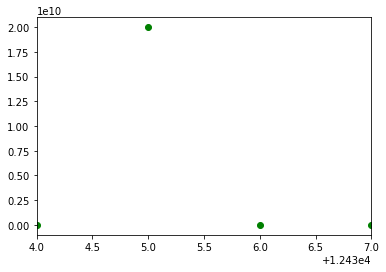

In [69]:
import matplotlib.pyplot as plt
ax = plt.axes()
#ax.plot(time_list[1:], pe_list[1:], color = 'b')
ax.scatter(time_list[1:], ke_list[1:], color = 'g')
#ax.plot(time_list[1:], (np.array(ke_list)+np.array(pe_list))[1:], color = 'r')
ax.set_xlim(xmin=12434,xmax=12437)
plt.show()

In [70]:
#ax = plt.axes()
#ax.plot(time_list, sep, color = 'b')
#plt.show()

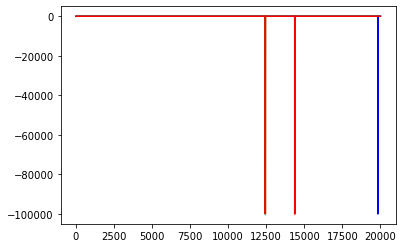

In [71]:
ax = plt.axes()
mom_list = np.array(mom_list)
#print(vt)
ax.plot(time_list, mom_list[:,0], color = 'b')
ax.plot(time_list, mom_list[:,1], color = 'g')
ax.plot(time_list, mom_list[:,2], color = 'r')
plt.show()

In [56]:
round(-2/10)

0

In [34]:
def pbc(x):
    return x - box_length*round(x/box_length)

In [35]:
pbc(-5.2)

4.8

In [36]:
np.round(-5.2/10)

-1.0